## 5.0 Capstone Project Two: All State Purchase Prediction - Modelling the Product Vectors<a id='2_Exploratory_Data_Analysis'></a>
**Submitted By:** Amit Kukreja

## Objectives
1) Predict the 7 product vector's final value based on shopping quotes 1 and 2

2) Test and evaluate the performance of different classifiers on validation set. 

3) Tune hyperparameters to optimize model performance. 

4) Finally, apply the models to the test set to predict the vectors.


## Nomenclature and metrics
Before diving into modeling and performance testing, a quick word on some nomenclature and metrics

### Some Nomenclature
* **‘baseline_model’** : This refers to predicting the final vector choice based on the customer’s selection of the vector at most recent shopping pt, say 2.

* **‘A’**: Customer’s final choice for vector A i.e. the target we are predicting for vector A.

* **‘A_2’**: Customer’s choice for vector A at shopping pt 2.

* **‘A_2_2’**: One-hot encoded feature for vector A,  at shopping pt 2, for class 2.

### Metrics for model evaluation:
The no. of classes for vectors range from 2 to 4. The key objective we have is to predict each customer’s correct class for each of the 7 vectors. As such, the key metrics for model evaluation would be **‘micro accuracy’ / recall** i.e. the overall correct class predictions across all customers.



In [4]:
from pathlib import Path

import requests
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
from pandas_profiling.utils.cache import cache_file
from sklearn import __version__ as sklearn_version
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV, learning_curve
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.pipeline import make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_regression
from sb_utils import save_file
from collections import defaultdict
from collections import Counter
from sklearn.model_selection import train_test_split

from sklearn import preprocessing
import numpy as np

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

from matplotlib import pyplot
from sklearn.metrics import precision_recall_curve, f1_score, auc

from sklearn.metrics import classification_report,confusion_matrix,roc_curve,roc_auc_score
from sklearn.metrics import accuracy_score, log_loss


In [5]:
# Let's import the preprocessed and transformed feature matrix and target vectors

X = pd.read_csv('Transformed_data/pre_processed_training_data_with_quotes_1_2.csv')
y = pd.read_csv('Transformed_data/training_data_target_columns.csv')


X.shape, y.shape        

((77607, 94), (77607, 7))

In [151]:
X.head()

,shopping_pt,car_age_2,age_oldest_2,age_youngest_2,duration_previous_2,cost_1,cost_2,changes_step_2,cost_diff_step_2,state_AR,...,F_1_3,F_2_1,F_2_2,F_2_3,G_1_1,G_1_2,G_1_3,G_2_1,G_2_2,G_2_3
0,1.072089,-0.901461,-0.003780,0.129103,-0.636138,0.464913,0.467906,-0.871664,-0.043014,0,...,0,0,1,0,0,0,0,0,0,0
1,0.571683,0.824464,-1.209101,-1.073002,0.862673,-0.677346,-1.614463,0.903450,-1.338349,0,...,0,0,0,0,0,1,0,0,1,0
2,0.571683,2.032611,-0.061176,-1.359217,-0.636138,-0.303158,-0.352421,-0.871664,-0.043014,0,...,1,0,0,1,0,1,0,0,1,0
3,0.571683,-0.211091,-0.692535,-0.615057,-0.636138,0.287666,0.867553,-0.279959,0.841605,0,...,0,0,1,0,0,0,1,0,1,0
4,1.572496,0.134094,-1.036912,-0.901272,-0.422023,0.090725,-0.352421,0.311745,-0.674885,0,...,0,1,0,0,0,0,1,0,1,0


In [152]:
y.head()

,A,B,C,D,E,F,G
0,1,1,2,2,0,2,0
1,0,0,0,2,0,0,2
2,1,1,1,2,0,2,2
3,1,1,1,1,1,2,2
4,1,1,0,2,1,1,2


In [199]:
# Split the features and target into training and validation sets

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 123, stratify = X['shopping_pt'])

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((62085, 94), (15522, 94), (62085, 7), (15522, 7))

In [32]:
# Create functions based on different classifiers to predict the vectors and plot feature importances

plt.style.use("fivethirtyeight")

def rf_predict_plot(vector, n_estimators=300, min_samples_leaf = 1, min_samples_split = 2, plot = False):
        
    clf = RandomForestClassifier(n_estimators=n_estimators, min_samples_leaf = min_samples_leaf, \
                             min_samples_split = min_samples_split, random_state = 1,n_jobs=-1)

    model_res = clf.fit(X_train.to_numpy(), y_train[vector].astype('int'))
    y_pred = model_res.predict(X_test.to_numpy())
    y_pred_prob = model_res.predict_proba(X_test.to_numpy())
    rf_probs = y_pred_prob[:,1]
    ac = accuracy_score(y_test[vector].astype('int'), y_pred)

    f1 = f1_score(y_test[vector].astype('int'), y_pred, average='weighted')
    
    cm = np.around(confusion_matrix(y_test[vector].astype('int'), y_pred, normalize = 'true'), 4)
    cm1= confusion_matrix(y_test[vector].astype('int'), y_pred)

    print(f"Random Forest Classifier results for Vector {vector}")
    print(f"Parameters: No. of Estimators = {n_estimators},  min_samples_leaf = {min_samples_leaf}, \
    min_samples_split = {min_samples_split}")
    print(f'Accuracy={ac:4.4}, f1-score={f1:4.4}')
    
    if plot == True:
        print("Confusion Matrix - normalized\n", cm)
        print("Confusion Matrix\n", cm1)
    
        cr = classification_report(y_test[vector].astype('int'), y_pred)
        print("\nClassification Report \n", cr)
    
        feature_importance = clf.feature_importances_
        # make importances relative to max importance
        feature_importance = 100.0 * (feature_importance / feature_importance.max())
        sorted_idx = np.argsort(feature_importance)[X_train.shape[1] - 20:]
        pos = np.arange(sorted_idx.shape[0]) + .5
        print(pos.size)
        sorted_idx.size
        plt.style.use('fivethirtyeight')
        plt.figure(figsize=(5,7))
        plt.barh(pos, feature_importance[sorted_idx], align='center')
        plt.yticks(pos, X_train.columns[sorted_idx])
        plt.xlabel('Relative Importance')
        plt.title('Random Forest Model\nFeature Importance for Vector '+vector)
        plt.show()
    
    return ac, f1, rf_probs, y_pred

def xg_predict_plot(vector, n_estimators=200, max_depth = 1, learning_rate = 0.3, colsample_bytree = 1, plot = False):
    
       
    clf = xgb.XGBClassifier(max_depth=max_depth, objective='binary:logistic', n_estimators=n_estimators, \
                       learning_rate = learning_rate, colsample_bytree = colsample_bytree, n_jobs=-1, random_state=1)

    clf.fit(X_train.to_numpy(), y_train[vector].astype('int'))
    y_pred = clf.predict(X_test.to_numpy())
    y_pred_prob = clf.predict_proba(X_test.to_numpy())
    xg_probs = y_pred_prob[:,1]
    ac = accuracy_score(y_test[vector].astype('int'), y_pred)

    f1 = f1_score(y_test[vector].astype('int'), y_pred, average='weighted')
    cm = np.around(confusion_matrix(y_test[vector].astype('int'), y_pred, normalize = 'true'),4)
    cm1 = confusion_matrix(y_test[vector].astype('int'), y_pred)

    print(f"XGBoost Classifier results for Vector {vector}")
    print(f"Parameters: No. of Estimators = {n_estimators},  max_depth = {max_depth}, \
    learning_rate = {learning_rate}, colsample_bytree = {colsample_bytree}")
    print(f'Accuracy={ac:4.4}, f1-score={f1:4.4}')
    
    if plot == True:
        print("Confusion Matrix - normalized\n", cm)
        print("Confusion Matrix\n", cm1)

        cr = classification_report(y_test[vector].astype('int'), y_pred)
        print("\nClassification Report \n", cr)

        feature_importance = clf.feature_importances_
        # make importances relative to max importance
        feature_importance = 100.0 * (feature_importance / feature_importance.max())
        sorted_idx = np.argsort(feature_importance)[X_train.shape[1] - 20:]

        pos = np.arange(sorted_idx.shape[0]) + .5
        print(pos.size)
        sorted_idx.size
        plt.style.use('fivethirtyeight')
        plt.figure(figsize=(5,7))
        plt.barh(pos, feature_importance[sorted_idx], align='center')
        plt.yticks(pos, X_train.columns[sorted_idx])
        plt.xlabel('Relative Importance')
        plt.title('XG Boost Model\nFeature Importance for Vector '+vector)
        plt.show()
        
    return ac, f1, xg_probs, y_pred
    
def gb_predict_plot(vector, n_estimators=100, max_depth = 2, learning_rate = 0.3, max_features = 6, plot = False):
    
    clf = GradientBoostingClassifier(max_depth=max_depth, n_estimators=n_estimators, \
                       learning_rate = learning_rate, max_features = max_features, random_state=1)

    clf.fit(X_train.to_numpy(), y_train[vector].astype('int'))
    y_pred = clf.predict(X_test.to_numpy())
    y_pred_prob = clf.predict_proba(X_test.to_numpy())
    gb_probs = y_pred_prob[:,1]
    ac = accuracy_score(y_test[vector].astype('int'), y_pred)

    f1 = f1_score(y_test[vector].astype('int'), y_pred, average='weighted')
    cm = np.around(confusion_matrix(y_test[vector].astype('int'), y_pred, normalize = 'true'),4)
    cm1 = confusion_matrix(y_test[vector].astype('int'), y_pred)

    print(f"Gradient Boosting Classifier results for Vector {vector}")
    print(f"Parameters: No. of Estimators = {n_estimators},  max_depth = {max_depth}, \
    learning_rate = {learning_rate}, max_features = {max_features}")
    print(f'Accuracy={ac:4.4}, f1-score={f1:4.4}')
    
    if plot == True:
        print("Confusion Matrix - normalized\n", cm)
        print("Confusion Matrix\n", cm1)

        cr = classification_report(y_test[vector].astype('int'), y_pred)
        print("\nClassification Report \n", cr)

        feature_importance = clf.feature_importances_
        # make importances relative to max importance
        feature_importance = 100.0 * (feature_importance / feature_importance.max())
        sorted_idx = np.argsort(feature_importance)[X_train.shape[1] - 20:]

        pos = np.arange(sorted_idx.shape[0]) + .5
        print(pos.size)
        sorted_idx.size
        plt.figure(figsize=(5,7))
        plt.barh(pos, feature_importance[sorted_idx], align='center')
        plt.yticks(pos, X_train.columns[sorted_idx])
        plt.xlabel('Relative Importance')
        plt.title('Gradient Boosting Model\nFeature Importance for Vector '+vector)
        plt.show()
        
    return ac, f1, gb_probs, y_pred

def lr_predict(vector):
    
    logreg = LogisticRegression()
    logreg.fit(X_train.to_numpy(), y_train[vector].astype('int'))
    y_pred = logreg.predict(X_test.to_numpy())
    y_pred_prob = logreg.predict_proba(X_test.to_numpy())
    lr_probs = y_pred_prob[:,1]
    ac = accuracy_score(y_test[vector].astype('int'), y_pred)

    f1 = f1_score(y_test[vector].astype('int'), y_pred, average='weighted')
    cm = np.around(confusion_matrix(y_test[vector].astype('int'), y_pred, normalize = 'true'),4)
    cm1 = confusion_matrix(y_test[vector].astype('int'), y_pred)

    print(f'Logistic Regression for vector {vector}')
    print(f'Accuracy = {ac:4.4}, f1-score = {f1:4.4}\n')
    print("Confusion Matrix - normalized\n", cm)
    print("Confusion Matrix\n", cm1)

    cr = classification_report(y_test[vector].astype('int'), y_pred)
    fpr_2, tpr_2, thresholds_2 = roc_curve(y_test[vector].astype('int'), lr_probs)
    roc_auc2 = auc(fpr_2, tpr_2)
    print("\nClassification Report \n", cr)
    print("\nArea under ROC: \n", roc_auc2)
    
    return ac, f1, lr_probs, y_pred

def knn_predict(vector, n_neighbors=5):
    
    knn = KNeighborsClassifier(n_neighbors=n_neighbors)
    knn.fit(X_train.to_numpy(), y_train[vector].astype('int'))
    y_pred = knn.predict(X_test.to_numpy())
    y_pred_prob = knn.predict_proba(X_test.to_numpy())
    kn_probs = y_pred_prob[:,1]
    ac = accuracy_score(y_test[vector].astype('int'), y_pred)

    f1 = f1_score(y_test[vector].astype('int'), y_pred, average='weighted')
    cm = np.around(confusion_matrix(y_test[vector].astype('int'), y_pred, normalize = 'true'), 4)
    cm1 = confusion_matrix(y_test[vector].astype('int'), y_pred)
    
    print(f'KNN Model for Vector {vector}: No. of Neighbors = {n_neighbors}' )
    print(f'Accuracy = {ac:4.4}, f1-score = {f1:4.4}\n')
    print("Confusion Matrix - normalized\n", cm)
    print("Confusion Matrix\n", cm1)

    cr = classification_report(y_test['B'].astype('int'), y_pred)

    print("\nClassification Report \n", cr)
        
    return ac, f1, kn_probs, y_pred

from sklearn.model_selection import RandomizedSearchCV

def rf_randomsearch(vector, iterations = 10):

    param_grid = {'n_estimators' : np.arange(100,801,100), 'min_samples_split': np.arange(2,6), \
              'min_samples_leaf': np.arange(1,5)}

    rf = RandomForestClassifier(random_state = 1, n_jobs=-1)
    rf_cv = RandomizedSearchCV(rf, param_grid, n_iter = iterations, verbose = 3, cv=4)
    rf_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))

    print(f"Vector {vector} RandomizedSearchCV: Random Forest Model\nBest Score:" + str(rf_cv.best_score_))
    print("Best Parameters: " + str(rf_cv.best_params_))
    
    results = pd.DataFrame(rf_cv.cv_results_['params'])
    results['train_score'] = rf_cv.cv_results_['mean_test_score']
    results['train_rank'] = rf_cv.cv_results_['rank_test_score']
    
    return results

def xgb_randomsearch(vector, iterations = 10):
    
    param_grid = {'learning_rate' : [0.25, 0.3, 0.35, 0.5], 'n_estimators' : np.arange(100,501,100), \
              'colsample_bytree': [0.15,0.25,0.35,0.5], 'max_depth' : [3,4,5]}

    clf = xgb.XGBClassifier(objective='binary:logistic', random_state=1, n_jobs=-1)
    clf_cv = RandomizedSearchCV(clf, param_grid, n_iter = iterations, verbose = 3, cv=4)
    clf_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))

    print(f"Vector {vector} RandomizedSearchCV: XG Boosting Model\nBest Score:" + str(clf_cv.best_score_))
    print("\nBest Parameters: " + str(clf_cv.best_params_))

    results = pd.DataFrame(clf_cv.cv_results_['params'])
    results['train_score'] = clf_cv.cv_results_['mean_test_score']
    results['train_rank'] = clf_cv.cv_results_['rank_test_score']

    return results


In [43]:
# Create functions for:
# 1) Encoding vectors C, D and G to work with XG Boost classifier
# 2) Make a score matrix that shows how well a model does on predicting behaviour of customers who change / don't change vectors

def change_vector_encoding(dataframe, quote_nos):
    change_vectors = ['C', 'D', 'G']
    new_encoding = {1:0, 2:1, 3:2, 4:3}
    for vect in change_vectors:
        dataframe[vect] = dataframe[vect].map(lambda x: new_encoding[x])
        for quote in quote_nos:
            dataframe[vect+'_'+str(quote)] = dataframe[vect+'_'+str(quote)].map(lambda x: new_encoding[x])
            
    return dataframe

def model_score_matrix(vector, benchmark_quote, predictions):
    
    col_2 = vector+'_'+str(benchmark_quote)
    col_3 = vector+'='+str(benchmark_quote)
    vect_compare = y_test_compare[[vector, col_2,col_3]]
    vect_compare[vector+'_Pred'] = predictions
    vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
    score_vect = pd.crosstab(vect_compare[col_3], vect_compare['Pred_Correct'])
    score_vect.columns = ['Pred_incorrect', 'Pred_correct']
    score_vect.index = ['cust_changed_vector', 'cust_maintained_vector']
    score_vect['Pred_accuracy_%'] = np.around((score_vect['Pred_correct'] *100 / \
                                               score_vect[['Pred_incorrect', 'Pred_correct']].sum(axis=1)), 2)
    
    return score_vect

def model_score_by_shopping_pt(vector, benchmark_quote, predictions):
    col_2 = vector+'='+str(benchmark_quote)
    vect_compare = y_test_compare[['shopping_pt', vector, col_2]]
    vect_compare[vector+'_Pred'] = predictions
    vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
    
    score_vect = pd.DataFrame(vect_compare.groupby('shopping_pt')['Pred_Correct', col_2].mean())
    score_vect.columns = [vector+'_model_accuracy_%', vector+'_quote'+str(benchmark_quote)+'_accuracy_%']
    score_vect[vector+'_model_accuracy_%'] = np.around(score_vect[vector+'_model_accuracy_%'] *100, 2)
    score_vect[vector+'_quote'+str(benchmark_quote)+'_accuracy_%'] = \
                                            np.around(score_vect[vector+'_quote'+str(benchmark_quote)+'_accuracy_%'] *100, 2)
    score_vect['model_vs_quote'] = score_vect[vector+'_model_accuracy_%'] - \
                                                            score_vect[vector+'_quote'+str(benchmark_quote)+'_accuracy_%']
    return score_vect

def model_performance_plot(vector, models, quotes, perf_record, type):
    
    plt.style.use('fivethirtyeight')
    model_map = {'no_model': 'Baseline Model\n(Quote '+str(quotes[-1])+')', 'rf': 'Random\nForest', 'gb':'Gradient\nBoost', \
                     'xg': 'XG\nBoost', 'lr': 'Logistic\nRegression'}
    legend_map = {'no_model': 'Baseline Model\n(Quote '+str(quotes[-1])+')', 'rf': 'Random Forest', 'gb':'Gradient Boost', \
                     'xg': 'XG Boost', 'lr': 'Logistic Regression'}
    labels = [model_map[x] for x in models]
    legend = [legend_map[x] for x in models]
    
    if type == 'overall':

        colors = ['blue', 'red', 'orange']
        metrics = ['accuracy_overall', 'accuracy_cust_changed_vector', 'accuracy_cust_maintained_vector']
        subset1 = perf_record[vector][models].iloc[0:3,:]

        fig, ax = plt.subplots(1,2,figsize=(14,6))
        ax[0].plot(subset1.iloc[0,:], marker = 'o', label = subset1.index[0])

        for index in range(1,3):
            ax[1].plot(subset1.iloc[index,:], marker = 'o', color = colors[index], label = subset1.index[index])

        plt.suptitle("Vector "+vector+": Performance of Different Classifiers\n(prediction basis quote "+str(quotes[-2])+" & "\
                                                                                        +str(quotes[-1])+")")
        ax[0].set_ylabel('Accuracy %')
        ax[0].set_xlabel('Classifier')
        ax[0].set_xticklabels(labels)
        
        ax[1].set_ylabel('Accuracy %')
        ax[1].set_xlabel('Classifier')
        ax[1].set_xticklabels(labels)

        ax[0].legend()
        ax[1].legend()

        plt.tight_layout()
        plt.show()
        filename1 = "charts_modelling/vector_"+vector+"_model performance.jpg"
        fig.savefig(filename1)
    
    elif type == 'shopping_pt':
        
        subset2 = perf_record[vector][models].iloc[3:,:]
        subset2.reset_index(inplace=True)
        subset2.drop(columns='index', inplace=True)
        subset2['shopping_pt'] = [x for x in range(quotes[-1]+1,14)]

        fig, ax = plt.subplots(1,1,figsize=(9,6))

        for i, model in enumerate(models):
            ax.plot(subset2['shopping_pt'], subset2[model], marker='o', label=legend[i])

        plt.ylabel('Accuracy %')
        plt.xlabel('Shopping Pt')
        plt.xticks(subset2['shopping_pt'])
        plt.suptitle("Vector "+vector+": Performance of Classifiers by shopping pt")
        plt.title("(prediction basis quote "+str(quotes[0])+" & "+str(quotes[1])+")", fontsize=14)
        ax.legend()
        plt.tight_layout()
        plt.show()
        filename2 = "charts_modelling/vector_"+vector+"_model performance_by_shopping_pt.jpg"
        fig.savefig(filename2)
                                                          

In [155]:
#load the dataframe with history of first 2 quotes

df_train_first2 = pd.read_csv('WIP_data/training_data_with_first2_quotes.csv')
df_train_first2.head()

,customer_ID,shopping_pt,state,A,B,C,D,E,F,G,...,D_1,D_2,E_1,E_2,F_1,F_2,G_1,G_2,cost_1,cost_2
0,10109793,9,CO,1,1,3,3,0,2,1,...,3,3,0,0,2,2,1,1,656,656
1,10002231,8,OH,0,0,1,3,0,0,3,...,1,3,0,0,2,0,3,3,598,557
2,10150024,8,OH,1,1,2,3,0,2,3,...,3,3,0,0,3,3,3,3,617,617
3,10003949,8,FL,1,1,2,2,1,2,3,...,2,2,1,1,2,2,4,3,647,675
4,10103809,10,FL,1,1,1,3,1,1,3,...,3,3,1,1,1,1,4,3,637,617


In [156]:
# Change encoding of vectors C,D and G

df_train_first2 = change_vector_encoding(df_train_first2, [1,2])
df_train_first2.head()

,customer_ID,shopping_pt,state,A,B,C,D,E,F,G,...,D_1,D_2,E_1,E_2,F_1,F_2,G_1,G_2,cost_1,cost_2
0,10109793,9,CO,1,1,2,2,0,2,0,...,2,2,0,0,2,2,0,0,656,656
1,10002231,8,OH,0,0,0,2,0,0,2,...,0,2,0,0,2,0,2,2,598,557
2,10150024,8,OH,1,1,1,2,0,2,2,...,2,2,0,0,3,3,2,2,617,617
3,10003949,8,FL,1,1,1,1,1,2,2,...,1,1,1,1,2,2,3,2,647,675
4,10103809,10,FL,1,1,0,2,1,1,2,...,2,2,1,1,1,1,3,2,637,617


In [250]:
# Save the modified dataframe as a separate csv
save_file(df_train_first2, 'hist_1_2_CDG_changed.csv', 'WIP_data')

Writing file.  "WIP_data\hist_1_2_CDG_changed.csv"


In [243]:
y_test.head()

,A,B,C,D,E,F,G
44,0,0,0,0,0,0,1
40084,1,0,2,2,0,1,0
55264,1,1,1,1,0,2,3
40497,1,0,3,2,0,1,1
2379,0,0,2,2,0,0,1


In [249]:
# Create a Dataframe that captures the Quote 2 vectors for the validation set and shopping point of respective customers
# This would be used to score the model performance for customer who change vectors and customers who don't change vectors
# Shopping point info would be used to find how well the model does for closer and further off shopping points 

y_test_compare = y_test.merge(df_train_first2[['shopping_pt','A_2','B_2','C_2','D_2','E_2','F_2','G_2']], left_index=True, right_index=True)

product_vectors = ['A', 'B','C','D','E','F','G']
for vect in product_vectors:
    y_test_compare[vect+'=2'] = np.where(y_test_compare[vect] == y_test_compare[vect+'_2'], 1,0)

y_test_compare.head()

,A,B,C,D,E,F,G,shopping_pt,A_2,B_2,...,E_2,F_2,G_2,A=2,B=2,C=2,D=2,E=2,F=2,G=2
44,0,0,0,0,0,0,1,7,0,0,...,0,0,1,1,1,1,1,1,1,1
40084,1,0,2,2,0,1,0,7,1,0,...,0,2,0,1,1,1,1,1,0,1
55264,1,1,1,1,0,2,3,6,1,1,...,0,2,3,1,1,1,1,1,1,1
40497,1,0,3,2,0,1,1,5,1,0,...,0,1,1,1,1,1,1,1,1,1
2379,0,0,2,2,0,0,1,7,1,0,...,1,0,1,0,1,1,1,0,1,1


In [10]:
#class to contain performance record of different models for a product vector
class ModelPerformanceRecord:
    
    def initialize(self, vectors, quote_no):
        # initialize the shopping_history object with customer data across all shopping points
        
        index_list = ['accuracy_overall', 'accuracy_cust_changed_vector','accuracy_cust_maintained_vector']
        for quote in range(quote_no+1, 14):
            index_list.append('accuracy_shopping_pt_'+str(quote))
        col_list = ['no_model']
        
        self.record = dict.fromkeys(vectors)
        for key in self.record.keys():
            self.record[key] = pd.DataFrame(index = index_list, columns = col_list)
        
                    
    def update(self, vector, model, metric, value):
        if metric == 'overall':
            self.record[vector].loc["accuracy_overall", model] = value
        elif metric == 'customer_type':
            for i, row in value.iterrows():
                self.record[vector].loc["accuracy_"+i, model] = row["Pred_accuracy_%"]
                if i == 'cust_changed_vector':
                    self.record[vector].loc["accuracy_cust_changed_vector", "no_model"] = 0
                elif i == 'cust_maintained_vector': 
                    self.record[vector].loc["accuracy_cust_maintained_vector", "no_model"] = 100
                    
        elif metric == 'shopping_pt':
            for i, row in value.iterrows():
                self.record[vector].loc["accuracy_shopping_pt_"+str(i), model] = row[0]
                self.record[vector].loc["accuracy_shopping_pt_"+str(i), "no_model"] = row[1]
    
    def compare(self, vector, model):
        self.record[vector][model+"_vs_no_model"] = self.record[vector][model] - self.record[vector]["no_model"]
        
    

In [319]:
product_vectors = ['A', 'B', 'C','D','E','F','G']
perf_q1q2 = ModelPerformanceRecord()
perf_q1q2.initialize(product_vectors,2)
with open('Modelling_data/perf_record_q1_q2.pkl', 'rb') as f:
    perf_models_q1q2 = pickle.load(f)

### Predicting Vector B

Let's use a Random Forest Classifier to predict Vector B.


Random Forest Classifier results for Vector B
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8348, f1-score=0.8344
Confusion Matrix - normalized
 [[0.8749 0.1251]
 [0.2089 0.7911]]
Confusion Matrix
 [[7083 1013]
 [1551 5875]]

Classification Report 
               precision    recall  f1-score   support

           0       0.82      0.87      0.85      8096
           1       0.85      0.79      0.82      7426

    accuracy                           0.83     15522
   macro avg       0.84      0.83      0.83     15522
weighted avg       0.84      0.83      0.83     15522

30


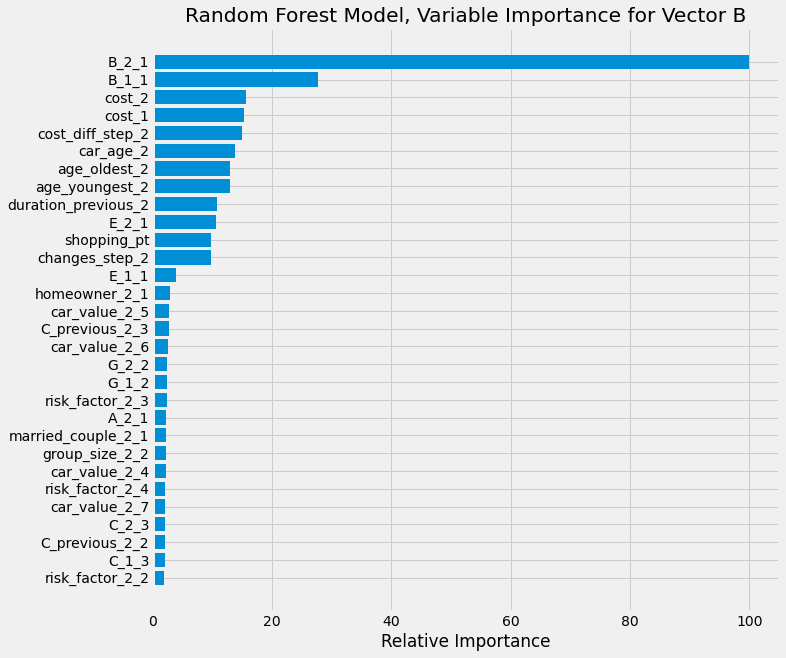

In [28]:
plt.style.use("fivethirtyeight")

vector = 'B'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, plot=True)
    

In [293]:
# LEt's find the accuracy if final Vector B was predicted simply as B_2

vector = 'B'
#df_train_first2 = pd.read_csv('WIP_data/training_data_with_first2_quotes.csv')
test_set = df_train_first2.iloc[y_test.index,:]
x = pd.crosstab(test_set['B'], test_set['B_2'])
same_as_2 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 
acc = np.around(np.sum(same_as_2)/y_test.shape[0], 4)
print(f"Accuracy based on simply predicting vector {vector} = {vector}_2 : {acc}")

Accuracy based on simply predicting vector B = B_2 : 0.8334


In [9]:
x['total'] = x.sum(axis=1)
x['B0_%'] = np.around(x[0]*100 / x['total'], 2)
x['B1_%'] = np.around(x[1]*100 / x['total'], 2)
x

B_2,0,1,total,B0_%,B1_%
B,,,,,
0,7117,979,8096,87.91,12.09
1,1607,5819,7426,21.64,78.36


In [6]:
# Now let's try a Randomized Search CV to find the best Random Forest classifier for vector B

from sklearn.model_selection import RandomizedSearchCV

vector = 'B'
param_grid = {'n_estimators' : np.arange(100,801,100), 'min_samples_split': np.arange(2,6), \
              'min_samples_leaf': np.arange(1,5)}
rf = RandomForestClassifier(random_state = 1, n_jobs=-1)
rf_cv = RandomizedSearchCV(rf, param_grid, n_iter = 20, verbose = 3, cv=4)
rf_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))
print("Random Forest Model\nBest Score:" + str(rf_cv.best_score_))
print("\nBest Parameters: " + str(rf_cv.best_params_)) 

Fitting 4 folds for each of 20 candidates, totalling 80 fits
[CV 1/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=300;, score=0.843 total time=  18.5s
[CV 2/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=300;, score=0.841 total time=  16.3s
[CV 3/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=300;, score=0.833 total time=  16.6s
[CV 4/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=300;, score=0.838 total time=  16.2s
[CV 1/4] END min_samples_leaf=2, min_samples_split=4, n_estimators=300;, score=0.844 total time=  15.4s
[CV 2/4] END min_samples_leaf=2, min_samples_split=4, n_estimators=300;, score=0.840 total time=  15.1s
[CV 3/4] END min_samples_leaf=2, min_samples_split=4, n_estimators=300;, score=0.832 total time=  15.0s
[CV 4/4] END min_samples_leaf=2, min_samples_split=4, n_estimators=300;, score=0.837 total time=  14.9s
[CV 1/4] END min_samples_leaf=3, min_samples_split=3, n_estimators=700;, score=0.844 total time=  33.8s
[CV

[CV 4/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=700;, score=0.837 total time=  32.8s
Random Forest Model
Best Score:0.8389465246535858

Best Parameters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1}


Random Forest Classifier results for Vector B
Parameters: No. of Estimators = 200,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8352, f1-score=0.8348
Confusion Matrix - normalized
 [[0.875  0.125 ]
 [0.2082 0.7918]]
Confusion Matrix
 [[7084 1012]
 [1546 5880]]

Classification Report 
               precision    recall  f1-score   support

           0       0.82      0.88      0.85      8096
           1       0.85      0.79      0.82      7426

    accuracy                           0.84     15522
   macro avg       0.84      0.83      0.83     15522
weighted avg       0.84      0.84      0.83     15522

20


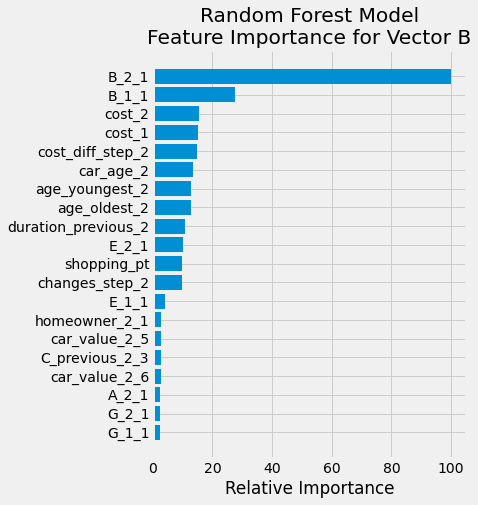

In [200]:

plt.style.use("fivethirtyeight")

vector = 'B'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=200, min_samples_leaf = 1, min_samples_split = 2, plot = True)


In [320]:
vector = 'B'
score_matrix = model_score_matrix(vector, 2, rf_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2512,74,2.86
cust_maintained_vector,46,12890,99.64


In [321]:
score = model_score_by_shopping_pt("B", 2, rf_preds)
score

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,B_model_accuracy_%,B_quote2_accuracy_%,model_vs_quote
shopping_pt,,,
3,86.53,86.53,0.00
4,86.33,86.25,0.08
5,86.19,86.08,0.11
6,84.24,84.28,-0.04
7,83.79,83.52,0.27
8,82.61,82.32,0.29
9,80.60,80.66,-0.06
10,80.02,78.99,1.03
11,80.65,80.35,0.30


In [322]:
perf_q1q2.update('B', 'no_model', 'overall', acc*100)
perf_q1q2.update('B', 'rf', 'overall', round(rf_ac*100,2))
perf_q1q2.update('B', 'rf', 'customer_type', score_matrix)
perf_q1q2.update('B', 'rf', 'shopping_pt', score)
perf_q1q2.compare('B', 'rf')
perf_q1q2.record['B']

,no_model,rf,rf_vs_no_model
accuracy_overall,83.34,83.52,0.18
accuracy_cust_changed_vector,0,2.86,2.86
accuracy_cust_maintained_vector,100,99.64,-0.36
accuracy_shopping_pt_3,86.53,86.53,0.0
accuracy_shopping_pt_4,86.25,86.33,0.08
accuracy_shopping_pt_5,86.08,86.19,0.11
accuracy_shopping_pt_6,84.28,84.24,-0.04
accuracy_shopping_pt_7,83.52,83.79,0.27
accuracy_shopping_pt_8,82.32,82.61,0.29
accuracy_shopping_pt_9,80.66,80.60,-0.06


In [195]:
precision_rf, recall_rf, thresholds_rf = precision_recall_curve(y_test[vector].astype('int'), rf_probs)
thresholds_rf = np.append(thresholds_rf, 1.0)

In [201]:
# As B is a binary vector, let's predict it with a Logistic Regression model

vector = 'B'

lr_ac, lr_f1, lr_probs, lr_preds = lr_predict(vector)


Logistic Regression for vector B
Accuracy = 0.8335, f1-score = 0.833

Confusion Matrix - normalized
 [[0.8786 0.1214]
 [0.2156 0.7844]]
Confusion Matrix
 [[7113  983]
 [1601 5825]]

Classification Report 
               precision    recall  f1-score   support

           0       0.82      0.88      0.85      8096
           1       0.86      0.78      0.82      7426

    accuracy                           0.83     15522
   macro avg       0.84      0.83      0.83     15522
weighted avg       0.84      0.83      0.83     15522


Area under ROC: 
 0.8707366237522474


C:\Users\amite\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [323]:
vector = 'B'
score_matrix = model_score_matrix(vector, 2, lr_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2578,8,0.31
cust_maintained_vector,6,12930,99.95


In [324]:
score = model_score_by_shopping_pt("B", 2, lr_preds)
score

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,B_model_accuracy_%,B_quote2_accuracy_%,model_vs_quote
shopping_pt,,,
3,86.64,86.53,0.11
4,86.25,86.25,0.00
5,85.97,86.08,-0.11
6,84.28,84.28,0.00
7,83.49,83.52,-0.03
8,82.43,82.32,0.11
9,80.60,80.66,-0.06
10,79.30,78.99,0.31
11,80.06,80.35,-0.29


In [325]:
#perf_q1q2.update('B', 'no_model', 'overall', acc*100)
perf_q1q2.update('B', 'lr', 'overall', round(lr_ac*100,2))
perf_q1q2.update('B', 'lr', 'customer_type', score_matrix)
perf_q1q2.update('B', 'lr', 'shopping_pt', score)
perf_q1q2.compare('B', 'lr')
perf_q1q2.record['B']

,no_model,rf,rf_vs_no_model,lr,lr_vs_no_model
accuracy_overall,83.34,83.52,0.18,83.35,0.01
accuracy_cust_changed_vector,0,2.86,2.86,0.31,0.31
accuracy_cust_maintained_vector,100,99.64,-0.36,99.95,-0.05
accuracy_shopping_pt_3,86.53,86.53,0.0,86.64,0.11
accuracy_shopping_pt_4,86.25,86.33,0.08,86.25,0.0
accuracy_shopping_pt_5,86.08,86.19,0.11,85.97,-0.11
accuracy_shopping_pt_6,84.28,84.24,-0.04,84.28,0.0
accuracy_shopping_pt_7,83.52,83.79,0.27,83.49,-0.03
accuracy_shopping_pt_8,82.32,82.61,0.29,82.43,0.11
accuracy_shopping_pt_9,80.66,80.60,-0.06,80.60,-0.06


In [171]:
fpr_2, tpr_2, thresholds_2 = roc_curve(y_test[vector].astype('int'), lr_probs)
precision_lr, recall_lr, thresholds_lr = precision_recall_curve(y_test[vector].astype('int'), lr_probs)
roc_auc2 = auc(fpr_2, tpr_2)
roc_auc2

0.8707366237522474

In [163]:

# Now let's try a Grid Search CV to find the best GradientBoosting classifier

from sklearn.ensemble import GradientBoostingClassifier

param_grid = {'learning_rate' : [0.25, 0.5, 0.75, 1], 'n_estimators' : [20, 50, 100, 150], \
              'max_features': [2,4,6,8], 'max_depth' : [1,2,3]}

gb = GradientBoostingClassifier(random_state = 1)
gb_cv = GridSearchCV(gb, param_grid, cv=5)
gb_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))

print("Gradient Boosting Model\nBest Score:" + str(gb_cv.best_score_))
print("\nBest Parameters: " + str(gb_cv.best_params_))
      

Gradient Boosting Model
Best Score:0.8385600386566804

Best Parameters: {'learning_rate': 0.25, 'max_depth': 3, 'max_features': 6, 'n_estimators': 150}


Gradient Boosting Classifier results for Vector B
Parameters: No. of Estimators = 150,  max_depth = 3,     learning_rate = 0.25, max_features = 6
Accuracy=0.8335, f1-score=0.833
Confusion Matrix - normalized
 [[0.876  0.124 ]
 [0.2129 0.7871]]
Confusion Matrix
 [[7092 1004]
 [1581 5845]]

Classification Report 
               precision    recall  f1-score   support

           0       0.82      0.88      0.85      8096
           1       0.85      0.79      0.82      7426

    accuracy                           0.83     15522
   macro avg       0.84      0.83      0.83     15522
weighted avg       0.83      0.83      0.83     15522

20


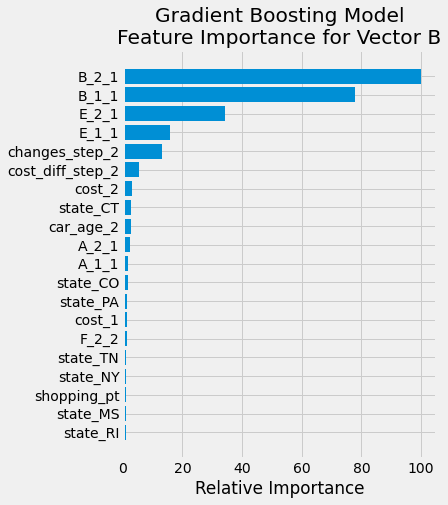

In [202]:
# Now let's train a GB model with above parameters and calculate the different metrics

vector = 'B'
gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 150, learning_rate = 0.25, max_depth = 3, max_features = 6, plot=True)

fpr_3, tpr_3, thresholds_3 = roc_curve(y_test[vector].astype('int'), gb_probs)


In [327]:
vector = 'B'
score_matrix = model_score_matrix(vector, 2, gb_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2552,34,1.31
cust_maintained_vector,33,12903,99.74


In [328]:
score = model_score_by_shopping_pt("B", 2, gb_preds)
score

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,B_model_accuracy_%,B_quote2_accuracy_%,model_vs_quote
shopping_pt,,,
3,86.42,86.53,-0.11
4,86.33,86.25,0.08
5,85.91,86.08,-0.17
6,84.12,84.28,-0.16
7,83.62,83.52,0.10
8,82.28,82.32,-0.04
9,80.60,80.66,-0.06
10,79.51,78.99,0.52
11,80.94,80.35,0.59


In [329]:
#perf_q1q2.update('B', 'no_model', 'overall', acc*100)
perf_q1q2.update('B', 'gb', 'overall', round(gb_ac*100,2))
perf_q1q2.update('B', 'gb', 'customer_type', score_matrix)
perf_q1q2.update('B', 'gb', 'shopping_pt', score)
perf_q1q2.compare('B', 'gb')
perf_q1q2.record['B']

,no_model,rf,rf_vs_no_model,lr,lr_vs_no_model,gb,gb_vs_no_model
accuracy_overall,83.34,83.52,0.18,83.35,0.01,83.35,0.01
accuracy_cust_changed_vector,0,2.86,2.86,0.31,0.31,1.31,1.31
accuracy_cust_maintained_vector,100,99.64,-0.36,99.95,-0.05,99.74,-0.26
accuracy_shopping_pt_3,86.53,86.53,0.0,86.64,0.11,86.42,-0.11
accuracy_shopping_pt_4,86.25,86.33,0.08,86.25,0.0,86.33,0.08
accuracy_shopping_pt_5,86.08,86.19,0.11,85.97,-0.11,85.91,-0.17
accuracy_shopping_pt_6,84.28,84.24,-0.04,84.28,0.0,84.12,-0.16
accuracy_shopping_pt_7,83.52,83.79,0.27,83.49,-0.03,83.62,0.1
accuracy_shopping_pt_8,82.32,82.61,0.29,82.43,0.11,82.28,-0.04
accuracy_shopping_pt_9,80.66,80.60,-0.06,80.60,-0.06,80.60,-0.06


In [32]:
roc_auc3 = auc(fpr_3, tpr_3)
roc_auc3

0.8752734490184578

In [198]:
precision_gb, recall_gb, thresholds_gb = precision_recall_curve(y_test[vector].astype('int'), gb_probs)


In [167]:
# The fourth model that we test is a KNN classifier. Let's use Grid Search to find the best hyperparameter

param_grid = {'n_neighbors': np.arange(1, 50)}
knn = KNeighborsClassifier()

knn_cv = GridSearchCV(knn, param_grid, cv=5)
knn_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))

print("KNN Model\nBest Score:" + str(knn_cv.best_score_))
print("\nBest Parameters: " + str(knn_cv.best_params_))


KNN Model
Best Score:0.7973584601755658

Best Parameters: {'n_neighbors': 49}


In [175]:

vector = 'B'

kn_ac, kn_f1, kn_probs, kn_preds = knn_predict(vector, n_neighbors=49)

fpr_4, tpr_4, thresholds_4 = roc_curve(y_test[vector].astype('int'), kn_probs)


KNN Model for Vector B: No. of Neighbors = 49
Accuracy = 0.7935, f1-score = 0.7926

Confusion Matrix - normalized
 [[0.8455 0.1545]
 [0.2633 0.7367]]
Confusion Matrix
 [[6845 1251]
 [1955 5471]]

Classification Report 
               precision    recall  f1-score   support

           0       0.78      0.85      0.81      8096
           1       0.81      0.74      0.77      7426

    accuracy                           0.79     15522
   macro avg       0.80      0.79      0.79     15522
weighted avg       0.80      0.79      0.79     15522



In [176]:
vector = 'B'
score_matrix = model_score_matrix(vector, 2, kn_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/827015121.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/827015121.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2415,171,6.612529
cust_maintained_vector,791,12145,93.885281


In [200]:
precision_kn, recall_kn, thresholds_kn = precision_recall_curve(y_test[vector].astype('int'), kn_probs)

In [175]:
vector = 'B'

fpr_1, tpr_1, thresholds_1 = roc_curve(y_test[vector].astype('int'), rf_probs)
roc_auc1 = auc(fpr_1, tpr_1)

fpr_2, tpr_2, thresholds_2 = roc_curve(y_test[vector].astype('int'), xg_probs)
roc_auc2 = auc(fpr_2, tpr_2)

fpr_3, tpr_3, thresholds_3 = roc_curve(y_test[vector].astype('int'), lr_probs)
roc_auc3 = auc(fpr_3, tpr_3)

fpr_4, tpr_4, thresholds_4 = roc_curve(y_test[vector].astype('int'), gb_probs)
roc_auc4 = auc(fpr_4, tpr_4)

roc_auc1, roc_auc2, roc_auc3, roc_auc4

(0.8791002798760683,
 0.8822748084127023,
 0.8707366237522474,
 0.8752734490184578)

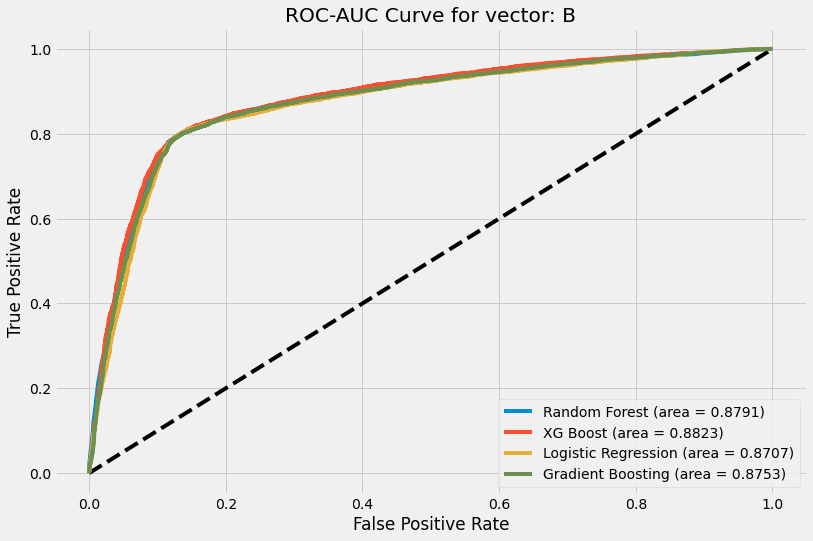

In [176]:

plt.figure(figsize=(12,8))

plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_1, tpr_1, label='Random Forest (area = 0.8791)')
plt.plot(fpr_2, tpr_2, label='XG Boost (area = 0.8823)')
plt.plot(fpr_3, tpr_3, label='Logistic Regression (area = 0.8707)')
plt.plot(fpr_4, tpr_4, label='Gradient Boosting (area = 0.8753)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-AUC Curve for vector: '+vector)
plt.legend()
plt.show()


Best Threshold for Random Forest Model = 0.4925
At Best Threshold, tpr = 0.792, fpr = 0.126


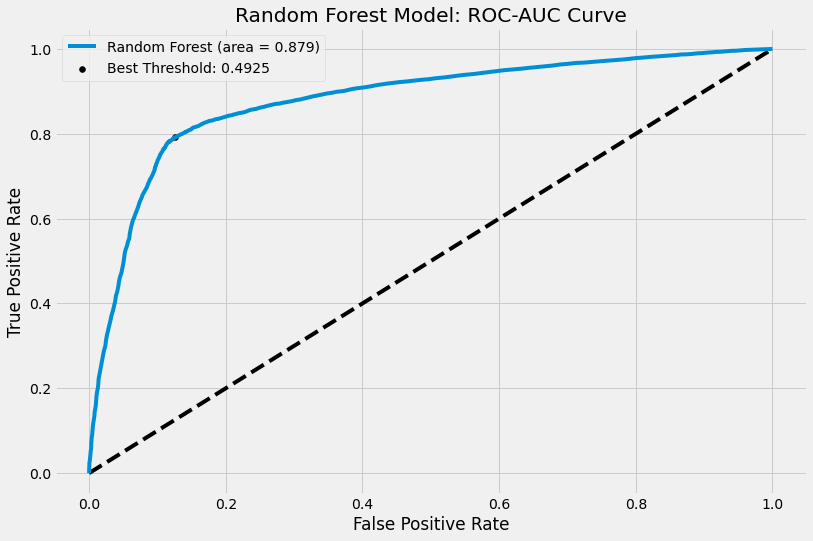

In [237]:
# Let's do thresholding to find the probability threshold that gives the best model performance

plt.figure(figsize=(12,8))

Q_means_rf = np.sqrt(tpr_1*(1-fpr_1))
idx = np.argmax(Q_means_rf)

print(f'Best Threshold for Random Forest Model = {thresholds_1[idx]}')
print(f'At Best Threshold, tpr = {tpr_1[idx]:4.3}, fpr = {fpr_1[idx]:4.3}')

plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_1, tpr_1, label='Random Forest (area = 0.879)')
pyplot.scatter(fpr_1[idx], tpr_1[idx], marker='o', color='black', label='Best Threshold: '+str(thresholds_1[idx]))

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest Model: ROC-AUC Curve')
plt.legend()
plt.show()


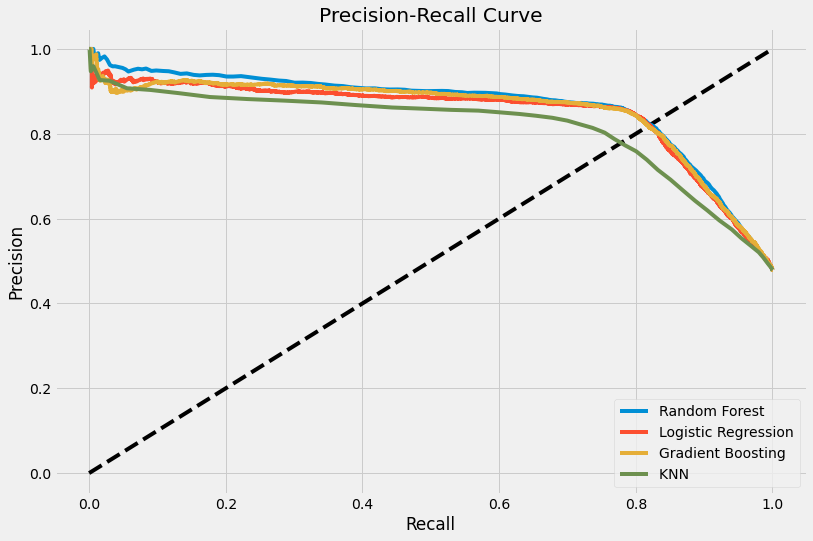

In [230]:
#Let's plot the precision-recall curves for all models

plt.figure(figsize=(12,8))

plt.plot([0, 1], [0, 1], 'k--')
plt.plot(recall_rf, precision_rf, label='Random Forest')
plt.plot(recall_lr, precision_lr, label='Logistic Regression')
plt.plot(recall_gb, precision_gb, label='Gradient Boosting')
plt.plot(recall_kn, precision_kn, label='KNN ')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.show()


Vector B Logistic Regression Model
Best Accuracy score of 0.8348 occurs for threshold = 0.423
Vector B Random Forest Model
Best Accuracy score of 0.8352 occurs for threshold = 0.496
Vector B XG Boost Model
Best Accuracy score of 0.835 occurs for threshold = 0.485
Vector B Gradient Boost Model
Best Accuracy score of 0.8337 occurs for threshold = 0.467


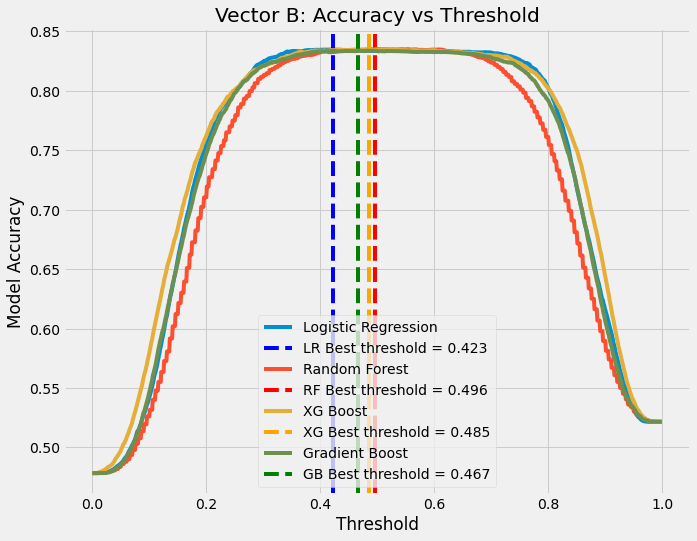

In [204]:
# We are concerned with accuracy of the model i.e. its ability to predict both the 0 and 1 labels correctly
# So we will calculate the accuracy score at different thresholds directly

vector = 'B'
plt.figure(figsize=(10,8))

def to_labels(pos_probs, threshold):
    return (pos_probs >= threshold).astype('int')

thresholds = np.arange(0, 1, 0.001)

# for LR model
ac_score_lr = [accuracy_score(y_test[vector].astype('int'), to_labels(lr_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_lr)
print(f"Vector {vector} Logistic Regression Model\nBest Accuracy score of {ac_score_lr[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_lr, label='Logistic Regression')
plt.axvline(thresholds[idx], color='blue', linestyle="--", label = "LR Best threshold = "+str(np.round(thresholds[idx],4)))

# for random forest
thresholds = np.arange(0, 1, 0.001)
ac_score_rf = [accuracy_score(y_test[vector].astype('int'), to_labels(rf_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_rf)
print(f"Vector {vector} Random Forest Model\nBest Accuracy score of {ac_score_rf[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_rf, label='Random Forest')
plt.axvline(thresholds[idx], color='red', linestyle="--", label = "RF Best threshold = "+str(np.round(thresholds[idx],4)))

# for XG Boost
thresholds = np.arange(0, 1, 0.001)
ac_score_xg = [accuracy_score(y_test[vector].astype('int'), to_labels(xg_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_xg)
print(f"Vector {vector} XG Boost Model\nBest Accuracy score of {ac_score_xg[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_xg, label='XG Boost')
plt.axvline(thresholds[idx], color='orange', linestyle="--", label = "XG Best threshold = "+str(np.round(thresholds[idx],4)))

# for Gradient Boost
thresholds = np.arange(0, 1, 0.001)
ac_score_gb = [accuracy_score(y_test[vector].astype('int'), to_labels(gb_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_gb)
print(f"Vector {vector} Gradient Boost Model\nBest Accuracy score of {ac_score_gb[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_gb, label='Gradient Boost')
plt.axvline(thresholds[idx], color='green', linestyle="--", label = "GB Best threshold = "+str(np.round(thresholds[idx],4)))

plt.legend()
plt.xlabel('Threshold')
plt.ylabel('Model Accuracy')
plt.title('Vector B: Accuracy vs Threshold')

plt.show()

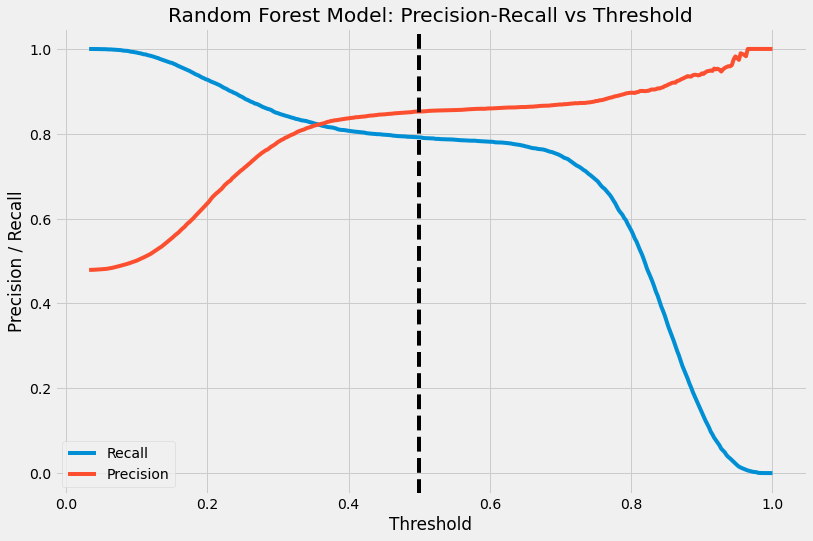

In [216]:
plt.figure(figsize=(12,8))

#plt.plot([0, 1], [0, 1], 'k--')
plt.plot(thresholds_rf, recall_rf, label='Recall')
plt.plot(thresholds_rf, precision_rf, label='Precision')
plt.xlabel('Threshold')
plt.ylabel('Precision / Recall')
plt.title('Random Forest Model: Precision-Recall vs Threshold')
plt.axvline(0.5, color='black', linestyle="--")
plt.legend()
plt.show()


XGBoost Classifier results for Vector B

Parameters: No. of Estimators = 300,  max_depth = 3, learning_rate = 0.35, colsample_bytree = 1

Accuracy=0.834
f1-score=0.833
Confusion Matrix
 [[0.871 0.129]
 [0.207 0.793]]

Classification Report 
               precision    recall  f1-score   support

           0       0.82      0.87      0.85      8096
           1       0.85      0.79      0.82      7426

    accuracy                           0.83     15522
   macro avg       0.84      0.83      0.83     15522
weighted avg       0.83      0.83      0.83     15522

30


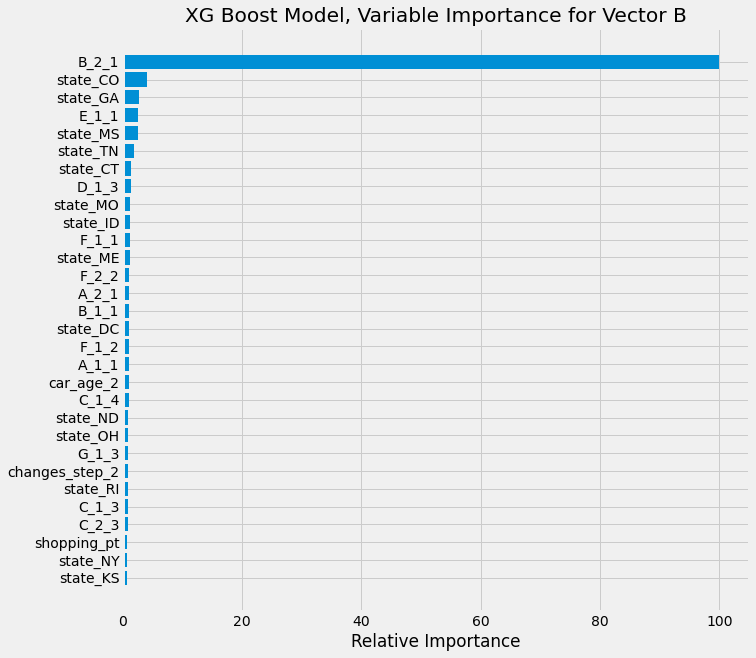

In [61]:

# model B with XGBoost classifier 

vector = 'B'

xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, max_depth=3, n_estimators=300, \
                       learning_rate = 0.35, colsample_bytree = 1, plot = True)

In [8]:
# Let's use RandomizedSearchCV to find the best XGB classifier Hyperparamters for vector B 

import xgboost as xgb

from sklearn.model_selection import RandomizedSearchCV

vector = 'B'
param_grid = {'learning_rate' : [0.25, 0.3, 0.35, 0.5], 'n_estimators' : np.arange(100,501,100), \
              'colsample_bytree': [0.15,0.25,0.35,0.5], 'max_depth' : [3,4,5]}
clf = xgb.XGBClassifier(objective='binary:logistic', random_state=1, n_jobs=-1)
clf_cv = RandomizedSearchCV(clf, param_grid, n_iter = 60, verbose = 3, cv=4)
clf_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))
print(f"Vector {vector} RandomizedSearchCV: XG Boosting Model\nBest Score:" + str(clf_cv.best_score_))
print("\nBest Parameters: " + str(clf_cv.best_params_))

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=4, n_estimators=500;, score=0.836 total time=  10.9s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=4, n_estimators=500;, score=0.832 total time=  11.8s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=4, n_estimators=500;, score=0.822 total time=  11.9s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=4, n_estimators=500;, score=0.830 total time=  12.3s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=5, n_estimators=300;, score=0.838 total time=  10.1s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=5, n_estimators=300;, score=0.834 total time=  10.2s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=5, n_estimators=300;, score=0.827 total time=  10.1s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=5, n_estimators=300;, score=0.836 total tim

[CV 2/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=3, n_estimators=200;, score=0.840 total time=   2.9s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=3, n_estimators=200;, score=0.831 total time=   2.9s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=3, n_estimators=200;, score=0.836 total time=   2.9s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.5, max_depth=4, n_estimators=200;, score=0.839 total time=   3.4s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.5, max_depth=4, n_estimators=200;, score=0.836 total time=   3.4s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.5, max_depth=4, n_estimators=200;, score=0.829 total time=   3.4s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.5, max_depth=4, n_estimators=200;, score=0.835 total time=   3.4s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=3, n_estimators=200;, score=0.845 total time=   2.5s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.

[CV 4/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=400;, score=0.836 total time=   6.4s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=3, n_estimators=400;, score=0.844 total time=   7.8s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=3, n_estimators=400;, score=0.841 total time=   7.9s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=3, n_estimators=400;, score=0.831 total time=   7.8s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=3, n_estimators=400;, score=0.838 total time=   7.8s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=3, n_estimators=500;, score=0.844 total time=   6.0s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=3, n_estimators=500;, score=0.841 total time=   5.9s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=3, n_estimators=500;, score=0.830 total time=   6.1s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.

[CV 2/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=3, n_estimators=300;, score=0.840 total time=   3.6s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=3, n_estimators=300;, score=0.832 total time=   3.6s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=3, n_estimators=300;, score=0.837 total time=   3.6s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=500;, score=0.839 total time=  11.9s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=500;, score=0.837 total time=  12.5s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=500;, score=0.827 total time=  13.0s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=500;, score=0.836 total time=  13.9s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=3, n_estimators=300;, score=0.844 total time=   6.1s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.25, max_d

In [14]:
results = pd.DataFrame(clf_cv.cv_results_['params'])
results['train_score'] = clf_cv.cv_results_['mean_test_score']
results['train_rank'] = clf_cv.cv_results_['rank_test_score']


In [28]:
# model B with XGBoost classifier

# Parameters: No. of Estimators = 100,  max_depth = 3, learning_rate = 0.25, colsample_bytree = 0.5 (0.834, 0.833)
# Parameters: No. of Estimators = 400,  max_depth = 3, learning_rate = 0.3, colsample_bytree = 0.15 (0.834, 0.834)

import xgboost as xgb

vector = 'B'

print(f"XGBoost Classifier results for Vector {vector}\n")
#param_grid
for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    max_depth = row['max_depth']
    learning_rate = row['learning_rate']
    colsample_bytree = row['colsample_bytree']
        
    clf = xgb.XGBClassifier(max_depth=int(max_depth), objective='binary:logistic', n_estimators=int(n_estimators), \
                       learning_rate = learning_rate, colsample_bytree = colsample_bytree, n_jobs=-1, random_state=1)

    clf.fit(X_train.to_numpy(), y_train[vector].astype('int'))
    y_pred = clf.predict(X_test.to_numpy())
    y_pred_prob = clf.predict_proba(X_test.to_numpy())
    rf_probs = y_pred_prob[:,1]
    ac = accuracy_score(y_test[vector].astype('int'), y_pred)

    f1 = f1_score(y_test[vector].astype('int'), y_pred, average='weighted')
    cm = np.around(confusion_matrix(y_test[vector].astype('int'), y_pred, normalize = 'true'),3)
    cm1 = confusion_matrix(y_test[vector].astype('int'), y_pred)

    results.loc[i, 'test_score'] = ac
    results.loc[i, 'f1_score'] = f1
    
    print(f"Parameters: No. of Estimators = {n_estimators},  max_depth = {max_depth}, \
    learning_rate = {learning_rate}, colsample_bytree = {colsample_bytree}\n")

    print('Accuracy=%.3f' % (ac))
    print('f1-score=%.3f' % (f1))

results = pd.DataFrame(clf_cv.cv_results_['params'])
results['train_score'] = clf_cv.cv_results_['mean_test_score']
results['train_rank'] = clf_cv.cv_results_['rank_test_score']
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
results

XGBoost Classifier results for Vector B

Parameters: No. of Estimators = 500.0,  max_depth = 4.0,     learning_rate = 0.5, colsample_bytree = 0.15

Accuracy=0.829
f1-score=0.829
Parameters: No. of Estimators = 300.0,  max_depth = 5.0,     learning_rate = 0.35, colsample_bytree = 0.25

Accuracy=0.830
f1-score=0.830
Parameters: No. of Estimators = 100.0,  max_depth = 5.0,     learning_rate = 0.5, colsample_bytree = 0.5

Accuracy=0.833
f1-score=0.832
Parameters: No. of Estimators = 200.0,  max_depth = 4.0,     learning_rate = 0.3, colsample_bytree = 0.25

Accuracy=0.834
f1-score=0.833
Parameters: No. of Estimators = 200.0,  max_depth = 3.0,     learning_rate = 0.3, colsample_bytree = 0.25

Accuracy=0.834
f1-score=0.834
Parameters: No. of Estimators = 400.0,  max_depth = 3.0,     learning_rate = 0.35, colsample_bytree = 0.15

Accuracy=0.834
f1-score=0.834
Parameters: No. of Estimators = 500.0,  max_depth = 4.0,     learning_rate = 0.3, colsample_bytree = 0.15

Accuracy=0.833
f1-score=0.833

In [33]:
results = pd.DataFrame(clf_cv.cv_results_['params'])
results['train_score'] = clf_cv.cv_results_['mean_test_score']
results['train_rank'] = clf_cv.cv_results_['rank_test_score']
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
results

,n_estimators,max_depth,learning_rate,colsample_bytree,train_score,train_rank,test_score,test_rank,tr_te_avg_score,overall_rank
0,500,4,0.50,0.15,0.830055,58,0.829210,39.0,0.829633,58.0
1,300,5,0.35,0.25,0.833518,50,0.830499,34.0,0.832009,52.0
2,100,5,0.50,0.50,0.835178,40,0.832754,25.0,0.833966,40.0
3,200,4,0.30,0.25,0.837851,22,0.833784,16.0,0.835818,24.0
4,200,3,0.30,0.25,0.838512,9,0.833978,13.0,0.836245,16.0
5,400,3,0.35,0.15,0.837658,27,0.834493,6.0,0.836075,19.0
6,500,4,0.30,0.15,0.835757,38,0.833333,22.0,0.834545,38.0
7,100,5,0.25,0.50,0.838447,11,0.834622,5.0,0.836535,8.0
8,300,4,0.25,0.25,0.837722,25,0.834364,8.0,0.836043,21.0
9,100,5,0.50,0.25,0.835145,41,0.831529,31.0,0.833337,45.0


In [34]:
datapath = "Modelling_data"

save_file(results, 'xgboost_results_vectorB.csv', datapath)


Directory Modelling_data was created.
Writing file.  "Modelling_data\xgboost_results_vectorB.csv"


XGBoost Classifier results for Vector B
Parameters: No. of Estimators = 100,  max_depth = 4,     learning_rate = 0.3, colsample_bytree = 0.35
Accuracy=0.8348, f1-score=0.8344
Confusion Matrix - normalized
 [[0.8745 0.1255]
 [0.2085 0.7915]]
Confusion Matrix
 [[7080 1016]
 [1548 5878]]

Classification Report 
               precision    recall  f1-score   support

           0       0.82      0.87      0.85      8096
           1       0.85      0.79      0.82      7426

    accuracy                           0.83     15522
   macro avg       0.84      0.83      0.83     15522
weighted avg       0.84      0.83      0.83     15522

20


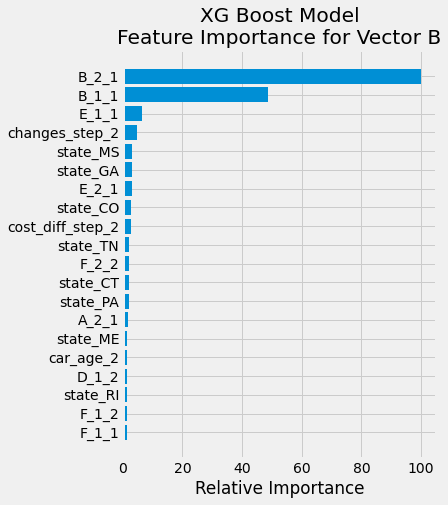

In [203]:
# model B with XGBoost classifier BEST Hyperparameters (Iteration 44)

vector = 'B'

xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, max_depth=4, n_estimators=100, \
                       learning_rate = 0.3, colsample_bytree = 0.35, plot = True)

In [331]:
vector = 'B'
score_matrix = model_score_matrix(vector, 2, xg_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2502,84,3.25
cust_maintained_vector,62,12874,99.52


In [332]:
score = model_score_by_shopping_pt("B", 2, xg_preds)
score

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,B_model_accuracy_%,B_quote2_accuracy_%,model_vs_quote
shopping_pt,,,
3,86.31,86.53,-0.22
4,86.41,86.25,0.16
5,86.08,86.08,0.00
6,84.32,84.28,0.04
7,83.66,83.52,0.14
8,82.64,82.32,0.32
9,80.45,80.66,-0.21
10,80.02,78.99,1.03
11,80.94,80.35,0.59


In [333]:
#perf_q1q2.update('B', 'no_model', 'overall', acc*100)
perf_q1q2.update('B', 'xg', 'overall', round(xg_ac*100,2))
perf_q1q2.update('B', 'xg', 'customer_type', score_matrix)
perf_q1q2.update('B', 'xg', 'shopping_pt', score)
perf_q1q2.compare('B', 'xg')
perf_q1q2.record['B']

,no_model,rf,rf_vs_no_model,lr,lr_vs_no_model,gb,gb_vs_no_model,xg,xg_vs_no_model
accuracy_overall,83.34,83.52,0.18,83.35,0.01,83.35,0.01,83.48,0.14
accuracy_cust_changed_vector,0,2.86,2.86,0.31,0.31,1.31,1.31,3.25,3.25
accuracy_cust_maintained_vector,100,99.64,-0.36,99.95,-0.05,99.74,-0.26,99.52,-0.48
accuracy_shopping_pt_3,86.53,86.53,0.0,86.64,0.11,86.42,-0.11,86.31,-0.22
accuracy_shopping_pt_4,86.25,86.33,0.08,86.25,0.0,86.33,0.08,86.41,0.16
accuracy_shopping_pt_5,86.08,86.19,0.11,85.97,-0.11,85.91,-0.17,86.08,0.0
accuracy_shopping_pt_6,84.28,84.24,-0.04,84.28,0.0,84.12,-0.16,84.32,0.04
accuracy_shopping_pt_7,83.52,83.79,0.27,83.49,-0.03,83.62,0.1,83.66,0.14
accuracy_shopping_pt_8,82.32,82.61,0.29,82.43,0.11,82.28,-0.04,82.64,0.32
accuracy_shopping_pt_9,80.66,80.60,-0.06,80.60,-0.06,80.60,-0.06,80.45,-0.21


C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(labels)
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(labels)


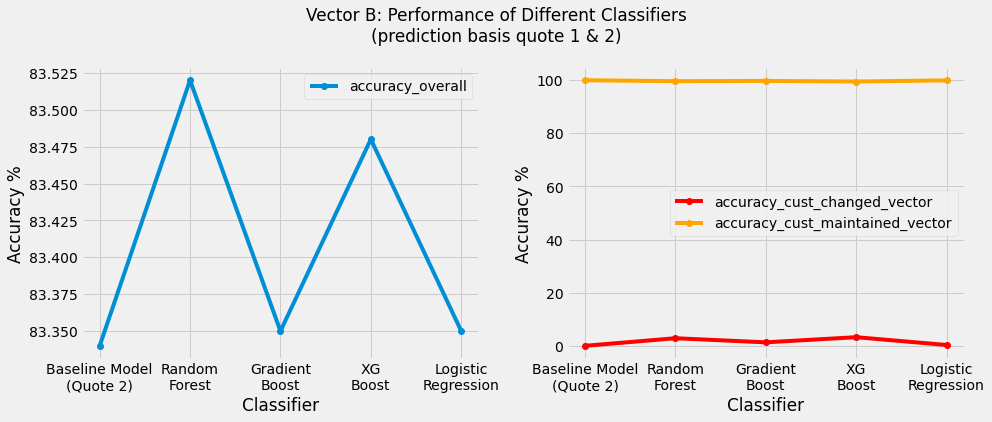

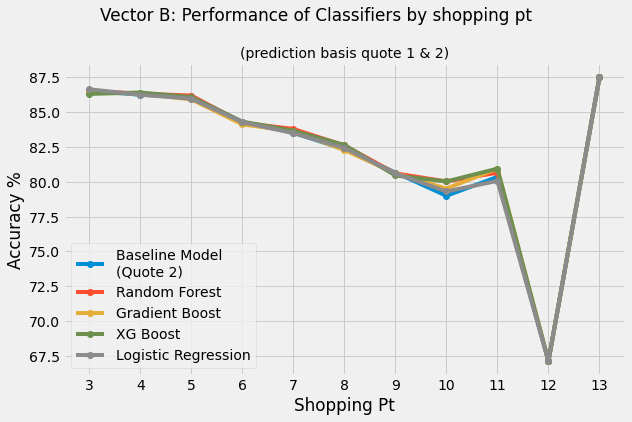

In [116]:
vector = 'B'
models = ['no_model', 'rf', 'gb', 'xg', 'lr']
#models = ['no_model', 'rf', 'gb', 'xg']
quotes = [1,2]
model_performance_plot(vector, models, quotes, perf_models_q1q2,"overall")
model_performance_plot(vector, models, quotes, perf_models_q1q2,"shopping_pt")

## Quote 1 & 2: Predict Vector G

Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.758, f1-score=0.7577
Confusion Matrix - normalized
 [[0.7171 0.2315 0.0376 0.0138]
 [0.1178 0.8176 0.0423 0.0223]
 [0.0538 0.1362 0.7665 0.0435]
 [0.0643 0.1791 0.2116 0.545 ]]
Confusion Matrix
 [[2286  738  120   44]
 [ 718 4985  258  136]
 [ 266  674 3792  215]
 [  83  231  273  703]]

Classification Report 
               precision    recall  f1-score   support

           0       0.68      0.72      0.70      3188
           1       0.75      0.82      0.78      6097
           2       0.85      0.77      0.81      4947
           3       0.64      0.54      0.59      1290

    accuracy                           0.76     15522
   macro avg       0.73      0.71      0.72     15522
weighted avg       0.76      0.76      0.76     15522

30


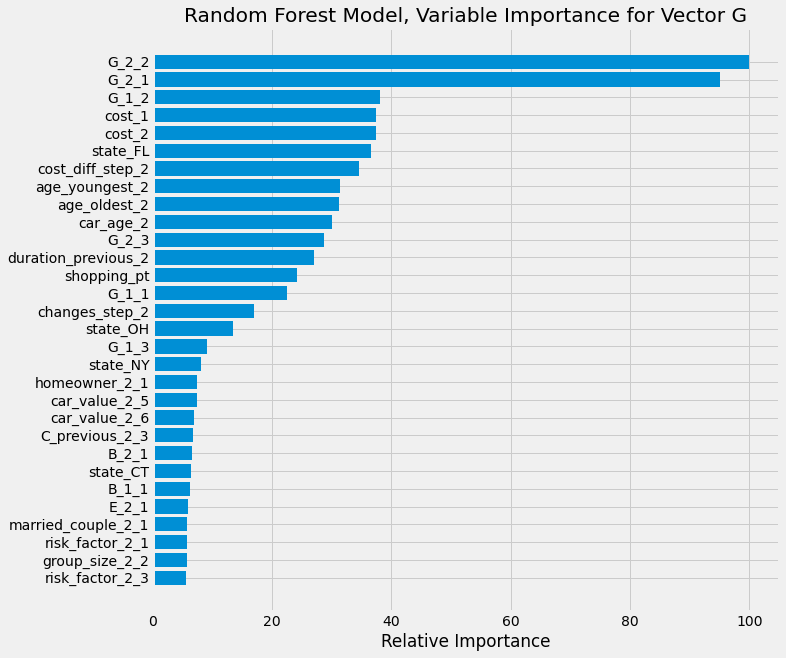

In [337]:
# Let's run A Random Forest model for vector G

vector = 'G'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, plot=True)


In [334]:
#test_set = df_train_first2.iloc[y_test.index,:]

vector = 'G'

x = pd.crosstab(test_set['G'], test_set['G_2'])

same_as_2 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 

acc = np.around(np.sum(same_as_2)/y_test.shape[0],4)

print(f"Accuracy based on simply predicting vector {vector} = {vector}_2 : {(np.sum(same_as_2)/y_test.shape[0]): 4.4}")

Accuracy based on simply predicting vector G = G_2 :  0.7405


In [311]:
x['total'] = x.sum(axis=1)
x['G1_%'] = np.around(x[1]*100 / x['total'], 2)
x['G2_%'] = np.around(x[2]*100 / x['total'], 2)
x['G3_%'] = np.around(x[3]*100 / x['total'], 2)
x['G4_%'] = np.around(x[4]*100 / x['total'], 2)

x

G_2,1,2,3,4,total,G1_%,G2_%,G3_%,G4_%
G,,,,,,,,,
1,2239,711,115,123,3188,70.23,22.30,3.61,3.86
2,717,4873,230,277,6097,11.76,79.92,3.77,4.54
3,271,778,3587,311,4947,5.48,15.73,72.51,6.29
4,78,200,217,795,1290,6.05,15.50,16.82,61.63


In [10]:
# Let's use Bayesian Optimization to find best parameters for Random Forest model for vector G
from bayes_opt import BayesianOptimization

vector = 'G'

def rf_eval(estimators, min_leaf, min_split):
    
    rf = RandomForestClassifier(n_estimators = round(estimators), min_samples_leaf = round(min_leaf), \
                                    min_samples_split = round(min_split), random_state = 1, n_jobs=-1)
    
    cv_result = cross_validate(rf, X_train.to_numpy(), y_train[vector].astype('int'), cv= 4)
    return np.mean(cv_result['test_score'])

rf_bo = BayesianOptimization(rf_eval, {'estimators': (20, 1000), 'min_leaf': (1, 5), 'min_split': (2, 6)})
rf_bo.maximize(n_iter=13, init_points=2)

|   iter    |  target   | estima... | min_leaf  | min_split |
-------------------------------------------------------------
|  1        |  0.7637   |  980.2    |  4.41     |  2.007    |
|  2        |  0.7635   |  813.3    |  4.254    |  5.076    |
|  3        |  0.7637   |  981.2    |  4.008    |  2.714    |
|  4        |  0.7637   |  969.2    |  4.237    |  2.307    |
|  5        |  0.7636   |  949.4    |  4.294    |  2.335    |
|  6        |  0.7628   |  49.93    |  3.636    |  4.438    |
|  7        |  0.7635   |  640.7    |  3.804    |  2.048    |
|  8        |  0.7639   |  540.6    |  1.258    |  5.379    |
|  9        |  0.7638   |  496.5    |  4.248    |  5.125    |
|  10       |  0.7636   |  578.9    |  4.287    |  3.231    |
|  11       |  0.7641   |  417.9    |  2.296    |  2.558    |
|  12       |  0.7639   |  379.6    |  1.503    |  4.101    |
|  13       |  0.7644   |  447.3    |  1.129    |  5.617    |
|  14       |  0.7635   |  298.6    |  2.63     |  5.993    |
|  15   

Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 450,  min_samples_leaf = 1,     min_samples_split = 6
Accuracy=0.7568, f1-score=0.7565
Confusion Matrix - normalized
 [[0.7142 0.2343 0.037  0.0144]
 [0.1173 0.8181 0.0418 0.0228]
 [0.0534 0.1381 0.7641 0.0445]
 [0.0667 0.1798 0.2093 0.5442]]
Confusion Matrix
 [[2277  747  118   46]
 [ 715 4988  255  139]
 [ 264  683 3780  220]
 [  86  232  270  702]]

Classification Report 
               precision    recall  f1-score   support

           0       0.68      0.71      0.70      3188
           1       0.75      0.82      0.78      6097
           2       0.85      0.76      0.81      4947
           3       0.63      0.54      0.59      1290

    accuracy                           0.76     15522
   macro avg       0.73      0.71      0.72     15522
weighted avg       0.76      0.76      0.76     15522

30


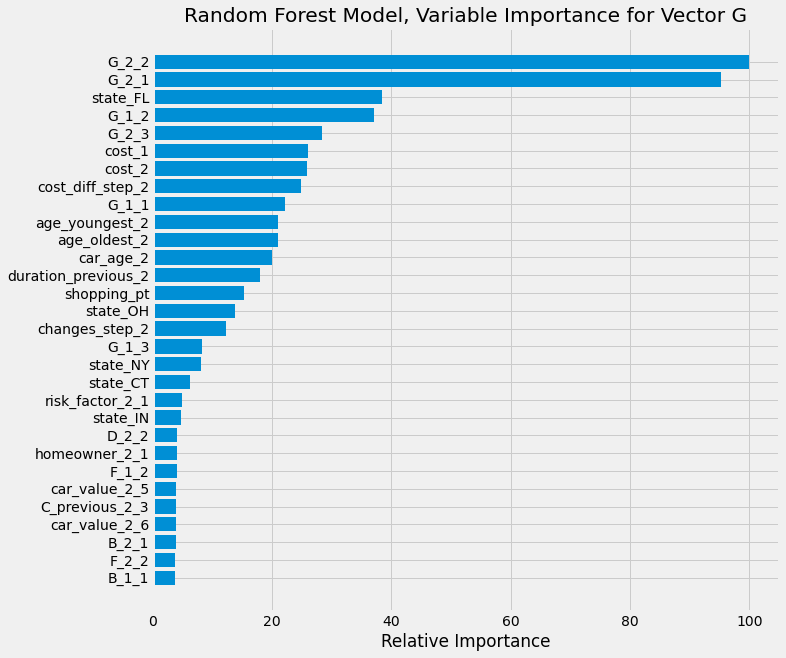

In [177]:
# Run the model with Best Parameters (iteration 13): n_estimators=450, min_samples_leaf = 1, min_samples_split = 6

vector = 'G'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=450, min_samples_leaf = 1, min_samples_split = 6, plot=True)



Random Forest Classifier results for Vector G

Parameters: No. of Estimators = 420,  min_samples_split = 3, min_samples_leaf = 2

Accuracy=0.757
f1-score=0.757
Confusion Matrix
 [[0.715 0.234 0.037 0.014]
 [0.117 0.819 0.041 0.022]
 [0.053 0.138 0.765 0.044]
 [0.067 0.184 0.209 0.54 ]]

Classification Report 
               precision    recall  f1-score   support

           1       0.68      0.72      0.70      3188
           2       0.75      0.82      0.78      6097
           3       0.86      0.76      0.81      4947
           4       0.63      0.54      0.58      1290

    accuracy                           0.76     15522
   macro avg       0.73      0.71      0.72     15522
weighted avg       0.76      0.76      0.76     15522

30


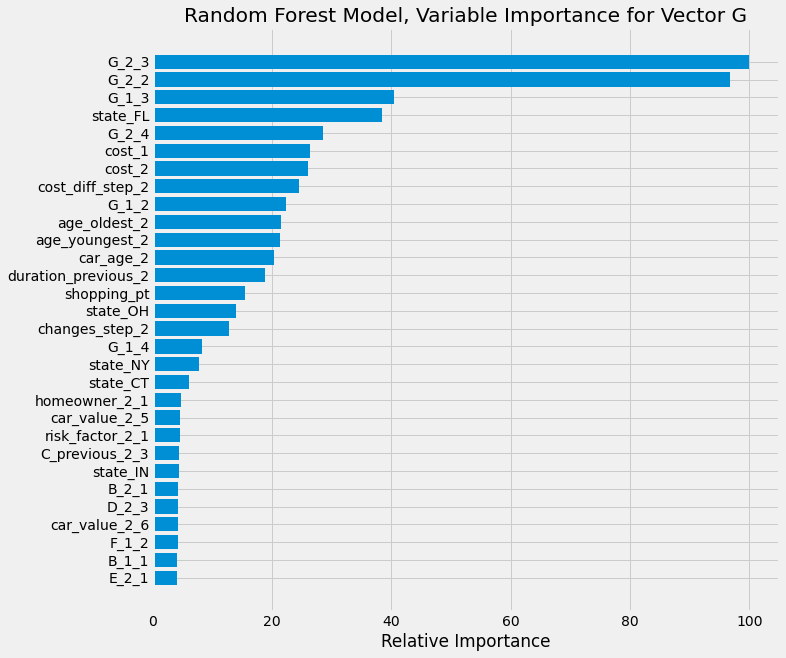

In [13]:
# Run the model with 2nd Best Parameters (iteration 11): n_estimators=420, min_samples_leaf = 2, min_samples_split = 3

vector = 'G'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=420, min_samples_leaf = 2, min_samples_split = 3, plot=True)


Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 550,  min_samples_leaf = 1,     min_samples_split = 5
Accuracy=0.7583, f1-score=0.7579
Confusion Matrix - normalized
 [[0.7164 0.2324 0.0367 0.0144]
 [0.1169 0.8197 0.0412 0.0221]
 [0.0532 0.1366 0.7651 0.0451]
 [0.0682 0.1775 0.2093 0.545 ]]
Confusion Matrix
 [[2284  741  117   46]
 [ 713 4998  251  135]
 [ 263  676 3785  223]
 [  88  229  270  703]]

Classification Report 
               precision    recall  f1-score   support

           0       0.68      0.72      0.70      3188
           1       0.75      0.82      0.78      6097
           2       0.86      0.77      0.81      4947
           3       0.64      0.54      0.59      1290

    accuracy                           0.76     15522
   macro avg       0.73      0.71      0.72     15522
weighted avg       0.76      0.76      0.76     15522

30


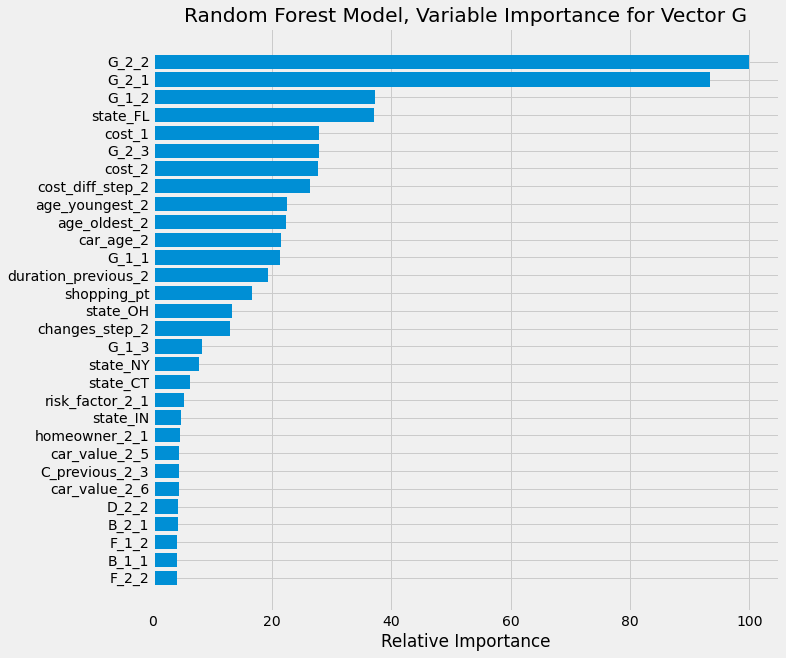

In [335]:
# Run the model with 3rd Best Parameters (iteration 8): n_estimators=550, min_samples_leaf = 1, min_samples_split = 5

vector = 'G'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=550, min_samples_leaf = 1, min_samples_split = 5, plot=True)



Using the hyperparameters from Bayesian Optimization, the best score (accuracy = 0.758, f1_score = 0.758) is still only as good as the base model with 300 estimators. So we shall keep the base model as it has lesser estimators and hence would use less computational resources. 

Now let's build a Gradient Boosting Classifier for Vector G.

In [338]:
vector = 'G'
score_matrix = model_score_matrix(vector, 2, rf_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,3584,444,11.02
cust_maintained_vector,172,11322,98.50


In [339]:
score = model_score_by_shopping_pt("G", 2, rf_preds)
score

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,G_model_accuracy_%,G_quote2_accuracy_%,model_vs_quote
shopping_pt,,,
3,78.00,76.88,1.12
4,78.83,78.28,0.55
5,77.43,76.59,0.84
6,76.48,75.60,0.88
7,74.34,72.23,2.11
8,75.51,72.97,2.54
9,74.66,72.89,1.77
10,71.16,67.66,3.50
11,78.30,74.49,3.81


In [340]:
perf_q1q2.update('G', 'no_model', 'overall', acc*100)
perf_q1q2.update('G', 'rf', 'overall', round(rf_ac*100,2))
perf_q1q2.update('G', 'rf', 'customer_type', score_matrix)
perf_q1q2.update('G', 'rf', 'shopping_pt', score)
perf_q1q2.compare('G', 'rf')
perf_q1q2.record['G']

,no_model,rf,rf_vs_no_model
accuracy_overall,74.05,75.80,1.75
accuracy_cust_changed_vector,0,11.02,11.02
accuracy_cust_maintained_vector,100,98.50,-1.5
accuracy_shopping_pt_3,76.88,78.00,1.12
accuracy_shopping_pt_4,78.28,78.83,0.55
accuracy_shopping_pt_5,76.59,77.43,0.84
accuracy_shopping_pt_6,75.6,76.48,0.88
accuracy_shopping_pt_7,72.23,74.34,2.11
accuracy_shopping_pt_8,72.97,75.51,2.54
accuracy_shopping_pt_9,72.89,74.66,1.77


Gradient Boosting Classifier results for Vector G

Accuracy=0.753
f1-score=0.752
Confusion Matrix
 [[0.705 0.24  0.039 0.017]
 [0.117 0.816 0.045 0.022]
 [0.054 0.136 0.766 0.043]
 [0.071 0.186 0.216 0.526]]

Classification Report 
               precision    recall  f1-score   support

           1       0.68      0.70      0.69      3188
           2       0.75      0.82      0.78      6097
           3       0.85      0.77      0.81      4947
           4       0.63      0.53      0.57      1290

    accuracy                           0.75     15522
   macro avg       0.73      0.70      0.71     15522
weighted avg       0.76      0.75      0.75     15522



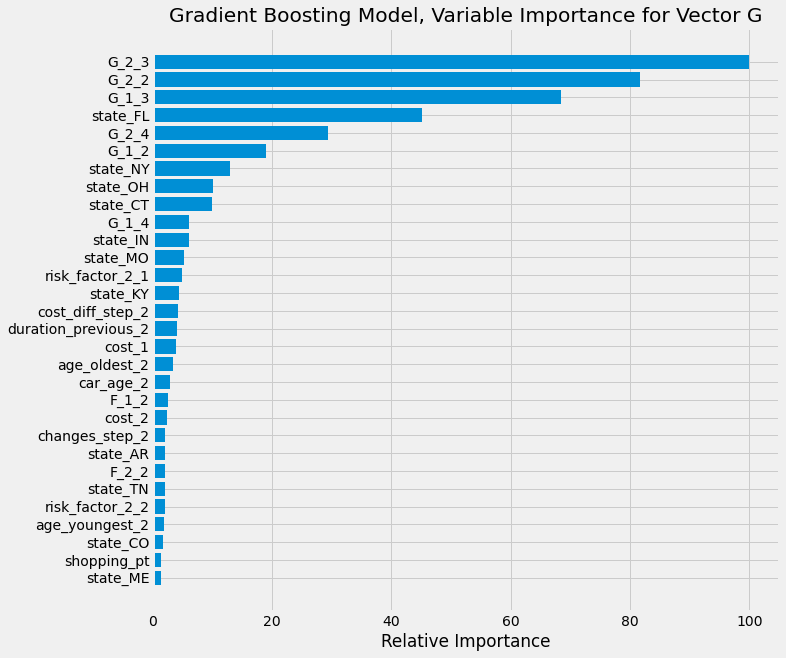

In [319]:
# model G with GradientBoosting classifier

vector = 'G'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 150, learning_rate = 0.25, max_depth = 3, max_features = 6, plot=True)


In [320]:
# Let's use RandomizedSearchCV to find the best GradientBoosting classifier Hyperparamters for vector G 

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV

vector = 'G'
param_grid = {'learning_rate' : [0.05, 0.1, 0.25, 0.5, 0.75, 1], 'n_estimators' : [20, 50, 100, 150, 200], \
              'max_features': [2,4,6,8], 'max_depth' : [1,2,3,4]}
gb = GradientBoostingClassifier(random_state = 1)
gb_cv = RandomizedSearchCV(gb, param_grid, n_iter = 60, verbose = 2, cv=5)
gb_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))
print(f"Vector {vector} RandomizedSearchCV: Gradient Boosting Model\nBest Score:" + str(gb_cv.best_score_))
print("\nBest Parameters: " + str(gb_cv.best_params_))

Fitting 5 folds for each of 60 candidates, totalling 300 fits
[CV] END learning_rate=0.25, max_depth=2, max_features=4, n_estimators=20; total time=   3.9s
[CV] END learning_rate=0.25, max_depth=2, max_features=4, n_estimators=20; total time=   3.4s
[CV] END learning_rate=0.25, max_depth=2, max_features=4, n_estimators=20; total time=   3.2s
[CV] END learning_rate=0.25, max_depth=2, max_features=4, n_estimators=20; total time=   3.3s
[CV] END learning_rate=0.25, max_depth=2, max_features=4, n_estimators=20; total time=   3.3s
[CV] END learning_rate=0.05, max_depth=3, max_features=4, n_estimators=20; total time=   3.9s
[CV] END learning_rate=0.05, max_depth=3, max_features=4, n_estimators=20; total time=   5.3s
[CV] END learning_rate=0.05, max_depth=3, max_features=4, n_estimators=20; total time=   4.0s
[CV] END learning_rate=0.05, max_depth=3, max_features=4, n_estimators=20; total time=   3.9s
[CV] END learning_rate=0.05, max_depth=3, max_features=4, n_estimators=20; total time=   4.2

[CV] END learning_rate=0.75, max_depth=4, max_features=2, n_estimators=50; total time=   9.0s
[CV] END learning_rate=0.75, max_depth=4, max_features=2, n_estimators=50; total time=   9.1s
[CV] END learning_rate=0.75, max_depth=4, max_features=2, n_estimators=50; total time=   8.8s
[CV] END learning_rate=0.75, max_depth=3, max_features=2, n_estimators=100; total time=  15.7s
[CV] END learning_rate=0.75, max_depth=3, max_features=2, n_estimators=100; total time=  15.6s
[CV] END learning_rate=0.75, max_depth=3, max_features=2, n_estimators=100; total time=  15.6s
[CV] END learning_rate=0.75, max_depth=3, max_features=2, n_estimators=100; total time=  15.7s
[CV] END learning_rate=0.75, max_depth=3, max_features=2, n_estimators=100; total time=  15.8s
[CV] END learning_rate=1, max_depth=3, max_features=6, n_estimators=50; total time=  11.9s
[CV] END learning_rate=1, max_depth=3, max_features=6, n_estimators=50; total time=  11.7s
[CV] END learning_rate=1, max_depth=3, max_features=6, n_esti

[CV] END learning_rate=0.5, max_depth=2, max_features=8, n_estimators=20; total time=   4.5s
[CV] END learning_rate=0.5, max_depth=2, max_features=8, n_estimators=20; total time=   4.3s
[CV] END learning_rate=0.5, max_depth=2, max_features=8, n_estimators=20; total time=   4.2s
[CV] END learning_rate=0.5, max_depth=2, max_features=8, n_estimators=20; total time=   4.3s
[CV] END learning_rate=0.5, max_depth=2, max_features=8, n_estimators=20; total time=   4.4s
[CV] END learning_rate=0.05, max_depth=4, max_features=8, n_estimators=100; total time=  33.5s
[CV] END learning_rate=0.05, max_depth=4, max_features=8, n_estimators=100; total time=  33.7s
[CV] END learning_rate=0.05, max_depth=4, max_features=8, n_estimators=100; total time=  33.5s
[CV] END learning_rate=0.05, max_depth=4, max_features=8, n_estimators=100; total time=  33.3s
[CV] END learning_rate=0.05, max_depth=4, max_features=8, n_estimators=100; total time=  33.8s
[CV] END learning_rate=0.05, max_depth=2, max_features=8, n_

[CV] END learning_rate=0.25, max_depth=3, max_features=6, n_estimators=100; total time=  23.8s
[CV] END learning_rate=0.25, max_depth=3, max_features=6, n_estimators=100; total time=  23.7s
[CV] END learning_rate=1, max_depth=2, max_features=6, n_estimators=50; total time=   9.5s
[CV] END learning_rate=1, max_depth=2, max_features=6, n_estimators=50; total time=   9.4s
[CV] END learning_rate=1, max_depth=2, max_features=6, n_estimators=50; total time=   9.4s
[CV] END learning_rate=1, max_depth=2, max_features=6, n_estimators=50; total time=   9.3s
[CV] END learning_rate=1, max_depth=2, max_features=6, n_estimators=50; total time=   9.4s
[CV] END learning_rate=0.5, max_depth=1, max_features=6, n_estimators=20; total time=   2.7s
[CV] END learning_rate=0.5, max_depth=1, max_features=6, n_estimators=20; total time=   2.7s
[CV] END learning_rate=0.5, max_depth=1, max_features=6, n_estimators=20; total time=   2.7s
[CV] END learning_rate=0.5, max_depth=1, max_features=6, n_estimators=20; to

Gradient Boosting Classifier results for Vector G

Accuracy=0.756
f1-score=0.755
Confusion Matrix
 [[0.713 0.234 0.038 0.014]
 [0.119 0.817 0.045 0.02 ]
 [0.053 0.136 0.771 0.04 ]
 [0.07  0.191 0.226 0.513]]

Classification Report 
               precision    recall  f1-score   support

           1       0.68      0.71      0.70      3188
           2       0.75      0.82      0.78      6097
           3       0.85      0.77      0.81      4947
           4       0.65      0.51      0.57      1290

    accuracy                           0.76     15522
   macro avg       0.73      0.70      0.71     15522
weighted avg       0.76      0.76      0.75     15522



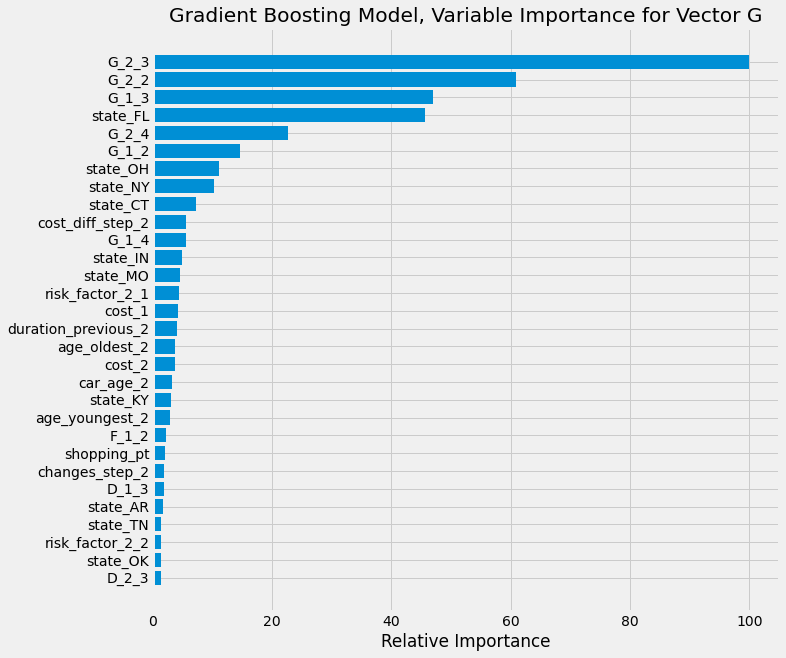

In [321]:
# GradientBoosting classifier for G with best Hyperparameters {'n_estimators': 200, 
# 'max_features': 6, 'max_depth': 4, 'learning_rate': 0.25}

vector = 'G'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, learning_rate = 0.25, max_depth = 4, max_features = 6, plot=True)


This model improves performance over the base GB model, but is still not as good as the Random Forest model. Let's manually tweak a couple of parameters and check the performance.

Gradient Boosting Classifier results for Vector G
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.25, max_features = 8
Accuracy=0.7567, f1-score=0.7561
Confusion Matrix - normalized
 [[0.7105 0.2346 0.0389 0.016 ]
 [0.1166 0.8179 0.0438 0.0216]
 [0.0532 0.1366 0.7698 0.0404]
 [0.0682 0.1853 0.2147 0.5318]]
Confusion Matrix
 [[2265  748  124   51]
 [ 711 4987  267  132]
 [ 263  676 3808  200]
 [  88  239  277  686]]

Classification Report 
               precision    recall  f1-score   support

           0       0.68      0.71      0.70      3188
           1       0.75      0.82      0.78      6097
           2       0.85      0.77      0.81      4947
           3       0.64      0.53      0.58      1290

    accuracy                           0.76     15522
   macro avg       0.73      0.71      0.72     15522
weighted avg       0.76      0.76      0.76     15522

30


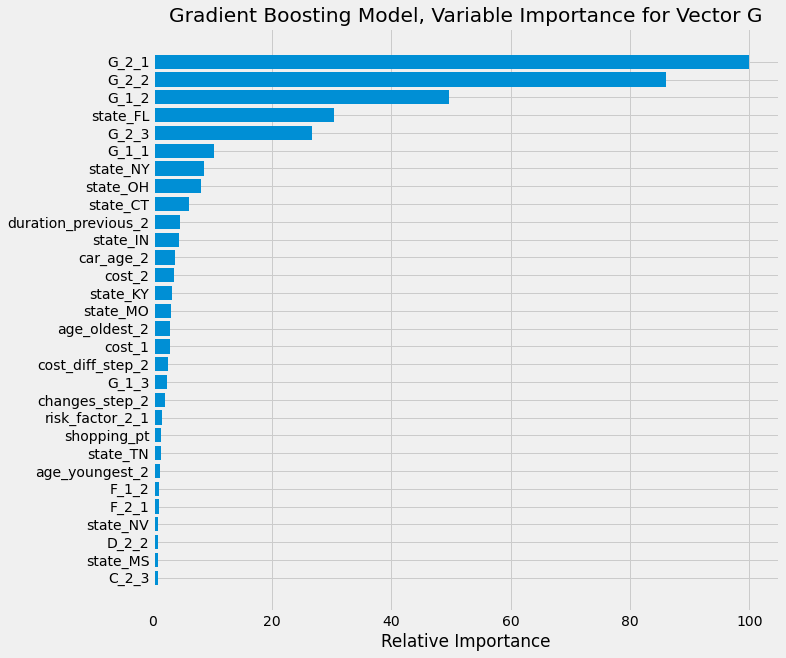

In [341]:
# model G with GradientBoosting classifier and best hyperparameters


vector = 'G'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, learning_rate = 0.25, max_depth = 3, \
                                                   max_features = 8, plot=True)


Notes for Vector G GB modelling:
* increasing max_features beyond 8 reduces score
* increasing max_depth to 4 doesn't change score much (reduces it marginally)

No GB model is not able to beat Random forest score of **0.758**.


In [342]:
vector = 'G'
score_matrix = model_score_matrix(vector, 2, gb_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,3547,481,11.94
cust_maintained_vector,229,11265,98.01


In [343]:
score = model_score_by_shopping_pt("G", 2, gb_preds)
score

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,G_model_accuracy_%,G_quote2_accuracy_%,model_vs_quote
shopping_pt,,,
3,77.67,76.88,0.79
4,79.06,78.28,0.78
5,77.26,76.59,0.67
6,76.00,75.60,0.40
7,74.11,72.23,1.88
8,75.43,72.97,2.46
9,74.40,72.89,1.51
10,71.58,67.66,3.92
11,79.47,74.49,4.98


In [344]:
perf_q1q2.update('G', 'gb', 'overall', round(gb_ac*100,2))
perf_q1q2.update('G', 'gb', 'customer_type', score_matrix)
perf_q1q2.update('G', 'gb', 'shopping_pt', score)
perf_q1q2.compare('G', 'gb')
perf_q1q2.record['G']

,no_model,rf,rf_vs_no_model,gb,gb_vs_no_model
accuracy_overall,74.05,75.80,1.75,75.67,1.62
accuracy_cust_changed_vector,0,11.02,11.02,11.94,11.94
accuracy_cust_maintained_vector,100,98.50,-1.5,98.01,-1.99
accuracy_shopping_pt_3,76.88,78.00,1.12,77.67,0.79
accuracy_shopping_pt_4,78.28,78.83,0.55,79.06,0.78
accuracy_shopping_pt_5,76.59,77.43,0.84,77.26,0.67
accuracy_shopping_pt_6,75.6,76.48,0.88,76.00,0.4
accuracy_shopping_pt_7,72.23,74.34,2.11,74.11,1.88
accuracy_shopping_pt_8,72.97,75.51,2.54,75.43,2.46
accuracy_shopping_pt_9,72.89,74.66,1.77,74.40,1.51


In [60]:
# Let's use RandomizedSearchCV to find the best XGB classifier Hyperparamters for vector G

import xgboost as xgb

from sklearn.model_selection import RandomizedSearchCV
vector = 'G'
param_grid = {'learning_rate' : [0.25, 0.3, 0.35, 0.5], 'n_estimators' : np.arange(100,501,100), \
              'colsample_bytree': [0.15,0.25,0.35,0.5], 'max_depth' : [3,4,5]}
clf = xgb.XGBClassifier(objective='binary:logistic', random_state=1, n_jobs=-1)
clf_cv = RandomizedSearchCV(clf, param_grid, n_iter = 60, verbose = 3, cv=4)
clf_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))

print(f"Vector {vector} RandomizedSearchCV: XG Boosting Model\nBest Score:" + str(clf_cv.best_score_))
print("\nBest Parameters: " + str(clf_cv.best_params_))


Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=100;, score=0.760 total time=   8.2s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=100;, score=0.765 total time=   8.0s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=100;, score=0.753 total time=   9.7s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=100;, score=0.762 total time=   9.8s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=5, n_estimators=300;, score=0.760 total time=  18.6s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=5, n_estimators=300;, score=0.764 total time=  19.5s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=5, n_estimators=300;, score=0.755 total time=  20.0s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=5, n_estimators=300;, score=0.764 total time=  18.6

[CV 2/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=5, n_estimators=300;, score=0.766 total time=  18.1s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=5, n_estimators=300;, score=0.758 total time=  18.0s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=5, n_estimators=300;, score=0.764 total time=  18.9s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.763 total time=  15.7s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.766 total time=  15.6s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.758 total time=  15.1s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.764 total time=  15.1s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=5, n_estimators=100;, score=0.764 total time=   6.1s
[CV 2/4] END colsample_bytree=0.25, learning_rat

[CV 4/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=4, n_estimators=500;, score=0.758 total time=  19.7s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=4, n_estimators=500;, score=0.753 total time=  30.2s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=4, n_estimators=500;, score=0.757 total time=  30.5s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=4, n_estimators=500;, score=0.747 total time=  30.7s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=4, n_estimators=500;, score=0.755 total time=  30.2s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=5, n_estimators=400;, score=0.761 total time=  30.5s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=5, n_estimators=400;, score=0.764 total time=  31.1s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=5, n_estimators=400;, score=0.754 total time=  30.7s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.2

[CV 2/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=3, n_estimators=300;, score=0.767 total time=  18.2s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=3, n_estimators=300;, score=0.758 total time=  18.5s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=3, n_estimators=300;, score=0.766 total time=  18.5s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.762 total time=  23.6s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.766 total time=  23.6s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.757 total time=  23.3s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.764 total time=  23.3s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.5, max_depth=5, n_estimators=300;, score=0.755 total time=  19.0s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.

In [62]:
results = pd.DataFrame(clf_cv.cv_results_['params'])
results['train_score'] = clf_cv.cv_results_['mean_test_score']
results['train_rank'] = clf_cv.cv_results_['rank_test_score']
datapath = 'Modelling_data'
save_file(results, 'xgboost_results_vectorG.csv', datapath)
results

Writing file.  "Modelling_data\xgboost_results_vectorG.csv"


,n_estimators,max_depth,learning_rate,colsample_bytree,train_score,train_rank
0,100,5,0.50,0.50,0.759958,41
1,300,5,0.30,0.25,0.760731,36
2,500,5,0.30,0.35,0.755609,54
3,100,3,0.30,0.50,0.762068,27
4,400,5,0.50,0.50,0.748812,60
5,100,5,0.25,0.35,0.764468,1
6,300,4,0.30,0.50,0.761279,33
7,300,5,0.50,0.50,0.751776,59
8,400,4,0.30,0.15,0.761472,32
9,200,5,0.30,0.25,0.762696,18


In [63]:
import xgboost as xgb

vector = 'G'

print(f"XGBoost Classifier results for Vector {vector}\n")
#param_grid
for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    max_depth = row['max_depth']
    learning_rate = row['learning_rate']
    colsample_bytree = row['colsample_bytree']
        
    clf = xgb.XGBClassifier(max_depth=int(max_depth), objective='multi:softprob', n_estimators=int(n_estimators), \
                       learning_rate = learning_rate, colsample_bytree = colsample_bytree, n_jobs=-1, random_state=1)

    clf.fit(X_train.to_numpy(), y_train[vector].astype('int'))
    y_pred = clf.predict(X_test.to_numpy())
    y_pred_prob = clf.predict_proba(X_test.to_numpy())
    xg_probs = y_pred_prob[:,1]
    ac = accuracy_score(y_test[vector].astype('int'), y_pred)

    f1 = f1_score(y_test[vector].astype('int'), y_pred, average='weighted')
    cm = np.around(confusion_matrix(y_test[vector].astype('int'), y_pred, normalize = 'true'),3)
    cm1 = confusion_matrix(y_test[vector].astype('int'), y_pred)

    results.loc[i, 'test_score'] = ac
    results.loc[i, 'f1_score'] = f1
    
    print(f"Parameters: No. of Estimators = {n_estimators},  max_depth = {max_depth}, \
    learning_rate = {learning_rate}, colsample_bytree = {colsample_bytree}")

    print(f'Accuracy={ac:4.4}, f1_score={f1:4.4}')

results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
results

XGBoost Classifier results for Vector G

Parameters: No. of Estimators = 100.0,  max_depth = 5.0,     learning_rate = 0.5, colsample_bytree = 0.5
Accuracy=0.7572, f1_score=0.7561
Parameters: No. of Estimators = 300.0,  max_depth = 5.0,     learning_rate = 0.3, colsample_bytree = 0.25
Accuracy=0.7553, f1_score=0.7542
Parameters: No. of Estimators = 500.0,  max_depth = 5.0,     learning_rate = 0.3, colsample_bytree = 0.35
Accuracy=0.7516, f1_score=0.7504
Parameters: No. of Estimators = 100.0,  max_depth = 3.0,     learning_rate = 0.3, colsample_bytree = 0.5
Accuracy=0.7572, f1_score=0.7567
Parameters: No. of Estimators = 400.0,  max_depth = 5.0,     learning_rate = 0.5, colsample_bytree = 0.5
Accuracy=0.7447, f1_score=0.7431
Parameters: No. of Estimators = 100.0,  max_depth = 5.0,     learning_rate = 0.25, colsample_bytree = 0.35
Accuracy=0.7592, f1_score=0.7585
Parameters: No. of Estimators = 300.0,  max_depth = 4.0,     learning_rate = 0.3, colsample_bytree = 0.5
Accuracy=0.7584, f1_sc

Parameters: No. of Estimators = 300.0,  max_depth = 4.0,     learning_rate = 0.5, colsample_bytree = 0.15
Accuracy=0.7559, f1_score=0.7548


,n_estimators,max_depth,learning_rate,colsample_bytree,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,100,5,0.50,0.50,0.759958,41,0.757248,0.756100,23.0,0.758603,37.0
1,300,5,0.30,0.25,0.760731,36,0.755315,0.754174,33.0,0.758023,42.0
2,500,5,0.30,0.35,0.755609,54,0.751643,0.750400,40.0,0.753626,54.0
3,100,3,0.30,0.50,0.762068,27,0.757183,0.756702,24.0,0.759626,32.0
4,400,5,0.50,0.50,0.748812,60,0.744749,0.743126,47.0,0.746781,60.0
5,100,5,0.25,0.35,0.764468,1,0.759245,0.758462,8.0,0.761857,3.0
6,300,4,0.30,0.50,0.761279,33,0.758407,0.757553,16.0,0.759843,28.0
7,300,5,0.50,0.50,0.751776,59,0.748550,0.747041,45.0,0.750163,59.0
8,400,4,0.30,0.15,0.761472,32,0.759696,0.758793,5.0,0.760584,20.0
9,200,5,0.30,0.25,0.762696,18,0.759374,0.758493,7.0,0.761035,14.0


In [64]:
save_file(results,"xgboost_results_vectorG.csv",datapath)


A file already exists with this name.

Do you want to overwrite? (Y/N)Y
Writing file.  "Modelling_data\xgboost_results_vectorG.csv"


XGBoost Classifier results for Vector G
Parameters: No. of Estimators = 200,  max_depth = 5,     learning_rate = 0.25, colsample_bytree = 0.25
Accuracy=0.7601, f1-score=0.7592
Confusion Matrix - normalized
 [[0.7221 0.2258 0.0392 0.0129]
 [0.1199 0.8191 0.0425 0.0185]
 [0.0528 0.1334 0.7738 0.04  ]
 [0.0667 0.1899 0.2209 0.5225]]
Confusion Matrix
 [[2302  720  125   41]
 [ 731 4994  259  113]
 [ 261  660 3828  198]
 [  86  245  285  674]]

Classification Report 
               precision    recall  f1-score   support

           0       0.68      0.72      0.70      3188
           1       0.75      0.82      0.79      6097
           2       0.85      0.77      0.81      4947
           3       0.66      0.52      0.58      1290

    accuracy                           0.76     15522
   macro avg       0.74      0.71      0.72     15522
weighted avg       0.76      0.76      0.76     15522

30


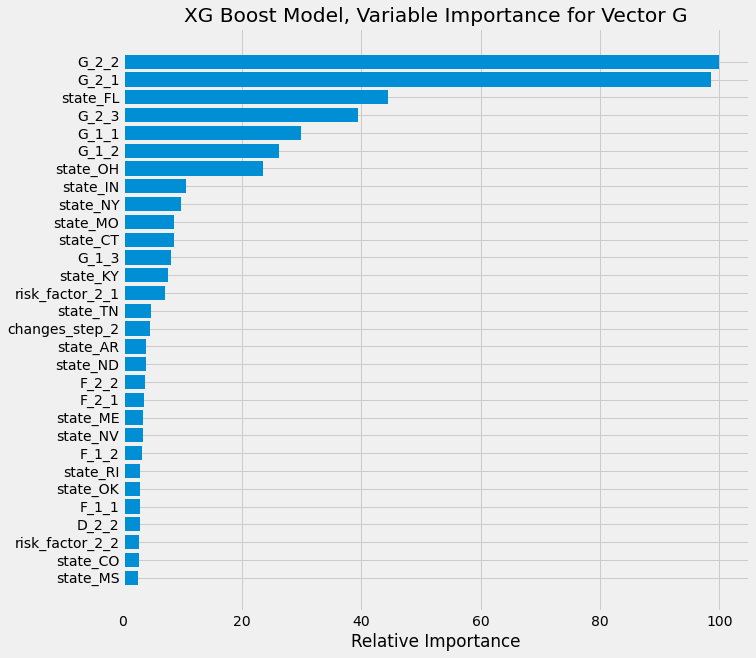

In [345]:
# model G with XGBoost classifier Best Parameters: (Overall 1st rank model)
#  No. of Estimators = 200,  max_depth = 5, learning_rate = 0.25, colsample_bytree = 0.25 : 0.7601, 0.7592

vector = 'G'

xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators = 200, learning_rate = 0.25, max_depth = 5, colsample_bytree = 0.25, plot=True)



In [346]:
vector = 'G'
score_matrix = model_score_matrix(vector, 2, xg_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,3479,549,13.63
cust_maintained_vector,245,11249,97.87


In [347]:
score = model_score_by_shopping_pt("G", 2, xg_preds)
score

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,G_model_accuracy_%,G_quote2_accuracy_%,model_vs_quote
shopping_pt,,,
3,78.23,76.88,1.35
4,79.22,78.28,0.94
5,77.81,76.59,1.22
6,76.64,75.60,1.04
7,74.45,72.23,2.22
8,75.69,72.97,2.72
9,74.87,72.89,1.98
10,71.99,67.66,4.33
11,76.83,74.49,2.34


In [348]:
perf_q1q2.update('G', 'xg', 'overall', round(xg_ac*100,2))
perf_q1q2.update('G', 'xg', 'customer_type', score_matrix)
perf_q1q2.update('G', 'xg', 'shopping_pt', score)
perf_q1q2.compare('G', 'xg')
perf_q1q2.record['G']

,no_model,rf,rf_vs_no_model,gb,gb_vs_no_model,xg,xg_vs_no_model
accuracy_overall,74.05,75.80,1.75,75.67,1.62,76.01,1.96
accuracy_cust_changed_vector,0,11.02,11.02,11.94,11.94,13.63,13.63
accuracy_cust_maintained_vector,100,98.50,-1.5,98.01,-1.99,97.87,-2.13
accuracy_shopping_pt_3,76.88,78.00,1.12,77.67,0.79,78.23,1.35
accuracy_shopping_pt_4,78.28,78.83,0.55,79.06,0.78,79.22,0.94
accuracy_shopping_pt_5,76.59,77.43,0.84,77.26,0.67,77.81,1.22
accuracy_shopping_pt_6,75.6,76.48,0.88,76.00,0.4,76.64,1.04
accuracy_shopping_pt_7,72.23,74.34,2.11,74.11,1.88,74.45,2.22
accuracy_shopping_pt_8,72.97,75.51,2.54,75.43,2.46,75.69,2.72
accuracy_shopping_pt_9,72.89,74.66,1.77,74.40,1.51,74.87,1.98


C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3934441024.py:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(labels)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3934441024.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(labels)


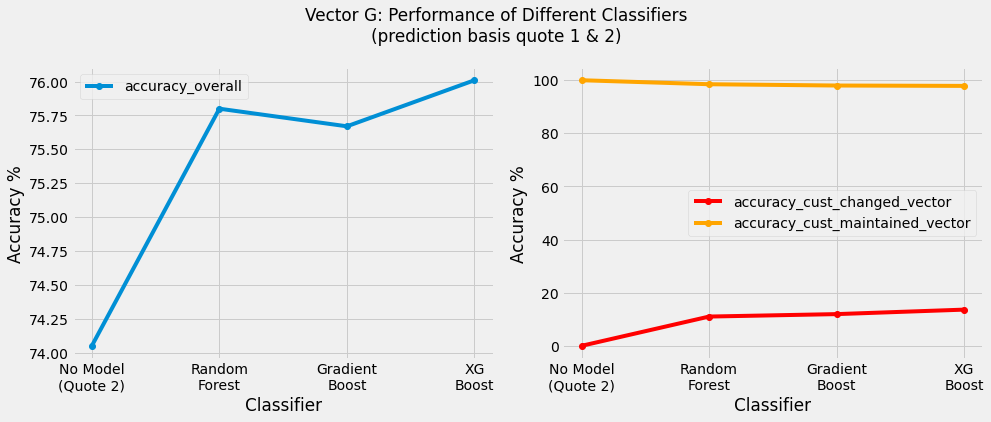

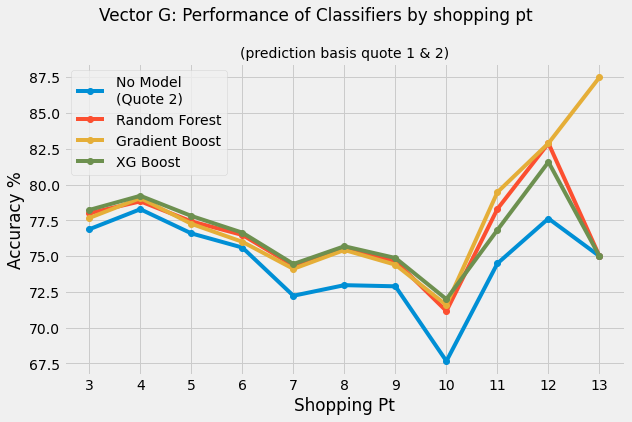

In [520]:

vector = 'G'
#models = ['no_model', 'rf', 'gb', 'xg', 'lr']
models = ['no_model', 'rf', 'gb', 'xg']
quotes = [1,2]
model_performance_plot(vector, models, quotes, "overall")
model_performance_plot(vector, models, quotes, "shopping_pt")

## Quote 1 & 2: Predict A

Random Forest Classifier results for Vector A

Accuracy=0.846
f1-score=0.841
Confusion Matrix
 [[0.81 0.17 0.02]
 [0.04 0.93 0.03]
 [0.04 0.38 0.58]]

Classification Report 
               precision    recall  f1-score   support

           0       0.86      0.81      0.83      3463
           1       0.85      0.93      0.89      9504
           2       0.80      0.58      0.68      2555

    accuracy                           0.85     15522
   macro avg       0.84      0.77      0.80     15522
weighted avg       0.84      0.85      0.84     15522

30


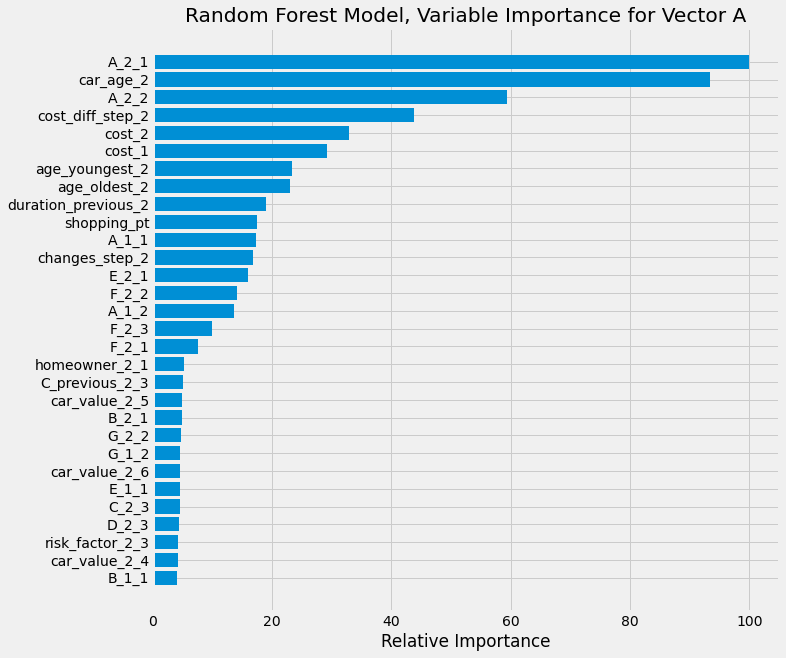

In [299]:
# Let's run a Random Forest model for vector A


vector = 'A'
rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, plot=True)


In [350]:
test_set = df_train_first2.iloc[y_test.index,:]

x = pd.crosstab( test_set['A'], test_set['A_2'])

same_as_2 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 

acc = np.around(np.sum(same_as_2)/y_test.shape[0],4)

print(f"Accuracy based on simply predicting vector {vector} = {vector}_2 : {(np.sum(same_as_2)/y_test.shape[0]): 4.4}")

Accuracy based on simply predicting vector A = A_2 :  0.8214


In [305]:
x['total'] = x.sum(axis=1)
x['A0_%'] = np.around(x[0]*100 / x['total'], 2)
x['A1_%'] = np.around(x[1]*100 / x['total'], 2)
x['A2_%'] = np.around(x[2]*100 / x['total'], 2)


In [306]:
x

A_2,0,1,2,total,A0_%,A1_%,A2_%
A,,,,,,,
0,2687,679,97,3463,77.59,19.61,2.80
1,632,8565,307,9504,6.65,90.12,3.23
2,190,867,1498,2555,7.44,33.93,58.63


In [297]:
# Now let's try a Grid Search CV to find the best Random Forest classifier for vector A

vector = 'A'
param_grid = {'n_estimators' : np.arange(100,801,100)}

rf = RandomForestClassifier(random_state = 1, n_jobs=-1)

rf_cv = GridSearchCV(rf, param_grid, cv=5)
rf_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))

print("Random Forest Model\nBest Score:" + str(rf_cv.best_score_))
print("\nBest Parameters: " + str(rf_cv.best_params_)) 

Random Forest Model
Best Score:0.8449544978658292

Best Parameters: {'n_estimators': 800}


Random Forest Classifier results for Vector A
Parameters: No. of Estimators = 800,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8458, f1-score=0.8407
Confusion Matrix - normalized
 [[0.8033 0.1733 0.0234]
 [0.0381 0.9314 0.0305]
 [0.0395 0.3753 0.5851]]
Confusion Matrix
 [[2782  600   81]
 [ 362 8852  290]
 [ 101  959 1495]]

Classification Report 
               precision    recall  f1-score   support

           0       0.86      0.80      0.83      3463
           1       0.85      0.93      0.89      9504
           2       0.80      0.59      0.68      2555

    accuracy                           0.85     15522
   macro avg       0.84      0.77      0.80     15522
weighted avg       0.84      0.85      0.84     15522

30


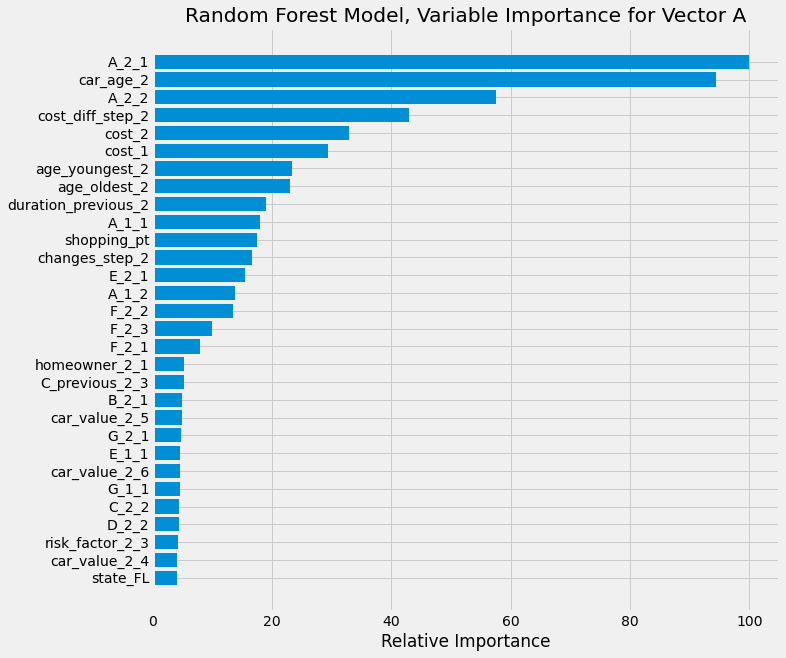

In [349]:
# Run the model with Best Parameters: {'n_estimators': 800}


vector = 'A'
rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators= 800, plot=True)


In [351]:
vector = 'A'
score_matrix = model_score_matrix(vector, 2, rf_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2288,484,17.46
cust_maintained_vector,105,12645,99.18


In [353]:
score = model_score_by_shopping_pt("A", 2, rf_preds)
score

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,A_model_accuracy_%,A_quote2_accuracy_%,model_vs_quote
shopping_pt,,,
3,85.52,84.40,1.12
4,89.14,88.44,0.70
5,86.80,84.80,2.00
6,86.04,84.20,1.84
7,84.73,81.67,3.06
8,82.61,79.42,3.19
9,82.06,78.94,3.12
10,81.05,77.55,3.50
11,81.52,80.06,1.46


In [354]:
vector='A'
perf_q1q2.update(vector, 'no_model', 'overall', acc*100)
perf_q1q2.update(vector, 'rf', 'overall', round(rf_ac*100,2))
perf_q1q2.update(vector, 'rf', 'customer_type', score_matrix)
perf_q1q2.update(vector, 'rf', 'shopping_pt', score)
perf_q1q2.compare(vector, 'rf')
perf_q1q2.record[vector]

,no_model,rf,rf_vs_no_model
accuracy_overall,82.14,84.58,2.44
accuracy_cust_changed_vector,0,17.46,17.46
accuracy_cust_maintained_vector,100,99.18,-0.82
accuracy_shopping_pt_3,84.4,85.52,1.12
accuracy_shopping_pt_4,88.44,89.14,0.7
accuracy_shopping_pt_5,84.8,86.80,2.0
accuracy_shopping_pt_6,84.2,86.04,1.84
accuracy_shopping_pt_7,81.67,84.73,3.06
accuracy_shopping_pt_8,79.42,82.61,3.19
accuracy_shopping_pt_9,78.94,82.06,3.12


Gradient Boosting Classifier results for Vector A

Accuracy=0.844
f1-score=0.840
Confusion Matrix
 [[0.812 0.164 0.024]
 [0.042 0.926 0.033]
 [0.041 0.373 0.586]]

Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.81      0.83      3463
           1       0.85      0.93      0.89      9504
           2       0.79      0.59      0.67      2555

    accuracy                           0.84     15522
   macro avg       0.83      0.77      0.80     15522
weighted avg       0.84      0.84      0.84     15522



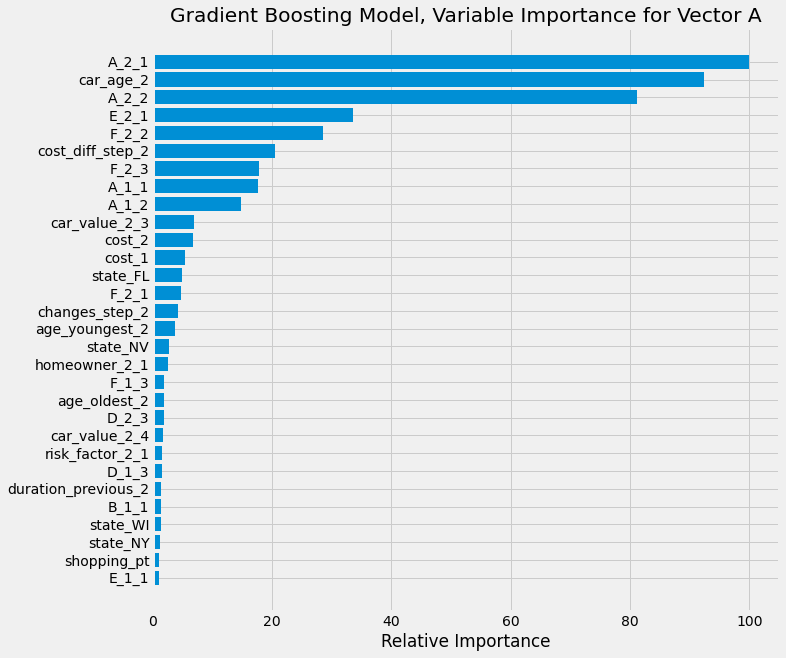

In [376]:
# model A with GradientBoosting classifier

vector = 'A'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 150, learning_rate = 0.25, max_depth = 3, max_features = 6, plot=True)


In [377]:
# Let's use RandomizedSearchCV to find the best GradientBoosting classifier Hyperparamters for vector A 

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV

vector = 'A'

param_grid = {'learning_rate' : [0.25, 0.5, 0.75, 1], 'n_estimators' : [50, 100, 150, 200], \
              'max_features': [2,4,6,8], 'max_depth' : [1,2,3]}

gb = GradientBoostingClassifier(random_state = 1)

gb_cv = RandomizedSearchCV(gb, param_grid, n_iter = 10, verbose = 3, cv=5)

gb_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))

print(f"Vector {vector} RandomizedSearchCV: Gradient Boosting Model\nBest Score:" + str(gb_cv.best_score_))
print("\nBest Parameters: " + str(gb_cv.best_params_))

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END learning_rate=0.25, max_depth=3, max_features=8, n_estimators=200;, score=0.846 total time=  51.0s
[CV 2/5] END learning_rate=0.25, max_depth=3, max_features=8, n_estimators=200;, score=0.846 total time=  48.3s
[CV 3/5] END learning_rate=0.25, max_depth=3, max_features=8, n_estimators=200;, score=0.846 total time=  47.4s
[CV 4/5] END learning_rate=0.25, max_depth=3, max_features=8, n_estimators=200;, score=0.840 total time=  50.8s
[CV 5/5] END learning_rate=0.25, max_depth=3, max_features=8, n_estimators=200;, score=0.842 total time=  50.1s
[CV 1/5] END learning_rate=0.25, max_depth=3, max_features=8, n_estimators=150;, score=0.845 total time=  36.3s
[CV 2/5] END learning_rate=0.25, max_depth=3, max_features=8, n_estimators=150;, score=0.847 total time=  36.4s
[CV 3/5] END learning_rate=0.25, max_depth=3, max_features=8, n_estimators=150;, score=0.845 total time=  35.9s
[CV 4/5] END learning_rate=0.25, max_depth=

Gradient Boosting Classifier results for Vector A

Parameters: No. of Estimators = 200,  learning_rate = 0.25, max_depth = 3,                                 max_features = 8

Accuracy=0.846
f1-score=0.841
Confusion Matrix
 [[0.813 0.163 0.024]
 [0.04  0.926 0.034]
 [0.039 0.371 0.59 ]]

Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.81      0.83      3463
           1       0.85      0.93      0.89      9504
           2       0.79      0.59      0.68      2555

    accuracy                           0.85     15522
   macro avg       0.83      0.78      0.80     15522
weighted avg       0.84      0.85      0.84     15522



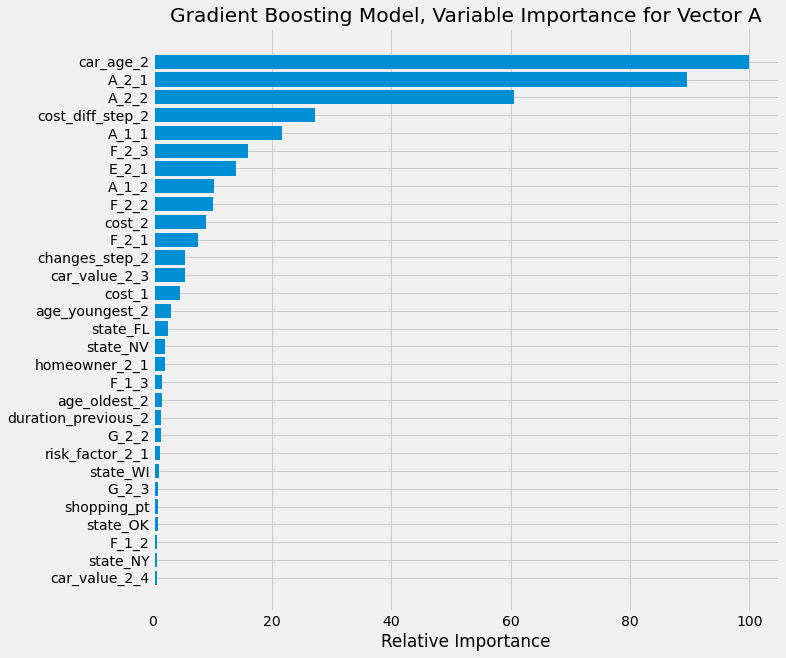

In [380]:
# model A with GradientBoosting classifier and best hyperparameters

vector = 'A'


gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, learning_rate = 0.25, max_depth = 3, \
                                         max_features = 8, plot=True)

    


Gradient Boosting Classifier results for Vector A

Parameters: No. of Estimators = 200,  learning_rate = 0.5, max_depth = 3, max_features = 8

Accuracy=0.846
f1-score=0.841
Confusion Matrix
 [[0.819 0.156 0.025]
 [0.041 0.926 0.033]
 [0.045 0.369 0.587]]

Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.82      0.83      3463
           1       0.86      0.93      0.89      9504
           2       0.79      0.59      0.67      2555

    accuracy                           0.85     15522
   macro avg       0.83      0.78      0.80     15522
weighted avg       0.84      0.85      0.84     15522



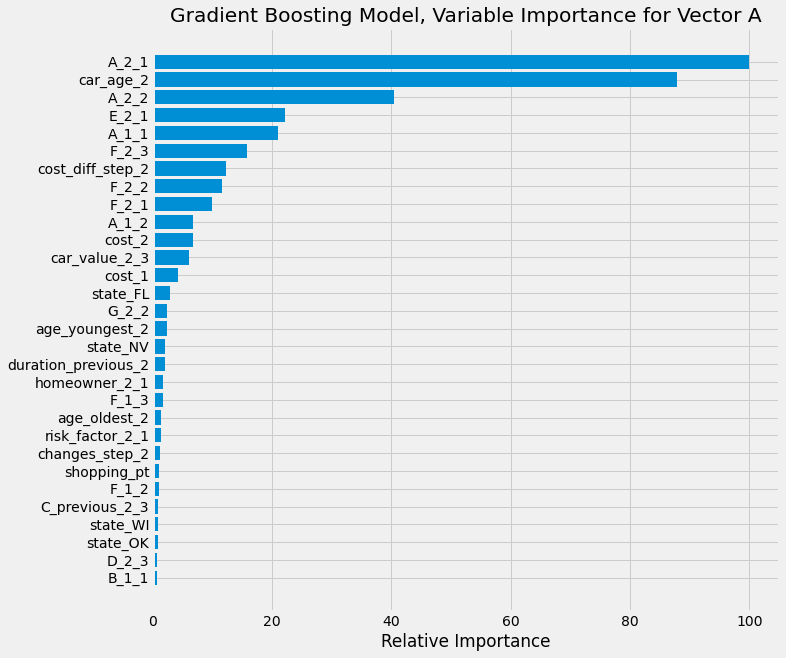

In [381]:
# model A with GradientBoosting classifier, increasing learning rate to 0.5

vector = 'A'


gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, learning_rate = 0.5, max_depth = 3, \
                                         max_features = 8, plot=True)

    


Gradient Boosting Classifier results for Vector A

Parameters: No. of Estimators = 200,  learning_rate = 0.5, max_depth = 3, max_features = 10

Accuracy=0.847
f1-score=0.842
Confusion Matrix
 [[0.821 0.156 0.023]
 [0.042 0.925 0.034]
 [0.041 0.367 0.592]]

Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.82      0.84      3463
           1       0.86      0.92      0.89      9504
           2       0.79      0.59      0.68      2555

    accuracy                           0.85     15522
   macro avg       0.83      0.78      0.80     15522
weighted avg       0.84      0.85      0.84     15522



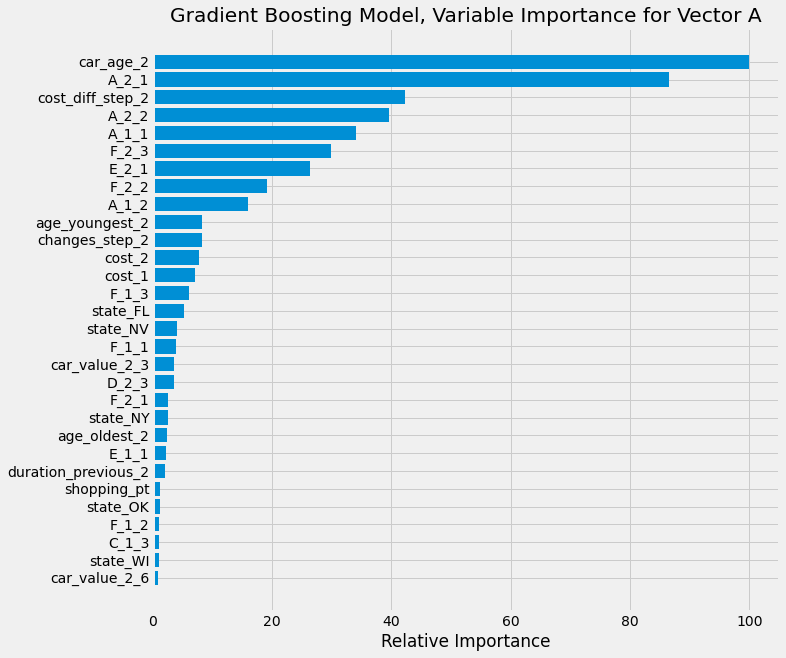

In [383]:
# model A with GradientBoosting classifier, increasing learning rate to 0.5, max _features = 10

vector = 'A'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, learning_rate = 0.5, max_depth = 3, \
                                         max_features = 10, plot=True)



Gradient Boosting Classifier results for Vector A
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.4, max_features = 10
Accuracy=0.8483, f1-score=0.8437
Confusion Matrix - normalized
 [[0.8244 0.1525 0.0231]
 [0.0404 0.9265 0.0331]
 [0.0423 0.3675 0.5902]]
Confusion Matrix
 [[2855  528   80]
 [ 384 8805  315]
 [ 108  939 1508]]

Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.82      0.84      3463
           1       0.86      0.93      0.89      9504
           2       0.79      0.59      0.68      2555

    accuracy                           0.85     15522
   macro avg       0.83      0.78      0.80     15522
weighted avg       0.85      0.85      0.84     15522

30


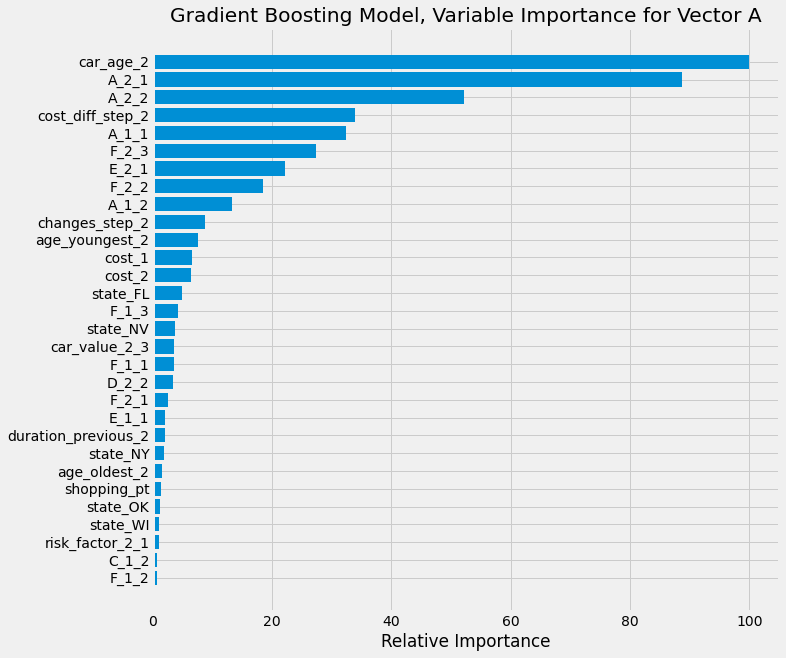

In [355]:
# BEST GB MODEL for A
# model A with GradientBoosting classifier, reducing learning rate to 0.4, max _features = 10

vector = 'A'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, learning_rate = 0.4, max_depth = 3, \
                                         max_features = 10, plot=True)


Notes for Vector A GB modelling:
* increasing l_rate beyond 0.5 reduces score
* increasing max_depth beyond 3 reduces score

Best Model HyperParameters: No. of Estimators = 200,  learning_rate = 0.4, max_depth = 3, max_features = 10



In [356]:
vector = 'A'
score_matrix = model_score_matrix(vector, 2, gb_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2148,624,22.51
cust_maintained_vector,206,12544,98.38


In [357]:
score = model_score_by_shopping_pt(vector, 2, gb_preds)
score

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,A_model_accuracy_%,A_quote2_accuracy_%,model_vs_quote
shopping_pt,,,
3,85.75,84.40,1.35
4,89.30,88.44,0.86
5,87.47,84.80,2.67
6,85.52,84.20,1.32
7,84.97,81.67,3.30
8,83.08,79.42,3.66
9,82.85,78.94,3.91
10,81.05,77.55,3.50
11,81.82,80.06,1.76


In [358]:
vector='A'
model = 'gb'
perf_q1q2.update(vector, model, 'overall', round(gb_ac*100,2))
perf_q1q2.update(vector, model, 'customer_type', score_matrix)
perf_q1q2.update(vector, model, 'shopping_pt', score)
perf_q1q2.compare(vector, model)
perf_q1q2.record[vector]

,no_model,rf,rf_vs_no_model,gb,gb_vs_no_model
accuracy_overall,82.14,84.58,2.44,84.83,2.69
accuracy_cust_changed_vector,0,17.46,17.46,22.51,22.51
accuracy_cust_maintained_vector,100,99.18,-0.82,98.38,-1.62
accuracy_shopping_pt_3,84.4,85.52,1.12,85.75,1.35
accuracy_shopping_pt_4,88.44,89.14,0.7,89.30,0.86
accuracy_shopping_pt_5,84.8,86.80,2.0,87.47,2.67
accuracy_shopping_pt_6,84.2,86.04,1.84,85.52,1.32
accuracy_shopping_pt_7,81.67,84.73,3.06,84.97,3.3
accuracy_shopping_pt_8,79.42,82.61,3.19,83.08,3.66
accuracy_shopping_pt_9,78.94,82.06,3.12,82.85,3.91


XGBoost Classifier results for Vector A

Parameters: No. of Estimators = 300,  max_depth = 3

Accuracy=0.848
f1-score=0.843
Confusion Matrix
 [[0.825 0.152 0.023]
 [0.041 0.926 0.033]
 [0.042 0.369 0.589]]

Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.83      0.84      3463
           1       0.86      0.93      0.89      9504
           2       0.79      0.59      0.68      2555

    accuracy                           0.85     15522
   macro avg       0.83      0.78      0.80     15522
weighted avg       0.85      0.85      0.84     15522

30


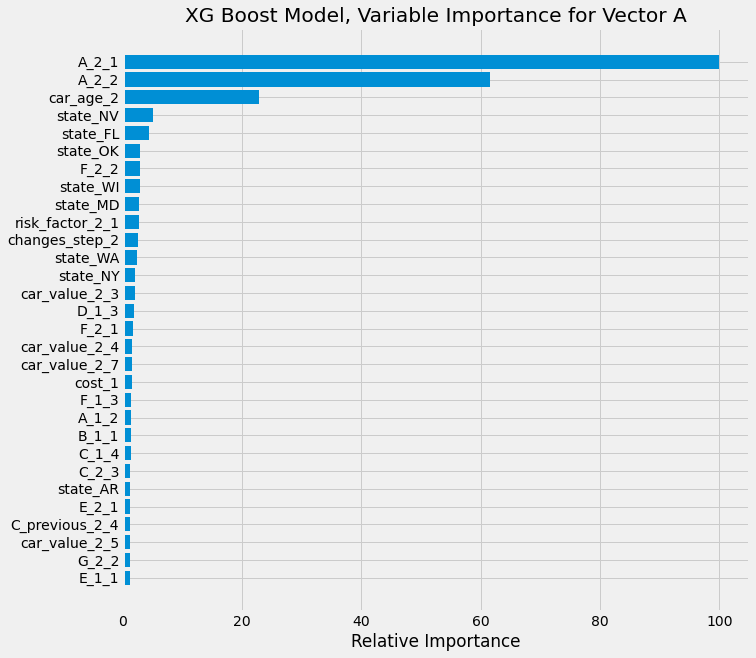

In [27]:
# model A with XGBoost classifier


vector = 'A'
xg_ac, xg_f2, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators = 300, max_depth = 3, plot=True)



In [38]:

# Let's use RandomizedSearchCV to find the best XGB classifier Hyperparamters for vector A 

vector = 'A'
param_grid = {'learning_rate' : [0.25, 0.35, 0.5, 0.75], 'n_estimators' : np.arange(100,701,100), \
              'colsample_bytree': [0.1,0.3,0.5,0.8,1], 'max_depth' : [1,2,3]}

xgb = xgb.XGBClassifier(objective='multi:softprob', random_state=1)
xgb_cv = RandomizedSearchCV(xgb, param_grid, n_iter = 20, verbose = 3, cv=4)
xgb_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))



Fitting 4 folds for each of 20 candidates, totalling 80 fits
[CV 1/4] END colsample_bytree=0.8, learning_rate=0.35, max_depth=1, n_estimators=600;, score=0.844 total time=  27.3s
[CV 2/4] END colsample_bytree=0.8, learning_rate=0.35, max_depth=1, n_estimators=600;, score=0.844 total time=  26.9s
[CV 3/4] END colsample_bytree=0.8, learning_rate=0.35, max_depth=1, n_estimators=600;, score=0.841 total time=  26.3s
[CV 4/4] END colsample_bytree=0.8, learning_rate=0.35, max_depth=1, n_estimators=600;, score=0.838 total time=  27.5s
[CV 1/4] END colsample_bytree=0.3, learning_rate=0.75, max_depth=2, n_estimators=300;, score=0.846 total time=  11.9s
[CV 2/4] END colsample_bytree=0.3, learning_rate=0.75, max_depth=2, n_estimators=300;, score=0.846 total time=  14.2s
[CV 3/4] END colsample_bytree=0.3, learning_rate=0.75, max_depth=2, n_estimators=300;, score=0.843 total time=  13.3s
[CV 4/4] END colsample_bytree=0.3, learning_rate=0.75, max_depth=2, n_estimators=300;, score=0.840 total time=  1

[CV 3/4] END colsample_bytree=0.1, learning_rate=0.25, max_depth=2, n_estimators=200;, score=0.840 total time=   4.0s
[CV 4/4] END colsample_bytree=0.1, learning_rate=0.25, max_depth=2, n_estimators=200;, score=0.838 total time=   3.9s
[CV 1/4] END colsample_bytree=0.1, learning_rate=0.75, max_depth=3, n_estimators=200;, score=0.846 total time=   5.8s
[CV 2/4] END colsample_bytree=0.1, learning_rate=0.75, max_depth=3, n_estimators=200;, score=0.846 total time=   5.0s
[CV 3/4] END colsample_bytree=0.1, learning_rate=0.75, max_depth=3, n_estimators=200;, score=0.843 total time=   4.8s
[CV 4/4] END colsample_bytree=0.1, learning_rate=0.75, max_depth=3, n_estimators=200;, score=0.841 total time=   4.9s
[CV 1/4] END colsample_bytree=0.8, learning_rate=0.75, max_depth=3, n_estimators=400;, score=0.841 total time=  29.0s
[CV 2/4] END colsample_bytree=0.8, learning_rate=0.75, max_depth=3, n_estimators=400;, score=0.840 total time=  29.2s
[CV 3/4] END colsample_bytree=0.8, learning_rate=0.75, m

NameError: name 'gb_cv' is not defined

In [39]:
print(f"Vector {vector} RandomizedSearchCV: XG Boosting Model\nBest Score:" + str(xgb_cv.best_score_))
print("\nBest Parameters: " + str(xgb_cv.best_params_))

Vector A RandomizedSearchCV: XG Boosting Model
Best Score:0.8455504224729515

Best Parameters: {'n_estimators': 500, 'max_depth': 3, 'learning_rate': 0.25, 'colsample_bytree': 0.5}


XGBoost Classifier results for Vector A

Parameters: No. of Estimators = 500,  max_depth = 3, learning_rate = 0.25, colsample_bytree = 0.5

Accuracy=0.847
f1-score=0.842
Confusion Matrix
 [[0.824 0.153 0.023]
 [0.041 0.925 0.033]
 [0.043 0.37  0.587]]

Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.82      0.84      3463
           1       0.86      0.93      0.89      9504
           2       0.79      0.59      0.67      2555

    accuracy                           0.85     15522
   macro avg       0.83      0.78      0.80     15522
weighted avg       0.84      0.85      0.84     15522

30


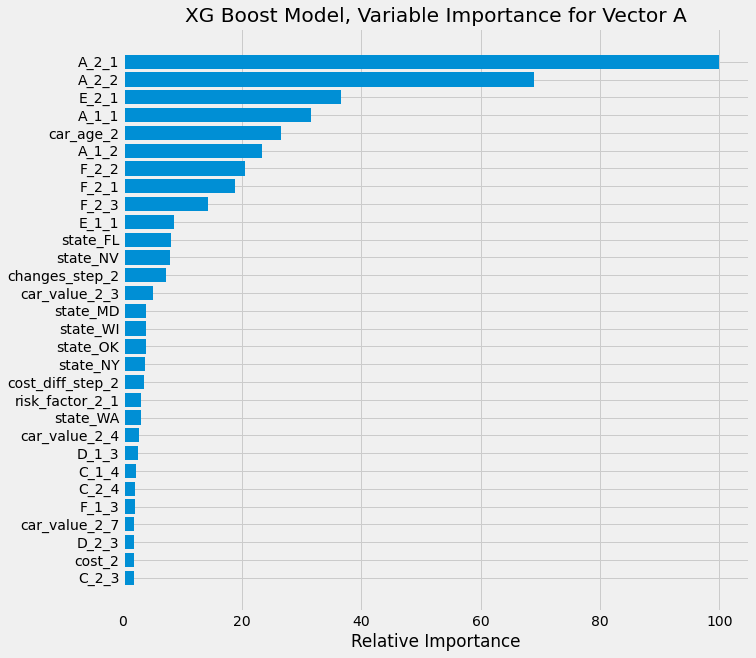

In [40]:
# model A with XGBoost classifier Best Parameters: {'n_estimators': 500, 'max_depth': 3, 'learning_rate': 0.25, 'colsample_bytree': 0.5}


vector = 'A'
xg_ac, xg_f2, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators = 500, max_depth = 3, \
                                         learning_rate = 0.25, colsample_bytree = 0.5, plot=True)



XGBoost Classifier results for Vector A
Parameters: No. of Estimators = 300,  max_depth = 3,     learning_rate = 0.3, colsample_bytree = 0.5
Accuracy=0.848, f1-score=0.8434
Confusion Matrix - normalized
 [[0.8247 0.151  0.0243]
 [0.0411 0.9251 0.0338]
 [0.0403 0.3671 0.5926]]
Confusion Matrix
 [[2856  523   84]
 [ 391 8792  321]
 [ 103  938 1514]]

Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.82      0.84      3463
           1       0.86      0.93      0.89      9504
           2       0.79      0.59      0.68      2555

    accuracy                           0.85     15522
   macro avg       0.83      0.78      0.80     15522
weighted avg       0.85      0.85      0.84     15522

30


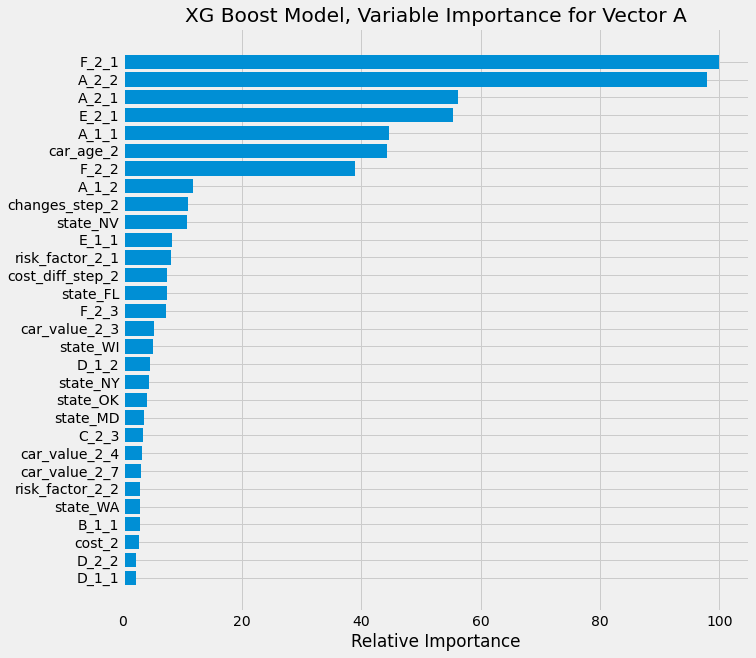

In [359]:
# model A with XGBoost classifier
# Parameters: No. of Estimators = 300,  max_depth = 3, learning_rate = 0.3, colsample_bytree = 0.5 (0.848, .8434)

vector = 'A'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators = 300, max_depth = 3, \
                                         learning_rate = 0.3, colsample_bytree = 0.5, plot=True)


In [361]:
vector = 'A'
score_matrix = model_score_matrix(vector, 2, xg_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2159,613,22.11
cust_maintained_vector,201,12549,98.42


In [362]:
vector = 'A'
score = model_score_by_shopping_pt(vector, 2, xg_preds)
score

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,A_model_accuracy_%,A_quote2_accuracy_%,model_vs_quote
shopping_pt,,,
3,85.75,84.40,1.35
4,89.38,88.44,0.94
5,87.13,84.80,2.33
6,85.80,84.20,1.60
7,85.27,81.67,3.60
8,83.12,79.42,3.70
9,82.01,78.94,3.07
10,80.84,77.55,3.29
11,82.11,80.06,2.05


In [363]:
vector='A'
model = 'xg'
perf_q1q2.update(vector, model, 'overall', round(xg_ac*100,2))
perf_q1q2.update(vector, model, 'customer_type', score_matrix)
perf_q1q2.update(vector, model, 'shopping_pt', score)
perf_q1q2.compare(vector, model)
perf_q1q2.record[vector]

,no_model,rf,rf_vs_no_model,gb,gb_vs_no_model,xg,xg_vs_no_model
accuracy_overall,82.14,84.58,2.44,84.83,2.69,84.80,2.66
accuracy_cust_changed_vector,0,17.46,17.46,22.51,22.51,22.11,22.11
accuracy_cust_maintained_vector,100,99.18,-0.82,98.38,-1.62,98.42,-1.58
accuracy_shopping_pt_3,84.4,85.52,1.12,85.75,1.35,85.75,1.35
accuracy_shopping_pt_4,88.44,89.14,0.7,89.30,0.86,89.38,0.94
accuracy_shopping_pt_5,84.8,86.80,2.0,87.47,2.67,87.13,2.33
accuracy_shopping_pt_6,84.2,86.04,1.84,85.52,1.32,85.80,1.6
accuracy_shopping_pt_7,81.67,84.73,3.06,84.97,3.3,85.27,3.6
accuracy_shopping_pt_8,79.42,82.61,3.19,83.08,3.66,83.12,3.7
accuracy_shopping_pt_9,78.94,82.06,3.12,82.85,3.91,82.01,3.07


C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3934441024.py:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(labels)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3934441024.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(labels)


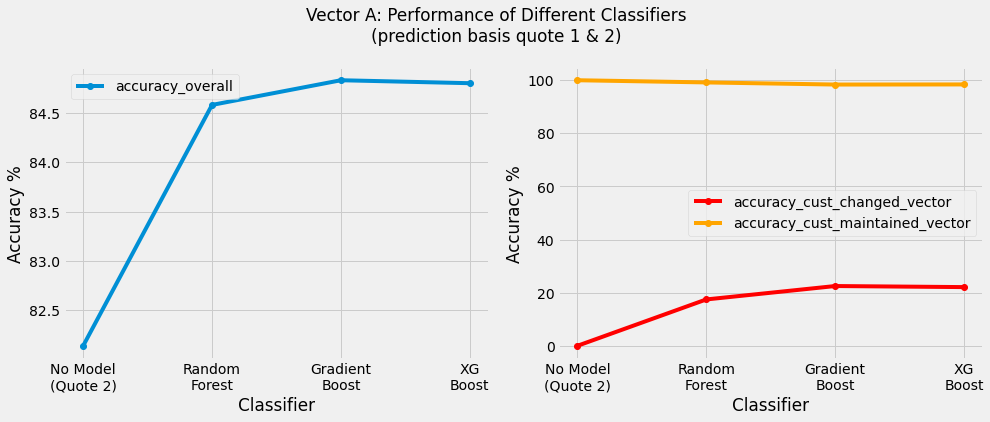

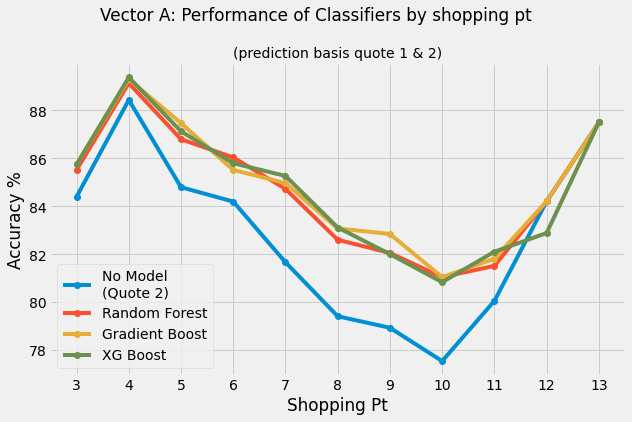

In [521]:
plt.style.use('fivethirtyeight')

vector = 'A'
#models = ['no_model', 'rf', 'gb', 'xg', 'lr']
models = ['no_model', 'rf', 'gb', 'xg']
quotes = [1,2]
model_performance_plot(vector, models, quotes, "overall")
model_performance_plot(vector, models, quotes, "shopping_pt")

## Quote 1 & 2: Predict Vector E

Random Forest Classifier results for Vector E

Accuracy=0.839
f1-score=0.838
Confusion Matrix
 [[0.886 0.114]
 [0.216 0.784]]

Classification Report 
               precision    recall  f1-score   support

           0       0.83      0.89      0.86      8425
           1       0.85      0.78      0.82      7097

    accuracy                           0.84     15522
   macro avg       0.84      0.83      0.84     15522
weighted avg       0.84      0.84      0.84     15522

Area under ROC: 
 0.8959355083374135
30


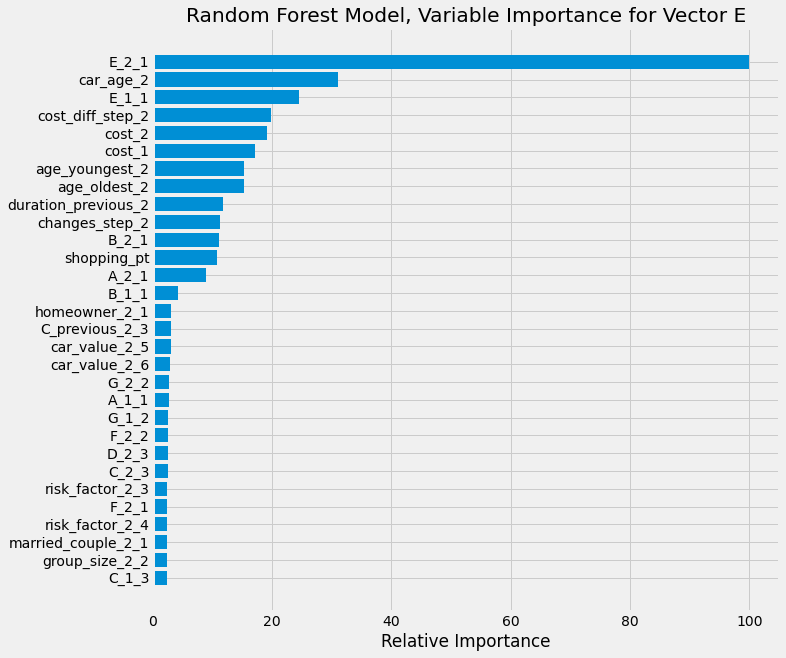

In [325]:
# Let's run the Random Forest model for vector E

vector = 'E'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, plot = True)


In [364]:
#test_set = df_train_first2.iloc[y_test.index,:]
vector = 'E'
x = pd.crosstab(test_set['E'], test_set['E_2'])

same_as_2 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 
acc = np.around(np.sum(same_as_2)/y_test.shape[0], 4)

print(f"Accuracy based on simply predicting vector {vector} = {vector}_2 : {(np.sum(same_as_2)/y_test.shape[0]): 4.4}")

Accuracy based on simply predicting vector E = E_2 :  0.8319


In [324]:
x['total'] = x.sum(axis=1)
x['E_%'] = np.around(x[0]*100 / x['total'], 2)
x['E1_%'] = np.around(x[1]*100 / x['total'], 2)

x

E_2,0,1,total,E_%,E1_%
E,,,,,
0,7382,1043,8425,87.62,12.38
1,1567,5530,7097,22.08,77.92


In [280]:
# Now let's try a Grid Search CV to find the best Random Forest classifier

vector = 'E'

param_grid = {'n_estimators' : np.arange(100,801,100)}

rf = RandomForestClassifier(random_state = 1, n_jobs=-1)

rf_cv = GridSearchCV(rf, param_grid, cv=5)

rf_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))

print("Random Forest Model\nBest Score:" + str(rf_cv.best_score_))
print("\nBest Parameters: " + str(rf_cv.best_params_)) 

Random Forest Model
Best Score:0.8429572360473545

Best Parameters: {'n_estimators': 100}


Random Forest Classifier results for Vector E
Parameters: No. of Estimators = 100,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8396, f1-score=0.8389
Confusion Matrix - normalized
 [[0.8857 0.1143]
 [0.2152 0.7848]]
Confusion Matrix
 [[7462  963]
 [1527 5570]]

Classification Report 
               precision    recall  f1-score   support

           0       0.83      0.89      0.86      8425
           1       0.85      0.78      0.82      7097

    accuracy                           0.84     15522
   macro avg       0.84      0.84      0.84     15522
weighted avg       0.84      0.84      0.84     15522

30


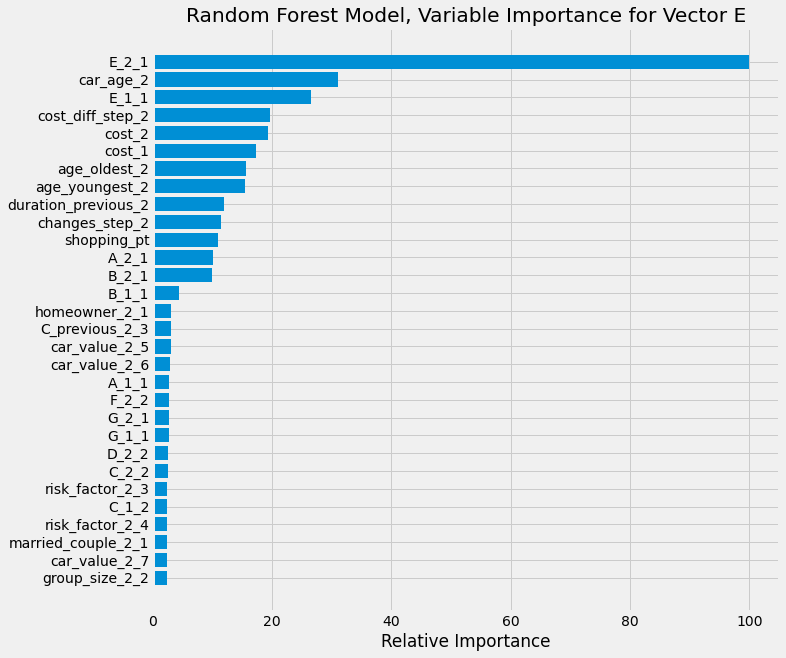

In [365]:
#Let's run the model with Best Parameters: {'n_estimators': 100}

vector = 'E'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators = 100, plot = True)


In [372]:
vector = 'E'
score_matrix = model_score_matrix(vector, 2, rf_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2394,216,8.28
cust_maintained_vector,96,12816,99.26


In [373]:
vector='E'
model = 'rf'

score = model_score_by_shopping_pt(vector, 2, rf_preds)

perf_q1q2.update(vector, 'no_model', 'overall', acc*100)
perf_q1q2.update(vector, model, 'overall', round(rf_ac*100,2))
perf_q1q2.update(vector, model, 'customer_type', score_matrix)
perf_q1q2.update(vector, model, 'shopping_pt', score)
perf_q1q2.compare(vector, model)
perf_q1q2.record[vector]


C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,no_model,rf,rf_vs_no_model
accuracy_overall,83.19,83.96,0.77
accuracy_cust_changed_vector,0,8.28,8.28
accuracy_cust_maintained_vector,100,99.26,-0.74
accuracy_shopping_pt_3,86.42,86.76,0.34
accuracy_shopping_pt_4,88.75,88.98,0.23
accuracy_shopping_pt_5,85.58,86.25,0.67
accuracy_shopping_pt_6,84.08,84.48,0.4
accuracy_shopping_pt_7,82.92,83.69,0.77
accuracy_shopping_pt_8,81.09,82.17,1.08
accuracy_shopping_pt_9,81.28,82.64,1.36


In [374]:
# model with Logistic Regression classifier

vector = 'E'

lr_ac, lr_f1, lr_probs, lr_preds = lr_predict(vector)


Logistic Regression for vector E
Accuracy = 0.8352, f1-score = 0.8346

Confusion Matrix - normalized
 [[0.8785 0.1215]
 [0.2161 0.7839]]
Confusion Matrix
 [[7401 1024]
 [1534 5563]]

Classification Report 
               precision    recall  f1-score   support

           0       0.83      0.88      0.85      8425
           1       0.84      0.78      0.81      7097

    accuracy                           0.84     15522
   macro avg       0.84      0.83      0.83     15522
weighted avg       0.84      0.84      0.83     15522


Area under ROC: 
 0.8907563316133494


C:\Users\amite\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [375]:
vector = 'E'
score_matrix = model_score_matrix(vector, 2, lr_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2489,121,4.64
cust_maintained_vector,69,12843,99.47


In [376]:
vector='E'
model = 'lr'

score = model_score_by_shopping_pt(vector, 2, lr_preds)

perf_q1q2.update(vector, 'no_model', 'overall', acc*100)
perf_q1q2.update(vector, model, 'overall', round(lr_ac*100,2))
perf_q1q2.update(vector, model, 'customer_type', score_matrix)
perf_q1q2.update(vector, model, 'shopping_pt', score)
perf_q1q2.compare(vector, model)
perf_q1q2.record[vector]

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,no_model,rf,rf_vs_no_model,lr,lr_vs_no_model
accuracy_overall,83.19,83.96,0.77,83.52,0.33
accuracy_cust_changed_vector,0,8.28,8.28,4.64,4.64
accuracy_cust_maintained_vector,100,99.26,-0.74,99.47,-0.53
accuracy_shopping_pt_3,86.42,86.76,0.34,86.31,-0.11
accuracy_shopping_pt_4,88.75,88.98,0.23,88.91,0.16
accuracy_shopping_pt_5,85.58,86.25,0.67,85.86,0.28
accuracy_shopping_pt_6,84.08,84.48,0.4,84.36,0.28
accuracy_shopping_pt_7,82.92,83.69,0.77,83.19,0.27
accuracy_shopping_pt_8,81.09,82.17,1.08,81.49,0.4
accuracy_shopping_pt_9,81.28,82.64,1.36,82.01,0.73


Gradient Boosting Classifier results for Vector E

Accuracy=0.840
f1-score=0.839
Confusion Matrix
 [[0.89 0.11]
 [0.22 0.78]]

Classification Report 
               precision    recall  f1-score   support

           0       0.83      0.89      0.86      8425
           1       0.86      0.78      0.82      7097

    accuracy                           0.84     15522
   macro avg       0.84      0.84      0.84     15522
weighted avg       0.84      0.84      0.84     15522


Area under ROC: 
 0.8962893921408678


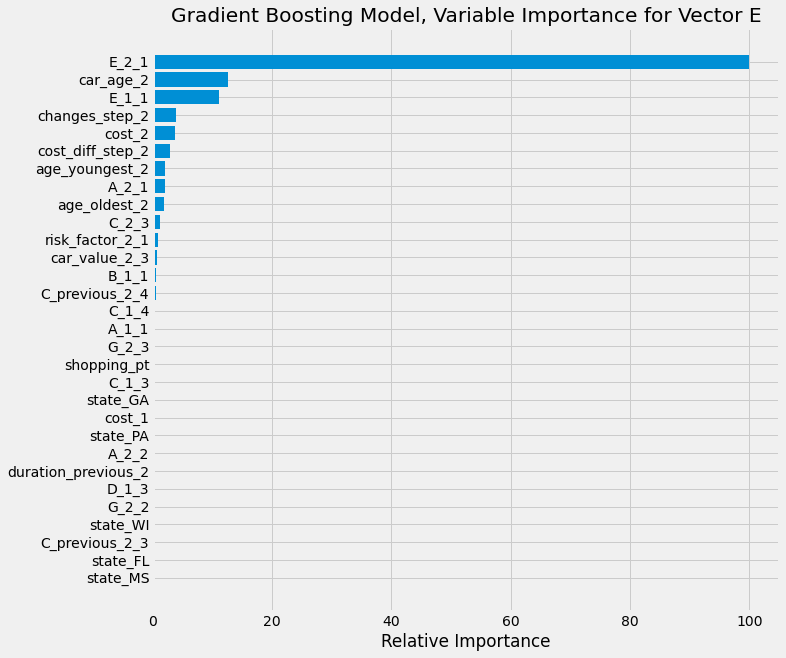

In [330]:
# model E with GradientBoosting classifier

vector = 'E'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 150, learning_rate = 0.25, max_depth = 3, \
                                         max_features = 6, plot=True)



In [341]:
from bayes_opt import BayesianOptimization

vector = 'E'

def gbm_eval(estimators, lrng_rate, max_d, max_f):
    
    gb = GradientBoostingClassifier(n_estimators = round(estimators), learning_rate = lrng_rate, \
                                    max_depth = round(max_d), max_features = round(max_f), random_state = 1)
    
    cv_result = cross_validate(gb, X_train.to_numpy(), y_train[vector].astype('int'), cv= 5)
    return np.mean(cv_result['test_score'])

gb_bo = BayesianOptimization(gbm_eval, {'estimators': (20, 200), 'lrng_rate': (0.05, 1), \
                                                'max_d': (1, 4), 'max_f': (2,8) })

gb_bo.maximize(n_iter=15, init_points=2)

|   iter    |  target   | estima... | lrng_rate |   max_d   |   max_f   |
-------------------------------------------------------------------------
|  1        |  0.8403   |  120.1    |  0.8081   |  2.958    |  4.365    |
|  2        |  0.837    |  103.2    |  0.2      |  1.02     |  6.092    |
|  3        |  0.838    |  58.13    |  0.982    |  1.263    |  4.659    |
|  4        |  0.8424   |  169.3    |  0.1971   |  3.306    |  6.265    |
|  5        |  0.8391   |  143.0    |  0.5588   |  3.987    |  7.719    |
|  6        |  0.8385   |  99.19    |  0.836    |  2.086    |  2.744    |
|  7        |  0.839    |  173.7    |  0.8416   |  2.963    |  4.689    |
|  8        |  0.8407   |  57.25    |  0.7485   |  1.549    |  7.205    |
|  9        |  0.832    |  144.5    |  0.932    |  3.894    |  5.983    |
|  10       |  0.8361   |  85.45    |  0.1008   |  1.892    |  4.504    |
|  11       |  0.8394   |  155.1    |  0.1585   |  2.443    |  6.269    |
|  12       |  0.8428   |  193.5    | 

So we got two models with very similar test_scores: 

* Test_Score: 0.8424, n_estimators = 169, learning_rate = 0.1971, max_depth = 3, max_features = 6
* Test_Score: 0.8428, n_estimators = 194, learning_rate = 0.7093, max_depth = 2, max_features = 6

Let's try both model to make predictions on the test set.


Gradient Boosting Classifier results for Vector E

Accuracy=0.839
f1-score=0.839
Confusion Matrix
 [[0.882 0.118]
 [0.211 0.789]]

Classification Report 
               precision    recall  f1-score   support

           0       0.83      0.88      0.86      8425
           1       0.85      0.79      0.82      7097

    accuracy                           0.84     15522
   macro avg       0.84      0.84      0.84     15522
weighted avg       0.84      0.84      0.84     15522


Area under ROC: 
 0.8961560135954131


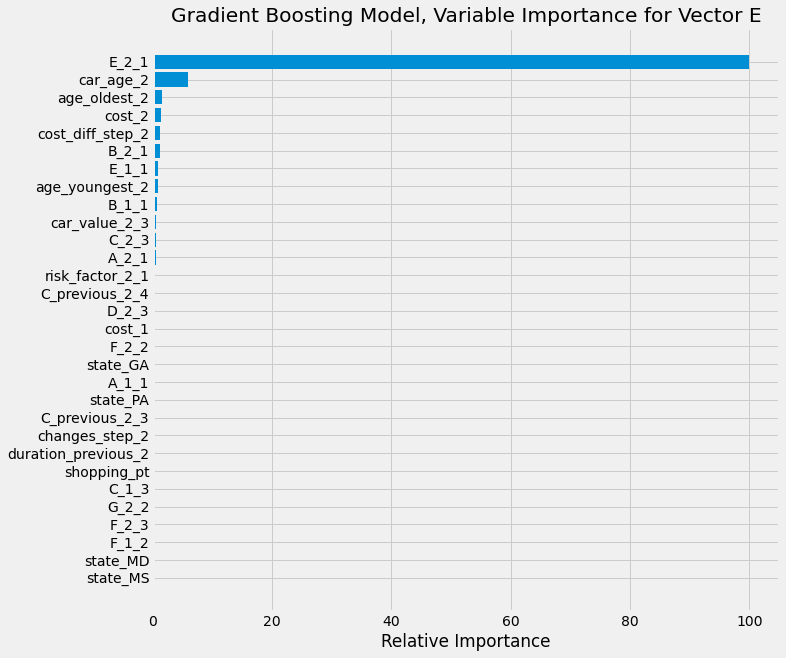

In [342]:
# Best GradientBoosting classifier for vector E

vector = 'E'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 194, learning_rate = 0.7093, max_depth = 2, \
                                         max_features = 6, plot=True)


The above model has a slightly lower accuracy score (0.839) vs the accuracy score (0.84) that we got in our base GB model.
Now let's try the second set of hyperparamters.

Gradient Boosting Classifier results for Vector E
Parameters: No. of Estimators = 169,  max_depth = 3,     learning_rate = 0.1971, max_features = 6
Accuracy=0.8395, f1-score=0.8386
Confusion Matrix - normalized
 [[0.8893 0.1107]
 [0.2197 0.7803]]
Confusion Matrix
 [[7492  933]
 [1559 5538]]

Classification Report 
               precision    recall  f1-score   support

           0       0.83      0.89      0.86      8425
           1       0.86      0.78      0.82      7097

    accuracy                           0.84     15522
   macro avg       0.84      0.83      0.84     15522
weighted avg       0.84      0.84      0.84     15522

30


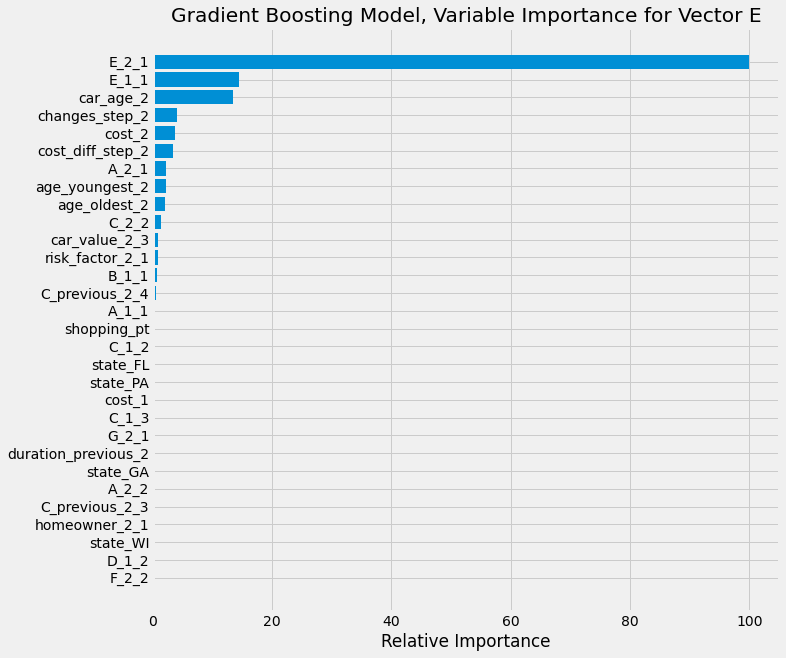

In [206]:
# 2nd Best GradientBoosting classifier (based on Bayesian Optimization) for vector E

vector = 'E'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 169, learning_rate = 0.1971, max_depth = 3, \
                                         max_features = 6, plot=True)



Both models based on Bayesian Optimization hyperparameters have slightly lower accuracy score (0.839) vs the accuracy score (0.84) that we got in our base GB model. Let's try couple of more hyperparamters setting - the hunch is to use base model, but only increase estimators from 150 to 200.

Gradient Boosting Classifier results for Vector E

Accuracy=0.840
f1-score=0.839
Confusion Matrix
 [[0.889 0.111]
 [0.218 0.782]]

Classification Report 
               precision    recall  f1-score   support

           0       0.83      0.89      0.86      8425
           1       0.86      0.78      0.82      7097

    accuracy                           0.84     15522
   macro avg       0.84      0.84      0.84     15522
weighted avg       0.84      0.84      0.84     15522


Area under ROC: 
 0.8972704059766969


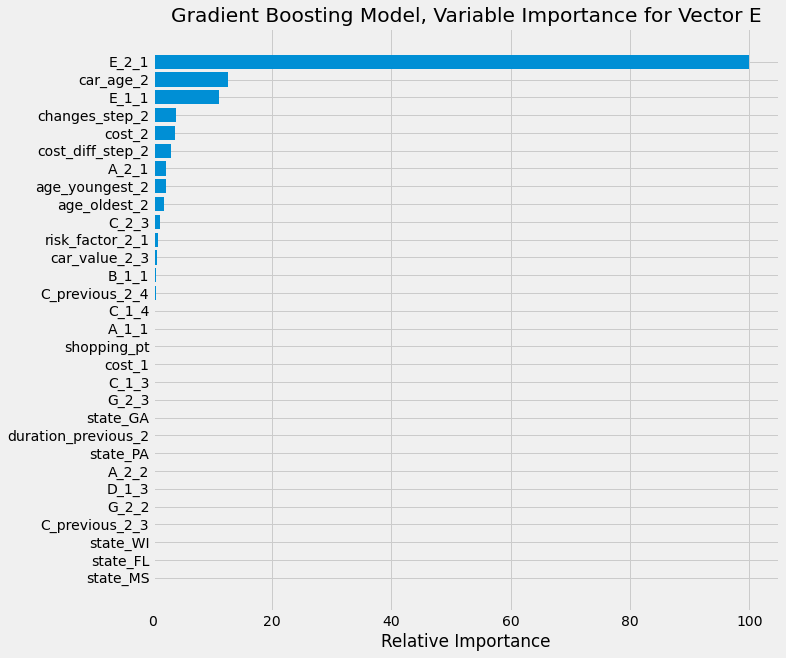

In [344]:
# Let's try another model based on our base model, and increase n_estimators from 150 to 200.
vector = 'E'
gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, max_depth = 3, \
                                         learning_rate = 0.25, max_features = 6, plot=True)


This model gives a slightly better auc of 0.8973 vs 0.8963 of base model. Now let's try to increase learning rate to 0.5 and check accuracy scores and auc.

Gradient Boosting Classifier results for Vector E
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.5, max_features = 6
Accuracy=0.841, f1-score=0.8403
Confusion Matrix - normalized
 [[0.8858 0.1142]
 [0.2122 0.7878]]
Confusion Matrix
 [[7463  962]
 [1506 5591]]

Classification Report 
               precision    recall  f1-score   support

           0       0.83      0.89      0.86      8425
           1       0.85      0.79      0.82      7097

    accuracy                           0.84     15522
   macro avg       0.84      0.84      0.84     15522
weighted avg       0.84      0.84      0.84     15522

30


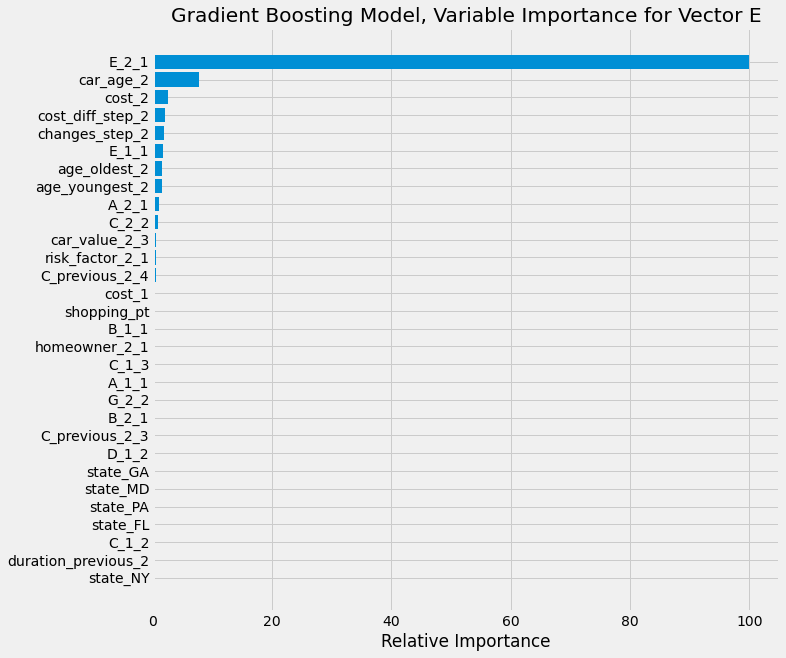

In [377]:
#Let's increase learning rate to 0.5 (BEST MODEL)

vector = 'E'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, learning_rate = 0.5, max_depth = 3, \
                                         max_features = 6, plot=True)


The accuracy score went up from 0.84 to 0.841! And a marginal increase in auc as well (0.89755).
LEt's try to go for 250 estimators and check the results.



In [378]:
vector = 'E'
score_matrix = model_score_matrix(vector, 2, gb_preds)
score_matrix


C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2304,306,11.72
cust_maintained_vector,164,12748,98.73


In [379]:
vector='E'
model = 'gb'

score = model_score_by_shopping_pt(vector, 2, gb_preds)

#perf_q1q2.update(vector, 'no_model', 'overall', acc*100)
perf_q1q2.update(vector, model, 'overall', round(gb_ac*100,2))
perf_q1q2.update(vector, model, 'customer_type', score_matrix)
perf_q1q2.update(vector, model, 'shopping_pt', score)
perf_q1q2.compare(vector, model)
perf_q1q2.record[vector]

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,no_model,rf,rf_vs_no_model,lr,lr_vs_no_model,gb,gb_vs_no_model
accuracy_overall,83.19,83.96,0.77,83.52,0.33,84.10,0.91
accuracy_cust_changed_vector,0,8.28,8.28,4.64,4.64,11.72,11.72
accuracy_cust_maintained_vector,100,99.26,-0.74,99.47,-0.53,98.73,-1.27
accuracy_shopping_pt_3,86.42,86.76,0.34,86.31,-0.11,86.53,0.11
accuracy_shopping_pt_4,88.75,88.98,0.23,88.91,0.16,89.14,0.39
accuracy_shopping_pt_5,85.58,86.25,0.67,85.86,0.28,86.63,1.05
accuracy_shopping_pt_6,84.08,84.48,0.4,84.36,0.28,84.80,0.72
accuracy_shopping_pt_7,82.92,83.69,0.77,83.19,0.27,83.69,0.77
accuracy_shopping_pt_8,81.09,82.17,1.08,81.49,0.4,82.57,1.48
accuracy_shopping_pt_9,81.28,82.64,1.36,82.01,0.73,82.48,1.2


In [353]:
#Let's run a base knn model for vector E

vector = 'E'

kn_ac, kn_f1, kn_probs, kn_preds = kn_predict(vector, n_neighbors=5)


KNN Model for Vector E: No. of Neighbors = 5
Accuracy=0.779
f1-score=0.779
Confusion Matrix
 [[0.79  0.21 ]
 [0.233 0.767]]

Classification Report 
               precision    recall  f1-score   support

           0       0.80      0.79      0.80      8425
           1       0.75      0.77      0.76      7097

    accuracy                           0.78     15522
   macro avg       0.78      0.78      0.78     15522
weighted avg       0.78      0.78      0.78     15522


Area under ROC: 
 0.8386927062841364


In [354]:
#Let's use Bayesian Optimization to find the best n_neighbors parameter

from bayes_opt import BayesianOptimization

vector = 'E'

def knn_eval(no_of_neighbors):
    
    knn = KNeighborsClassifier(n_neighbors= round(no_of_neighbors))
    
    cv_result = cross_validate(knn, X_train.to_numpy(), y_train[vector].astype('int'), cv= 5)
    return np.mean(cv_result['test_score'])

knn_bo = BayesianOptimization(knn_eval, {'no_of_neighbors': (1, 50)})

knn_bo.maximize(n_iter=10, init_points=2)

|   iter    |  target   | no_of_... |
-------------------------------------
|  1        |  0.8104   |  43.9     |
|  2        |  0.7203   |  1.628    |
|  3        |  0.8095   |  45.22    |
|  4        |  0.8086   |  27.66    |
|  5        |  0.8083   |  34.51    |
|  6        |  0.8044   |  20.52    |
|  7        |  0.8098   |  50.0     |
|  8        |  0.8087   |  39.32    |
|  9        |  0.8078   |  24.19    |
|  10       |  0.8077   |  31.12    |
|  11       |  0.8101   |  42.12    |
|  12       |  0.8092   |  43.17    |


In [355]:

knn_bo = BayesianOptimization(knn_eval, {'no_of_neighbors': (51, 100)})

knn_bo.maximize(n_iter=5, init_points=1)

|   iter    |  target   | no_of_... |
-------------------------------------
|  1        |  0.81     |  79.68    |
|  2        |  0.8085   |  97.24    |
|  3        |  0.81     |  86.41    |
|  4        |  0.8101   |  70.08    |
|  5        |  0.81     |  71.68    |
|  6        |  0.8105   |  59.86    |


Based on Bayesian Optimization, the best n_neighbors value is 60. Let's use this to train a model and predict vector E.

In [356]:
# knn model for vector E with n_neighbors = 60

vector = 'E'
knn = KNeighborsClassifier(n_neighbors=60)

knn.fit(X_train.to_numpy(), y_train[vector].astype('int'))

y_pred = knn.predict(X_test.to_numpy())
y_pred_prob = knn.predict_proba(X_test.to_numpy())
kn_probs = y_pred_prob[:,1]

ac = accuracy_score(y_test[vector].astype('int'), y_pred)

f1 = f1_score(y_test[vector].astype('int'), y_pred, average='weighted')
cm = np.around(confusion_matrix(y_test[vector].astype('int'), y_pred, normalize = 'true'), 3)

print(f'KNN Model for Vector {vector}: No. of Neighbors = 60' )

print('Accuracy=%.3f' % (ac))
print('f1-score=%.3f' % (f1))
print("Confusion Matrix\n", cm)

fpr_4, tpr_4, thresholds_4 = roc_curve(y_test[vector].astype('int'), kn_probs)
roc_auc4 = auc(fpr_4, tpr_4)

cr = classification_report(y_test[vector].astype('int'), y_pred)

print("\nClassification Report \n", cr)
print("\nArea under ROC: \n", roc_auc4)

KNN Model for Vector E: No. of Neighbors = 60
Accuracy=0.809
f1-score=0.809
Confusion Matrix
 [[0.837 0.163]
 [0.224 0.776]]

Classification Report 
               precision    recall  f1-score   support

           0       0.82      0.84      0.83      8425
           1       0.80      0.78      0.79      7097

    accuracy                           0.81     15522
   macro avg       0.81      0.81      0.81     15522
weighted avg       0.81      0.81      0.81     15522


Area under ROC: 
 0.8715034354383031


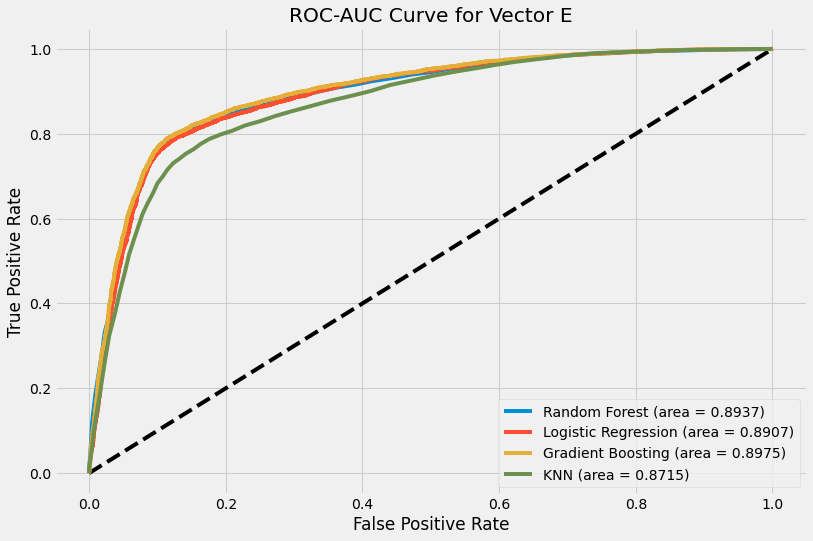

In [359]:
# Let's plot the ROC curve for all the models for vector E
plt.figure(figsize=(12,8))

plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_1, tpr_1, label='Random Forest (area = 0.8937)')
plt.plot(fpr_2, tpr_2, label='Logistic Regression (area = 0.8907)')
plt.plot(fpr_3, tpr_3, label='Gradient Boosting (area = 0.8975)')
plt.plot(fpr_4, tpr_4, label='KNN (area = 0.8715)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-AUC Curve for Vector '+vector)
plt.legend()
plt.show()


Best Threshold for Gradient Boost Model for Vector E = 0.4546
At Best Threshold, tpr =  0.8, fpr = 0.126


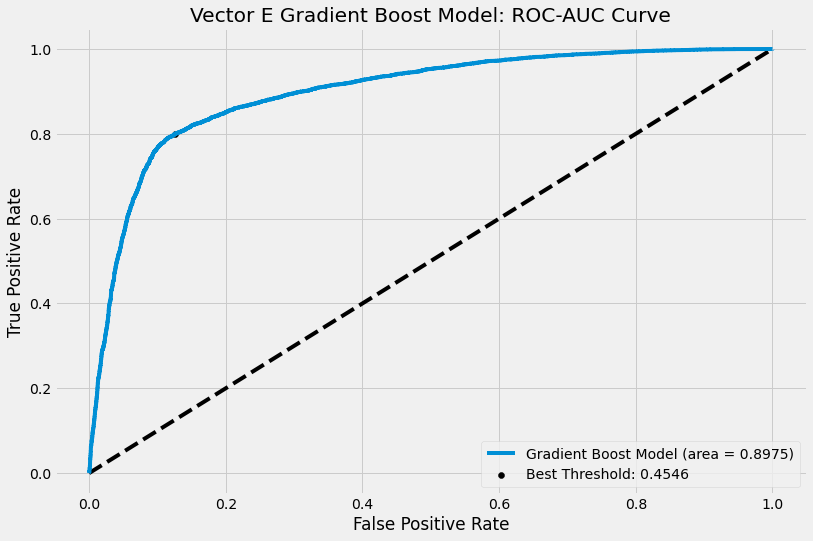

In [367]:
# Let's do thresholding for the best Model for vector E: Gradient Boost

plt.figure(figsize=(12,8))

Q_means_gb = np.sqrt(tpr_3*(1-fpr_3))
idx = np.argmax(Q_means_gb)

print(f'Best Threshold for Gradient Boost Model for Vector E = {thresholds_3[idx]:5.4}')
print(f'At Best Threshold, tpr = {tpr_3[idx]:4.3}, fpr = {fpr_3[idx]:4.3}')

plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_3, tpr_3, label='Gradient Boost Model (area = 0.8975)')
pyplot.scatter(fpr_3[idx], tpr_3[idx], marker='o', color='black', label='Best Threshold: '+str(np.round(thresholds_3[idx],4)))

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Vector E Gradient Boost Model: ROC-AUC Curve')
plt.legend()
plt.show()

Vector E Gradient Boost Model
Best Accuracy score of 0.8416 occurs for threshold = 0.493
Vector E Random Forest Model
Best Accuracy score of 0.8396 occurs for threshold = 0.501
Vector E XG Boost Model
Best Accuracy score of 0.8424 occurs for threshold = 0.505


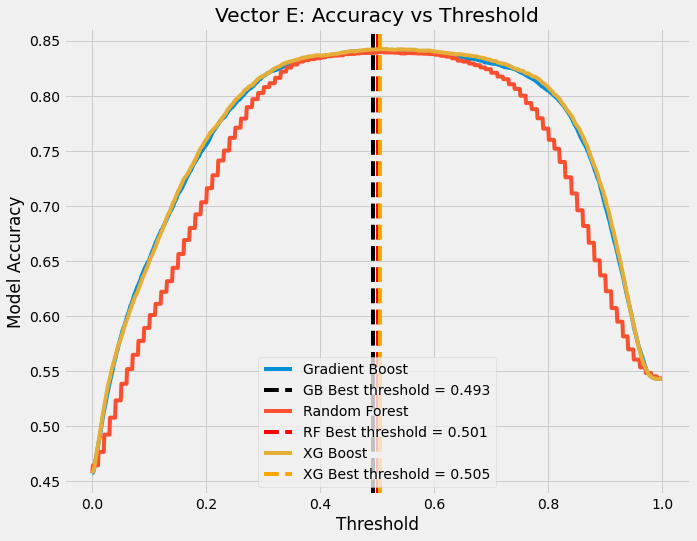

In [53]:
# We are concerned with accuracy of the model i.e. its ability to predict both the 0 and 1 labels correctly
# So we will calculate the accuracy score at different thresholds directly


plt.figure(figsize=(10,8))

def to_labels(pos_probs, threshold):
    return (pos_probs >= threshold).astype('int')

thresholds = np.arange(0, 1, 0.001)

# for gradient boost model
ac_score_gb = [accuracy_score(y_test[vector].astype('int'), to_labels(gb_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_gb)
print(f"Vector E Gradient Boost Model\nBest Accuracy score of {ac_score_gb[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_gb, label='Gradient Boost')
plt.axvline(thresholds[idx], color='black', linestyle="--", label = "GB Best threshold = "+str(np.round(thresholds[idx],4)))

# for random forest
thresholds = np.arange(0, 1, 0.001)
ac_score_rf = [accuracy_score(y_test[vector].astype('int'), to_labels(rf_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_rf)
print(f"Vector E Random Forest Model\nBest Accuracy score of {ac_score_rf[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_rf, label='Random Forest')
plt.axvline(thresholds[idx], color='red', linestyle="--", label = "RF Best threshold = "+str(np.round(thresholds[idx],4)))

# for XG Boost
thresholds = np.arange(0, 1, 0.001)
ac_score_xg = [accuracy_score(y_test[vector].astype('int'), to_labels(xg_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_xg)
print(f"Vector E XG Boost Model\nBest Accuracy score of {ac_score_xg[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_xg, label='XG Boost')
plt.axvline(thresholds[idx], color='orange', linestyle="--", label = "XG Best threshold = "+str(np.round(thresholds[idx],4)))

plt.xlabel('Threshold')
plt.ylabel('Model Accuracy')
plt.title('Vector E: Accuracy vs Threshold')

plt.legend()
plt.show()

In [ ]:
# Let's use RandomizedSearchCV to find the best XGB classifier Hyperparamters for vector E

import xgboost as xgb

from sklearn.model_selection import RandomizedSearchCV

vector = 'E'

param_grid = {'learning_rate' : [0.25, 0.3, 0.35, 0.5], 'n_estimators' : np.arange(100,501,100), \
              'colsample_bytree': [0.15,0.25,0.35,0.5], 'max_depth' : [3,4,5]}

clf = xgb.XGBClassifier(objective='binary:logistic', random_state=1, n_jobs=-1)

clf_cv = RandomizedSearchCV(clf, param_grid, n_iter = 60, verbose = 3, cv=4)

clf_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))

print(f"Vector {vector} RandomizedSearchCV: XG Boosting Model\nBest Score:" + str(clf_cv.best_score_))
print("\nBest Parameters: " + str(clf_cv.best_params_))

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=400;, score=0.841 total time=  14.9s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=400;, score=0.840 total time=  15.9s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=400;, score=0.839 total time=  16.2s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=400;, score=0.839 total time=  16.2s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=5, n_estimators=300;, score=0.840 total time=  11.8s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=5, n_estimators=300;, score=0.841 total time=  11.4s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=5, n_estimators=300;, score=0.840 total time=  12.3s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=5, n_estimators=300;, score=0.838 total time=  

In [ ]:
results = pd.DataFrame(clf_cv.cv_results_['params'])
results['train_score'] = clf_cv.cv_results_['mean_test_score']
results['train_rank'] = clf_cv.cv_results_['rank_test_score']
results = pd.read_csv('Modelling_data/xgboost_results_vectorE.csv')

In [6]:
import xgboost as xgb

vector = 'E'

print(f"XGBoost Classifier results for Vector {vector}\n")
#param_grid
for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    max_depth = row['max_depth']
    learning_rate = row['learning_rate']
    colsample_bytree = row['colsample_bytree']
        
    clf = xgb.XGBClassifier(max_depth=int(max_depth), objective='binary:logistic', n_estimators=int(n_estimators), \
                       learning_rate = learning_rate, colsample_bytree = colsample_bytree, n_jobs=-1, random_state=1)

    clf.fit(X_train.to_numpy(), y_train[vector].astype('int'))
    y_pred = clf.predict(X_test.to_numpy())
    y_pred_prob = clf.predict_proba(X_test.to_numpy())
    xg_probs = y_pred_prob[:,1]
    ac = accuracy_score(y_test[vector].astype('int'), y_pred)

    f1 = f1_score(y_test[vector].astype('int'), y_pred, average='weighted')
    cm = np.around(confusion_matrix(y_test[vector].astype('int'), y_pred, normalize = 'true'),3)
    cm1 = confusion_matrix(y_test[vector].astype('int'), y_pred)

    results.loc[i, 'test_score'] = ac
    results.loc[i, 'f1_score'] = f1
    
    print(f"Parameters: No. of Estimators = {n_estimators},  max_depth = {max_depth}, \
    learning_rate = {learning_rate}, colsample_bytree = {colsample_bytree}")

    print(f'Accuracy={ac:4.4}, f1_score={f1:4.4}')

results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
datapath="Modelling_data"
save_file(results,"xgboost_results_vectorE.csv",datapath)
results

XGBoost Classifier results for Vector E

Parameters: No. of Estimators = 400.0,  max_depth = 4.0,     learning_rate = 0.3, colsample_bytree = 0.5
Accuracy=0.8382, f1_score=0.8377
Parameters: No. of Estimators = 300.0,  max_depth = 5.0,     learning_rate = 0.25, colsample_bytree = 0.35
Accuracy=0.839, f1_score=0.8384
Parameters: No. of Estimators = 200.0,  max_depth = 4.0,     learning_rate = 0.3, colsample_bytree = 0.35
Accuracy=0.8404, f1_score=0.8398
Parameters: No. of Estimators = 400.0,  max_depth = 4.0,     learning_rate = 0.5, colsample_bytree = 0.25
Accuracy=0.8359, f1_score=0.8354
Parameters: No. of Estimators = 300.0,  max_depth = 5.0,     learning_rate = 0.25, colsample_bytree = 0.25
Accuracy=0.8387, f1_score=0.8382
Parameters: No. of Estimators = 400.0,  max_depth = 3.0,     learning_rate = 0.25, colsample_bytree = 0.5
Accuracy=0.842, f1_score=0.8414
Parameters: No. of Estimators = 300.0,  max_depth = 4.0,     learning_rate = 0.25, colsample_bytree = 0.15
Accuracy=0.8408, f1

Parameters: No. of Estimators = 300.0,  max_depth = 5.0,     learning_rate = 0.3, colsample_bytree = 0.15
Accuracy=0.8388, f1_score=0.8383


In [8]:
results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
results

,n_estimators,max_depth,learning_rate,colsample_bytree,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,400,4,0.30,0.50,0.839671,38,0.838165,0.837651,37.0,0.838918,42.0
1,300,5,0.25,0.35,0.839849,37,0.839003,0.838441,32.0,0.839426,37.0
2,200,4,0.30,0.35,0.842410,16,0.840356,0.839757,17.0,0.841383,17.0
3,400,4,0.50,0.25,0.834678,54,0.835910,0.835432,45.0,0.835294,53.0
4,300,5,0.25,0.25,0.841169,26,0.838745,0.838219,34.0,0.839957,29.0
5,400,3,0.25,0.50,0.843054,4,0.842031,0.841420,3.0,0.842542,1.0
6,300,4,0.25,0.15,0.842893,7,0.840807,0.840189,11.0,0.841850,9.0
7,200,4,0.50,0.25,0.839092,44,0.838230,0.837708,36.0,0.838661,43.0
8,100,5,0.50,0.35,0.838157,48,0.837328,0.836794,42.0,0.837742,48.0
9,400,3,0.50,0.35,0.838963,45,0.840291,0.839716,18.0,0.839627,35.0


In [10]:
datapath="Modelling_data"
save_file(results,"xgboost_results_vectorE.csv",datapath)

A file already exists with this name.

Do you want to overwrite? (Y/N)Y
Writing file.  "Modelling_data\xgboost_results_vectorE.csv"


XGBoost Classifier results for Vector E
Parameters: No. of Estimators = 400,  max_depth = 3,     learning_rate = 0.25, colsample_bytree = 0.5
Accuracy=0.842, f1-score=0.8414
Confusion Matrix - normalized
 [[0.8843 0.1157]
 [0.2081 0.7919]]
Confusion Matrix
 [[7450  975]
 [1477 5620]]

Classification Report 
               precision    recall  f1-score   support

           0       0.83      0.88      0.86      8425
           1       0.85      0.79      0.82      7097

    accuracy                           0.84     15522
   macro avg       0.84      0.84      0.84     15522
weighted avg       0.84      0.84      0.84     15522

30


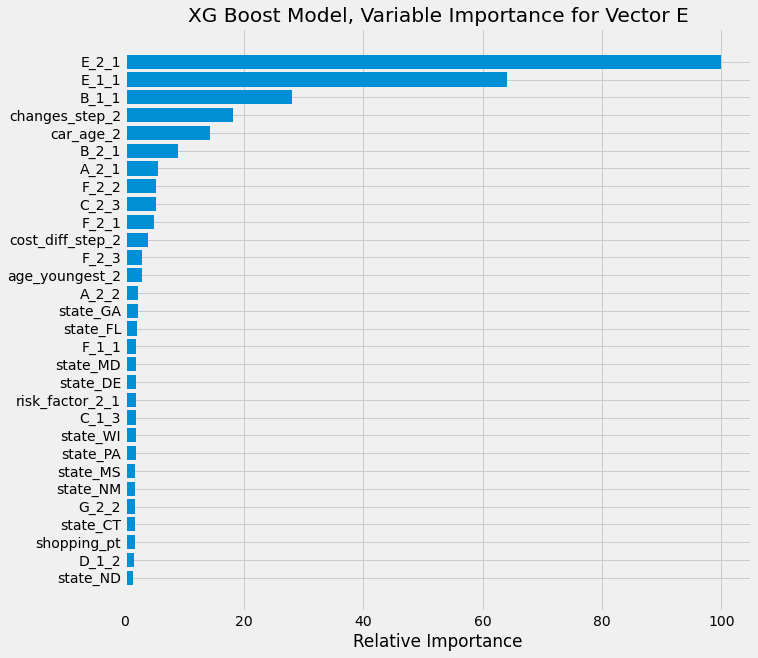

In [380]:
# model E with XGBoost classifier Best Parameters: Iteration 5 (above)

vector = 'E'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators = 400, max_depth = 3, \
                                         learning_rate = 0.25, colsample_bytree = 0.5, plot=True)


In [381]:
vector = 'E'
score_matrix = model_score_matrix(vector, 2, xg_preds)
score_matrix


C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2280,330,12.64
cust_maintained_vector,172,12740,98.67


In [382]:
vector='E'
model = 'xg'

score = model_score_by_shopping_pt(vector, 2, xg_preds)

#perf_q1q2.update(vector, 'no_model', 'overall', acc*100)
perf_q1q2.update(vector, model, 'overall', round(xg_ac*100,2))
perf_q1q2.update(vector, model, 'customer_type', score_matrix)
perf_q1q2.update(vector, model, 'shopping_pt', score)
perf_q1q2.compare(vector, model)
perf_q1q2.record[vector]


C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,no_model,rf,rf_vs_no_model,lr,lr_vs_no_model,gb,gb_vs_no_model,xg,xg_vs_no_model
accuracy_overall,83.19,83.96,0.77,83.52,0.33,84.10,0.91,84.20,1.01
accuracy_cust_changed_vector,0,8.28,8.28,4.64,4.64,11.72,11.72,12.64,12.64
accuracy_cust_maintained_vector,100,99.26,-0.74,99.47,-0.53,98.73,-1.27,98.67,-1.33
accuracy_shopping_pt_3,86.42,86.76,0.34,86.31,-0.11,86.53,0.11,86.42,0.0
accuracy_shopping_pt_4,88.75,88.98,0.23,88.91,0.16,89.14,0.39,88.91,0.16
accuracy_shopping_pt_5,85.58,86.25,0.67,85.86,0.28,86.63,1.05,86.69,1.11
accuracy_shopping_pt_6,84.08,84.48,0.4,84.36,0.28,84.80,0.72,84.76,0.68
accuracy_shopping_pt_7,82.92,83.69,0.77,83.19,0.27,83.69,0.77,83.39,0.47
accuracy_shopping_pt_8,81.09,82.17,1.08,81.49,0.4,82.57,1.48,82.68,1.59
accuracy_shopping_pt_9,81.28,82.64,1.36,82.01,0.73,82.48,1.2,83.26,1.98


In [115]:
perf_models_q1q2['E'].drop(['accuracy_shopping_pt_cust_maintained_vector'], axis=0,inplace=True)
perf_models_q1q2['E']


,no_model,rf,rf_vs_no_model,lr,lr_vs_no_model,gb,gb_vs_no_model,xg,xg_vs_no_model
accuracy_overall,83.19,83.96,0.77,83.52,0.33,84.10,0.91,84.20,1.01
accuracy_cust_changed_vector,0,8.28,8.28,4.64,4.64,11.72,11.72,12.64,12.64
accuracy_cust_maintained_vector,100,99.26,-0.74,99.47,-0.53,98.73,-1.27,98.67,-1.33
accuracy_shopping_pt_3,86.42,86.76,0.34,86.31,-0.11,86.53,0.11,86.42,0.0
accuracy_shopping_pt_4,88.75,88.98,0.23,88.91,0.16,89.14,0.39,88.91,0.16
accuracy_shopping_pt_5,85.58,86.25,0.67,85.86,0.28,86.63,1.05,86.69,1.11
accuracy_shopping_pt_6,84.08,84.48,0.4,84.36,0.28,84.80,0.72,84.76,0.68
accuracy_shopping_pt_7,82.92,83.69,0.77,83.19,0.27,83.69,0.77,83.39,0.47
accuracy_shopping_pt_8,81.09,82.17,1.08,81.49,0.4,82.57,1.48,82.68,1.59
accuracy_shopping_pt_9,81.28,82.64,1.36,82.01,0.73,82.48,1.2,83.26,1.98


C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3934441024.py:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(labels)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3934441024.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(labels)


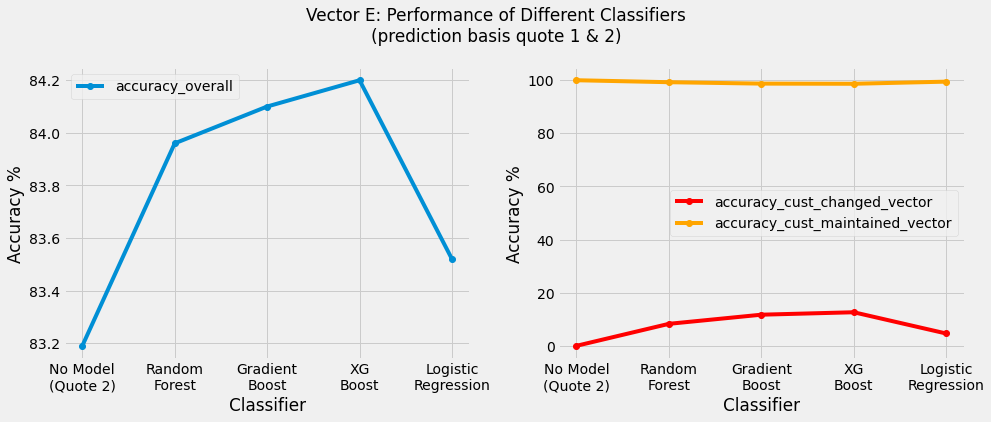

ValueError: Length of values (11) does not match length of index (13)

In [522]:
vector = 'E'
models = ['no_model', 'rf', 'gb', 'xg', 'lr']
#models = ['no_model', 'rf', 'gb', 'xg']
quotes = [1,2]
model_performance_plot(vector, models, quotes, "overall")
model_performance_plot(vector, models, quotes, "shopping_pt")

## Quote 1 & 2 : Predict C

Random Forest Classifier results for Vector C

Accuracy=0.832
f1-score=0.831
Confusion Matrix - Normalized
 [[0.842 0.074 0.08  0.005]
 [0.122 0.75  0.12  0.008]
 [0.045 0.046 0.882 0.027]
 [0.037 0.016 0.171 0.776]]
Confusion Matrix
 [[3959  346  376   22]
 [ 395 2427  387   26]
 [ 273  279 5336  162]
 [  56   25  263 1190]]

Classification Report 
               precision    recall  f1-score   support

           1       0.85      0.84      0.84      4703
           2       0.79      0.75      0.77      3235
           3       0.84      0.88      0.86      6050
           4       0.85      0.78      0.81      1534

    accuracy                           0.83     15522
   macro avg       0.83      0.81      0.82     15522
weighted avg       0.83      0.83      0.83     15522

30


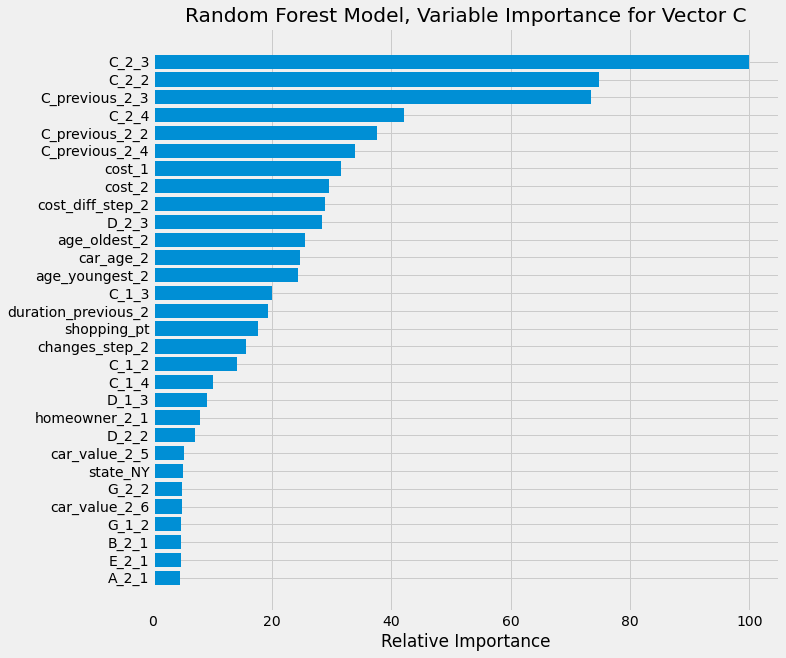

In [401]:
# Let's run the model for vector C
 
vector = 'C'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, plot = True)



In [385]:
#test_set = df_train_first2.iloc[y_test.index,:]

vector = 'C'

x = pd.crosstab(test_set['C'], test_set['C_2'])

same_as_2 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 

acc = np.around(np.sum(same_as_2)/y_test.shape[0], 4)

print(f"Accuracy based on simply predicting vector {vector} = {vector}_2 : {(np.sum(same_as_2)/y_test.shape[0]): 4.4}")

Accuracy based on simply predicting vector C = C_2 :  0.804


In [400]:

x['total'] = x.sum(axis=1)
x['C1_%'] = np.around(x[1]*100 / x['total'], 2)
x['C2_%'] = np.around(x[2]*100 / x['total'], 2)
x['C3_%'] = np.around(x[3]*100 / x['total'], 2)
x['C4_%'] = np.around(x[4]*100 / x['total'], 2)

x


C_2,1,2,3,4,total,C1_%,C2_%,C3_%,C4_%
C,,,,,,,,,
1,3826,348,513,16,4703,81.35,7.40,10.91,0.34
2,422,2309,480,24,3235,13.04,71.38,14.84,0.74
3,386,286,5257,121,6050,6.38,4.73,86.89,2.00
4,97,36,314,1087,1534,6.32,2.35,20.47,70.86


In [413]:
vector = 'C'

def rf_eval(estimators, min_leaf, min_split):
    
    rf = RandomForestClassifier(n_estimators = round(estimators), min_samples_leaf = round(min_leaf), \
                                    min_samples_split = round(min_split), random_state = 1, n_jobs=-1)
    
    cv_result = cross_validate(rf, X_train.to_numpy(), y_train[vector].astype('int'), cv= 4)
    return np.mean(cv_result['test_score'])

rf_bo = BayesianOptimization(rf_eval, {'estimators': (100, 1000), 'min_leaf': (1, 5), 'min_split': (2, 6)})

rf_bo.maximize(n_iter=10, init_points=2)


|   iter    |  target   | estima... | min_leaf  | min_split |
-------------------------------------------------------------
|  1        |  0.8316   |  239.3    |  2.743    |  3.575    |
|  2        |  0.832    |  598.0    |  3.308    |  4.555    |
|  3        |  0.8309   |  599.0    |  3.973    |  4.056    |
|  4        |  0.8333   |  418.0    |  1.617    |  4.883    |
|  5        |  0.8327   |  817.0    |  2.423    |  5.577    |
|  6        |  0.8333   |  418.1    |  2.153    |  4.554    |
|  7        |  0.8331   |  416.7    |  2.439    |  5.695    |
|  8        |  0.8338   |  416.9    |  1.45     |  2.981    |
|  9        |  0.832    |  415.3    |  3.379    |  2.351    |
|  10       |  0.8338   |  418.8    |  1.31     |  2.379    |
|  11       |  0.8331   |  421.4    |  2.5      |  2.588    |
|  12       |  0.8336   |  593.7    |  1.942    |  5.29     |


Random Forest Classifier results for Vector C
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 5
Accuracy=0.8323, f1-score=0.8316
Confusion Matrix - normalized
 [[0.8416 0.0734 0.0804 0.0047]
 [0.1218 0.7518 0.1181 0.0083]
 [0.0451 0.0455 0.8821 0.0273]
 [0.0352 0.0163 0.1714 0.7771]]
Confusion Matrix
 [[3958  345  378   22]
 [ 394 2432  382   27]
 [ 273  275 5337  165]
 [  54   25  263 1192]]

Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.84      0.84      4703
           1       0.79      0.75      0.77      3235
           2       0.84      0.88      0.86      6050
           3       0.85      0.78      0.81      1534

    accuracy                           0.83     15522
   macro avg       0.83      0.81      0.82     15522
weighted avg       0.83      0.83      0.83     15522

30


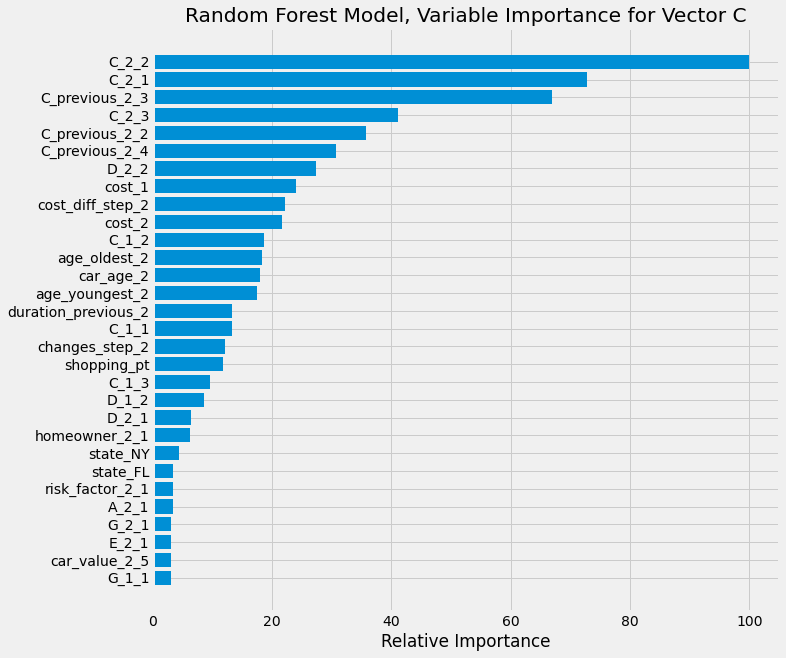

In [383]:

vector = 'C'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=300, min_samples_leaf = 1, \
                                                   min_samples_split = 5, plot = True)



In [384]:
vector = 'C'
score_matrix = model_score_matrix(vector, 2, rf_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2396,647,21.26
cust_maintained_vector,207,12272,98.34


In [386]:
vector='C'
model = 'rf'

score = model_score_by_shopping_pt(vector, 2, rf_preds)

perf_q1q2.update(vector, 'no_model', 'overall', acc*100)
perf_q1q2.update(vector, model, 'overall', round(rf_ac*100,2))
perf_q1q2.update(vector, model, 'customer_type', score_matrix)
perf_q1q2.update(vector, model, 'shopping_pt', score)
perf_q1q2.compare(vector, model)
perf_q1q2.record[vector]

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,no_model,rf,rf_vs_no_model
accuracy_overall,80.4,83.23,2.83
accuracy_cust_changed_vector,0,21.26,21.26
accuracy_cust_maintained_vector,100,98.34,-1.66
accuracy_shopping_pt_3,85.19,87.09,1.9
accuracy_shopping_pt_4,87.19,87.97,0.78
accuracy_shopping_pt_5,83.19,85.69,2.5
accuracy_shopping_pt_6,81.84,84.92,3.08
accuracy_shopping_pt_7,81.2,83.52,2.32
accuracy_shopping_pt_8,77.03,80.72,3.69
accuracy_shopping_pt_9,77.84,80.92,3.08


Gradient Boosting Classifier results for Vector C

Parameters: No. of Estimators = 150,  learning_rate = 0.25, max_depth = 3, max_features = 6

Accuracy=0.829
f1-score=0.828
Confusion Matrix - Normalized
 [[0.843 0.07  0.081 0.005]
 [0.124 0.737 0.129 0.009]
 [0.044 0.047 0.878 0.031]
 [0.029 0.016 0.172 0.783]]
Confusion Matrix
 [[3966  331  383   23]
 [ 402 2385  418   30]
 [ 268  284 5311  187]
 [  44   25  264 1201]]

Classification Report 
               precision    recall  f1-score   support

           1       0.85      0.84      0.85      4703
           2       0.79      0.74      0.76      3235
           3       0.83      0.88      0.85      6050
           4       0.83      0.78      0.81      1534

    accuracy                           0.83     15522
   macro avg       0.83      0.81      0.82     15522
weighted avg       0.83      0.83      0.83     15522



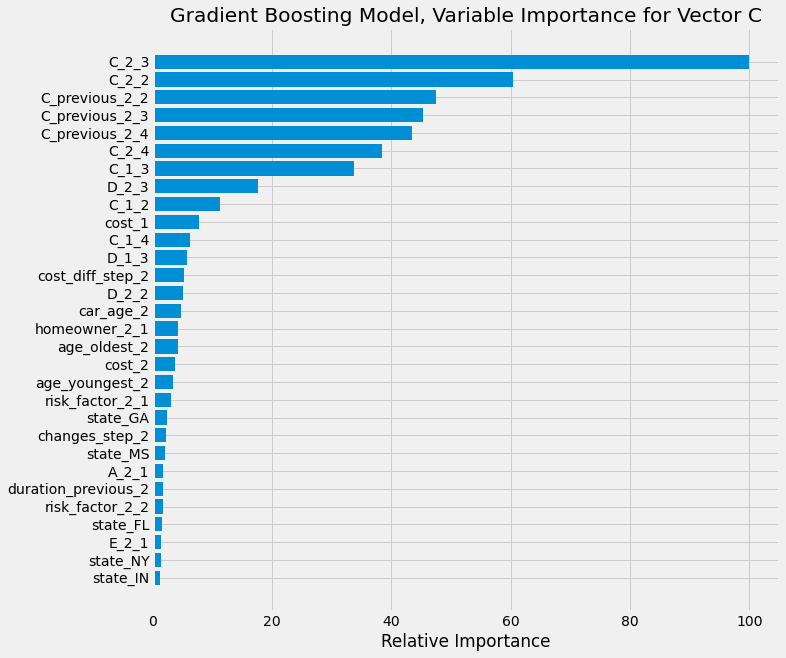

In [407]:
# model C with GradientBoosting classifier

vector = 'C'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 150, max_features = 6, \
                                                   max_depth = 3, learning_rate = 0.25, plot = True)


In [403]:
# Let's use RandomizedSearchCV to find the best GradientBoosting classifier Hyperparamters for vector C

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV

vector = 'C'

param_grid = {'learning_rate' : [0.25, 0.5, 0.75, 1], 'n_estimators' : [50, 100, 150, 200], \
              'max_features': [2,4,6,8], 'max_depth' : [1,2,3]}

gb = GradientBoostingClassifier(random_state = 1, n_jobs=-1)

gb_cv = RandomizedSearchCV(gb, param_grid, n_iter = 10, verbose = 3, cv=5)

gb_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))

print(f"Vector {vector} RandomizedSearchCV: Gradient Boosting Model\nBest Score:" + str(gb_cv.best_score_))
print("\nBest Parameters: " + str(gb_cv.best_params_))


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END learning_rate=0.5, max_depth=2, max_features=4, n_estimators=150;, score=0.830 total time=  30.7s
[CV 2/5] END learning_rate=0.5, max_depth=2, max_features=4, n_estimators=150;, score=0.828 total time=  30.1s
[CV 3/5] END learning_rate=0.5, max_depth=2, max_features=4, n_estimators=150;, score=0.829 total time=  31.7s
[CV 4/5] END learning_rate=0.5, max_depth=2, max_features=4, n_estimators=150;, score=0.828 total time=  30.8s
[CV 5/5] END learning_rate=0.5, max_depth=2, max_features=4, n_estimators=150;, score=0.825 total time=  30.3s
[CV 1/5] END learning_rate=0.25, max_depth=3, max_features=6, n_estimators=150;, score=0.831 total time=  44.6s
[CV 2/5] END learning_rate=0.25, max_depth=3, max_features=6, n_estimators=150;, score=0.833 total time=  43.2s
[CV 3/5] END learning_rate=0.25, max_depth=3, max_features=6, n_estimators=150;, score=0.831 total time=  42.9s
[CV 4/5] END learning_rate=0.25, max_depth=3, ma

In [404]:
vector = 'C'

param_grid = {'learning_rate' : [0.25, 0.4, 0.5], 'n_estimators' : [150, 200], \
              'max_features': [6,8,10], 'max_depth' : [3, 4]}

gb = GradientBoostingClassifier(random_state = 1)

gb_cv = RandomizedSearchCV(gb, param_grid, n_iter = 10, verbose = 3, cv=4)

gb_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))

print(f"Vector {vector} RandomizedSearchCV: Gradient Boosting Model\nBest Score:" + str(gb_cv.best_score_))
print("\nBest Parameters: " + str(gb_cv.best_params_))


Fitting 4 folds for each of 10 candidates, totalling 40 fits
[CV 1/4] END learning_rate=0.25, max_depth=3, max_features=6, n_estimators=200;, score=0.833 total time=  45.7s
[CV 2/4] END learning_rate=0.25, max_depth=3, max_features=6, n_estimators=200;, score=0.836 total time=  47.8s
[CV 3/4] END learning_rate=0.25, max_depth=3, max_features=6, n_estimators=200;, score=0.830 total time=  47.2s
[CV 4/4] END learning_rate=0.25, max_depth=3, max_features=6, n_estimators=200;, score=0.832 total time=  47.6s
[CV 1/4] END learning_rate=0.4, max_depth=3, max_features=8, n_estimators=150;, score=0.832 total time=  40.9s
[CV 2/4] END learning_rate=0.4, max_depth=3, max_features=8, n_estimators=150;, score=0.834 total time=  40.2s
[CV 3/4] END learning_rate=0.4, max_depth=3, max_features=8, n_estimators=150;, score=0.829 total time=  40.5s
[CV 4/4] END learning_rate=0.4, max_depth=3, max_features=8, n_estimators=150;, score=0.830 total time=  40.7s
[CV 1/4] END learning_rate=0.25, max_depth=4, m

In [406]:
vector = 'C'

param_grid = {'learning_rate' : [0.2, 0.25, 0.3], 'n_estimators' : [200], \
              'max_features': [6,8], 'max_depth' : [3]}

gb = GradientBoostingClassifier(random_state = 1)

gb_cv = RandomizedSearchCV(gb, param_grid, n_iter = 6, verbose = 3, cv=4)

gb_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))

print(f"Vector {vector} RandomizedSearchCV: Gradient Boosting Model\nBest Score:" + str(gb_cv.best_score_))
print("\nBest Parameters: " + str(gb_cv.best_params_))

Fitting 4 folds for each of 6 candidates, totalling 24 fits
[CV 1/4] END learning_rate=0.2, max_depth=3, max_features=6, n_estimators=200;, score=0.834 total time=  45.4s
[CV 2/4] END learning_rate=0.2, max_depth=3, max_features=6, n_estimators=200;, score=0.834 total time=  47.5s
[CV 3/4] END learning_rate=0.2, max_depth=3, max_features=6, n_estimators=200;, score=0.828 total time=  48.3s
[CV 4/4] END learning_rate=0.2, max_depth=3, max_features=6, n_estimators=200;, score=0.831 total time=  48.3s
[CV 1/4] END learning_rate=0.2, max_depth=3, max_features=8, n_estimators=200;, score=0.832 total time=  54.0s
[CV 2/4] END learning_rate=0.2, max_depth=3, max_features=8, n_estimators=200;, score=0.835 total time=  52.8s
[CV 3/4] END learning_rate=0.2, max_depth=3, max_features=8, n_estimators=200;, score=0.830 total time=  55.9s
[CV 4/4] END learning_rate=0.2, max_depth=3, max_features=8, n_estimators=200;, score=0.834 total time=  53.9s
[CV 1/4] END learning_rate=0.25, max_depth=3, max_fe

Gradient Boosting Classifier results for Vector C

Parameters: No. of Estimators = 200,  learning_rate = 0.25, max_depth = 3, max_features = 6

Accuracy=0.830
f1-score=0.829
Confusion Matrix - Normalized
 [[0.842 0.072 0.081 0.005]
 [0.124 0.742 0.125 0.009]
 [0.043 0.048 0.879 0.031]
 [0.025 0.016 0.171 0.788]]
Confusion Matrix
 [[3961  339  379   24]
 [ 400 2401  405   29]
 [ 259  289 5315  187]
 [  39   24  262 1209]]

Classification Report 
               precision    recall  f1-score   support

           1       0.85      0.84      0.85      4703
           2       0.79      0.74      0.76      3235
           3       0.84      0.88      0.86      6050
           4       0.83      0.79      0.81      1534

    accuracy                           0.83     15522
   macro avg       0.83      0.81      0.82     15522
weighted avg       0.83      0.83      0.83     15522



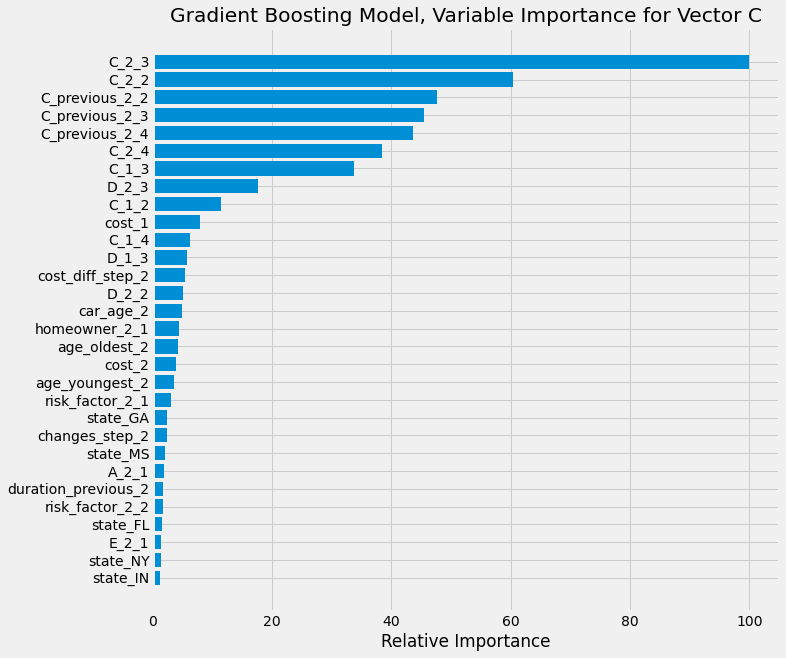

In [408]:
# model C with GradientBoosting classifier
# Best Parameters: {'n_estimators': 200, 'max_features': 6, 'max_depth': 3, 'learning_rate': 0.25}

vector = 'C'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, max_features = 6, \
                                                   max_depth = 3, learning_rate = 0.25, plot = True)



Gradient Boosting Classifier results for Vector C
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.25, max_features = 8
Accuracy=0.8322, f1-score=0.8314
Confusion Matrix - normalized
 [[0.8475 0.0697 0.0774 0.0053]
 [0.1255 0.741  0.1246 0.009 ]
 [0.0436 0.0453 0.8798 0.0312]
 [0.0254 0.0163 0.1688 0.7894]]
Confusion Matrix
 [[3986  328  364   25]
 [ 406 2397  403   29]
 [ 264  274 5323  189]
 [  39   25  259 1211]]

Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.85      0.85      4703
           1       0.79      0.74      0.77      3235
           2       0.84      0.88      0.86      6050
           3       0.83      0.79      0.81      1534

    accuracy                           0.83     15522
   macro avg       0.83      0.81      0.82     15522
weighted avg       0.83      0.83      0.83     15522

30


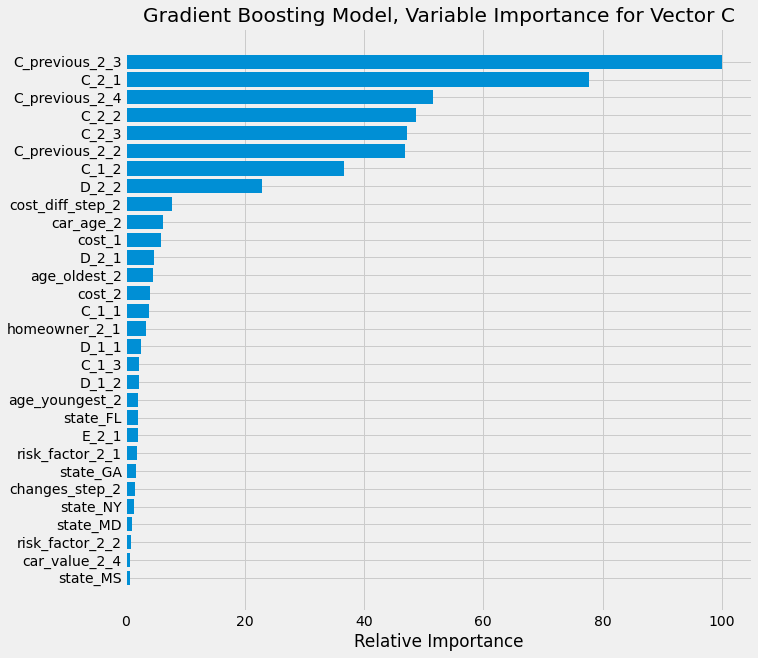

In [387]:
# model C with GradientBoosting classifier
# Best Parameters: {'n_estimators': 200, 'max_features': 8, 'max_depth': 3, 'learning_rate': 0.25}

vector = 'C'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, max_features = 8, \
                                                   max_depth = 3, learning_rate = 0.25, plot = True)



Notes for Vector C:
* changing l_rate from 0.25 to 0.2/0.3/0.4 reduced score marginally


In [388]:
vector = 'C'
score_matrix = model_score_matrix(vector, 2, gb_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2231,812,26.68
cust_maintained_vector,374,12105,97.00


In [389]:
vector='C'
model = 'gb'

score = model_score_by_shopping_pt(vector, 2, gb_preds)

#perf_q1q2.update(vector, 'no_model', 'overall', acc*100)
perf_q1q2.update(vector, model, 'overall', round(gb_ac*100,2))
perf_q1q2.update(vector, model, 'customer_type', score_matrix)
perf_q1q2.update(vector, model, 'shopping_pt', score)
perf_q1q2.compare(vector, model)
perf_q1q2.record[vector]

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,no_model,rf,rf_vs_no_model,gb,gb_vs_no_model
accuracy_overall,80.4,83.23,2.83,83.22,2.82
accuracy_cust_changed_vector,0,21.26,21.26,26.68,26.68
accuracy_cust_maintained_vector,100,98.34,-1.66,97.00,-3.0
accuracy_shopping_pt_3,85.19,87.09,1.9,86.53,1.34
accuracy_shopping_pt_4,87.19,87.97,0.78,88.05,0.86
accuracy_shopping_pt_5,83.19,85.69,2.5,85.58,2.39
accuracy_shopping_pt_6,81.84,84.92,3.08,84.96,3.12
accuracy_shopping_pt_7,81.2,83.52,2.32,82.85,1.65
accuracy_shopping_pt_8,77.03,80.72,3.69,80.91,3.88
accuracy_shopping_pt_9,77.84,80.92,3.08,81.44,3.6


In [77]:
# Let's use RandomizedSearchCV to find the best XGB classifier Hyperparamters for vector C

import xgboost as xgb

from sklearn.model_selection import RandomizedSearchCV

vector = 'C'

param_grid = {'learning_rate' : [0.25, 0.3, 0.35, 0.5], 'n_estimators' : np.arange(100,501,100), \
              'colsample_bytree': [0.15,0.25,0.35,0.5], 'max_depth' : [3,4,5]}

clf = xgb.XGBClassifier(objective='binary:logistic', random_state=1, n_jobs=-1)

clf_cv = RandomizedSearchCV(clf, param_grid, n_iter = 60, verbose = 3, cv=4)

clf_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))

print(f"Vector {vector} RandomizedSearchCV: XG Boosting Model\nBest Score:" + str(clf_cv.best_score_))
print("\nBest Parameters: " + str(clf_cv.best_params_))


Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=4, n_estimators=100;, score=0.835 total time=   5.3s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=4, n_estimators=100;, score=0.837 total time=   5.0s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=4, n_estimators=100;, score=0.831 total time=   5.0s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=4, n_estimators=100;, score=0.833 total time=   5.3s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.834 total time=  28.2s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.835 total time=  30.0s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.830 total time=  30.5s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.831 total time=  

[CV 2/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=5, n_estimators=100;, score=0.836 total time=  10.3s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=5, n_estimators=100;, score=0.831 total time=  10.2s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=5, n_estimators=100;, score=0.833 total time=  10.0s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=4, n_estimators=500;, score=0.835 total time=  30.3s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=4, n_estimators=500;, score=0.834 total time=  37.1s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=4, n_estimators=500;, score=0.831 total time=  54.5s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=4, n_estimators=500;, score=0.832 total time=  51.4s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=5, n_estimators=300;, score=0.826 total time=  33.9s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.

[CV 4/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=4, n_estimators=400;, score=0.830 total time=  31.4s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=3, n_estimators=400;, score=0.836 total time=  15.4s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=3, n_estimators=400;, score=0.836 total time=  15.8s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=3, n_estimators=400;, score=0.832 total time=  16.0s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=3, n_estimators=400;, score=0.832 total time=  16.3s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=3, n_estimators=400;, score=0.834 total time=  12.4s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=3, n_estimators=400;, score=0.838 total time=  12.3s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=3, n_estimators=400;, score=0.832 total time=  12.3s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.3, m

[CV 2/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=5, n_estimators=200;, score=0.837 total time=  15.6s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=5, n_estimators=200;, score=0.833 total time=  15.0s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=5, n_estimators=200;, score=0.834 total time=  15.9s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.834 total time=  25.7s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.836 total time=  23.7s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.829 total time=  24.7s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.830 total time=  23.3s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=4, n_estimators=100;, score=0.833 total time=   4.0s
[CV 2/4] END colsample_bytree=0.15, learning_rate

In [78]:
results = pd.DataFrame(clf_cv.cv_results_['params'])
results['train_score'] = clf_cv.cv_results_['mean_test_score']
results['train_rank'] = clf_cv.cv_results_['rank_test_score']

save_file(results, 'xgboost_results_vectorC.csv', datapath)

Writing file.  "Modelling_data\xgboost_results_vectorC.csv"


In [79]:
import xgboost as xgb

vector = 'C'

print(f"XGBoost Classifier results for Vector {vector}\n")
#param_grid
for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    max_depth = row['max_depth']
    learning_rate = row['learning_rate']
    colsample_bytree = row['colsample_bytree']
        
    clf = xgb.XGBClassifier(max_depth=int(max_depth), objective='multi:softprob', n_estimators=int(n_estimators), \
                       learning_rate = learning_rate, colsample_bytree = colsample_bytree, n_jobs=-1, random_state=1)

    clf.fit(X_train.to_numpy(), y_train[vector].astype('int'))
    y_pred = clf.predict(X_test.to_numpy())
    y_pred_prob = clf.predict_proba(X_test.to_numpy())
    xg_probs = y_pred_prob[:,1]
    ac = accuracy_score(y_test[vector].astype('int'), y_pred)

    f1 = f1_score(y_test[vector].astype('int'), y_pred, average='weighted')
    cm = np.around(confusion_matrix(y_test[vector].astype('int'), y_pred, normalize = 'true'),3)
    cm1 = confusion_matrix(y_test[vector].astype('int'), y_pred)

    results.loc[i, 'test_score'] = ac
    results.loc[i, 'f1_score'] = f1
    
    print(f"Parameters: No. of Estimators = {n_estimators},  max_depth = {max_depth}, \
    learning_rate = {learning_rate}, colsample_bytree = {colsample_bytree}")

    print(f'Accuracy={ac:4.4}, f1_score={f1:4.4}')

results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
datapath="Modelling_data"
save_file(results,"xgboost_results_vectorC_2.csv",datapath)


XGBoost Classifier results for Vector C

Parameters: No. of Estimators = 100.0,  max_depth = 4.0,     learning_rate = 0.5, colsample_bytree = 0.35
Accuracy=0.832, f1_score=0.8313
Parameters: No. of Estimators = 500.0,  max_depth = 3.0,     learning_rate = 0.35, colsample_bytree = 0.5
Accuracy=0.8311, f1_score=0.8304
Parameters: No. of Estimators = 400.0,  max_depth = 3.0,     learning_rate = 0.3, colsample_bytree = 0.35
Accuracy=0.8306, f1_score=0.8299
Parameters: No. of Estimators = 100.0,  max_depth = 4.0,     learning_rate = 0.5, colsample_bytree = 0.5
Accuracy=0.8339, f1_score=0.8331
Parameters: No. of Estimators = 400.0,  max_depth = 4.0,     learning_rate = 0.25, colsample_bytree = 0.35
Accuracy=0.8328, f1_score=0.8321
Parameters: No. of Estimators = 100.0,  max_depth = 5.0,     learning_rate = 0.3, colsample_bytree = 0.35
Accuracy=0.8322, f1_score=0.8315
Parameters: No. of Estimators = 200.0,  max_depth = 5.0,     learning_rate = 0.3, colsample_bytree = 0.25
Accuracy=0.8332, f1_

Parameters: No. of Estimators = 200.0,  max_depth = 5.0,     learning_rate = 0.3, colsample_bytree = 0.15
Accuracy=0.8313, f1_score=0.8306
Writing file.  "Modelling_data\xgboost_results_vectorC_2.csv"


In [80]:
results

,n_estimators,max_depth,learning_rate,colsample_bytree,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,100,4,0.50,0.35,0.833889,19,0.832045,0.831314,20.0,0.832967,25.0
1,500,3,0.35,0.50,0.832552,42,0.831143,0.830404,28.0,0.831848,43.0
2,400,3,0.30,0.35,0.833905,18,0.830627,0.829860,32.0,0.832266,39.0
3,100,4,0.50,0.50,0.833003,38,0.833913,0.833114,3.0,0.833458,18.0
4,400,4,0.25,0.35,0.834517,9,0.832818,0.832078,13.0,0.833668,10.0
5,100,5,0.30,0.35,0.835065,3,0.832174,0.831506,19.0,0.833619,14.0
6,200,5,0.30,0.25,0.834115,17,0.833204,0.832408,9.0,0.833660,11.0
7,300,3,0.50,0.15,0.832713,40,0.833076,0.832296,11.0,0.832894,27.0
8,400,5,0.50,0.50,0.825691,60,0.821737,0.820891,42.0,0.823714,60.0
9,300,4,0.25,0.35,0.834807,7,0.833591,0.832882,7.0,0.834199,4.0


XGBoost Classifier results for Vector C
Parameters: No. of Estimators = 200,  max_depth = 5,     learning_rate = 0.25, colsample_bytree = 0.35
Accuracy=0.8343, f1-score=0.8336
Confusion Matrix - normalized
 [[0.8499 0.0708 0.0744 0.0049]
 [0.1236 0.7413 0.1261 0.009 ]
 [0.0418 0.0461 0.8818 0.0302]
 [0.0241 0.0156 0.1649 0.7953]]
Confusion Matrix
 [[3997  333  350   23]
 [ 400 2398  408   29]
 [ 253  279 5335  183]
 [  37   24  253 1220]]

Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.85      0.85      4703
           1       0.79      0.74      0.77      3235
           2       0.84      0.88      0.86      6050
           3       0.84      0.80      0.82      1534

    accuracy                           0.83     15522
   macro avg       0.83      0.82      0.82     15522
weighted avg       0.83      0.83      0.83     15522

30


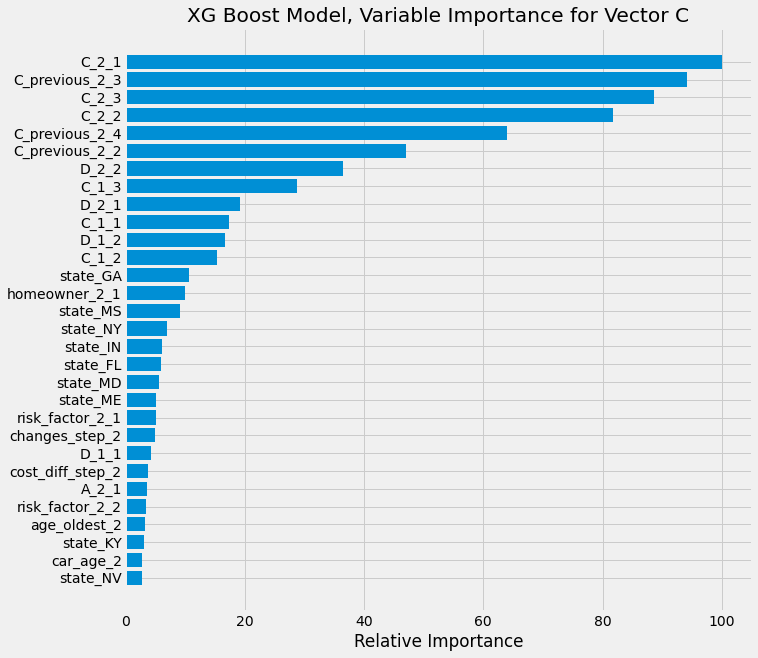

In [390]:
# model C with XGBoost classifier Best Parameters: (Overall 2nd rank model, Iteration 52)

vector = 'C'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators = 200, max_depth = 5, \
                                         learning_rate = 0.25, colsample_bytree = 0.35, plot=True)



In [391]:
vector = 'C'
score_matrix = model_score_matrix(vector, 2, xg_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2185,858,28.2
cust_maintained_vector,387,12092,96.9


In [392]:
vector='C'
model = 'xg'

score = model_score_by_shopping_pt(vector, 2, xg_preds)

#perf_q1q2.update(vector, 'no_model', 'overall', acc*100)
perf_q1q2.update(vector, model, 'overall', round(xg_ac*100,2))
perf_q1q2.update(vector, model, 'customer_type', score_matrix)
perf_q1q2.update(vector, model, 'shopping_pt', score)
perf_q1q2.compare(vector, model)
perf_q1q2.record[vector]

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,no_model,rf,rf_vs_no_model,gb,gb_vs_no_model,xg,xg_vs_no_model
accuracy_overall,80.4,83.23,2.83,83.22,2.82,83.43,3.03
accuracy_cust_changed_vector,0,21.26,21.26,26.68,26.68,28.20,28.2
accuracy_cust_maintained_vector,100,98.34,-1.66,97.00,-3.0,96.90,-3.1
accuracy_shopping_pt_3,85.19,87.09,1.9,86.53,1.34,87.54,2.35
accuracy_shopping_pt_4,87.19,87.97,0.78,88.05,0.86,88.20,1.01
accuracy_shopping_pt_5,83.19,85.69,2.5,85.58,2.39,85.52,2.33
accuracy_shopping_pt_6,81.84,84.92,3.08,84.96,3.12,84.72,2.88
accuracy_shopping_pt_7,81.2,83.52,2.32,82.85,1.65,83.59,2.39
accuracy_shopping_pt_8,77.03,80.72,3.69,80.91,3.88,80.80,3.77
accuracy_shopping_pt_9,77.84,80.92,3.08,81.44,3.6,81.60,3.76


C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3934441024.py:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(labels)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3934441024.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(labels)


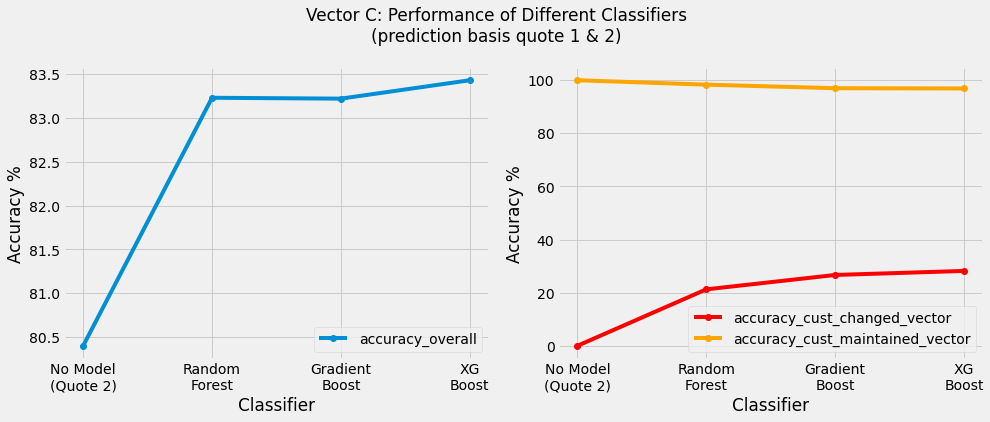

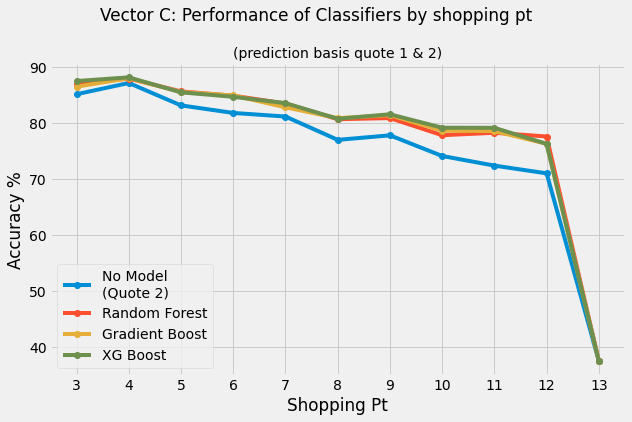

In [523]:
vector = 'C'
#models = ['no_model', 'rf', 'gb', 'xg', 'lr']
models = ['no_model', 'rf', 'gb', 'xg']
quotes = [1,2]
model_performance_plot(vector, models, quotes, "overall")
model_performance_plot(vector, models, quotes, "shopping_pt")

## Quote 1 and 2: Predict D

Random Forest Classifier results for Vector D
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8619, f1-score=0.8628
Confusion Matrix - normalized
 [[0.81   0.064  0.126 ]
 [0.0925 0.7608 0.1467]
 [0.0325 0.0608 0.9066]]
Confusion Matrix
 [[1633  129  254]
 [ 317 2608  503]
 [ 328  613 9137]]

Classification Report 
               precision    recall  f1-score   support

           0       0.72      0.81      0.76      2016
           1       0.78      0.76      0.77      3428
           2       0.92      0.91      0.91     10078

    accuracy                           0.86     15522
   macro avg       0.81      0.83      0.82     15522
weighted avg       0.86      0.86      0.86     15522

30


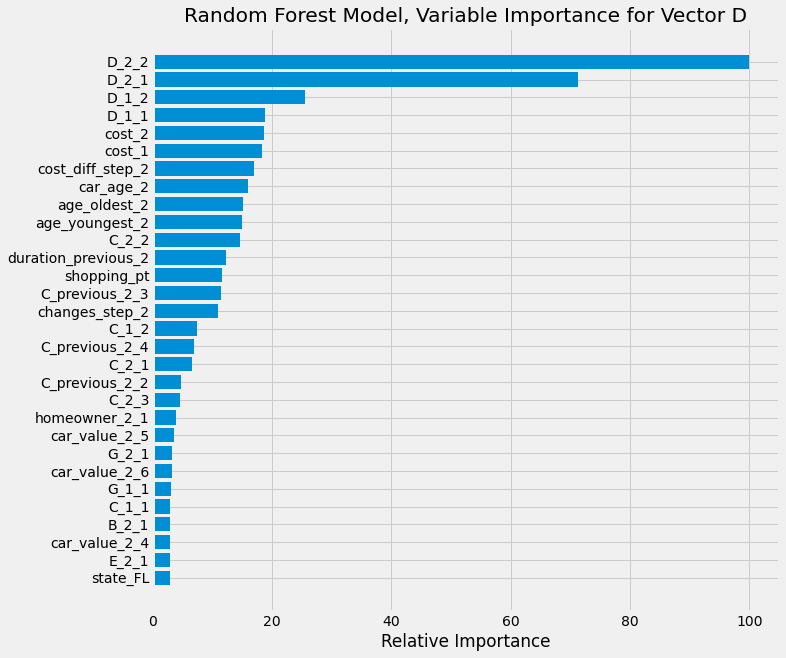

In [396]:
# Let's run the model for vector D

vector = 'D'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, plot = True)


In [397]:
vector = 'D'
score_matrix = model_score_matrix(vector, 2, rf_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2024,359,15.07
cust_maintained_vector,120,13019,99.09


In [398]:
vector='D'
model = 'rf'

score = model_score_by_shopping_pt(vector, 2, rf_preds)

perf_q1q2.update(vector, 'no_model', 'overall', acc*100)
perf_q1q2.update(vector, model, 'overall', round(rf_ac*100,2))
perf_q1q2.update(vector, model, 'customer_type', score_matrix)
perf_q1q2.update(vector, model, 'shopping_pt', score)
perf_q1q2.compare(vector, model)
perf_q1q2.record[vector]

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,no_model,rf,rf_vs_no_model
accuracy_overall,84.65,86.19,1.54
accuracy_cust_changed_vector,0,15.07,15.07
accuracy_cust_maintained_vector,100,99.09,-0.91
accuracy_shopping_pt_3,88.55,90.01,1.46
accuracy_shopping_pt_4,89.61,90.23,0.62
accuracy_shopping_pt_5,86.63,87.35,0.72
accuracy_shopping_pt_6,84.88,86.00,1.12
accuracy_shopping_pt_7,85.64,87.02,1.38
accuracy_shopping_pt_8,82.28,83.99,1.71
accuracy_shopping_pt_9,83.58,86.03,2.45


In [394]:
#test_set = df_train_first2.iloc[y_test.index,:]
vector = 'D'
x = pd.crosstab(test_set['D'], test_set['D_2'])

same_as_2 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 
acc = np.around(np.sum(same_as_2)/y_test.shape[0], 4)

print(f"Accuracy based on simply predicting vector {vector} = {vector}_2 : {(np.sum(same_as_2)/y_test.shape[0]): 4.4}")

Accuracy based on simply predicting vector D = D_2 :  0.8465


In [89]:
#x['total'] = x.sum(axis=1)
x['D1_%'] = np.around(x[1]*100 / x['total'], 3) 
x['D2_%'] = np.around(x[2]*100 / x['total'], 3) 
x['D3_%'] = np.around(x[3]*100 / x['total'], 3) 
x

D_2,1,2,3,total,D1_%,D2_%,D3_%
D,,,,,,,
1,1725,123,168,2016,85.565,6.101,8.333
2,408,2618,402,3428,11.902,76.371,11.727
3,605,677,8796,10078,6.003,6.718,87.279


Gradient Boosting Classifier results for Vector D
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.3, max_features = 10
Accuracy=0.863, f1-score=0.8635
Confusion Matrix - normalized
 [[0.8046 0.067  0.1285]
 [0.0872 0.7573 0.1555]
 [0.0298 0.0596 0.9106]]
Confusion Matrix
 [[1622  135  259]
 [ 299 2596  533]
 [ 300  601 9177]]

Classification Report 
               precision    recall  f1-score   support

           0       0.73      0.80      0.77      2016
           1       0.78      0.76      0.77      3428
           2       0.92      0.91      0.92     10078

    accuracy                           0.86     15522
   macro avg       0.81      0.82      0.82     15522
weighted avg       0.86      0.86      0.86     15522

30


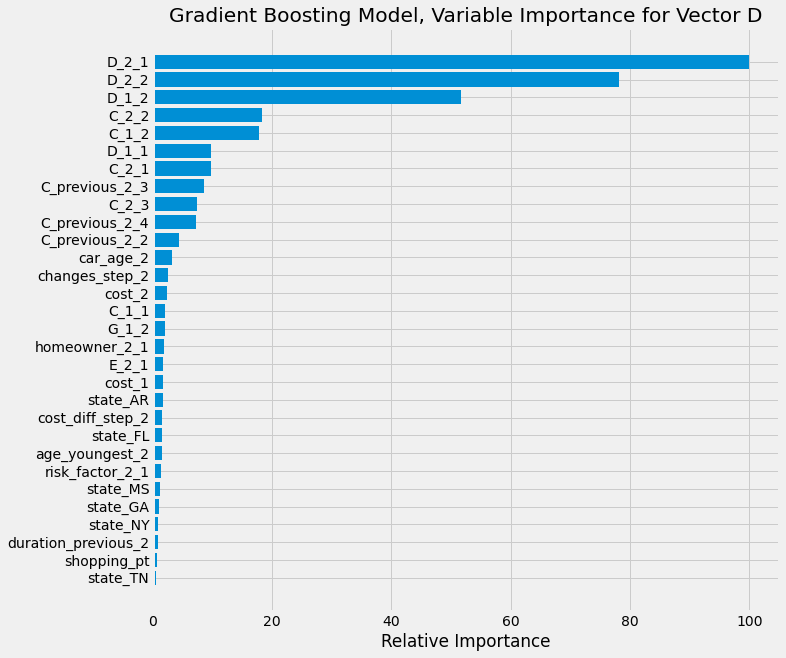

In [400]:
# model D with GradientBoosting classifier
from sklearn.ensemble import GradientBoostingClassifier

vector = 'D'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, max_features = 10, max_depth = 3, \
                                                   learning_rate = 0.3, plot = True)



In [401]:
vector = 'D'
score_matrix = model_score_matrix(vector, 2, gb_preds)
score_matrix


C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,1958,425,17.83
cust_maintained_vector,169,12970,98.71


In [402]:
vector = 'D'
score_matrix = model_score_matrix(vector, 2, gb_preds)
score_matrix
vector='D'
model = 'gb'

score = model_score_by_shopping_pt(vector, 2, gb_preds)

#perf_q1q2.update(vector, 'no_model', 'overall', acc*100)
perf_q1q2.update(vector, model, 'overall', round(gb_ac*100,2))
perf_q1q2.update(vector, model, 'customer_type', score_matrix)
perf_q1q2.update(vector, model, 'shopping_pt', score)
perf_q1q2.compare(vector, model)
perf_q1q2.record[vector]

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,no_model,rf,rf_vs_no_model,gb,gb_vs_no_model
accuracy_overall,84.65,86.19,1.54,86.30,1.65
accuracy_cust_changed_vector,0,15.07,15.07,17.83,17.83
accuracy_cust_maintained_vector,100,99.09,-0.91,98.71,-1.29
accuracy_shopping_pt_3,88.55,90.01,1.46,89.23,0.68
accuracy_shopping_pt_4,89.61,90.23,0.62,89.84,0.23
accuracy_shopping_pt_5,86.63,87.35,0.72,87.52,0.89
accuracy_shopping_pt_6,84.88,86.00,1.12,86.32,1.44
accuracy_shopping_pt_7,85.64,87.02,1.38,87.05,1.41
accuracy_shopping_pt_8,82.28,83.99,1.71,84.42,2.14
accuracy_shopping_pt_9,83.58,86.03,2.45,85.92,2.34


In [83]:
# Let's use RandomizedSearchCV to find the best XGB classifier Hyperparamters for vector D

import xgboost as xgb

from sklearn.model_selection import RandomizedSearchCV

vector = 'D'

param_grid = {'learning_rate' : [0.25, 0.3, 0.35, 0.5], 'n_estimators' : np.arange(100,501,100), \
              'colsample_bytree': [0.15,0.25,0.35,0.5], 'max_depth' : [3,4,5]}

clf = xgb.XGBClassifier(objective='binary:logistic', random_state=1, n_jobs=-1)

clf_cv = RandomizedSearchCV(clf, param_grid, n_iter = 60, verbose = 3, cv=4)

clf_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))

print(f"Vector {vector} RandomizedSearchCV: XG Boosting Model\nBest Score:" + str(clf_cv.best_score_))
print("\nBest Parameters: " + str(clf_cv.best_params_))


Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=4, n_estimators=200;, score=0.871 total time=  11.6s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=4, n_estimators=200;, score=0.867 total time=  12.1s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=4, n_estimators=200;, score=0.865 total time=  12.1s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=4, n_estimators=200;, score=0.864 total time=  11.9s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=4, n_estimators=100;, score=0.869 total time=   3.1s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=4, n_estimators=100;, score=0.867 total time=   3.1s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=4, n_estimators=100;, score=0.864 total time=   3.1s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=4, n_estimators=100;, score=0.865 total time=  

[CV 2/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=4, n_estimators=200;, score=0.866 total time=  12.2s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=4, n_estimators=200;, score=0.865 total time=  12.2s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=4, n_estimators=200;, score=0.865 total time=  12.6s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=3, n_estimators=200;, score=0.871 total time=   9.5s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=3, n_estimators=200;, score=0.866 total time=   9.5s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=3, n_estimators=200;, score=0.865 total time=   9.5s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=3, n_estimators=200;, score=0.866 total time=   9.5s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=3, n_estimators=100;, score=0.870 total time=   3.8s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.5, max_d

[CV 4/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=5, n_estimators=100;, score=0.866 total time=   6.5s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=4, n_estimators=100;, score=0.869 total time=   3.1s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=4, n_estimators=100;, score=0.866 total time=   3.1s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=4, n_estimators=100;, score=0.863 total time=   3.2s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=4, n_estimators=100;, score=0.864 total time=   3.2s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=200;, score=0.869 total time=   9.6s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=200;, score=0.866 total time=   9.5s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=200;, score=0.865 total time=   9.7s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.5, 

[CV 2/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=300;, score=0.866 total time=  14.1s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=300;, score=0.864 total time=  14.0s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=3, n_estimators=300;, score=0.864 total time=  14.1s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=4, n_estimators=300;, score=0.867 total time=   9.0s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=4, n_estimators=300;, score=0.865 total time=   9.0s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=4, n_estimators=300;, score=0.862 total time=   9.0s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=4, n_estimators=300;, score=0.863 total time=   9.0s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.3, max_depth=3, n_estimators=200;, score=0.871 total time=   7.7s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.3, max_

In [84]:
results = pd.DataFrame(clf_cv.cv_results_['params'])
results['train_score'] = clf_cv.cv_results_['mean_test_score']
results['train_rank'] = clf_cv.cv_results_['rank_test_score']

save_file(results, 'xgboost_results_vectorD.csv', datapath)

Writing file.  "Modelling_data\xgboost_results_vectorD.csv"


In [85]:
import xgboost as xgb

vector = 'D'

print(f"XGBoost Classifier results for Vector {vector}\n")
#param_grid
for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    max_depth = row['max_depth']
    learning_rate = row['learning_rate']
    colsample_bytree = row['colsample_bytree']
        
    clf = xgb.XGBClassifier(max_depth=int(max_depth), objective='multi:softprob', n_estimators=int(n_estimators), \
                       learning_rate = learning_rate, colsample_bytree = colsample_bytree, n_jobs=-1, random_state=1)

    clf.fit(X_train.to_numpy(), y_train[vector].astype('int'))
    y_pred = clf.predict(X_test.to_numpy())
    y_pred_prob = clf.predict_proba(X_test.to_numpy())
    xg_probs = y_pred_prob[:,1]
    ac = accuracy_score(y_test[vector].astype('int'), y_pred)

    f1 = f1_score(y_test[vector].astype('int'), y_pred, average='weighted')
    cm = np.around(confusion_matrix(y_test[vector].astype('int'), y_pred, normalize = 'true'),3)
    cm1 = confusion_matrix(y_test[vector].astype('int'), y_pred)

    results.loc[i, 'test_score'] = ac
    results.loc[i, 'f1_score'] = f1
    
    print(f"Parameters: No. of Estimators = {n_estimators},  max_depth = {max_depth}, \
    learning_rate = {learning_rate}, colsample_bytree = {colsample_bytree}")

    print(f'Accuracy={ac:4.4}, f1_score={f1:4.4}')

results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
datapath="Modelling_data"
save_file(results,"xgboost_results_vectorD_2.csv",datapath)

XGBoost Classifier results for Vector D

Parameters: No. of Estimators = 200.0,  max_depth = 4.0,     learning_rate = 0.35, colsample_bytree = 0.5
Accuracy=0.8639, f1_score=0.8643
Parameters: No. of Estimators = 100.0,  max_depth = 4.0,     learning_rate = 0.5, colsample_bytree = 0.15
Accuracy=0.8646, f1_score=0.8652
Parameters: No. of Estimators = 300.0,  max_depth = 4.0,     learning_rate = 0.35, colsample_bytree = 0.35
Accuracy=0.8643, f1_score=0.8646
Parameters: No. of Estimators = 200.0,  max_depth = 5.0,     learning_rate = 0.5, colsample_bytree = 0.5
Accuracy=0.8603, f1_score=0.8605
Parameters: No. of Estimators = 300.0,  max_depth = 5.0,     learning_rate = 0.3, colsample_bytree = 0.15
Accuracy=0.8639, f1_score=0.8644
Parameters: No. of Estimators = 300.0,  max_depth = 4.0,     learning_rate = 0.25, colsample_bytree = 0.15
Accuracy=0.8646, f1_score=0.8651
Parameters: No. of Estimators = 300.0,  max_depth = 5.0,     learning_rate = 0.25, colsample_bytree = 0.5
Accuracy=0.8629, f

Parameters: No. of Estimators = 300.0,  max_depth = 4.0,     learning_rate = 0.3, colsample_bytree = 0.5
Accuracy=0.8638, f1_score=0.864
Writing file.  "Modelling_data\xgboost_results_vectorD_2.csv"


In [86]:
results

,n_estimators,max_depth,learning_rate,colsample_bytree,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,200,4,0.35,0.50,0.866731,27,0.863935,0.864309,10.0,0.865333,24.0
1,100,4,0.50,0.15,0.866312,31,0.864644,0.865226,3.0,0.865478,18.0
2,300,4,0.35,0.35,0.865362,41,0.864322,0.864638,6.0,0.864842,33.0
3,200,5,0.50,0.50,0.862414,56,0.860327,0.860501,38.0,0.861371,57.0
4,300,5,0.30,0.15,0.866119,32,0.863935,0.864371,10.0,0.865027,27.0
5,300,4,0.25,0.15,0.867488,5,0.864579,0.865067,4.0,0.866034,3.0
6,300,5,0.25,0.50,0.865298,43,0.862904,0.863176,23.0,0.864101,40.0
7,400,3,0.50,0.15,0.866602,29,0.862711,0.863143,26.0,0.864657,35.0
8,200,5,0.25,0.35,0.867134,16,0.864901,0.865353,1.0,0.866018,4.0
9,100,4,0.30,0.35,0.867375,8,0.863420,0.864031,17.0,0.865397,20.0


XGBoost Classifier results for Vector D
Parameters: No. of Estimators = 500,  max_depth = 3,     learning_rate = 0.25, colsample_bytree = 0.25
Accuracy=0.8648, f1-score=0.8653
Confusion Matrix - normalized
 [[0.8021 0.0709 0.127 ]
 [0.0881 0.7596 0.1523]
 [0.0295 0.0574 0.9132]]
Confusion Matrix
 [[1617  143  256]
 [ 302 2604  522]
 [ 297  578 9203]]

Classification Report 
               precision    recall  f1-score   support

           0       0.73      0.80      0.76      2016
           1       0.78      0.76      0.77      3428
           2       0.92      0.91      0.92     10078

    accuracy                           0.86     15522
   macro avg       0.81      0.82      0.82     15522
weighted avg       0.87      0.86      0.87     15522

30


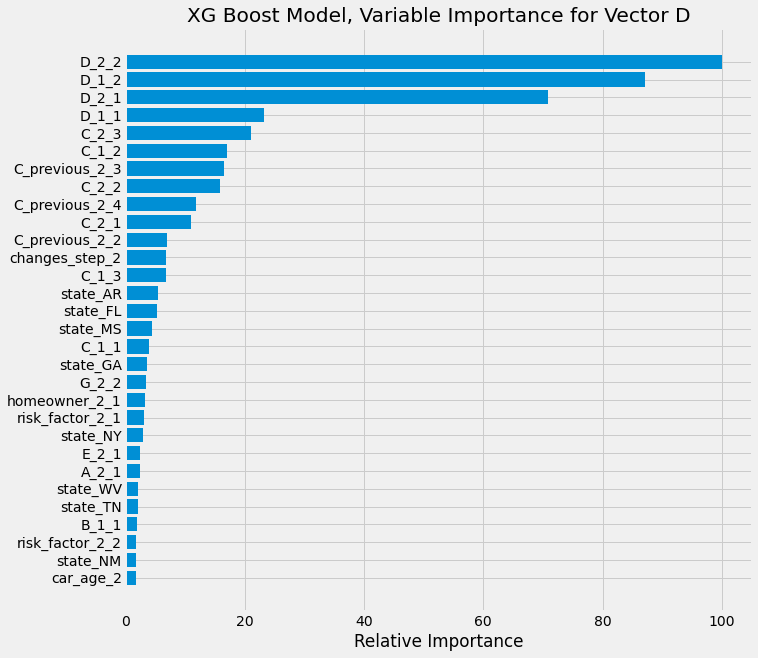

In [403]:
# model D with XGBoost classifier Best Parameters: (Overall 1st rank model)
#  No. of Estimators = 500,  max_depth = 3, learning_rate = 0.25, colsample_bytree = 0.25 : 

vector = 'D'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators = 500, max_depth = 3, \
                                         learning_rate = 0.25, colsample_bytree = 0.25, plot=True)


In [404]:
vector = 'D'
score_matrix = model_score_matrix(vector, 2, xg_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,1930,453,19.01
cust_maintained_vector,168,12971,98.72


In [405]:
vector='D'
model = 'xg'

score = model_score_by_shopping_pt(vector, 2, xg_preds)

#perf_q1q2.update(vector, 'no_model', 'overall', acc*100)
perf_q1q2.update(vector, model, 'overall', round(xg_ac*100,2))
perf_q1q2.update(vector, model, 'customer_type', score_matrix)
perf_q1q2.update(vector, model, 'shopping_pt', score)
perf_q1q2.compare(vector, model)
perf_q1q2.record[vector]

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,no_model,rf,rf_vs_no_model,gb,gb_vs_no_model,xg,xg_vs_no_model
accuracy_overall,84.65,86.19,1.54,86.30,1.65,86.48,1.83
accuracy_cust_changed_vector,0,15.07,15.07,17.83,17.83,19.01,19.01
accuracy_cust_maintained_vector,100,99.09,-0.91,98.71,-1.29,98.72,-1.28
accuracy_shopping_pt_3,88.55,90.01,1.46,89.23,0.68,89.56,1.01
accuracy_shopping_pt_4,89.61,90.23,0.62,89.84,0.23,90.47,0.86
accuracy_shopping_pt_5,86.63,87.35,0.72,87.52,0.89,87.85,1.22
accuracy_shopping_pt_6,84.88,86.00,1.12,86.32,1.44,86.32,1.44
accuracy_shopping_pt_7,85.64,87.02,1.38,87.05,1.41,87.29,1.65
accuracy_shopping_pt_8,82.28,83.99,1.71,84.42,2.14,84.31,2.03
accuracy_shopping_pt_9,83.58,86.03,2.45,85.92,2.34,86.29,2.71


C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3934441024.py:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(labels)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3934441024.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(labels)


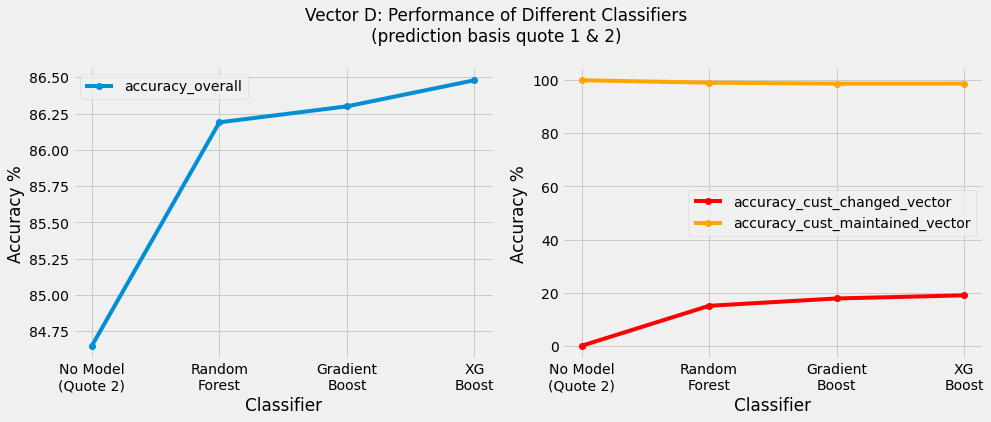

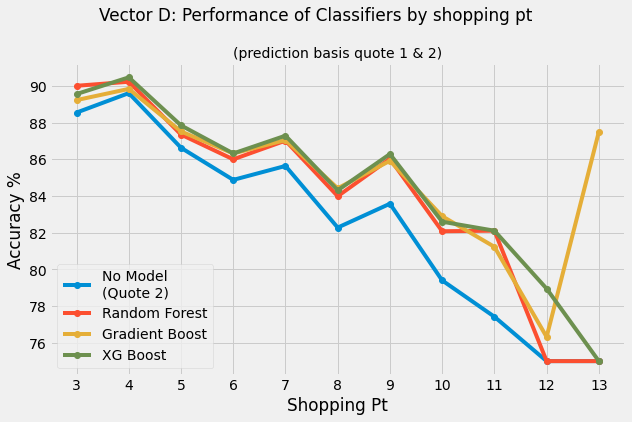

In [524]:
vector = 'D'
#models = ['no_model', 'rf', 'gb', 'xg', 'lr']
models = ['no_model', 'rf', 'gb', 'xg']
quotes = [1,2]
model_performance_plot(vector, models, quotes, "overall")
model_performance_plot(vector, models, quotes, "shopping_pt")

## Quote 1 and 2: Predict F

Random Forest Classifier results for Vector F
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8324, f1-score=0.8307
Confusion Matrix - normalized
 [[0.8926 0.0338 0.0664 0.0072]
 [0.041  0.7835 0.1641 0.0113]
 [0.0466 0.0714 0.8598 0.0223]
 [0.0569 0.0865 0.3379 0.5188]]
Confusion Matrix
 [[4464  169  332   36]
 [ 156 2979  624   43]
 [ 272  417 5021  130]
 [  50   76  297  456]]

Classification Report 
               precision    recall  f1-score   support

           0       0.90      0.89      0.90      5001
           1       0.82      0.78      0.80      3802
           2       0.80      0.86      0.83      5840
           3       0.69      0.52      0.59       879

    accuracy                           0.83     15522
   macro avg       0.80      0.76      0.78     15522
weighted avg       0.83      0.83      0.83     15522

30


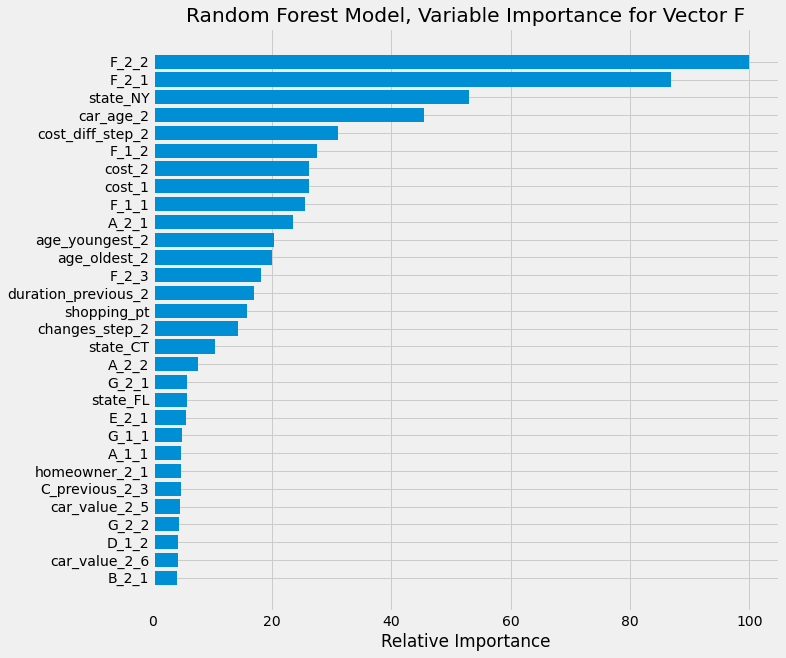

In [408]:
# Let's run the model for vector F

vector = 'F'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, plot=True)


In [ ]:
vector = 'F'

x = pd.crosstab(y_test_compare[vector], y_test_compare[vector+"_2"], )
same_as_2 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 
acc = np.around(np.sum(same_as_2)/y_test_compare.shape[0], 4)
print(f"Accuracy based on simply predicting vector {vector} = {vector}_2 : {(np.sum(same_as_2)/y_test_compare.shape[0]): 4.4}")
x['total'] = x.sum(axis=1)
x['F0_%'] = np.around(x[0]*100 / x['total'], 2)
x['F1_%'] = np.around(x[1]*100 / x['total'], 2)
x['F2_%'] = np.around(x[2]*100 / x['total'], 2)
x['F3_%'] = np.around(x[3]*100 / x['total'], 2)
x

In [102]:
# Let's use Bayesian Optimization to find best parameters for Random Forest model for vector F
from bayes_opt import BayesianOptimization

vector = 'F'

def rf_eval(estimators, min_leaf, min_split):
    
    rf = RandomForestClassifier(n_estimators = round(estimators), min_samples_leaf = round(min_leaf), \
                                    min_samples_split = round(min_split), random_state = 1, n_jobs=-1)
    
    cv_result = cross_validate(rf, X_train.to_numpy(), y_train[vector].astype('int'), cv= 4)
    return np.mean(cv_result['test_score'])

rf_bo = BayesianOptimization(rf_eval, {'estimators': (20, 1000), 'min_leaf': (1, 5), 'min_split': (2, 6)})
rf_bo.maximize(n_iter=15, init_points=2)

|   iter    |  target   | estima... | min_leaf  | min_split |
-------------------------------------------------------------
|  1        |  0.8287   |  525.1    |  1.206    |  5.596    |
|  2        |  0.8271   |  979.8    |  4.785    |  2.303    |
|  3        |  0.8287   |  523.8    |  1.322    |  5.614    |
|  4        |  0.8284   |  643.2    |  1.475    |  4.437    |
|  5        |  0.8275   |  20.18    |  3.23     |  5.042    |
|  6        |  0.8283   |  283.6    |  1.758    |  2.46     |
|  7        |  0.8289   |  772.1    |  1.351    |  2.479    |
|  8        |  0.8276   |  834.2    |  4.457    |  5.703    |
|  9        |  0.828    |  727.8    |  2.659    |  2.059    |
|  10       |  0.8268   |  568.0    |  4.751    |  4.171    |
|  11       |  0.8284   |  790.7    |  2.09     |  5.79     |
|  12       |  0.8275   |  755.9    |  3.569    |  5.741    |
|  13       |  0.827    |  779.1    |  4.979    |  2.678    |
|  14       |  0.8288   |  768.0    |  1.499    |  3.415    |
|  15   

In [409]:
vector = 'F'
score_matrix = model_score_matrix(vector, 2, rf_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2527,312,10.99
cust_maintained_vector,75,12608,99.41


In [410]:
vector='F'
model = 'rf'

score = model_score_by_shopping_pt(vector, 2, rf_preds)

perf_q1q2.update(vector, 'no_model', 'overall', acc*100)
perf_q1q2.update(vector, model, 'overall', round(rf_ac*100,2))
perf_q1q2.update(vector, model, 'customer_type', score_matrix)
perf_q1q2.update(vector, model, 'shopping_pt', score)
perf_q1q2.compare(vector, model)
perf_q1q2.record[vector]

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,no_model,rf,rf_vs_no_model
accuracy_overall,81.71,83.24,1.53
accuracy_cust_changed_vector,0,10.99,10.99
accuracy_cust_maintained_vector,100,99.41,-0.59
accuracy_shopping_pt_3,83.84,84.06,0.22
accuracy_shopping_pt_4,88.12,88.36,0.24
accuracy_shopping_pt_5,84.69,85.75,1.06
accuracy_shopping_pt_6,83.52,84.52,1.0
accuracy_shopping_pt_7,82.21,84.30,2.09
accuracy_shopping_pt_8,79.35,81.20,1.85
accuracy_shopping_pt_9,78.94,81.13,2.19


In [407]:
vector = 'F'

#df_train_first2 = pd.read_csv('WIP_data/training_data_with_first2_quotes.csv')
#test_set = df_train_first2.iloc[y_test.index,:]

x = pd.crosstab(test_set['F'], test_set['F_2'])

same_as_2 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 

acc = np.around(np.sum(same_as_2)/y_test.shape[0],4)

print(f"Accuracy based on simply predicting vector {vector} = {vector}_2 : {(np.sum(same_as_2)/y_test.shape[0]): 4.4}")


Accuracy based on simply predicting vector F = F_2 :  0.8171


In [49]:

x['total'] = x.sum(axis=1)
x['F0_%'] = np.around(x[0]*100 / x['total'], 2)
x['F1_%'] = np.around(x[1]*100 / x['total'], 2)
x['F2_%'] = np.around(x[2]*100 / x['total'], 2)
x['F3_%'] = np.around(x[3]*100 / x['total'], 2)
x

F_2,0,1,2,3,total,F0_%,F1_%,F2_%,F3_%
F,,,,,,,,,
0,4436,182,345,38,5001,88.70,3.64,6.90,0.76
1,250,2973,533,46,3802,6.58,78.20,14.02,1.21
2,477,410,4809,144,5840,8.17,7.02,82.35,2.47
3,93,72,249,465,879,10.58,8.19,28.33,52.90


Gradient Boosting Classifier results for Vector F
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.3, max_features = 10
Accuracy=0.8311, f1-score=0.8296
Confusion Matrix - normalized
 [[0.8968 0.0312 0.0656 0.0064]
 [0.0395 0.7851 0.1644 0.011 ]
 [0.049  0.0748 0.8512 0.025 ]
 [0.0501 0.0842 0.3424 0.5233]]
Confusion Matrix
 [[4485  156  328   32]
 [ 150 2985  625   42]
 [ 286  437 4971  146]
 [  44   74  301  460]]

Classification Report 
               precision    recall  f1-score   support

           0       0.90      0.90      0.90      5001
           1       0.82      0.79      0.80      3802
           2       0.80      0.85      0.82      5840
           3       0.68      0.52      0.59       879

    accuracy                           0.83     15522
   macro avg       0.80      0.76      0.78     15522
weighted avg       0.83      0.83      0.83     15522

20


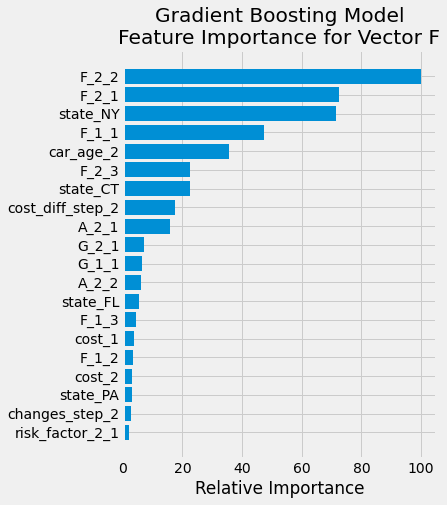

In [117]:
# model F with GradientBoosting classifier
from sklearn.ensemble import GradientBoostingClassifier

vector = 'F'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, max_features = 10, max_depth = 3, \
                                                   learning_rate = 0.3, plot = True)

In [28]:
# Let's use RandomizedSearchCV to find the best XGB classifier Hyperparamters for vector F

import xgboost as xgb

from sklearn.model_selection import RandomizedSearchCV

vector = 'F'

param_grid = {'learning_rate' : [0.25, 0.3, 0.35], 'n_estimators' : [200], \
              'colsample_bytree': [0.25,0.35,0.5], 'max_depth' : [4]}

clf = xgb.XGBClassifier(objective='multi:softprob', random_state=1, n_jobs=-1)

clf_cv = GridSearchCV(clf, param_grid, verbose = 3, cv=4)

clf_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))

print(f"Vector {vector} RandomizedSearchCV: XG Boosting Model\nBest Score:" + str(clf_cv.best_score_))
print("\nBest Parameters: " + str(clf_cv.best_params_))

Fitting 4 folds for each of 9 candidates, totalling 36 fits
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=4, n_estimators=200;, score=0.834 total time=  15.9s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=4, n_estimators=200;, score=0.834 total time=  17.0s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=4, n_estimators=200;, score=0.822 total time=  16.7s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=4, n_estimators=200;, score=0.827 total time=  16.7s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=4, n_estimators=200;, score=0.835 total time=  16.8s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=4, n_estimators=200;, score=0.833 total time=  16.3s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=4, n_estimators=200;, score=0.821 total time=  16.0s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=4, n_estimators=200;, score=0.826 total time=

In [29]:
results_2 = pd.DataFrame(clf_cv.cv_results_['params'])
results_2['train_score'] = clf_cv.cv_results_['mean_test_score']
results_2['train_rank'] = clf_cv.cv_results_['rank_test_score']
datapath="Modelling_data"
save_file(results_2,"xgboost_results_vectorF_2pass.csv",datapath)


Writing file.  "Modelling_data\xgboost_results_vectorF_2pass.csv"


In [31]:
import xgboost as xgb

vector = 'F'

print(f"XGBoost Classifier results for Vector {vector}\n")
#param_grid
for i, row in results_2.iterrows():
    n_estimators = row['n_estimators']
    max_depth = row['max_depth']
    learning_rate = row['learning_rate']
    colsample_bytree = row['colsample_bytree']
        
    clf = xgb.XGBClassifier(max_depth=int(max_depth), objective='multi:softprob', n_estimators=int(n_estimators), \
                       learning_rate = learning_rate, colsample_bytree = colsample_bytree, n_jobs=-1, random_state=1)

    clf.fit(X_train.to_numpy(), y_train[vector].astype('int'))
    y_pred = clf.predict(X_test.to_numpy())
    y_pred_prob = clf.predict_proba(X_test.to_numpy())
    xg_probs = y_pred_prob[:,1]
    ac = accuracy_score(y_test[vector].astype('int'), y_pred)

    f1 = f1_score(y_test[vector].astype('int'), y_pred, average='weighted')
    cm = np.around(confusion_matrix(y_test[vector].astype('int'), y_pred, normalize = 'true'),3)
    cm1 = confusion_matrix(y_test[vector].astype('int'), y_pred)

    results_2.loc[i, 'test_score'] = ac
    results_2.loc[i, 'f1_score'] = f1
    
    print(f"Parameters: No. of Estimators = {n_estimators},  max_depth = {max_depth}, \
    learning_rate = {learning_rate}, colsample_bytree = {colsample_bytree}")

    print(f'Accuracy={ac:4.4}, f1_score={f1:4.4}')

results_2['test_rank']= results_2['test_score'].rank(method='dense', ascending=False)
results_2['tr_te_avg_score'] = (results_2['test_score']+results['train_score'])/2
results_2['overall_rank']= results_2['tr_te_avg_score'].rank(method='dense', ascending=False)


XGBoost Classifier results for Vector F

Parameters: No. of Estimators = 200.0,  max_depth = 4.0,     learning_rate = 0.25, colsample_bytree = 0.25
Accuracy=0.8333, f1_score=0.8316
Parameters: No. of Estimators = 200.0,  max_depth = 4.0,     learning_rate = 0.3, colsample_bytree = 0.25
Accuracy=0.8339, f1_score=0.8321
Parameters: No. of Estimators = 200.0,  max_depth = 4.0,     learning_rate = 0.35, colsample_bytree = 0.25
Accuracy=0.8332, f1_score=0.8314
Parameters: No. of Estimators = 200.0,  max_depth = 4.0,     learning_rate = 0.25, colsample_bytree = 0.35
Accuracy=0.8328, f1_score=0.831
Parameters: No. of Estimators = 200.0,  max_depth = 4.0,     learning_rate = 0.3, colsample_bytree = 0.35
Accuracy=0.833, f1_score=0.8312
Parameters: No. of Estimators = 200.0,  max_depth = 4.0,     learning_rate = 0.35, colsample_bytree = 0.35
Accuracy=0.8328, f1_score=0.831
Parameters: No. of Estimators = 200.0,  max_depth = 4.0,     learning_rate = 0.25, colsample_bytree = 0.5
Accuracy=0.8331, f

In [36]:
results_2['tr_te_avg_score'] = (results_2['test_score']+results_2['train_score'])/2
results_2['overall_rank']= results_2['tr_te_avg_score'].rank(method='dense', ascending=False)

results_2

,colsample_bytree,learning_rate,max_depth,n_estimators,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,0.25,0.25,4,200,0.829427,2,0.833269,0.831565,2.0,0.831348,2.0
1,0.25,0.30,4,200,0.828831,5,0.833913,0.832136,1.0,0.831372,1.0
3,0.35,0.25,4,200,0.829798,1,0.832754,0.831008,7.0,0.831276,3.0
4,0.35,0.30,4,200,0.828880,4,0.833011,0.831194,5.0,0.830945,5.0
5,0.35,0.35,4,200,0.828509,7,0.832818,0.831020,6.0,0.830664,6.0
6,0.50,0.25,4,200,0.828944,3,0.833076,0.831424,4.0,0.831010,4.0
7,0.50,0.30,4,200,0.827994,9,0.831272,0.829523,9.0,0.829633,8.0
8,0.50,0.35,4,200,0.828171,8,0.832303,0.830512,8.0,0.830237,7.0


In [33]:
datapath="Modelling_data"
save_file(results_2,"xgboost_results_vectorF_2pass.csv",datapath)


A file already exists with this name.

Do you want to overwrite? (Y/N)Y
Writing file.  "Modelling_data\xgboost_results_vectorF_2pass.csv"


In [8]:
# Let's use RandomizedSearchCV to find the best XGB classifier Hyperparamters for vector F

import xgboost as xgb

from sklearn.model_selection import RandomizedSearchCV

vector = 'F'

param_grid = {'learning_rate' : [0.25, 0.3, 0.35, 0.5], 'n_estimators' : np.arange(100,501,100), \
              'colsample_bytree': [0.15,0.25,0.35,0.5], 'max_depth' : [3,4,5]}

clf = xgb.XGBClassifier(objective='multi:softprob', random_state=1, n_jobs=-1)

clf_cv = RandomizedSearchCV(clf, param_grid, n_iter = 60, verbose = 3, cv=4)

clf_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))

print(f"Vector {vector} RandomizedSearchCV: XG Boosting Model\nBest Score:" + str(clf_cv.best_score_))
print("\nBest Parameters: " + str(clf_cv.best_params_))

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=3, n_estimators=200;, score=0.835 total time=   9.9s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=3, n_estimators=200;, score=0.833 total time=   9.9s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=3, n_estimators=200;, score=0.823 total time=  11.3s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=3, n_estimators=200;, score=0.827 total time=  12.6s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=5, n_estimators=200;, score=0.830 total time=  16.1s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=5, n_estimators=200;, score=0.826 total time=  14.6s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=5, n_estimators=200;, score=0.818 total time=  14.9s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=5, n_estimators=200;, score=0.823 total time=  

[CV 2/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=5, n_estimators=500;, score=0.830 total time=  30.7s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=5, n_estimators=500;, score=0.819 total time=  30.4s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=5, n_estimators=500;, score=0.824 total time=  30.1s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=3, n_estimators=100;, score=0.834 total time=   6.1s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=3, n_estimators=100;, score=0.832 total time=   6.2s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=3, n_estimators=100;, score=0.822 total time=   6.4s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=3, n_estimators=100;, score=0.826 total time=   6.4s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=300;, score=0.833 total time=  14.0s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.

[CV 4/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=4, n_estimators=100;, score=0.827 total time=   6.0s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.5, max_depth=5, n_estimators=500;, score=0.824 total time=  31.1s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.5, max_depth=5, n_estimators=500;, score=0.823 total time=  30.1s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.5, max_depth=5, n_estimators=500;, score=0.813 total time=  30.0s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.5, max_depth=5, n_estimators=500;, score=0.815 total time=  29.8s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=5, n_estimators=100;, score=0.835 total time=  10.1s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=5, n_estimators=100;, score=0.833 total time=   9.9s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=5, n_estimators=100;, score=0.823 total time=   9.7s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.25, 

[CV 2/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=5, n_estimators=400;, score=0.829 total time=  29.3s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=5, n_estimators=400;, score=0.818 total time=  29.3s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=5, n_estimators=400;, score=0.823 total time=  30.1s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=4, n_estimators=200;, score=0.834 total time=  15.4s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=4, n_estimators=200;, score=0.833 total time=  15.5s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=4, n_estimators=200;, score=0.823 total time=  15.4s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=4, n_estimators=200;, score=0.826 total time=  15.6s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.3, max_depth=3, n_estimators=200;, score=0.836 total time=   9.2s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.3

In [10]:
results = pd.DataFrame(clf_cv.cv_results_['params'])
results['train_score'] = clf_cv.cv_results_['mean_test_score']
results['train_rank'] = clf_cv.cv_results_['rank_test_score']
datapath="Modelling_data"
save_file(results,"xgboost_results_vectorF.csv",datapath)


Writing file.  "Modelling_data\xgboost_results_vectorF.csv"


In [12]:
import xgboost as xgb

vector = 'F'

print(f"XGBoost Classifier results for Vector {vector}\n")
#param_grid
for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    max_depth = row['max_depth']
    learning_rate = row['learning_rate']
    colsample_bytree = row['colsample_bytree']
        
    clf = xgb.XGBClassifier(max_depth=int(max_depth), objective='multi:softprob', n_estimators=int(n_estimators), \
                       learning_rate = learning_rate, colsample_bytree = colsample_bytree, n_jobs=-1, random_state=1)

    clf.fit(X_train.to_numpy(), y_train[vector].astype('int'))
    y_pred = clf.predict(X_test.to_numpy())
    y_pred_prob = clf.predict_proba(X_test.to_numpy())
    xg_probs = y_pred_prob[:,1]
    ac = accuracy_score(y_test[vector].astype('int'), y_pred)

    f1 = f1_score(y_test[vector].astype('int'), y_pred, average='weighted')
    cm = np.around(confusion_matrix(y_test[vector].astype('int'), y_pred, normalize = 'true'),3)
    cm1 = confusion_matrix(y_test[vector].astype('int'), y_pred)

    results.loc[i, 'test_score'] = ac
    results.loc[i, 'f1_score'] = f1
    
    print(f"Parameters: No. of Estimators = {n_estimators},  max_depth = {max_depth}, \
    learning_rate = {learning_rate}, colsample_bytree = {colsample_bytree}")

    print(f'Accuracy={ac:4.4}, f1_score={f1:4.4}')

results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)


XGBoost Classifier results for Vector F

Parameters: No. of Estimators = 200.0,  max_depth = 3.0,     learning_rate = 0.35, colsample_bytree = 0.5
Accuracy=0.8315, f1_score=0.8299
Parameters: No. of Estimators = 200.0,  max_depth = 5.0,     learning_rate = 0.5, colsample_bytree = 0.35
Accuracy=0.8281, f1_score=0.826
Parameters: No. of Estimators = 400.0,  max_depth = 4.0,     learning_rate = 0.25, colsample_bytree = 0.15
Accuracy=0.8324, f1_score=0.8306
Parameters: No. of Estimators = 400.0,  max_depth = 4.0,     learning_rate = 0.3, colsample_bytree = 0.15
Accuracy=0.8319, f1_score=0.83
Parameters: No. of Estimators = 500.0,  max_depth = 4.0,     learning_rate = 0.3, colsample_bytree = 0.15
Accuracy=0.8319, f1_score=0.8301
Parameters: No. of Estimators = 500.0,  max_depth = 4.0,     learning_rate = 0.3, colsample_bytree = 0.25
Accuracy=0.8304, f1_score=0.8284
Parameters: No. of Estimators = 200.0,  max_depth = 5.0,     learning_rate = 0.5, colsample_bytree = 0.25
Accuracy=0.8292, f1_s

Parameters: No. of Estimators = 300.0,  max_depth = 4.0,     learning_rate = 0.5, colsample_bytree = 0.5
Accuracy=0.8282, f1_score=0.8264


In [40]:
results_3['train_rank']= results_3['train_score'].rank(method='dense', ascending=False)
results_3['test_rank']= results_3['test_score'].rank(method='dense', ascending=False)
results_3['overall_rank']= results_3['tr_te_avg_score'].rank(method='dense', ascending=False)



,n_estimators,max_depth,learning_rate,colsample_bytree,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,200,3,0.35,0.50,0.829250,10.0,0.831529,0.829926,23.0,0.830390,24.0
1,200,5,0.50,0.35,0.824370,59.0,0.828051,0.826017,42.0,0.826210,63.0
2,400,4,0.25,0.15,0.828413,26.0,0.832367,0.830643,12.0,0.830390,25.0
3,400,4,0.30,0.15,0.828284,29.0,0.831852,0.830035,19.0,0.830068,33.0
4,500,4,0.30,0.15,0.827752,40.0,0.831916,0.830125,18.0,0.829834,36.0
...,...,...,...,...,...,...,...,...,...,...,...
62,200,4,0.25,0.35,0.829798,2.0,0.832754,0.831008,9.0,0.831276,4.0
63,200,4,0.30,0.35,0.828880,15.0,0.833011,0.831194,7.0,0.830945,9.0
64,200,4,0.35,0.35,0.828509,22.0,0.832818,0.831020,8.0,0.830664,18.0
65,200,4,0.30,0.50,0.827994,35.0,0.831272,0.829523,26.0,0.829633,41.0


In [43]:
results_3.head(37)

,n_estimators,max_depth,learning_rate,colsample_bytree,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,200,3,0.35,0.50,0.829250,10.0,0.831529,0.829926,23.0,0.830390,24.0
1,200,5,0.50,0.35,0.824370,59.0,0.828051,0.826017,42.0,0.826210,63.0
2,400,4,0.25,0.15,0.828413,26.0,0.832367,0.830643,12.0,0.830390,25.0
3,400,4,0.30,0.15,0.828284,29.0,0.831852,0.830035,19.0,0.830068,33.0
4,500,4,0.30,0.15,0.827752,40.0,0.831916,0.830125,18.0,0.829834,36.0
5,500,4,0.30,0.25,0.826496,51.0,0.830370,0.828421,32.0,0.828433,53.0
6,200,5,0.50,0.25,0.824338,60.0,0.829210,0.827193,38.0,0.826774,58.0
7,300,3,0.35,0.50,0.827849,37.0,0.833011,0.831337,7.0,0.830430,23.0
8,500,4,0.35,0.35,0.825256,54.0,0.830627,0.828753,30.0,0.827942,54.0
9,400,3,0.50,0.25,0.826802,48.0,0.830241,0.828487,33.0,0.828521,52.0


In [44]:
results_3.tail(30)

,n_estimators,max_depth,learning_rate,colsample_bytree,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
37,200,3,0.25,0.50,0.829411,7.0,0.830950,0.829389,28.0,0.830180,30.0
38,400,5,0.50,0.25,0.820375,66.0,0.824700,0.822643,45.0,0.822538,66.0
39,100,3,0.35,0.15,0.827494,41.0,0.830241,0.828556,33.0,0.828868,46.0
40,300,4,0.30,0.25,0.828058,34.0,0.832496,0.830677,11.0,0.830277,28.0
41,400,5,0.30,0.50,0.824321,61.0,0.828437,0.826536,40.0,0.826379,60.0
42,400,5,0.35,0.25,0.825240,55.0,0.829726,0.827664,36.0,0.827483,55.0
43,200,4,0.35,0.25,0.828783,19.0,0.833204,0.831365,4.0,0.830994,8.0
44,500,3,0.50,0.35,0.824756,56.0,0.829210,0.827321,38.0,0.826983,57.0
45,400,3,0.25,0.50,0.828203,31.0,0.831723,0.830079,20.0,0.829963,34.0
46,300,5,0.35,0.15,0.825932,53.0,0.831207,0.829235,27.0,0.828570,50.0


XGBoost Classifier results for Vector F
Parameters: No. of Estimators = 200,  max_depth = 4,     learning_rate = 0.25, colsample_bytree = 0.25
Accuracy=0.8333, f1-score=0.8316
Confusion Matrix - normalized
 [[0.8998 0.0302 0.064  0.006 ]
 [0.0408 0.7856 0.1628 0.0108]
 [0.0473 0.0736 0.855  0.0241]
 [0.0501 0.0887 0.3447 0.5165]]
Confusion Matrix
 [[4500  151  320   30]
 [ 155 2987  619   41]
 [ 276  430 4993  141]
 [  44   78  303  454]]

Classification Report 
               precision    recall  f1-score   support

           0       0.90      0.90      0.90      5001
           1       0.82      0.79      0.80      3802
           2       0.80      0.85      0.83      5840
           3       0.68      0.52      0.59       879

    accuracy                           0.83     15522
   macro avg       0.80      0.76      0.78     15522
weighted avg       0.83      0.83      0.83     15522

30


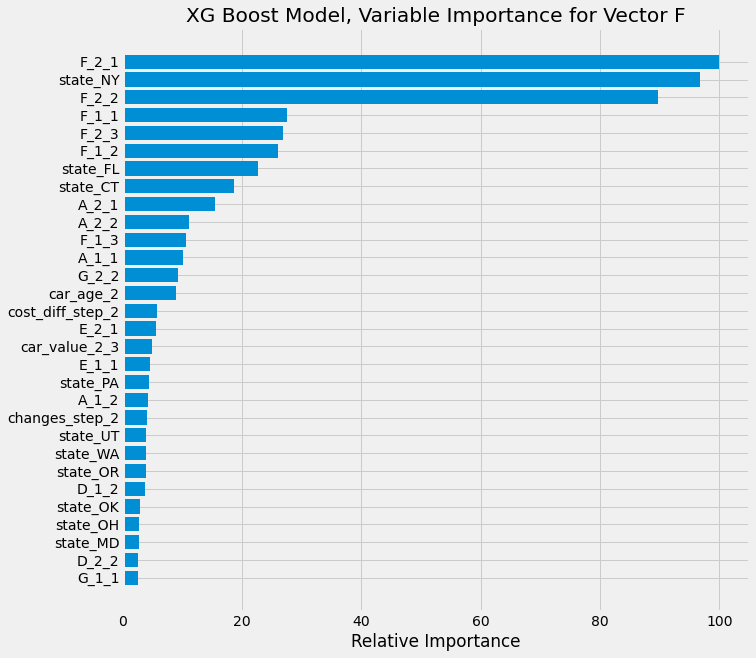

In [411]:
# Final slection is iteration 60: n_estimators = 200, max_depth = 4, learning_rate = 0.25, colsample_bytree = 0.25

vector = 'F'

xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector,n_estimators = 200, max_depth = 4, learning_rate = 0.25, \
                                         colsample_bytree = 0.25, plot=True) 

In [412]:
vector = 'F'
score_matrix = model_score_matrix(vector, 2, xg_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2443,396,13.95
cust_maintained_vector,145,12538,98.86


In [413]:
vector='F'
model = 'xg'

score = model_score_by_shopping_pt(vector, 2, xg_preds)

perf_q1q2.update(vector, 'no_model', 'overall', acc*100)
perf_q1q2.update(vector, model, 'overall', round(xg_ac*100,2))
perf_q1q2.update(vector, model, 'customer_type', score_matrix)
perf_q1q2.update(vector, model, 'shopping_pt', score)
perf_q1q2.compare(vector, model)
perf_q1q2.record[vector]

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/1068994510.py:36: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple

,no_model,rf,rf_vs_no_model,xg,xg_vs_no_model
accuracy_overall,81.71,83.24,1.53,83.33,1.62
accuracy_cust_changed_vector,0,10.99,10.99,13.95,13.95
accuracy_cust_maintained_vector,100,99.41,-0.59,98.86,-1.14
accuracy_shopping_pt_3,83.84,84.06,0.22,84.06,0.22
accuracy_shopping_pt_4,88.12,88.36,0.24,88.28,0.16
accuracy_shopping_pt_5,84.69,85.75,1.06,85.91,1.22
accuracy_shopping_pt_6,83.52,84.52,1.0,84.24,0.72
accuracy_shopping_pt_7,82.21,84.30,2.09,84.50,2.29
accuracy_shopping_pt_8,79.35,81.20,1.85,81.63,2.28
accuracy_shopping_pt_9,78.94,81.13,2.19,81.39,2.45


In [414]:
import pickle

with open('Modelling_data/perf_record_q1_q2.pkl', 'wb') as f:
    pickle.dump(perf_q1q2.record, f)


C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3934441024.py:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(labels)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3934441024.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(labels)


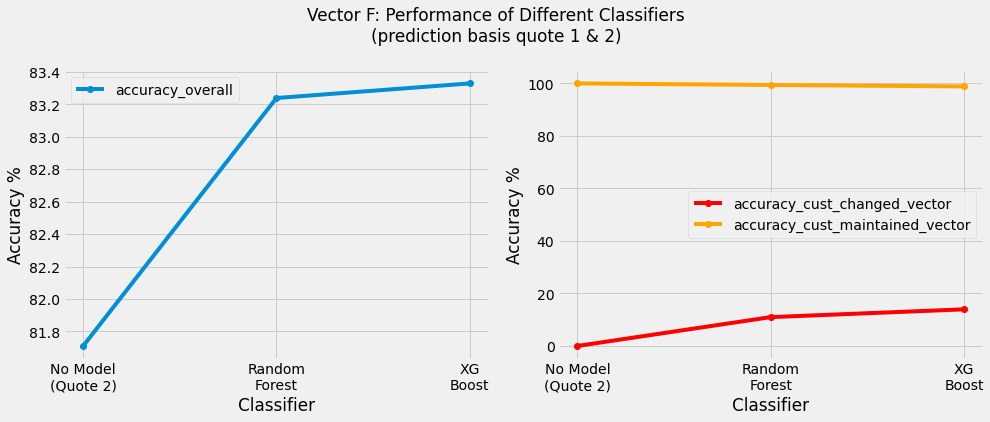

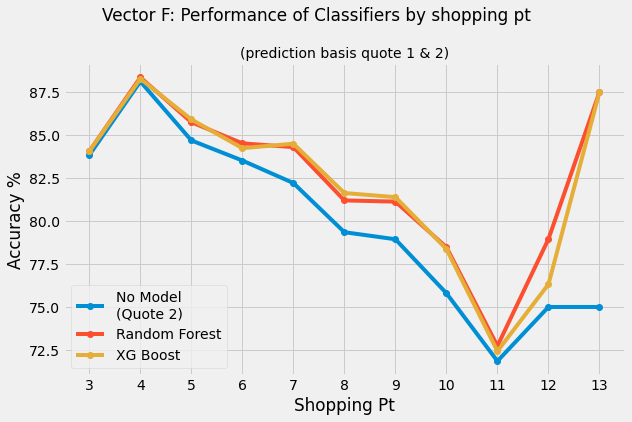

In [526]:
vector = 'F'
#models = ['no_model', 'rf', 'gb', 'xg', 'lr']
models = ['no_model', 'rf', 'xg']
quotes = [1,2]
model_performance_plot(vector, models, quotes, "overall")
model_performance_plot(vector, models, quotes, "shopping_pt")



In [45]:
datapath="Modelling_data"
save_file(results_3,"xgboost_results_vectorF_round3.csv",datapath)


Writing file.  "Modelling_data\xgboost_results_vectorF_round3.csv"


In [48]:

modelling_summary = pd.DataFrame({'vector' : ['A', 'B', 'C', 'D', 'E', 'F', 'G'], \
                                 'vector_options': [3,2,4,3,2,4,4], \
                                 'accuracy_Vector=quote2' : [0.821,0.833,0.804,0.847,0.832,0.817,0.741],\
                                 'best_model_score': [0.849,0.8352,0.8343,0.8648,0.8424,0.833,0.7601], \
                                 'best_model' : ['xg', 'rf', 'xg', 'xg', 'xg', 'xg', 'xg'], \
                                 'improvement_%': [2.8,0.2,3.03,1.8,1.04,1.6,1.9], \
                                 'score_XG Boost' : [0.849,0.835,0.8343,0.8648,0.8424,0.833,0.7601], \
                                  'score_random_forest' : [0.846,0.835,0.832,0.862,0.84,0.832,0.758], \
                                 'score_gradient_boost' : [0.848,0.833,0.832,0.861,0.842,0,0.757], \
                                 'score_Logistic_Regression' : [0,0.834,0,0,0.835,0,0], \
                                 'score_KNN' : [0,0.793,0,0,0.809,0,0], \
                                                                   
                                 })


# Summary

Models were developed for each of the 7 vectors based on Quotes 1 and 2. The classifier used for modelling were:

1) Random Forest

2) Gradient Boost

3) XG Boost

4) Logistic Regression and KNN for binary vectors (B and E)

After creating a base set of models, hyperparameters tuning was done using GridSearch CV, Randomized CV and Bayesian Optimization.

The model performance metrics used was primarily **micro_accuracy_score** as our objective was to predict the correct vector selections across all possible vector classes. In addition for binary vectors, the **ROC_AUC** metrics was studied and thresholding was done to find the best threshold that improved model metrics.

The below table summarizes the model performances across all the vectors:



In [69]:
modelling_summary.set_index('vector', inplace=True)
modelling_summary

,vector_options,accuracy_Vector=quote2,best_model_score,best_model,improvement_%,score_XG Boost,score_random_forest,score_gradient_boost,score_Logistic_Regression,score_KNN
vector,,,,,,,,,,
A,3,0.821,0.8490,xg,2.80,0.8490,0.846,0.848,0.000,0.000
B,2,0.833,0.8352,rf,0.20,0.8350,0.835,0.833,0.834,0.793
C,4,0.804,0.8343,xg,3.03,0.8343,0.832,0.832,0.000,0.000
D,3,0.847,0.8648,xg,1.80,0.8648,0.862,0.861,0.000,0.000
E,2,0.832,0.8424,xg,1.04,0.8424,0.840,0.842,0.835,0.809
F,4,0.817,0.8330,xg,1.60,0.8330,0.832,0.000,0.000,0.000
G,4,0.741,0.7601,xg,1.90,0.7601,0.758,0.757,0.000,0.000


In [47]:
modelling_summary['improvement_%'].mean()

1.7671428571428571

The improvement in prediction over NO model (predict final choice = quote 2 choice) ranges from **0.2%** for vector B to **3.03%** for vector C. The average improvement is **1.77%**.

The best performing classifer was **XG Boost**. It bettered accuracy score of Random Forest and Gradient Boost for 6 of the 7 vectors.


# Next Steps

1) Model all other vectors using XG Boost

2) Model final vector using quotes 2 and 3 (for customers who go beyond quote 3) and check predictive power over base model (final = quote 3).



# Predicting with Quotes 2 and 3

In [530]:
X2 = pd.read_csv("Transformed_data/pre_processed_training_data_with_quotes_2_3.csv")
y2 = pd.read_csv("Transformed_data/training_data_target_columns_quotes_2_3.csv")
df_hist_2_3 = pd.read_csv("WIP_data/hist_2_3_CDG_changed.csv")
X2.shape, y2.shape 


((73152, 94), (73152, 7))

In [531]:
X2.head()

,shopping_pt,car_age_3,age_oldest_3,age_youngest_3,duration_previous_3,cost_2,cost_3,changes_step_3,cost_diff_step_3,state_AR,...,F_2_3,F_3_1,F_3_2,F_3_3,G_2_1,G_2_2,G_2_3,G_3_1,G_3_2,G_3_3
0,1.054006,-0.897173,-0.000878,0.134046,-0.639141,0.459097,0.443265,-0.531869,-0.072856,0,...,0,0,1,0,0,0,0,0,0,0
1,0.501449,0.826906,-1.207892,-1.069244,0.858809,-1.622300,-1.564636,-0.531869,0.261214,0,...,0,0,0,0,0,1,0,0,1,0
2,0.501449,2.033761,-0.058355,-1.355742,-0.639141,-0.360847,-0.407910,-0.531869,-0.072856,0,...,1,0,0,1,0,1,0,0,1,0
3,0.501449,-0.207541,-0.690600,-0.610848,-0.639141,0.858557,0.857941,-0.531869,-0.072856,0,...,0,0,1,0,0,1,0,0,1,0
4,1.606563,0.137274,-1.035461,-0.897345,-0.425148,-0.360847,-0.407910,-0.531869,-0.072856,0,...,0,1,0,0,0,1,0,0,1,0


In [532]:
y2.head()

,A,B,C,D,E,F,G
0,1,1,2,2,0,2,0
1,0,0,0,2,0,0,2
2,1,1,1,2,0,2,2
3,1,1,1,1,1,2,2
4,1,1,0,2,1,1,2


In [533]:
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size = 0.2, random_state = 123, stratify = X2['shopping_pt'])

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((58521, 94), (14631, 94), (58521, 7), (14631, 7))

In [541]:
product_vectors = ['A', 'B', 'C','D','E','F','G']
perf_q2q3 = ModelPerformanceRecord()
perf_q2q3.initialize(product_vectors,3)
perf_q2q3.record.keys()

dict_keys(['A', 'B', 'C', 'D', 'E', 'F', 'G'])

In [535]:
df_hist_2_3.head()

,customer_ID,shopping_pt,state,A,B,C,D,E,F,G,...,D_2,D_3,E_2,E_3,F_2,F_3,G_2,G_3,cost_2,cost_3
0,10109793,9,CO,1,1,2,2,0,2,0,...,2,2,0,0,2,2,0,0,656,656
1,10002231,8,OH,0,0,0,2,0,0,2,...,2,2,0,0,0,0,2,2,557,564
2,10150024,8,OH,1,1,1,2,0,2,2,...,2,2,0,0,3,3,2,2,617,617
3,10003949,8,FL,1,1,1,1,1,2,2,...,1,1,1,1,2,2,2,2,675,675
4,10103809,10,FL,1,1,0,2,1,1,2,...,2,2,1,1,1,1,2,2,617,617


In [536]:
# Create a Dataframe that captures the Quote 3 vectors for the validation set and shopping point of respective customers
# This would be used to score the model performance for customer who change vectors and customers who don't change vectors
# Shopping point info would be used to find how well the model does for closer and further off shopping points 

y_test_compare = y_test.merge(df_hist_2_3[['shopping_pt','A_3','B_3','C_3','D_3','E_3','F_3','G_3']], left_index=True, right_index=True)

product_vectors = ['A', 'B','C','D','E','F','G']
for vect in product_vectors:
    y_test_compare[vect+'=3'] = np.where(y_test_compare[vect] == y_test_compare[vect+'_3'], 1,0)

y_test_compare.head()


,A,B,C,D,E,F,G,shopping_pt,A_3,B_3,...,E_3,F_3,G_3,A=3,B=3,C=3,D=3,E=3,F=3,G=3
53058,1,0,2,2,0,1,2,9,1,0,...,0,1,2,1,1,1,1,1,1,1
29437,1,1,2,2,1,0,3,8,1,1,...,1,0,3,1,1,1,1,1,1,1
29320,1,1,0,1,1,2,2,5,1,1,...,1,2,2,1,1,1,1,1,1,1
24863,1,1,2,2,1,2,3,6,1,1,...,1,1,0,1,1,1,1,1,0,0
54551,2,1,3,2,1,0,1,11,2,1,...,1,0,1,1,1,1,1,1,1,1


# Quote 2 & 3: Predict A

In [537]:
vector = 'A'
test_set = df_hist_2_3.iloc[y_test.index,:]

x = pd.crosstab(test_set['A'], test_set['A_3'], )

same_as_3 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 

acc = np.around(np.sum(same_as_3)/y_test.shape[0], 4)

print(f"Accuracy based on simply predicting vector {vector} = {vector}_3 : {(np.sum(same_as_3)/y_test.shape[0]): 4.4}")
x['total'] = x.sum(axis=1)
x['A0_%'] = np.around(x[0]*100 / x['total'], 2)
x['A1_%'] = np.around(x[1]*100 / x['total'], 2)
x['A2_%'] = np.around(x[2]*100 / x['total'], 2)
x

Accuracy based on simply predicting vector A = A_3 :  0.8788


A_3,0,1,2,total,A0_%,A1_%,A2_%
A,,,,,,,
0,2792,388,80,3260,85.64,11.90,2.45
1,297,8366,242,8905,3.34,93.95,2.72
2,106,660,1700,2466,4.30,26.76,68.94


In [185]:
vector = 'A'
last_quote = 3
test_set2 = df_hist_2_3.iloc[y_train.index,:]
x2 = pd.crosstab(test_set2[vector], test_set2[vector+'_'+str(last_quote)])
same_as_3 = [x2.iloc[idx,idx] for idx in range(x2.shape[0])] 
print(f"TRAINING Accuracy based on simply predicting vector {vector} = {vector}_{last_quote} : {(np.sum(same_as_3)/y_train.shape[0]): 4.4}")
print(f"Confusion_Matrix - TRAINING")
x2['total'] = x2.sum(axis=1)
x2['A0_%'] = np.around(x2[0]/ x2['total'], 4)
x2['A1_%'] = np.around(x2[1]/ x2['total'], 4)
x2['A2_%'] = np.around(x2[2]/ x2['total'], 4)
x2

TRAINING Accuracy based on simply predicting vector A = A_3 :  0.8802
Confusion_Matrix - TRAINING


A_3,0,1,2,total,A0_%,A1_%,A2_%
A,,,,,,,
0,11006,1567,321,12894,0.8536,0.1215,0.0249
1,1212,33758,961,35931,0.0337,0.9395,0.0267
2,401,2547,6748,9696,0.0414,0.2627,0.6960


Random Forest Classifier results for Vector A, min_samples_leaf = 2

Accuracy=0.8825
f1-score=0.8799
Confusion Matrix - normalized
 [[0.8555 0.1202 0.0242]
 [0.0267 0.9461 0.0272]
 [0.0389 0.2725 0.6886]]
Confusion Matrix
 [[2789  392   79]
 [ 238 8425  242]
 [  96  672 1698]]

Classification Report 
               precision    recall  f1-score   support

           0       0.89      0.86      0.87      3260
           1       0.89      0.95      0.92      8905
           2       0.84      0.69      0.76      2466

    accuracy                           0.88     14631
   macro avg       0.87      0.83      0.85     14631
weighted avg       0.88      0.88      0.88     14631

30


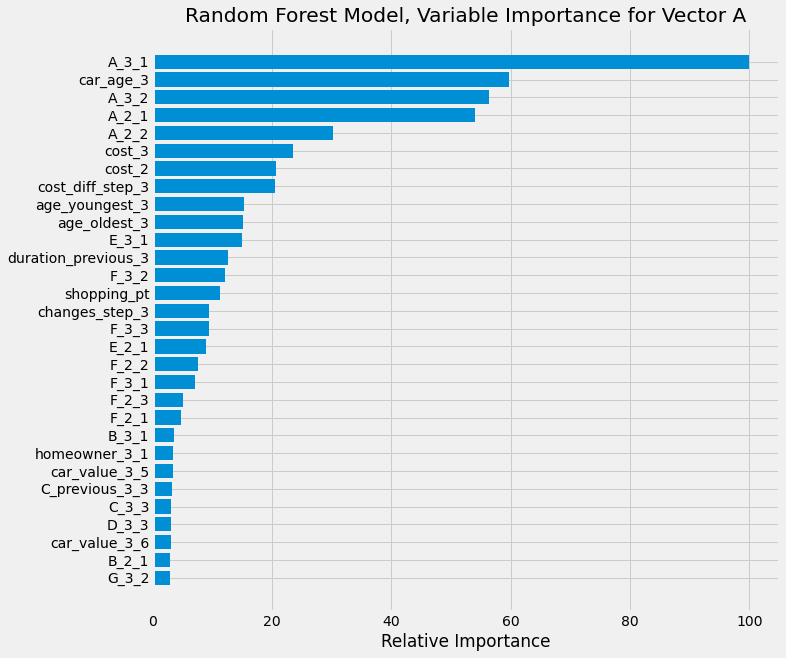

(0.8825097395940127, 0.879885431305879)

In [107]:
# Predict A using quotes 2 and 3

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot('A', n_estimators=300, min_samples_leaf = 1, min_samples_split = 2, plot=True)


In [102]:
# Now let's try a Randomized Search CV to find the best Random Forest classifier for vector A

from sklearn.model_selection import RandomizedSearchCV

vector = 'A'

param_grid = {'n_estimators' : np.arange(100,801,100), 'min_samples_split': np.arange(2,6), \
              'min_samples_leaf': np.arange(1,5)}

rf = RandomForestClassifier(random_state = 1, n_jobs=-1)

rf_cv = RandomizedSearchCV(rf, param_grid, n_iter = 60, verbose = 3, cv=4)

rf_cv.fit(X_train.to_numpy(), y_train[vector].astype('int'))

print("Random Forest Model\nBest Score:" + str(rf_cv.best_score_))
print("\nBest Parameters: " + str(rf_cv.best_params_)) 

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.881 total time=  12.9s
[CV 2/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.885 total time=  11.1s
[CV 3/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.878 total time=  10.0s
[CV 4/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.886 total time=  11.0s
[CV 1/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=500;, score=0.882 total time=  18.3s
[CV 2/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=500;, score=0.885 total time=  18.2s
[CV 3/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=500;, score=0.879 total time=  18.4s
[CV 4/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=500;, score=0.886 total time=  19.3s
[CV 1/4] END min_samples_leaf=2, min_samples_split=3, n_estimators=400;, score=0.882 total time=  14.2s
[C

[CV 4/4] END min_samples_leaf=3, min_samples_split=4, n_estimators=500;, score=0.885 total time=  16.9s
[CV 1/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=800;, score=0.882 total time=  26.1s
[CV 2/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=800;, score=0.885 total time=  26.5s
[CV 3/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=800;, score=0.879 total time=  27.1s
[CV 4/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=800;, score=0.885 total time=  27.4s
[CV 1/4] END min_samples_leaf=2, min_samples_split=2, n_estimators=200;, score=0.882 total time=   7.7s
[CV 2/4] END min_samples_leaf=2, min_samples_split=2, n_estimators=200;, score=0.885 total time=   7.0s
[CV 3/4] END min_samples_leaf=2, min_samples_split=2, n_estimators=200;, score=0.879 total time=   7.0s
[CV 4/4] END min_samples_leaf=2, min_samples_split=2, n_estimators=200;, score=0.885 total time=   6.9s
[CV 1/4] END min_samples_leaf=1, min_samples_split=2, n_estimato

[CV 3/4] END min_samples_leaf=4, min_samples_split=3, n_estimators=700;, score=0.879 total time=  29.8s
[CV 4/4] END min_samples_leaf=4, min_samples_split=3, n_estimators=700;, score=0.886 total time=  27.8s
[CV 1/4] END min_samples_leaf=4, min_samples_split=3, n_estimators=200;, score=0.881 total time=   8.0s
[CV 2/4] END min_samples_leaf=4, min_samples_split=3, n_estimators=200;, score=0.885 total time=   9.1s
[CV 3/4] END min_samples_leaf=4, min_samples_split=3, n_estimators=200;, score=0.878 total time=   8.5s
[CV 4/4] END min_samples_leaf=4, min_samples_split=3, n_estimators=200;, score=0.885 total time=   7.9s
[CV 1/4] END min_samples_leaf=1, min_samples_split=4, n_estimators=700;, score=0.882 total time=  29.9s
[CV 2/4] END min_samples_leaf=1, min_samples_split=4, n_estimators=700;, score=0.885 total time=  29.8s
[CV 3/4] END min_samples_leaf=1, min_samples_split=4, n_estimators=700;, score=0.879 total time=  28.5s
[CV 4/4] END min_samples_leaf=1, min_samples_split=4, n_estimato

[CV 2/4] END min_samples_leaf=1, min_samples_split=3, n_estimators=200;, score=0.885 total time=   6.9s
[CV 3/4] END min_samples_leaf=1, min_samples_split=3, n_estimators=200;, score=0.879 total time=   6.9s
[CV 4/4] END min_samples_leaf=1, min_samples_split=3, n_estimators=200;, score=0.886 total time=   7.0s
Random Forest Model
Best Score:0.8834093921216074

Best Parameters: {'n_estimators': 700, 'min_samples_split': 2, 'min_samples_leaf': 1}


In [104]:
results = pd.DataFrame(rf_cv.cv_results_['params'])
results['train_score'] = rf_cv.cv_results_['mean_test_score']
results['train_rank'] = rf_cv.cv_results_['rank_test_score']
datapath="Modelling_data/quotes_2_3"
save_file(results, 'rf_results_q2_q3_vectorA.csv', datapath)

Directory Modelling_data/quotes_2_3 was created.
Writing file.  "Modelling_data/quotes_2_3\rf_results_q2_q3_vectorA.csv"


In [113]:

vector = 'A'

for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    min_samples_leaf = row['min_samples_leaf']
    min_samples_split = row['min_samples_split']
    
    results.loc[i, 'test_score'], results.loc[i, 'f1_score'], rf_probs = rf_predict_plot(vector, n_estimators=int(n_estimators), \
                                                                min_samples_leaf = int(min_samples_leaf), \
                                                                min_samples_split = int(min_samples_split), plot=False)
    
results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
datapath="Modelling_data/quotes_2_3"
save_file(results, 'rf_results_q2_q3_vectorA_final.csv', datapath)


Random Forest Classifier results for Vector A
Parameters: No. of Estimators = 300,  min_samples_leaf = 4,     min_samples_split = 5
Accuracy=0.8822, f1-score=0.8796
Random Forest Classifier results for Vector A
Parameters: No. of Estimators = 500,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8827, f1-score=0.8801
Random Forest Classifier results for Vector A
Parameters: No. of Estimators = 400,  min_samples_leaf = 2,     min_samples_split = 3
Accuracy=0.8821, f1-score=0.8795
Random Forest Classifier results for Vector A
Parameters: No. of Estimators = 400,  min_samples_leaf = 3,     min_samples_split = 5
Accuracy=0.8825, f1-score=0.8799
Random Forest Classifier results for Vector A
Parameters: No. of Estimators = 400,  min_samples_leaf = 4,     min_samples_split = 4
Accuracy=0.8822, f1-score=0.8796
Random Forest Classifier results for Vector A
Parameters: No. of Estimators = 700,  min_samples_leaf = 3,     min_samples_split = 5
Accuracy=0.8824, f1-score=0.8798
Random For

Random Forest Classifier results for Vector A
Parameters: No. of Estimators = 700,  min_samples_leaf = 2,     min_samples_split = 5
Accuracy=0.8824, f1-score=0.8798
Random Forest Classifier results for Vector A
Parameters: No. of Estimators = 300,  min_samples_leaf = 3,     min_samples_split = 5
Accuracy=0.8824, f1-score=0.8798
Random Forest Classifier results for Vector A
Parameters: No. of Estimators = 100,  min_samples_leaf = 3,     min_samples_split = 4
Accuracy=0.8824, f1-score=0.8798
Random Forest Classifier results for Vector A
Parameters: No. of Estimators = 300,  min_samples_leaf = 3,     min_samples_split = 3
Accuracy=0.8824, f1-score=0.8798
Random Forest Classifier results for Vector A
Parameters: No. of Estimators = 600,  min_samples_leaf = 4,     min_samples_split = 4
Accuracy=0.8821, f1-score=0.8795
Random Forest Classifier results for Vector A
Parameters: No. of Estimators = 100,  min_samples_leaf = 4,     min_samples_split = 2
Accuracy=0.8824, f1-score=0.8798
Random For

In [115]:
results

,n_estimators,min_samples_split,min_samples_leaf,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,300,5,4,0.882572,55,0.882168,0.879568,9.0,0.882370,38.0
1,500,2,1,0.883239,5,0.882715,0.880093,1.0,0.882977,2.0
2,400,3,2,0.882965,22,0.882100,0.879496,10.0,0.882532,27.0
3,400,5,3,0.882709,34,0.882510,0.879909,4.0,0.882609,21.0
4,400,4,4,0.882606,52,0.882168,0.879572,9.0,0.882387,37.0
5,700,5,3,0.882794,29,0.882441,0.879840,5.0,0.882618,20.0
6,100,2,3,0.882675,44,0.882373,0.879786,6.0,0.882524,29.0
7,500,2,3,0.882692,39,0.882510,0.879907,4.0,0.882601,23.0
8,300,4,2,0.883068,12,0.881895,0.879292,12.0,0.882481,31.0
9,800,3,4,0.882658,48,0.882236,0.879638,8.0,0.882447,32.0


Random Forest Classifier results for Vector A
Parameters: No. of Estimators = 400,  min_samples_leaf = 1,     min_samples_split = 3
Accuracy=0.8826, f1-score=0.88
Confusion Matrix - normalized
 [[0.8555 0.1206 0.0239]
 [0.0267 0.9461 0.0272]
 [0.0385 0.2721 0.6894]]
Confusion Matrix
 [[2789  393   78]
 [ 238 8425  242]
 [  95  671 1700]]

Classification Report 
               precision    recall  f1-score   support

           0       0.89      0.86      0.87      3260
           1       0.89      0.95      0.92      8905
           2       0.84      0.69      0.76      2466

    accuracy                           0.88     14631
   macro avg       0.87      0.83      0.85     14631
weighted avg       0.88      0.88      0.88     14631

30


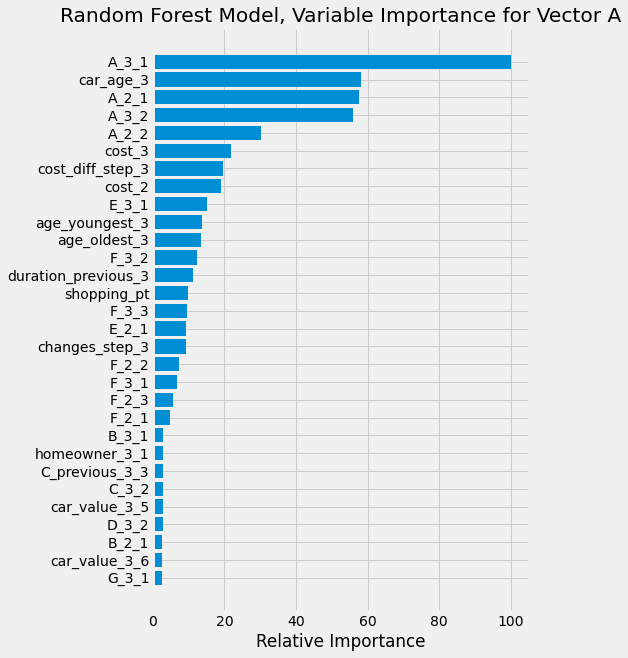

In [546]:
# Vector A random forest Running the best model: overall rank = 1 (Iteration 34)
rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot('A', n_estimators=400, min_samples_leaf = 1, min_samples_split = 3, plot=True)


In [542]:
vector = 'A'
model = 'rf'

acc = np.around(np.sum(same_as_3)/y_test.shape[0], 4)

score_matrix = model_score_matrix(vector, 3, rf_preds)

score = model_score_by_shopping_pt(vector, 3, rf_preds)

perf_q2q3.update(vector, 'no_model', 'overall', acc*100)
perf_q2q3.update(vector, model, 'overall', round(rf_ac*100,2))
perf_q2q3.update(vector, model, 'customer_type', score_matrix)
perf_q2q3.update(vector, model, 'shopping_pt', score)
perf_q2q3.compare(vector, model)
perf_q2q3.record[vector]


C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3711009155.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3711009155.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3711009155.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice f

,no_model,rf,rf_vs_no_model
accuracy_overall,87.88,88.26,0.38
accuracy_cust_changed_vector,0,3.89,3.89
accuracy_cust_maintained_vector,100,99.90,-0.1
accuracy_shopping_pt_4,90.47,90.86,0.39
accuracy_shopping_pt_5,90.57,90.63,0.06
accuracy_shopping_pt_6,88.76,89.04,0.28
accuracy_shopping_pt_7,88.43,88.47,0.04
accuracy_shopping_pt_8,87.1,87.57,0.47
accuracy_shopping_pt_9,85.04,85.82,0.78
accuracy_shopping_pt_10,85.17,86.20,1.03


XGBoost Classifier results for Vector A
Parameters: No. of Estimators = 200,  max_depth = 1,     learning_rate = 0.3, colsample_bytree = 1
Accuracy=0.8824, f1-score=0.8798
Confusion Matrix - normalized
 [[0.855 0.121 0.024]
 [0.027 0.946 0.028]
 [0.036 0.274 0.69 ]]
Confusion Matrix
 [[2787  396   77]
 [ 236 8422  247]
 [  89  676 1701]]

Classification Report 
               precision    recall  f1-score   support

           0       0.90      0.85      0.87      3260
           1       0.89      0.95      0.92      8905
           2       0.84      0.69      0.76      2466

    accuracy                           0.88     14631
   macro avg       0.87      0.83      0.85     14631
weighted avg       0.88      0.88      0.88     14631

30


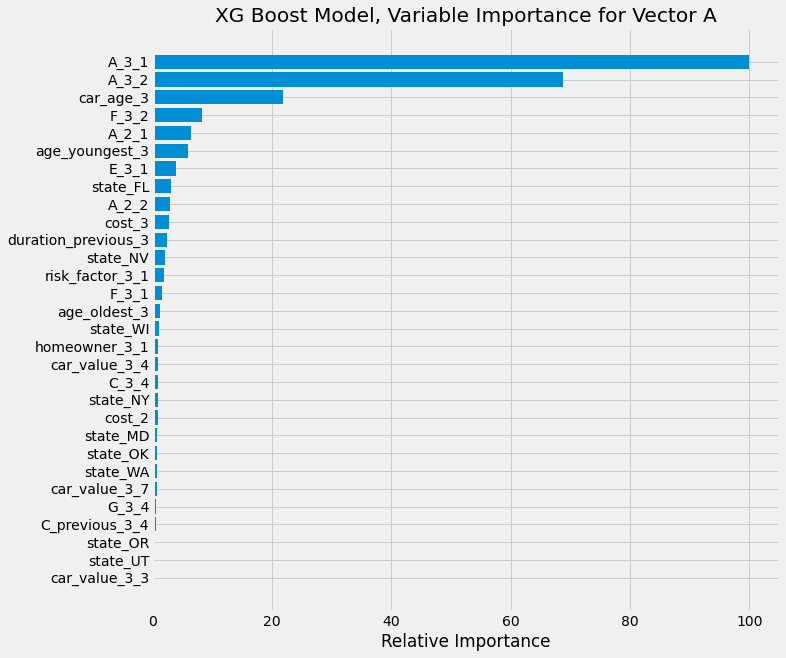

(0.882373043537694, 0.8797863746811294)

In [117]:
#Let's predict A using XG Boost Classifier

vector = 'A'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators=200, max_depth = 1, learning_rate = 0.3, colsample_bytree = 1, plot = True)



In [119]:
# Let's use RandomizedSearchCV to find the best XGB classifier Hyperparamters for vector A

results = xgb_randomsearch("A", 60)

datapath="Modelling_data/quotes_2_3"
save_file(results, 'xgboost_results_q2_q3_vectorA.csv', datapath)


Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=5, n_estimators=100;, score=0.879 total time=   3.7s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=5, n_estimators=100;, score=0.885 total time=   3.6s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=5, n_estimators=100;, score=0.878 total time=   4.4s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=5, n_estimators=100;, score=0.885 total time=   5.1s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=5, n_estimators=200;, score=0.881 total time=   7.5s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=5, n_estimators=200;, score=0.886 total time=   7.2s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=5, n_estimators=200;, score=0.876 total time=   7.8s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=5, n_estimators=200;, score=0.885 total

[CV 2/4] END colsample_bytree=0.35, learning_rate=0.3, max_depth=4, n_estimators=500;, score=0.881 total time=  26.6s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.3, max_depth=4, n_estimators=500;, score=0.873 total time=  24.1s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.3, max_depth=4, n_estimators=500;, score=0.884 total time=  23.6s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.880 total time=  20.3s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.882 total time=  19.5s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.875 total time=  18.7s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=500;, score=0.884 total time=  18.6s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=4, n_estimators=500;, score=0.879 total time=  19.9s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0

[CV 4/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=5, n_estimators=100;, score=0.884 total time=   6.8s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=4, n_estimators=200;, score=0.880 total time=  10.4s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=4, n_estimators=200;, score=0.884 total time=   9.4s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=4, n_estimators=200;, score=0.876 total time=   9.2s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=4, n_estimators=200;, score=0.884 total time=   9.1s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=200;, score=0.881 total time=   7.1s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=200;, score=0.884 total time=   7.3s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=200;, score=0.878 total time=   7.2s
[CV 4/4] END colsample_bytree=0.35, learning_rat

[CV 2/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=4, n_estimators=500;, score=0.883 total time=  20.3s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=4, n_estimators=500;, score=0.874 total time=  19.8s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=4, n_estimators=500;, score=0.883 total time=  20.7s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=4, n_estimators=300;, score=0.880 total time=  12.5s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=4, n_estimators=300;, score=0.884 total time=  11.8s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=4, n_estimators=300;, score=0.875 total time=  11.7s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=4, n_estimators=300;, score=0.885 total time=  12.0s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=200;, score=0.880 total time=  12.3s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.3,

In [123]:
vector = 'A'

for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    max_depth = row['max_depth']
    learning_rate = row['learning_rate']
    colsample_bytree = row['colsample_bytree']
    
    results.loc[i, 'test_score'], results.loc[i, 'f1_score'], xg_probs = xg_predict_plot(vector, n_estimators=int(n_estimators), \
                                                                max_depth = int(max_depth), learning_rate = learning_rate, \
                                                                colsample_bytree = colsample_bytree, plot=False)
    
results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
datapath="Modelling_data/quotes_2_3"
save_file(results, 'xgboost_results_q2_q3_vectorA_final.csv', datapath)


XGBoost Classifier results for Vector A
Parameters: No. of Estimators = 100,  max_depth = 5,     learning_rate = 0.35, colsample_bytree = 0.25
Accuracy=0.8808, f1-score=0.8782
XGBoost Classifier results for Vector A
Parameters: No. of Estimators = 200,  max_depth = 5,     learning_rate = 0.25, colsample_bytree = 0.15
Accuracy=0.8816, f1-score=0.879
XGBoost Classifier results for Vector A
Parameters: No. of Estimators = 300,  max_depth = 3,     learning_rate = 0.5, colsample_bytree = 0.15
Accuracy=0.8813, f1-score=0.8787
XGBoost Classifier results for Vector A
Parameters: No. of Estimators = 300,  max_depth = 4,     learning_rate = 0.25, colsample_bytree = 0.5
Accuracy=0.8811, f1-score=0.8786
XGBoost Classifier results for Vector A
Parameters: No. of Estimators = 100,  max_depth = 5,     learning_rate = 0.35, colsample_bytree = 0.5
Accuracy=0.8818, f1-score=0.8792
XGBoost Classifier results for Vector A
Parameters: No. of Estimators = 200,  max_depth = 4,     learning_rate = 0.3, colsam

XGBoost Classifier results for Vector A
Parameters: No. of Estimators = 300,  max_depth = 3,     learning_rate = 0.5, colsample_bytree = 0.25
Accuracy=0.8809, f1-score=0.8783
XGBoost Classifier results for Vector A
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.25, colsample_bytree = 0.5
Accuracy=0.8824, f1-score=0.8798
XGBoost Classifier results for Vector A
Parameters: No. of Estimators = 500,  max_depth = 5,     learning_rate = 0.25, colsample_bytree = 0.35
Accuracy=0.8803, f1-score=0.8777
XGBoost Classifier results for Vector A
Parameters: No. of Estimators = 500,  max_depth = 5,     learning_rate = 0.25, colsample_bytree = 0.5
Accuracy=0.879, f1-score=0.8764
XGBoost Classifier results for Vector A
Parameters: No. of Estimators = 400,  max_depth = 4,     learning_rate = 0.5, colsample_bytree = 0.35
Accuracy=0.8777, f1-score=0.8751
XGBoost Classifier results for Vector A
Parameters: No. of Estimators = 500,  max_depth = 4,     learning_rate = 0.3, colsamp

In [124]:
results

,n_estimators,max_depth,learning_rate,colsample_bytree,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,100,5,0.35,0.25,0.881666,18,0.880801,0.878242,24.0,0.881234,26.0
1,200,5,0.25,0.15,0.882042,8,0.881621,0.879039,15.0,0.881832,15.0
2,300,3,0.50,0.15,0.880573,37,0.881348,0.878738,19.0,0.880960,32.0
3,300,4,0.25,0.50,0.881068,28,0.881143,0.878605,21.0,0.881106,28.0
4,100,5,0.35,0.50,0.881427,22,0.881758,0.879208,14.0,0.881593,18.0
5,200,4,0.30,0.25,0.881820,13,0.882031,0.879524,10.0,0.881926,13.0
6,300,5,0.30,0.35,0.879889,44,0.880323,0.877720,28.0,0.880106,41.0
7,100,5,0.30,0.25,0.882162,5,0.882715,0.880159,4.0,0.882438,3.0
8,500,4,0.25,0.50,0.879872,45,0.879981,0.877417,31.0,0.879927,44.0
9,300,5,0.30,0.25,0.880573,36,0.880391,0.877777,27.0,0.880482,39.0


XGBoost Classifier results for Vector A
Parameters: No. of Estimators = 100,  max_depth = 4,     learning_rate = 0.25, colsample_bytree = 0.5
Accuracy=0.8831, f1-score=0.8805
Confusion Matrix - normalized
 [[0.8586 0.1184 0.023 ]
 [0.0265 0.9461 0.0274]
 [0.0365 0.2753 0.6882]]
Confusion Matrix
 [[2799  386   75]
 [ 236 8425  244]
 [  90  679 1697]]

Classification Report 
               precision    recall  f1-score   support

           0       0.90      0.86      0.88      3260
           1       0.89      0.95      0.92      8905
           2       0.84      0.69      0.76      2466

    accuracy                           0.88     14631
   macro avg       0.88      0.83      0.85     14631
weighted avg       0.88      0.88      0.88     14631

30


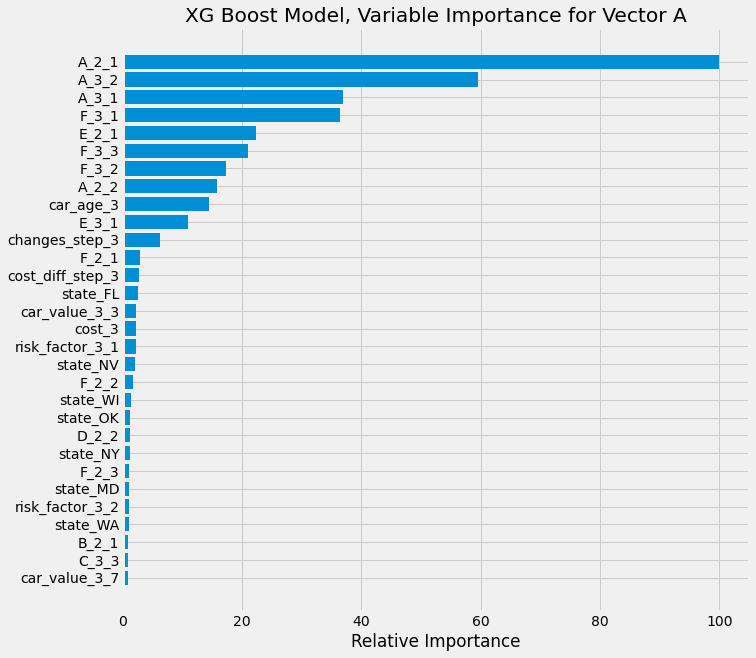

In [543]:
#Let's plot the best model for A using XG Boost Classifier (Iteration 30)

xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot('A', n_estimators=100, max_depth = 4, learning_rate = 0.25, colsample_bytree = 0.5, plot = True)


In [143]:
vector = 'A'
score_matrix = model_score_matrix(vector, 3, xg_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,1646,127,7.163001
cust_maintained_vector,64,12794,99.502255


In [544]:
vector = 'A'
model = 'xg'

#acc = np.around(np.sum(same_as_3)/y_test.shape[0], 4)

score_matrix = model_score_matrix(vector, 3, xg_preds)

score = model_score_by_shopping_pt(vector, 3, xg_preds)

perf_q2q3.update(vector, 'no_model', 'overall', acc*100)
perf_q2q3.update(vector, model, 'overall', round(xg_ac*100,2))
perf_q2q3.update(vector, model, 'customer_type', score_matrix)
perf_q2q3.update(vector, model, 'shopping_pt', score)
perf_q2q3.compare(vector, model)
perf_q2q3.record[vector]

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3711009155.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3711009155.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/3711009155.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice f

,no_model,rf,rf_vs_no_model,xg,xg_vs_no_model
accuracy_overall,87.88,88.26,0.38,88.31,0.43
accuracy_cust_changed_vector,0,3.89,3.89,7.16,7.16
accuracy_cust_maintained_vector,100,99.90,-0.1,99.50,-0.5
accuracy_shopping_pt_4,90.47,90.86,0.39,90.94,0.47
accuracy_shopping_pt_5,90.57,90.63,0.06,90.40,-0.17
accuracy_shopping_pt_6,88.76,89.04,0.28,89.24,0.48
accuracy_shopping_pt_7,88.43,88.47,0.04,88.74,0.31
accuracy_shopping_pt_8,87.1,87.57,0.47,87.72,0.62
accuracy_shopping_pt_9,85.04,85.82,0.78,85.87,0.83
accuracy_shopping_pt_10,85.17,86.20,1.03,85.68,0.51


# Quote 2 & 3: Predict B

In [128]:
vector = 'B'
last_quote = 3

test_set = df_hist_2_3.iloc[y_test.index,:]

x = pd.crosstab(test_set[vector], test_set[vector+'_'+str(last_quote)])

same_as_3 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 

print(f"Accuracy based on simply predicting vector {vector} = {vector}_{last_quote} : {(np.sum(same_as_3)/y_test.shape[0]): 4.4}")
print(f"Confusion_Matrix")

x['total'] = x.sum(axis=1)
x['B0_%'] = np.around(x[0]/ x['total'], 4)
x['B1_%'] = np.around(x[1]/ x['total'], 4)
x


Accuracy based on simply predicting vector B = B_3 :  0.8842
Confusion_Matrix


B_3,0,1,total,B0_%,B1_%
B,,,,,
0,6960,686,7646,0.9103,0.0897
1,1008,5977,6985,0.1443,0.8557


In [186]:
vector = 'B'
last_quote = 3
test_set2 = df_hist_2_3.iloc[y_train.index,:]
x2 = pd.crosstab(test_set2[vector], test_set2[vector+'_'+str(last_quote)])
same_as_3 = [x2.iloc[idx,idx] for idx in range(x2.shape[0])] 
print(f"TRAINING Accuracy based on simply predicting vector {vector} = {vector}_{last_quote} : {(np.sum(same_as_3)/y_train.shape[0]): 4.4}")
print(f"Confusion_Matrix - TRAINING")
x2['total'] = x2.sum(axis=1)
x2['B0_%'] = np.around(x2[0]/ x2['total'], 4)
x2['B1_%'] = np.around(x2[1]/ x2['total'], 4)
x2

TRAINING Accuracy based on simply predicting vector B = B_3 :  0.8867
Confusion_Matrix - TRAINING


B_3,0,1,total,B0_%,B1_%
B,,,,,
0,27846,2760,30606,0.9098,0.0902
1,3868,24047,27915,0.1386,0.8614


Random Forest Classifier results for Vector B
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8842, f1-score=0.884
Confusion Matrix - normalized
 [[0.91   0.09  ]
 [0.1442 0.8558]]
Confusion Matrix
 [[6958  688]
 [1007 5978]]

Classification Report 
               precision    recall  f1-score   support

           0       0.87      0.91      0.89      7646
           1       0.90      0.86      0.88      6985

    accuracy                           0.88     14631
   macro avg       0.89      0.88      0.88     14631
weighted avg       0.88      0.88      0.88     14631

30


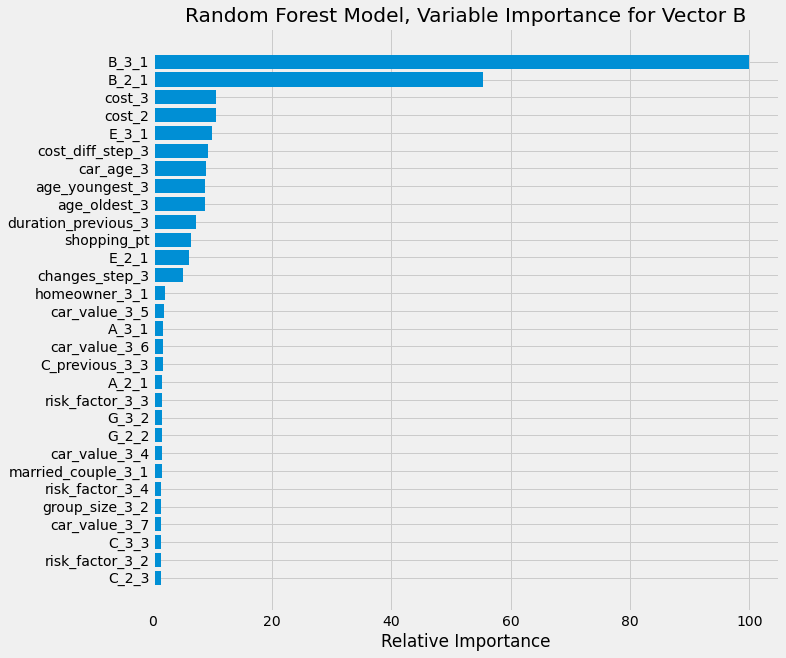

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END min_samples_leaf=4, min_samples_split=4, n_estimators=800;, score=0.883 total time=  41.7s
[CV 2/4] END min_samples_leaf=4, min_samples_split=4, n_estimators=800;, score=0.890 total time=  27.2s
[CV 3/4] END min_samples_leaf=4, min_samples_split=4, n_estimators=800;, score=0.886 total time=  27.5s
[CV 4/4] END min_samples_leaf=4, min_samples_split=4, n_estimators=800;, score=0.888 total time=  26.7s
[CV 1/4] END min_samples_leaf=3, min_samples_split=5, n_estimators=300;, score=0.883 total time=  10.2s
[CV 2/4] END min_samples_leaf=3, min_samples_split=5, n_estimators=300;, score=0.890 total time=  10.2s
[CV 3/4] END min_samples_leaf=3, min_samples_split=5, n_estimators=300;, score=0.886 total time=  11.3s
[CV 4/4] END min_samples_leaf=3, min_samples_split=5, n_estimators=300;, score=0.888 total time=  13.2s
[CV 1/4] END min_samples_leaf=1, min_samples_split=4, n_estimators=800;, score=0.883 total time=  36.8s
[C

[CV 4/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=600;, score=0.888 total time=  21.6s
[CV 1/4] END min_samples_leaf=3, min_samples_split=2, n_estimators=700;, score=0.883 total time=  23.7s
[CV 2/4] END min_samples_leaf=3, min_samples_split=2, n_estimators=700;, score=0.890 total time=  24.2s
[CV 3/4] END min_samples_leaf=3, min_samples_split=2, n_estimators=700;, score=0.886 total time=  23.3s
[CV 4/4] END min_samples_leaf=3, min_samples_split=2, n_estimators=700;, score=0.888 total time=  23.5s
[CV 1/4] END min_samples_leaf=2, min_samples_split=2, n_estimators=800;, score=0.883 total time=  27.7s
[CV 2/4] END min_samples_leaf=2, min_samples_split=2, n_estimators=800;, score=0.890 total time=  27.2s
[CV 3/4] END min_samples_leaf=2, min_samples_split=2, n_estimators=800;, score=0.886 total time=  26.9s
[CV 4/4] END min_samples_leaf=2, min_samples_split=2, n_estimators=800;, score=0.888 total time=  27.0s
[CV 1/4] END min_samples_leaf=2, min_samples_split=5, n_estimato

[CV 3/4] END min_samples_leaf=3, min_samples_split=3, n_estimators=600;, score=0.886 total time=  22.5s
[CV 4/4] END min_samples_leaf=3, min_samples_split=3, n_estimators=600;, score=0.888 total time=  23.5s
[CV 1/4] END min_samples_leaf=2, min_samples_split=3, n_estimators=700;, score=0.883 total time=  26.6s
[CV 2/4] END min_samples_leaf=2, min_samples_split=3, n_estimators=700;, score=0.890 total time=  27.6s
[CV 3/4] END min_samples_leaf=2, min_samples_split=3, n_estimators=700;, score=0.886 total time=  29.6s
[CV 4/4] END min_samples_leaf=2, min_samples_split=3, n_estimators=700;, score=0.888 total time=  26.9s
[CV 1/4] END min_samples_leaf=3, min_samples_split=3, n_estimators=100;, score=0.883 total time=   3.8s
[CV 2/4] END min_samples_leaf=3, min_samples_split=3, n_estimators=100;, score=0.890 total time=   3.8s
[CV 3/4] END min_samples_leaf=3, min_samples_split=3, n_estimators=100;, score=0.886 total time=   3.8s
[CV 4/4] END min_samples_leaf=3, min_samples_split=3, n_estimato

[CV 2/4] END min_samples_leaf=3, min_samples_split=5, n_estimators=600;, score=0.890 total time=  22.0s
[CV 3/4] END min_samples_leaf=3, min_samples_split=5, n_estimators=600;, score=0.886 total time=  22.4s
[CV 4/4] END min_samples_leaf=3, min_samples_split=5, n_estimators=600;, score=0.888 total time=  23.0s
Vector B RandomizedSearchCV: Random Forest Model
Best Score:0.8867586639067705
Best Parameters: {'n_estimators': 500, 'min_samples_split': 5, 'min_samples_leaf': 1}
Writing file.  "Modelling_data/quotes_2_3\rf_results_q2_q3_vectorB.csv"


In [129]:
# RF Classifier Predict B using quotes 2 and 3 and then RandomizedSearchCV to find best hyperparameters

vector = 'B'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=300, min_samples_leaf = 1, min_samples_split = 2, plot=True)

results = rf_randomsearch(vector, 60)

datapath="Modelling_data/quotes_2_3"
filename1 = 'rf_results_q2_q3_vector'+vector+'.csv'
save_file(results, filename1, datapath)


In [131]:
vector = 'B'

for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    min_samples_leaf = row['min_samples_leaf']
    min_samples_split = row['min_samples_split']
    
    results.loc[i, 'test_score'], results.loc[i, 'f1_score'], rf_probs = rf_predict_plot(vector, n_estimators=int(n_estimators), \
                                                                min_samples_leaf = int(min_samples_leaf), \
                                                                min_samples_split = int(min_samples_split), plot=False)
    
results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
datapath="Modelling_data/quotes_2_3"
filename2 = 'rf_results_q2_q3_vector'+vector+'_final.csv'
save_file(results, filename2, datapath)


Random Forest Classifier results for Vector B
Parameters: No. of Estimators = 800,  min_samples_leaf = 4,     min_samples_split = 4
Accuracy=0.8842, f1-score=0.884
Random Forest Classifier results for Vector B
Parameters: No. of Estimators = 300,  min_samples_leaf = 3,     min_samples_split = 5
Accuracy=0.8842, f1-score=0.884
Random Forest Classifier results for Vector B
Parameters: No. of Estimators = 800,  min_samples_leaf = 1,     min_samples_split = 4
Accuracy=0.884, f1-score=0.8838
Random Forest Classifier results for Vector B
Parameters: No. of Estimators = 300,  min_samples_leaf = 4,     min_samples_split = 4
Accuracy=0.8842, f1-score=0.884
Random Forest Classifier results for Vector B
Parameters: No. of Estimators = 700,  min_samples_leaf = 3,     min_samples_split = 5
Accuracy=0.8842, f1-score=0.884
Random Forest Classifier results for Vector B
Parameters: No. of Estimators = 500,  min_samples_leaf = 4,     min_samples_split = 4
Accuracy=0.8842, f1-score=0.884
Random Forest Cl

Random Forest Classifier results for Vector B
Parameters: No. of Estimators = 700,  min_samples_leaf = 1,     min_samples_split = 5
Accuracy=0.8841, f1-score=0.8839
Random Forest Classifier results for Vector B
Parameters: No. of Estimators = 600,  min_samples_leaf = 2,     min_samples_split = 3
Accuracy=0.8842, f1-score=0.884
Random Forest Classifier results for Vector B
Parameters: No. of Estimators = 600,  min_samples_leaf = 1,     min_samples_split = 3
Accuracy=0.8842, f1-score=0.884
Random Forest Classifier results for Vector B
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 3
Accuracy=0.8844, f1-score=0.8842
Random Forest Classifier results for Vector B
Parameters: No. of Estimators = 200,  min_samples_leaf = 3,     min_samples_split = 5
Accuracy=0.8842, f1-score=0.884
Random Forest Classifier results for Vector B
Parameters: No. of Estimators = 300,  min_samples_leaf = 3,     min_samples_split = 4
Accuracy=0.8842, f1-score=0.884
Random Forest 

In [132]:
results

,n_estimators,min_samples_split,min_samples_leaf,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,800,4,4,0.886742,4,0.884218,0.884046,2.0,0.885480,3.0
1,300,5,3,0.886707,31,0.884218,0.884046,2.0,0.885463,6.0
2,800,4,1,0.886673,53,0.884013,0.883843,5.0,0.885343,19.0
3,300,4,4,0.886742,4,0.884218,0.884046,2.0,0.885480,3.0
4,700,5,3,0.886707,31,0.884218,0.884046,2.0,0.885463,6.0
5,500,4,4,0.886742,4,0.884218,0.884046,2.0,0.885480,3.0
6,500,4,1,0.886724,21,0.884013,0.883843,5.0,0.885369,18.0
7,600,2,2,0.886724,21,0.884150,0.883979,3.0,0.885437,11.0
8,300,3,3,0.886707,31,0.884218,0.884046,2.0,0.885463,6.0
9,500,3,1,0.886724,20,0.884218,0.884048,2.0,0.885471,4.0


Random Forest Classifier results for Vector B
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 3
Accuracy=0.8844, f1-score=0.8842
Confusion Matrix - normalized
 [[0.9103 0.0897]
 [0.144  0.856 ]]
Confusion Matrix
 [[6960  686]
 [1006 5979]]

Classification Report 
               precision    recall  f1-score   support

           0       0.87      0.91      0.89      7646
           1       0.90      0.86      0.88      6985

    accuracy                           0.88     14631
   macro avg       0.89      0.88      0.88     14631
weighted avg       0.88      0.88      0.88     14631

30


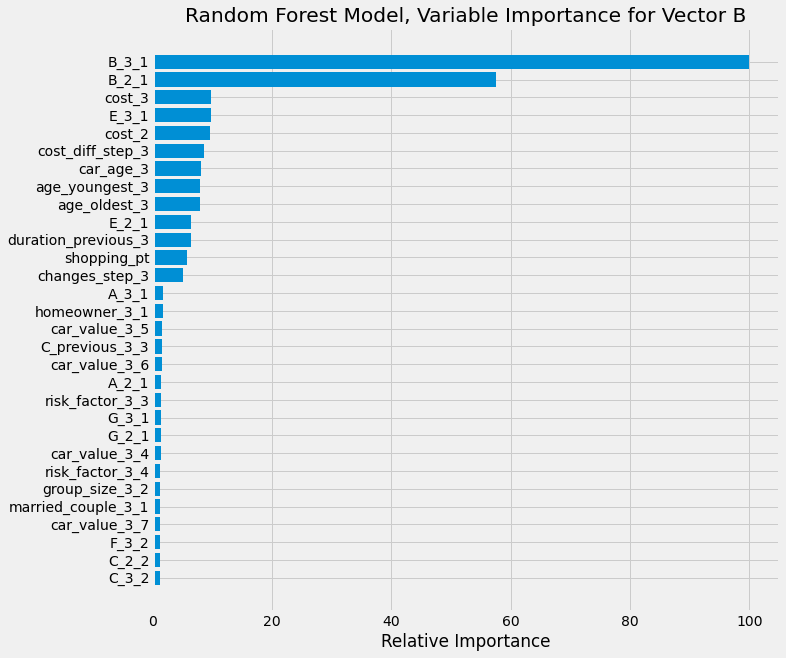

In [140]:
# Predict and plot B using best RF Model using quotes 2 and 3 (Iteration 53)
vector = 'B'
rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=300, min_samples_leaf = 1, min_samples_split = 3, plot=True)


In [141]:
vector = 'B'
score_matrix = model_score_matrix(vector, 3, rf_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,1692,2,0.118064
cust_maintained_vector,0,12937,100.000000


XGBoost Classifier results for Vector B
Parameters: No. of Estimators = 200,  max_depth = 1,     learning_rate = 0.3, colsample_bytree = 1
Accuracy=0.8842, f1-score=0.884
Confusion Matrix - normalized
 [[0.9103 0.0897]
 [0.1443 0.8557]]
Confusion Matrix
 [[6960  686]
 [1008 5977]]

Classification Report 
               precision    recall  f1-score   support

           0       0.87      0.91      0.89      7646
           1       0.90      0.86      0.88      6985

    accuracy                           0.88     14631
   macro avg       0.89      0.88      0.88     14631
weighted avg       0.88      0.88      0.88     14631

30


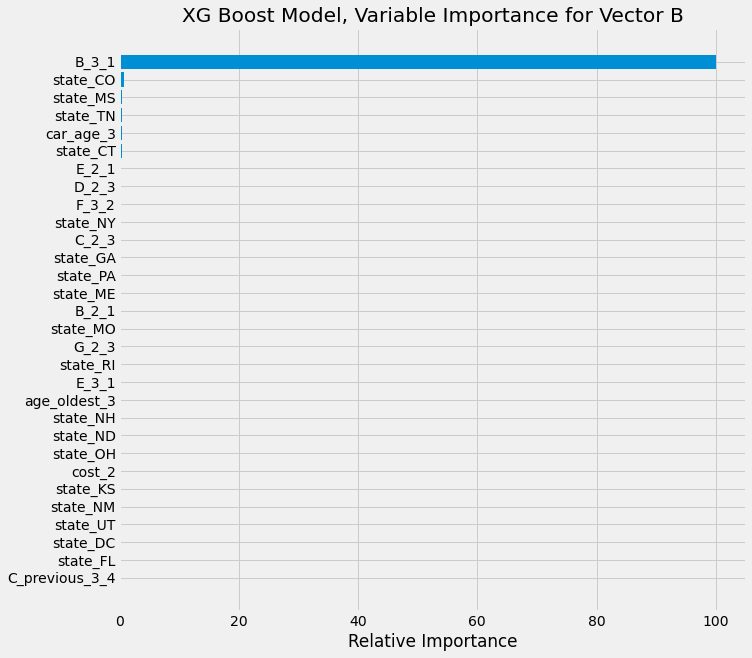

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=200;, score=0.883 total time=   3.0s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=200;, score=0.890 total time=   2.6s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=200;, score=0.885 total time=   2.3s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=200;, score=0.887 total time=   3.3s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=100;, score=0.883 total time=   3.7s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=100;, score=0.890 total time=   3.8s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=100;, score=0.885 total time=   2.8s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=100;, score=0.888 total time=  

[CV 2/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=5, n_estimators=400;, score=0.880 total time=  11.2s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=5, n_estimators=400;, score=0.873 total time=  10.1s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=5, n_estimators=400;, score=0.877 total time=  12.7s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=3, n_estimators=200;, score=0.883 total time=   4.9s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=3, n_estimators=200;, score=0.890 total time=   6.2s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=3, n_estimators=200;, score=0.885 total time=   3.8s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=3, n_estimators=200;, score=0.888 total time=   4.4s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=4, n_estimators=200;, score=0.881 total time=   4.6s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.5, m

[CV 4/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=5, n_estimators=500;, score=0.883 total time=  20.8s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=200;, score=0.882 total time=   7.0s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=200;, score=0.889 total time=   7.1s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=200;, score=0.885 total time=   7.0s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=200;, score=0.887 total time=   6.9s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=4, n_estimators=400;, score=0.879 total time=  11.6s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=4, n_estimators=400;, score=0.888 total time=  12.2s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=4, n_estimators=400;, score=0.882 total time=  13.1s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.35, ma

[CV 2/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=5, n_estimators=300;, score=0.888 total time=   4.6s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=5, n_estimators=300;, score=0.884 total time=   4.7s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=5, n_estimators=300;, score=0.886 total time=   4.7s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=100;, score=0.880 total time=   3.3s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=100;, score=0.886 total time=   3.2s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=100;, score=0.883 total time=   2.8s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=100;, score=0.885 total time=   2.9s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=4, n_estimators=400;, score=0.881 total time=   5.6s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.3, max_d

In [135]:
#Let's predict B using XG Boost Classifier and use RandomizedSearchCV to find the best XGB classifier Hyperparamters 

xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators=200, max_depth = 1, learning_rate = 0.3, colsample_bytree = 1, plot = True)

results = xgb_randomsearch(vector, 60)

datapath="Modelling_data/quotes_2_3"
filename3 = 'xgboost_results_q2_q3_vector'+vector+'.csv'
save_file(results, filename3, datapath)


In [137]:
# Calculate scores for the test set
vector = 'B'
for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    max_depth = row['max_depth']
    learning_rate = row['learning_rate']
    colsample_bytree = row['colsample_bytree']
    
    results.loc[i, 'test_score'], results.loc[i, 'f1_score'], xg_probs = xg_predict_plot(vector, n_estimators=int(n_estimators), \
                                                                max_depth = int(max_depth), learning_rate = learning_rate, \
                                                                colsample_bytree = colsample_bytree, plot=False)
    
results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
datapath="Modelling_data/quotes_2_3"
filename4 = 'xgboost_results_q2_q3_vector'+vector+'_final.csv'
save_file(results, filename4, datapath)

XGBoost Classifier results for Vector B
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.35, colsample_bytree = 0.35
Accuracy=0.8836, f1-score=0.8834
XGBoost Classifier results for Vector B
Parameters: No. of Estimators = 100,  max_depth = 4,     learning_rate = 0.3, colsample_bytree = 0.5
Accuracy=0.8841, f1-score=0.8839
XGBoost Classifier results for Vector B
Parameters: No. of Estimators = 400,  max_depth = 5,     learning_rate = 0.3, colsample_bytree = 0.35
Accuracy=0.8805, f1-score=0.8803
XGBoost Classifier results for Vector B
Parameters: No. of Estimators = 300,  max_depth = 5,     learning_rate = 0.35, colsample_bytree = 0.15
Accuracy=0.8822, f1-score=0.882
XGBoost Classifier results for Vector B
Parameters: No. of Estimators = 300,  max_depth = 3,     learning_rate = 0.25, colsample_bytree = 0.5
Accuracy=0.8837, f1-score=0.8836
XGBoost Classifier results for Vector B
Parameters: No. of Estimators = 300,  max_depth = 4,     learning_rate = 0.35, colsam

XGBoost Classifier results for Vector B
Parameters: No. of Estimators = 300,  max_depth = 4,     learning_rate = 0.25, colsample_bytree = 0.25
Accuracy=0.883, f1-score=0.8828
XGBoost Classifier results for Vector B
Parameters: No. of Estimators = 400,  max_depth = 3,     learning_rate = 0.5, colsample_bytree = 0.15
Accuracy=0.8825, f1-score=0.8823
XGBoost Classifier results for Vector B
Parameters: No. of Estimators = 100,  max_depth = 4,     learning_rate = 0.3, colsample_bytree = 0.35
Accuracy=0.8838, f1-score=0.8836
XGBoost Classifier results for Vector B
Parameters: No. of Estimators = 400,  max_depth = 5,     learning_rate = 0.3, colsample_bytree = 0.25
Accuracy=0.882, f1-score=0.8818
XGBoost Classifier results for Vector B
Parameters: No. of Estimators = 100,  max_depth = 4,     learning_rate = 0.3, colsample_bytree = 0.25
Accuracy=0.8842, f1-score=0.884
XGBoost Classifier results for Vector B
Parameters: No. of Estimators = 300,  max_depth = 5,     learning_rate = 0.3, colsample

In [138]:
results

,n_estimators,max_depth,learning_rate,colsample_bytree,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,200,3,0.35,0.35,0.886280,13,0.883603,0.883437,9.0,0.884942,14.0
1,100,4,0.30,0.50,0.886366,9,0.884082,0.883915,3.0,0.885224,7.0
2,400,5,0.30,0.35,0.882863,48,0.880459,0.880312,31.0,0.881661,49.0
3,300,5,0.35,0.15,0.883478,46,0.882168,0.882003,25.0,0.882823,43.0
4,300,3,0.25,0.50,0.886468,7,0.883740,0.883575,7.0,0.885104,10.0
5,300,4,0.35,0.25,0.884281,40,0.883193,0.883033,14.0,0.883737,36.0
6,200,5,0.25,0.15,0.885631,23,0.883467,0.883301,11.0,0.884549,19.0
7,300,4,0.25,0.50,0.885648,21,0.882578,0.882418,20.0,0.884113,30.0
8,100,4,0.25,0.50,0.886588,4,0.884218,0.884052,1.0,0.885403,3.0
9,500,5,0.50,0.15,0.876421,57,0.874171,0.874029,38.0,0.875296,57.0


XGBoost Classifier results for Vector B
Parameters: No. of Estimators = 100,  max_depth = 3,     learning_rate = 0.25, colsample_bytree = 0.15
Accuracy=0.8842, f1-score=0.884
Confusion Matrix - normalized
 [[0.9103 0.0897]
 [0.1443 0.8557]]
Confusion Matrix
 [[6960  686]
 [1008 5977]]

Classification Report 
               precision    recall  f1-score   support

           0       0.87      0.91      0.89      7646
           1       0.90      0.86      0.88      6985

    accuracy                           0.88     14631
   macro avg       0.89      0.88      0.88     14631
weighted avg       0.88      0.88      0.88     14631

30


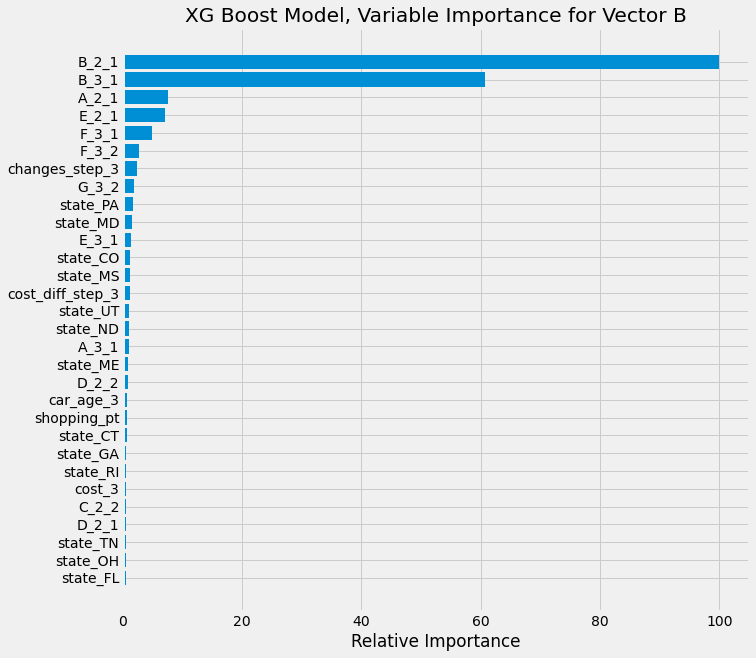

In [134]:
#Let's plot the best model for B using XG Boost Classifier (Iteration 30)
vector = 'B'

xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators=100, max_depth = 3, learning_rate = 0.25, colsample_bytree = 0.15, plot = True)


In [135]:
vector = 'B'
score_matrix = model_score_matrix(vector, 3, xg_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,1694,0,0.0
cust_maintained_vector,0,12937,100.0


In [132]:
# Let's use Logistics Regression to predict vector B

vector = 'B'
lr_ac, lr_f1, lr_probs, lr_preds = lr_predict(vector)


Logistic Regression for vector B
Accuracy = 0.8842, f1-score = 0.884

Confusion Matrix - normalized
 [[0.9103 0.0897]
 [0.1443 0.8557]]
Confusion Matrix
 [[6960  686]
 [1008 5977]]

Classification Report 
               precision    recall  f1-score   support

           0       0.87      0.91      0.89      7646
           1       0.90      0.86      0.88      6985

    accuracy                           0.88     14631
   macro avg       0.89      0.88      0.88     14631
weighted avg       0.88      0.88      0.88     14631


Area under ROC: 
 0.9061388600174771


C:\Users\amite\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [133]:
vector = 'B'
score_matrix = model_score_matrix(vector, 3, lr_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,1694,0,0.0
cust_maintained_vector,0,12937,100.0


In [155]:
vector = 'B'

fpr_1, tpr_1, thresholds_1 = roc_curve(y_test[vector].astype('int'), rf_probs)
roc_auc1 = auc(fpr_1, tpr_1)

fpr_2, tpr_2, thresholds_2 = roc_curve(y_test[vector].astype('int'), xg_probs)
roc_auc2 = auc(fpr_2, tpr_2)

fpr_3, tpr_3, thresholds_3 = roc_curve(y_test[vector].astype('int'), lr_probs)
roc_auc3 = auc(fpr_3, tpr_3)

roc_auc1, roc_auc2, roc_auc3

(0.9085450100370156, 0.9092382578339933, 0.9061388600174771)

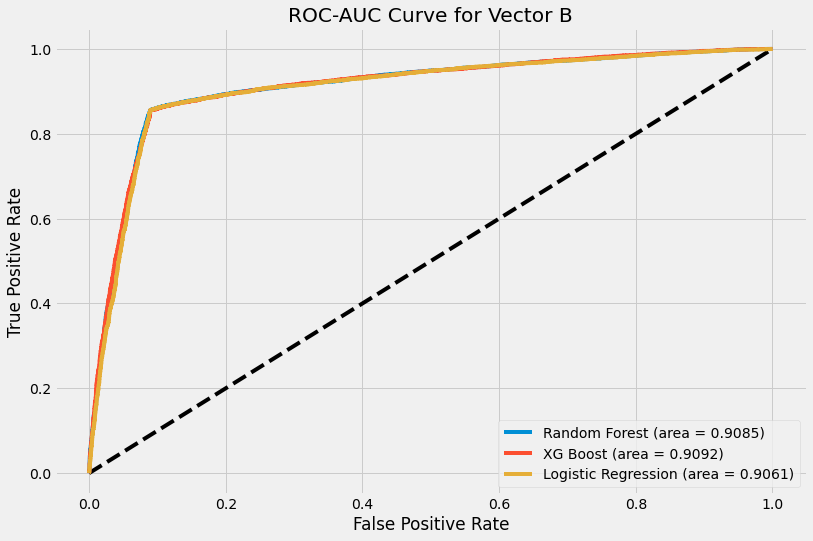

In [156]:
# Let's plot the ROC curve for all the models for vector B
vector = 'B'
plt.figure(figsize=(12,8))

plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_1, tpr_1, label='Random Forest (area = 0.9085)')
plt.plot(fpr_2, tpr_2, label='XG Boost (area = 0.9092)')
plt.plot(fpr_3, tpr_3, label='Logistic Regression (area = 0.9061)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-AUC Curve for Vector '+vector)
plt.legend()
plt.show()


Vector B Logistic Regression Model
Best Accuracy score of 0.8843 occurs for threshold = 0.315
Vector B Random Forest Model
Best Accuracy score of 0.8844 occurs for threshold = 0.498
Vector B XG Boost Model
Best Accuracy score of 0.8843 occurs for threshold = 0.49


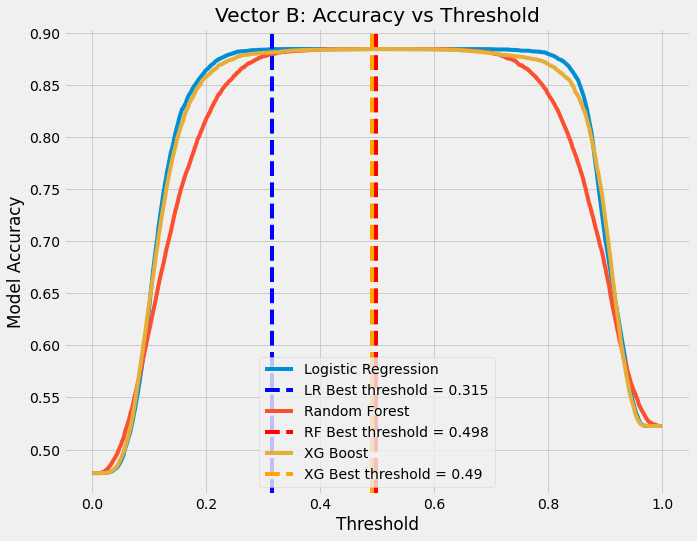

In [158]:
# We are concerned with accuracy of the model i.e. its ability to predict both the 0 and 1 labels correctly
# So we will calculate the accuracy score at different thresholds directly
vector = 'B'
plt.figure(figsize=(10,8))

def to_labels(pos_probs, threshold):
    return (pos_probs >= threshold).astype('int')

thresholds = np.arange(0, 1, 0.001)

# for LR model
ac_score_lr = [accuracy_score(y_test[vector].astype('int'), to_labels(lr_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_lr)
print(f"Vector {vector} Logistic Regression Model\nBest Accuracy score of {ac_score_lr[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_lr, label='Logistic Regression')
plt.axvline(thresholds[idx], color='blue', linestyle="--", label = "LR Best threshold = "+str(np.round(thresholds[idx],4)))

# for random forest
thresholds = np.arange(0, 1, 0.001)
ac_score_rf = [accuracy_score(y_test[vector].astype('int'), to_labels(rf_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_rf)
print(f"Vector {vector} Random Forest Model\nBest Accuracy score of {ac_score_rf[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_rf, label='Random Forest')
plt.axvline(thresholds[idx], color='red', linestyle="--", label = "RF Best threshold = "+str(np.round(thresholds[idx],4)))

# for XG Boost
thresholds = np.arange(0, 1, 0.001)
ac_score_xg = [accuracy_score(y_test[vector].astype('int'), to_labels(xg_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_xg)
print(f"Vector {vector} XG Boost Model\nBest Accuracy score of {ac_score_xg[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_xg, label='XG Boost')
plt.axvline(thresholds[idx], color='orange', linestyle="--", label = "XG Best threshold = "+str(np.round(thresholds[idx],4)))

plt.xlabel('Threshold')
plt.ylabel('Model Accuracy')
plt.title('Vector B: Accuracy vs Threshold')

plt.legend()
plt.show()

# Quote 2 & 3: Predict C

In [141]:
vector = 'C'
last_quote = 3

test_set = df_hist_2_3.iloc[y_test.index,:]

x = pd.crosstab(test_set[vector], test_set[vector+'_'+str(last_quote)])

same_as_3 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 

print(f"Accuracy based on simply predicting vector {vector} = {vector}_{last_quote} : {(np.sum(same_as_3)/y_test.shape[0]): 4.4}")
print(f"Confusion_Matrix")

x['total'] = x.sum(axis=1)
x['C1_%'] = np.around(x[1]/ x['total'], 4)
x['C2_%'] = np.around(x[2]/ x['total'], 4)
x['C3_%'] = np.around(x[3]/ x['total'], 4)
x['C4_%'] = np.around(x[4]/ x['total'], 4)
x


Accuracy based on simply predicting vector C = C_3 :  0.8749
Confusion_Matrix


C_3,1,2,3,4,total,C1_%,C2_%,C3_%,C4_%
C,,,,,,,,,
1,3972,258,205,12,4447,0.8932,0.0580,0.0461,0.0027
2,269,2534,322,24,3149,0.0854,0.8047,0.1023,0.0076
3,168,202,5101,110,5581,0.0301,0.0362,0.9140,0.0197
4,34,22,204,1194,1454,0.0234,0.0151,0.1403,0.8212


In [190]:
vector = 'C'
last_quote = 3
test_set2 = df_hist_2_3.iloc[y_train.index,:]
x2 = pd.crosstab(test_set2[vector], test_set2[vector+'_'+str(last_quote)])
same_as_3 = [x2.iloc[idx,idx] for idx in range(x2.shape[0])] 
print(f"TRAINING Accuracy based on simply predicting vector {vector} = {vector}_{last_quote} : {(np.sum(same_as_3)/y_train.shape[0]): 4.4}")
print(f"Confusion_Matrix - TRAINING")
x2['total'] = x2.sum(axis=1)
x2['C1_%'] = np.around(x2[1]/ x2['total'], 4)
x2['C2_%'] = np.around(x2[2]/ x2['total'], 4)
x2['C3_%'] = np.around(x2[3]/ x2['total'], 4)
x2['C4_%'] = np.around(x2[4]/ x2['total'], 4)
x2

TRAINING Accuracy based on simply predicting vector C = C_3 :  0.876
Confusion_Matrix - TRAINING


C_3,1,2,3,4,total,C1_%,C2_%,C3_%,C4_%
C,,,,,,,,,
1,15619,999,934,50,17602,0.8873,0.0568,0.0531,0.0028
2,1000,9876,1288,74,12238,0.0817,0.8070,0.1052,0.0060
3,761,781,20992,392,22926,0.0332,0.0341,0.9156,0.0171
4,119,109,749,4778,5755,0.0207,0.0189,0.1301,0.8302


Random Forest Classifier results for Vector C
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.877, f1-score=0.8765
Confusion Matrix - normalized
 [[0.8934 0.0578 0.0461 0.0027]
 [0.0845 0.8082 0.0997 0.0076]
 [0.0287 0.0349 0.9165 0.0199]
 [0.0234 0.0138 0.1389 0.8239]]
Confusion Matrix
 [[3973  257  205   12]
 [ 266 2545  314   24]
 [ 160  195 5115  111]
 [  34   20  202 1198]]

Classification Report 
               precision    recall  f1-score   support

           0       0.90      0.89      0.89      4447
           1       0.84      0.81      0.83      3149
           2       0.88      0.92      0.90      5581
           3       0.89      0.82      0.86      1454

    accuracy                           0.88     14631
   macro avg       0.88      0.86      0.87     14631
weighted avg       0.88      0.88      0.88     14631

30


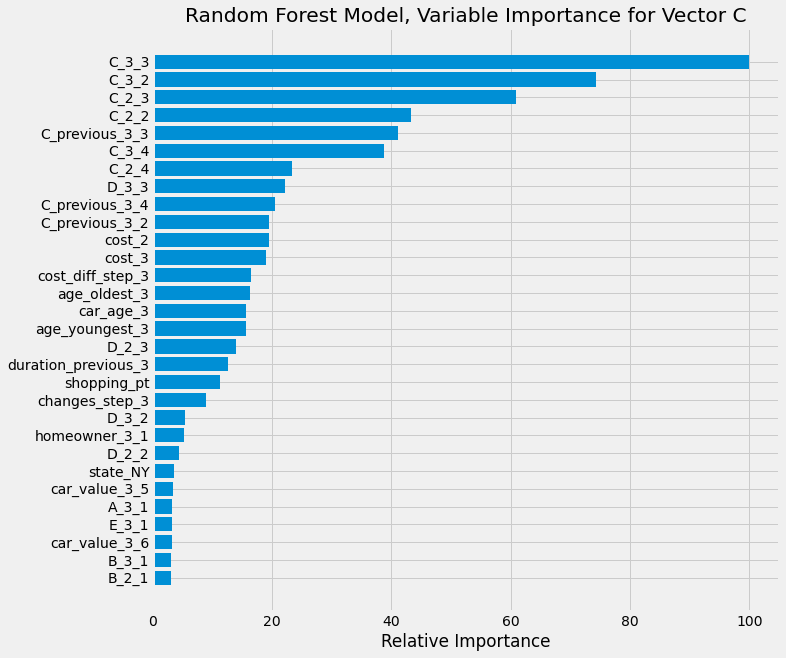

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END min_samples_leaf=3, min_samples_split=2, n_estimators=200;, score=0.875 total time=  16.9s
[CV 2/4] END min_samples_leaf=3, min_samples_split=2, n_estimators=200;, score=0.879 total time=   7.1s
[CV 3/4] END min_samples_leaf=3, min_samples_split=2, n_estimators=200;, score=0.877 total time=   7.0s
[CV 4/4] END min_samples_leaf=3, min_samples_split=2, n_estimators=200;, score=0.877 total time=   7.2s
[CV 1/4] END min_samples_leaf=3, min_samples_split=5, n_estimators=500;, score=0.875 total time=  16.1s
[CV 2/4] END min_samples_leaf=3, min_samples_split=5, n_estimators=500;, score=0.879 total time=  16.2s
[CV 3/4] END min_samples_leaf=3, min_samples_split=5, n_estimators=500;, score=0.876 total time=  16.2s
[CV 4/4] END min_samples_leaf=3, min_samples_split=5, n_estimators=500;, score=0.877 total time=  16.2s
[CV 1/4] END min_samples_leaf=3, min_samples_split=3, n_estimators=500;, score=0.875 total time=  15.9s
[C

[CV 4/4] END min_samples_leaf=2, min_samples_split=4, n_estimators=100;, score=0.877 total time=   3.6s
[CV 1/4] END min_samples_leaf=3, min_samples_split=4, n_estimators=600;, score=0.875 total time=  18.5s
[CV 2/4] END min_samples_leaf=3, min_samples_split=4, n_estimators=600;, score=0.879 total time=  18.4s
[CV 3/4] END min_samples_leaf=3, min_samples_split=4, n_estimators=600;, score=0.876 total time=  18.4s
[CV 4/4] END min_samples_leaf=3, min_samples_split=4, n_estimators=600;, score=0.877 total time=  18.4s
[CV 1/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=400;, score=0.876 total time=  13.9s
[CV 2/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=400;, score=0.880 total time=  14.1s
[CV 3/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=400;, score=0.877 total time=  15.4s
[CV 4/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=400;, score=0.877 total time=  14.5s
[CV 1/4] END min_samples_leaf=2, min_samples_split=2, n_estimato

[CV 3/4] END min_samples_leaf=1, min_samples_split=4, n_estimators=700;, score=0.877 total time=  25.7s
[CV 4/4] END min_samples_leaf=1, min_samples_split=4, n_estimators=700;, score=0.877 total time=  25.6s
[CV 1/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=100;, score=0.875 total time=   3.6s
[CV 2/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=100;, score=0.879 total time=   3.4s
[CV 3/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=100;, score=0.876 total time=   3.4s
[CV 4/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=100;, score=0.876 total time=   3.4s
[CV 1/4] END min_samples_leaf=2, min_samples_split=5, n_estimators=400;, score=0.875 total time=  13.4s
[CV 2/4] END min_samples_leaf=2, min_samples_split=5, n_estimators=400;, score=0.879 total time=  14.0s
[CV 3/4] END min_samples_leaf=2, min_samples_split=5, n_estimators=400;, score=0.877 total time=  13.2s
[CV 4/4] END min_samples_leaf=2, min_samples_split=5, n_estimato

[CV 2/4] END min_samples_leaf=2, min_samples_split=5, n_estimators=200;, score=0.880 total time=   8.0s
[CV 3/4] END min_samples_leaf=2, min_samples_split=5, n_estimators=200;, score=0.877 total time=   8.0s
[CV 4/4] END min_samples_leaf=2, min_samples_split=5, n_estimators=200;, score=0.877 total time=   8.3s
Vector C RandomizedSearchCV: Random Forest Model
Best Score:0.8774799075250711
Best Parameters: {'n_estimators': 700, 'min_samples_split': 3, 'min_samples_leaf': 1}
Writing file.  "Modelling_data/quotes_2_3\rf_results_q2_q3_vectorC.csv"


In [142]:
# RF Classifier: Predict C using quotes 2 and 3 and then RandomizedSearchCV to find best hyperparameters

vector = 'C'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=300, min_samples_leaf = 1, min_samples_split = 2, plot=True)

results = rf_randomsearch(vector, 60)

datapath="Modelling_data/quotes_2_3" 
filename1 = 'rf_results_q2_q3_vector'+vector+'.csv'
save_file(results, filename1, datapath)

In [147]:
vector = 'C'

for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    min_samples_leaf = row['min_samples_leaf']
    min_samples_split = row['min_samples_split']
    
    results.loc[i, 'test_score'], results.loc[i, 'f1_score'], rf_probs = rf_predict_plot(vector, n_estimators=int(n_estimators), \
                                                                min_samples_leaf = int(min_samples_leaf), \
                                                                min_samples_split = int(min_samples_split), plot=False)
    
results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
datapath="Modelling_data/quotes_2_3"
filename2 = 'rf_results_q2_q3_vector'+vector+'_final.csv'
save_file(results, filename2, datapath)

Random Forest Classifier results for Vector C
Parameters: No. of Estimators = 200,  min_samples_leaf = 3,     min_samples_split = 2
Accuracy=0.876, f1-score=0.8755
Random Forest Classifier results for Vector C
Parameters: No. of Estimators = 500,  min_samples_leaf = 3,     min_samples_split = 5
Accuracy=0.876, f1-score=0.8755
Random Forest Classifier results for Vector C
Parameters: No. of Estimators = 500,  min_samples_leaf = 3,     min_samples_split = 3
Accuracy=0.876, f1-score=0.8755
Random Forest Classifier results for Vector C
Parameters: No. of Estimators = 400,  min_samples_leaf = 4,     min_samples_split = 4
Accuracy=0.8759, f1-score=0.8754
Random Forest Classifier results for Vector C
Parameters: No. of Estimators = 600,  min_samples_leaf = 1,     min_samples_split = 4
Accuracy=0.8768, f1-score=0.8763
Random Forest Classifier results for Vector C
Parameters: No. of Estimators = 800,  min_samples_leaf = 1,     min_samples_split = 3
Accuracy=0.8766, f1-score=0.8762
Random Forest

Random Forest Classifier results for Vector C
Parameters: No. of Estimators = 200,  min_samples_leaf = 4,     min_samples_split = 4
Accuracy=0.8757, f1-score=0.8753
Random Forest Classifier results for Vector C
Parameters: No. of Estimators = 600,  min_samples_leaf = 4,     min_samples_split = 2
Accuracy=0.8759, f1-score=0.8755
Random Forest Classifier results for Vector C
Parameters: No. of Estimators = 700,  min_samples_leaf = 2,     min_samples_split = 2
Accuracy=0.8762, f1-score=0.8757
Random Forest Classifier results for Vector C
Parameters: No. of Estimators = 200,  min_samples_leaf = 4,     min_samples_split = 3
Accuracy=0.8757, f1-score=0.8753
Random Forest Classifier results for Vector C
Parameters: No. of Estimators = 500,  min_samples_leaf = 4,     min_samples_split = 3
Accuracy=0.8759, f1-score=0.8755
Random Forest Classifier results for Vector C
Parameters: No. of Estimators = 100,  min_samples_leaf = 2,     min_samples_split = 5
Accuracy=0.8766, f1-score=0.8761
Random For

In [148]:
results

,n_estimators,min_samples_split,min_samples_leaf,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,200,2,3,0.876899,29,0.876017,0.875542,14.0,0.876458,23.0
1,500,5,3,0.876813,40,0.876017,0.875538,14.0,0.876415,29.0
2,500,3,3,0.876813,40,0.876017,0.875538,14.0,0.876415,29.0
3,400,4,4,0.876506,55,0.875880,0.875387,16.0,0.876193,35.0
4,600,4,1,0.877343,11,0.876769,0.876295,4.0,0.877056,7.0
5,800,3,1,0.877463,2,0.876632,0.876163,6.0,0.877047,8.0
6,600,5,1,0.877394,5,0.876563,0.876086,7.0,0.876979,10.0
7,300,2,4,0.876506,54,0.875812,0.875324,17.0,0.876159,37.0
8,700,3,4,0.876591,45,0.875948,0.875459,15.0,0.876270,30.0
9,400,2,4,0.876506,55,0.875880,0.875387,16.0,0.876193,35.0


Random Forest Classifier results for Vector C
Parameters: No. of Estimators = 100,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8771, f1-score=0.8766
Confusion Matrix - normalized
 [[0.8939 0.0573 0.0461 0.0027]
 [0.0842 0.8095 0.0988 0.0076]
 [0.0288 0.0348 0.9161 0.0202]
 [0.0234 0.0138 0.1403 0.8226]]
Confusion Matrix
 [[3975  255  205   12]
 [ 265 2549  311   24]
 [ 161  194 5113  113]
 [  34   20  204 1196]]

Classification Report 
               precision    recall  f1-score   support

           0       0.90      0.89      0.90      4447
           1       0.84      0.81      0.83      3149
           2       0.88      0.92      0.90      5581
           3       0.89      0.82      0.85      1454

    accuracy                           0.88     14631
   macro avg       0.88      0.86      0.87     14631
weighted avg       0.88      0.88      0.88     14631

30


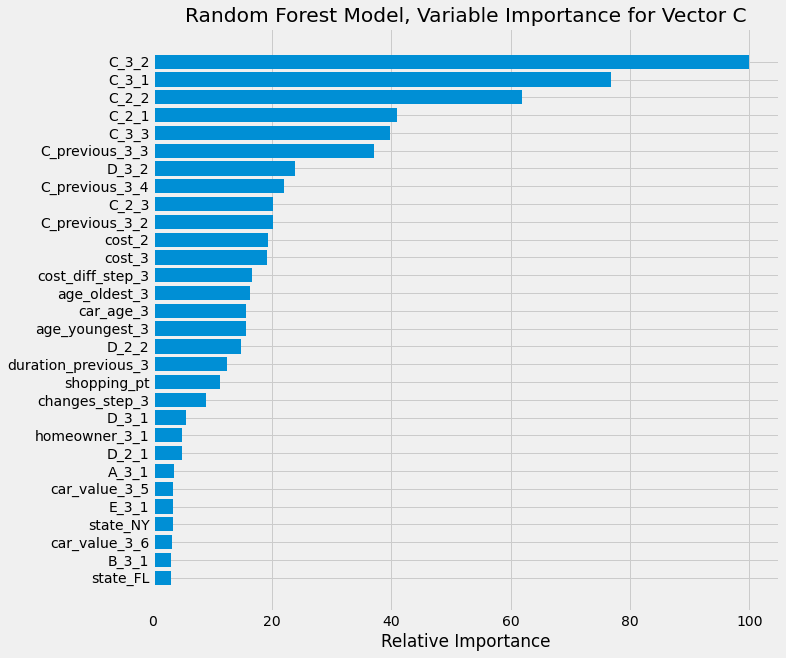

In [129]:
#Let's plot the best model for C using Random Forest Classifier (Iteration 27)
vector = 'C'
rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=100, min_samples_leaf = 1, min_samples_split = 2, plot=True)


In [130]:
vector = 'C'
score_matrix = model_score_matrix(vector, 3, rf_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,1787,43,2.349727
cust_maintained_vector,11,12790,99.914069


XGBoost Classifier results for Vector C
Parameters: No. of Estimators = 200,  max_depth = 1,     learning_rate = 0.3, colsample_bytree = 1
Accuracy=0.8755, f1-score=0.8751
Confusion Matrix - normalized
 [[0.8936 0.058  0.0454 0.0029]
 [0.0842 0.8082 0.1007 0.007 ]
 [0.0301 0.0364 0.9144 0.0192]
 [0.0213 0.0158 0.1458 0.8171]]
Confusion Matrix
 [[3974  258  202   13]
 [ 265 2545  317   22]
 [ 168  203 5103  107]
 [  31   23  212 1188]]

Classification Report 
               precision    recall  f1-score   support

           0       0.90      0.89      0.89      4447
           1       0.84      0.81      0.82      3149
           2       0.87      0.91      0.89      5581
           3       0.89      0.82      0.85      1454

    accuracy                           0.88     14631
   macro avg       0.88      0.86      0.87     14631
weighted avg       0.88      0.88      0.88     14631

30


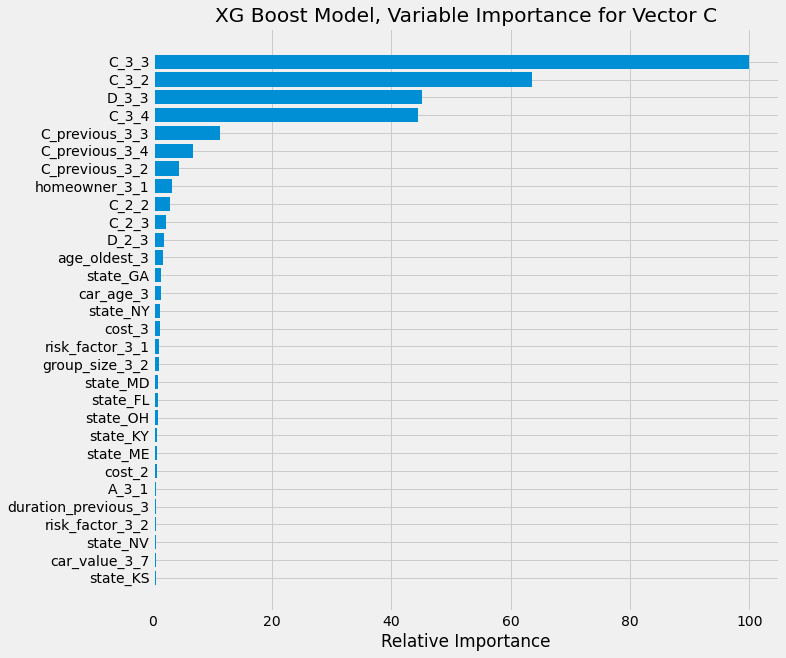

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=3, n_estimators=300;, score=0.876 total time=  18.5s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=3, n_estimators=300;, score=0.880 total time=  17.2s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=3, n_estimators=300;, score=0.876 total time=  17.1s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=3, n_estimators=300;, score=0.877 total time=  16.0s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=4, n_estimators=400;, score=0.872 total time=  37.0s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=4, n_estimators=400;, score=0.876 total time=  38.8s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=4, n_estimators=400;, score=0.874 total time=  36.0s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=4, n_estimators=400;, score=0.874 total tim

[CV 2/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=5, n_estimators=500;, score=0.875 total time=  47.0s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=5, n_estimators=500;, score=0.871 total time=  49.4s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=5, n_estimators=500;, score=0.873 total time=  48.7s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=3, n_estimators=100;, score=0.876 total time=   3.9s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=3, n_estimators=100;, score=0.880 total time=   3.9s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=3, n_estimators=100;, score=0.877 total time=   4.3s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=3, n_estimators=100;, score=0.876 total time=   4.1s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=4, n_estimators=300;, score=0.873 total time=  23.3s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.35, 

[CV 4/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=4, n_estimators=300;, score=0.876 total time=  14.3s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=300;, score=0.869 total time=  27.7s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=300;, score=0.875 total time=  28.1s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=300;, score=0.872 total time=  27.8s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=300;, score=0.872 total time=  27.7s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=3, n_estimators=500;, score=0.875 total time=  18.0s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=3, n_estimators=500;, score=0.879 total time=  18.2s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=3, n_estimators=500;, score=0.876 total time=  18.0s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.25, m

[CV 2/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=5, n_estimators=200;, score=0.879 total time=  14.5s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=5, n_estimators=200;, score=0.874 total time=  14.0s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=5, n_estimators=200;, score=0.876 total time=  14.0s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=5, n_estimators=100;, score=0.876 total time=   5.8s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=5, n_estimators=100;, score=0.878 total time=   5.8s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=5, n_estimators=100;, score=0.876 total time=   5.8s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=5, n_estimators=100;, score=0.877 total time=   5.8s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=4, n_estimators=100;, score=0.875 total time=   3.7s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.5

In [161]:
#Let's predict C using XG Boost Classifier and use RandomizedSearchCV to find the best XGB classifier Hyperparamters 
vector = 'C'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators=200, max_depth = 1, learning_rate = 0.3, colsample_bytree = 1, plot = True)

results = xgb_randomsearch(vector, 60)

datapath="Modelling_data/quotes_2_3"
filename3 = 'xgboost_results_q2_q3_vector'+vector+'.csv'
save_file(results, filename3, datapath)


In [162]:
# Find scores for the test set
vector = 'C'
for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    max_depth = row['max_depth']
    learning_rate = row['learning_rate']
    colsample_bytree = row['colsample_bytree']
    
    results.loc[i, 'test_score'], results.loc[i, 'f1_score'], xg_probs = xg_predict_plot(vector, n_estimators=int(n_estimators), \
                                                                max_depth = int(max_depth), learning_rate = learning_rate, \
                                                                colsample_bytree = colsample_bytree, plot=False)
    
results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
datapath="Modelling_data/quotes_2_3"
filename4 = 'xgboost_results_q2_q3_vector'+vector+'_final.csv'
save_file(results, filename4, datapath)

XGBoost Classifier results for Vector C
Parameters: No. of Estimators = 300,  max_depth = 3,     learning_rate = 0.25, colsample_bytree = 0.35
Accuracy=0.8754, f1-score=0.8749
XGBoost Classifier results for Vector C
Parameters: No. of Estimators = 400,  max_depth = 4,     learning_rate = 0.35, colsample_bytree = 0.5
Accuracy=0.8733, f1-score=0.8727
XGBoost Classifier results for Vector C
Parameters: No. of Estimators = 300,  max_depth = 5,     learning_rate = 0.25, colsample_bytree = 0.35
Accuracy=0.8742, f1-score=0.8737
XGBoost Classifier results for Vector C
Parameters: No. of Estimators = 300,  max_depth = 5,     learning_rate = 0.35, colsample_bytree = 0.5
Accuracy=0.8721, f1-score=0.8715
XGBoost Classifier results for Vector C
Parameters: No. of Estimators = 100,  max_depth = 3,     learning_rate = 0.5, colsample_bytree = 0.15
Accuracy=0.8745, f1-score=0.874
XGBoost Classifier results for Vector C
Parameters: No. of Estimators = 200,  max_depth = 4,     learning_rate = 0.5, colsam

XGBoost Classifier results for Vector C
Parameters: No. of Estimators = 300,  max_depth = 5,     learning_rate = 0.5, colsample_bytree = 0.35
Accuracy=0.8688, f1-score=0.8682
XGBoost Classifier results for Vector C
Parameters: No. of Estimators = 500,  max_depth = 5,     learning_rate = 0.5, colsample_bytree = 0.5
Accuracy=0.8662, f1-score=0.8656
XGBoost Classifier results for Vector C
Parameters: No. of Estimators = 500,  max_depth = 5,     learning_rate = 0.3, colsample_bytree = 0.35
Accuracy=0.871, f1-score=0.8704
XGBoost Classifier results for Vector C
Parameters: No. of Estimators = 300,  max_depth = 4,     learning_rate = 0.25, colsample_bytree = 0.5
Accuracy=0.8753, f1-score=0.8747
XGBoost Classifier results for Vector C
Parameters: No. of Estimators = 100,  max_depth = 4,     learning_rate = 0.5, colsample_bytree = 0.35
Accuracy=0.8749, f1-score=0.8744
XGBoost Classifier results for Vector C
Parameters: No. of Estimators = 200,  max_depth = 5,     learning_rate = 0.35, colsampl

In [191]:
results_C_xg = pd.read_csv("Modelling_data/quotes_2_3/xgboost_results_q2_q3_vectorC_final.csv")
results_C_xg

,n_estimators,max_depth,learning_rate,colsample_bytree,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,300,3,0.25,0.35,0.877138,12,0.875402,0.874944,8.0,0.876270,11.0
1,400,4,0.35,0.50,0.874011,49,0.873283,0.872701,27.0,0.873647,46.0
2,300,5,0.25,0.35,0.875857,31,0.874240,0.873732,19.0,0.875048,30.0
3,300,5,0.35,0.50,0.873208,53,0.872121,0.871543,34.0,0.872664,52.0
4,100,3,0.50,0.15,0.877172,11,0.874513,0.874014,17.0,0.875843,18.0
5,200,4,0.50,0.35,0.874541,45,0.872326,0.871742,33.0,0.873433,49.0
6,500,4,0.25,0.25,0.875532,35,0.873419,0.872867,25.0,0.874476,35.0
7,400,3,0.50,0.35,0.874626,43,0.873761,0.873230,23.0,0.874194,43.0
8,300,3,0.50,0.15,0.875669,33,0.874855,0.874345,14.0,0.875262,28.0
9,400,3,0.50,0.50,0.873601,51,0.872804,0.872218,32.0,0.873203,50.0


XGBoost Classifier results for Vector C
Parameters: No. of Estimators = 300,  max_depth = 3,     learning_rate = 0.25, colsample_bytree = 0.15
Accuracy=0.8759, f1-score=0.8754
Confusion Matrix - normalized
 [[0.8921 0.0571 0.0472 0.0036]
 [0.0861 0.8063 0.1007 0.007 ]
 [0.0296 0.0348 0.9154 0.0202]
 [0.0199 0.0165 0.1382 0.8253]]
Confusion Matrix
 [[3967  254  210   16]
 [ 271 2539  317   22]
 [ 165  194 5109  113]
 [  29   24  201 1200]]

Classification Report 
               precision    recall  f1-score   support

           0       0.90      0.89      0.89      4447
           1       0.84      0.81      0.82      3149
           2       0.88      0.92      0.89      5581
           3       0.89      0.83      0.86      1454

    accuracy                           0.88     14631
   macro avg       0.88      0.86      0.87     14631
weighted avg       0.88      0.88      0.88     14631

30


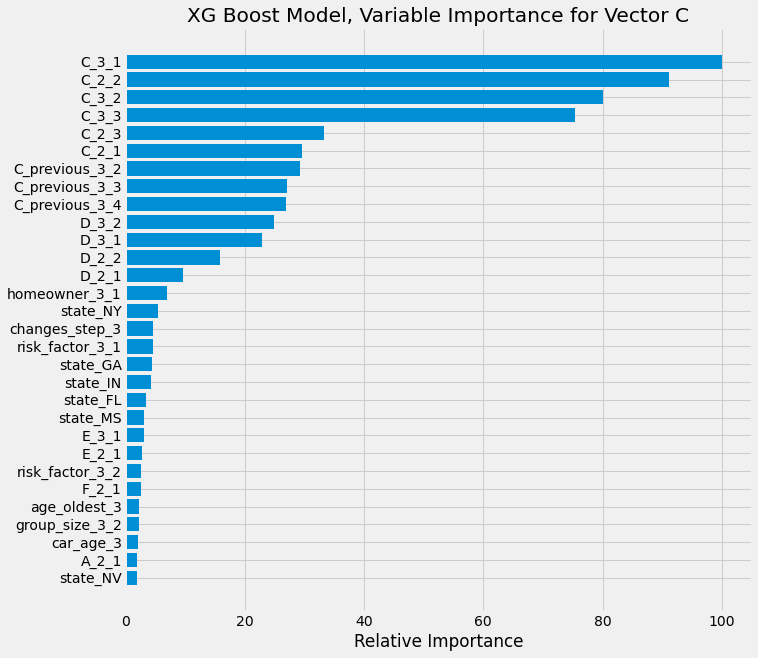

In [122]:
#Let's plot the best model for C using XG Boost Classifier (Iteration 25)
vector = 'C'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators=300, max_depth = 3, learning_rate = 0.25, colsample_bytree = 0.15, plot = True)


In [123]:
vector = 'C'
score_matrix = model_score_matrix(vector, 3, xg_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,1748,82,4.480874
cust_maintained_vector,68,12733,99.468792


# Quote 2 & 3: Predict D

In [163]:
y_train['D'].value_counts()


3    37774
2    13107
1     7640
Name: D, dtype: int64

In [164]:
mapping_D = {1:0, 2:1, 3:2}

y_train['D'] = y_train['D'].map(lambda x: mapping_D[x] )
y_test['D'] = y_test['D'].map(lambda x: mapping_D[x] )
y_train['D'].value_counts()


C:\Users\amite\AppData\Local\Temp/ipykernel_33952/2807440063.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_train['D'] = y_train['D'].map(lambda x: mapping_D[x] )
C:\Users\amite\AppData\Local\Temp/ipykernel_33952/2807440063.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test['D'] = y_test['D'].map(lambda x: mapping_D[x] )


2    37774
1    13107
0     7640
Name: D, dtype: int64

In [165]:
vector = 'D'
last_quote = 3

test_set = df_hist_2_3.iloc[y_test.index,:]

x = pd.crosstab(test_set[vector], test_set[vector+'_'+str(last_quote)])

same_as_3 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 

print(f"Accuracy based on simply predicting vector {vector} = {vector}_{last_quote} : {(np.sum(same_as_3)/y_test.shape[0]): 4.4}")
print(f"Confusion_Matrix")

x['total'] = x.sum(axis=1)
x['D1_%'] = np.around(x[1]/ x['total'], 4)
x['D2_%'] = np.around(x[2]/ x['total'], 4)
x['D3_%'] = np.around(x[3]/ x['total'], 4)
x

Accuracy based on simply predicting vector D = D_3 :  0.906
Confusion_Matrix


D_3,1,2,3,total,D1_%,D2_%,D3_%
D,,,,,,,
1,1757,92,75,1924,0.9132,0.0478,0.0390
2,243,2866,266,3375,0.0720,0.8492,0.0788
3,280,420,8632,9332,0.0300,0.0450,0.9250


In [193]:
vector = 'D'
last_quote = 3
test_set2 = df_hist_2_3.iloc[y_train.index,:]
x2 = pd.crosstab(test_set2[vector], test_set2[vector+'_'+str(last_quote)])
same_as_3 = [x2.iloc[idx,idx] for idx in range(x2.shape[0])] 
print(f"TRAINING Accuracy based on simply predicting vector {vector} = {vector}_{last_quote} : {(np.sum(same_as_3)/y_train.shape[0]): 4.4}")
print(f"Confusion_Matrix - TRAINING")
x2['total'] = x2.sum(axis=1)
x2['D1_%'] = np.around(x2[1]/ x2['total'], 4)
x2['D2_%'] = np.around(x2[2]/ x2['total'], 4)
x2['D3_%'] = np.around(x2[3]/ x2['total'], 4)
x2

TRAINING Accuracy based on simply predicting vector D = D_3 :  0.9063
Confusion_Matrix - TRAINING


D_3,1,2,3,total,D1_%,D2_%,D3_%
D,,,,,,,
1,6887,398,355,7640,0.9014,0.0521,0.0465
2,978,11205,924,13107,0.0746,0.8549,0.0705
3,1104,1726,34944,37774,0.0292,0.0457,0.9251


Random Forest Classifier results for Vector D
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.9079, f1-score=0.9089
Confusion Matrix - normalized
 [[0.9023 0.0478 0.0499]
 [0.067  0.8489 0.0841]
 [0.0242 0.0453 0.9305]]
Confusion Matrix
 [[1736   92   96]
 [ 226 2865  284]
 [ 226  423 8683]]

Classification Report 
               precision    recall  f1-score   support

           0       0.79      0.90      0.84      1924
           1       0.85      0.85      0.85      3375
           2       0.96      0.93      0.94      9332

    accuracy                           0.91     14631
   macro avg       0.87      0.89      0.88     14631
weighted avg       0.91      0.91      0.91     14631

30


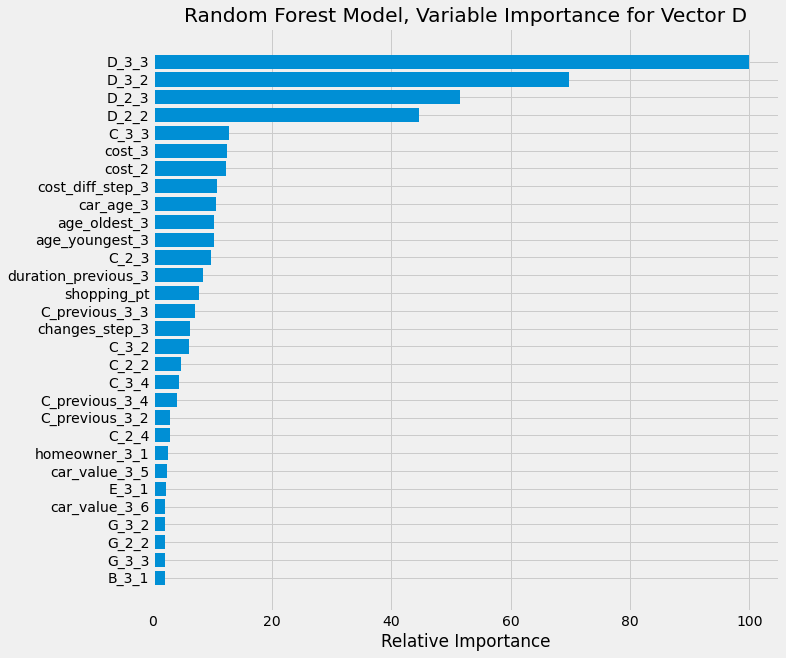

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END min_samples_leaf=1, min_samples_split=3, n_estimators=800;, score=0.906 total time=  29.1s
[CV 2/4] END min_samples_leaf=1, min_samples_split=3, n_estimators=800;, score=0.910 total time=  25.4s
[CV 3/4] END min_samples_leaf=1, min_samples_split=3, n_estimators=800;, score=0.907 total time=  25.4s
[CV 4/4] END min_samples_leaf=1, min_samples_split=3, n_estimators=800;, score=0.911 total time=  25.2s
[CV 1/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=300;, score=0.905 total time=   9.0s
[CV 2/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=300;, score=0.909 total time=   9.1s
[CV 3/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=300;, score=0.907 total time=   9.0s
[CV 4/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=300;, score=0.911 total time=   9.1s
[CV 1/4] END min_samples_leaf=2, min_samples_split=2, n_estimators=500;, score=0.905 total time=  15.2s
[C

[CV 4/4] END min_samples_leaf=2, min_samples_split=4, n_estimators=600;, score=0.911 total time=  18.3s
[CV 1/4] END min_samples_leaf=3, min_samples_split=3, n_estimators=700;, score=0.905 total time=  21.0s
[CV 2/4] END min_samples_leaf=3, min_samples_split=3, n_estimators=700;, score=0.910 total time=  20.7s
[CV 3/4] END min_samples_leaf=3, min_samples_split=3, n_estimators=700;, score=0.908 total time=  20.9s
[CV 4/4] END min_samples_leaf=3, min_samples_split=3, n_estimators=700;, score=0.911 total time=  21.0s
[CV 1/4] END min_samples_leaf=1, min_samples_split=5, n_estimators=300;, score=0.906 total time=   9.3s
[CV 2/4] END min_samples_leaf=1, min_samples_split=5, n_estimators=300;, score=0.910 total time=   9.2s
[CV 3/4] END min_samples_leaf=1, min_samples_split=5, n_estimators=300;, score=0.907 total time=   9.3s
[CV 4/4] END min_samples_leaf=1, min_samples_split=5, n_estimators=300;, score=0.911 total time=   9.3s
[CV 1/4] END min_samples_leaf=1, min_samples_split=2, n_estimato

[CV 3/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=400;, score=0.907 total time=  11.8s
[CV 4/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=400;, score=0.911 total time=  11.4s
[CV 1/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=400;, score=0.906 total time=  12.7s
[CV 2/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=400;, score=0.911 total time=  12.6s
[CV 3/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=400;, score=0.907 total time=  12.7s
[CV 4/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=400;, score=0.911 total time=  12.7s
[CV 1/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=500;, score=0.906 total time=  15.8s
[CV 2/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=500;, score=0.910 total time=  15.8s
[CV 3/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=500;, score=0.908 total time=  15.9s
[CV 4/4] END min_samples_leaf=1, min_samples_split=2, n_estimato

[CV 2/4] END min_samples_leaf=2, min_samples_split=4, n_estimators=300;, score=0.910 total time=   9.2s
[CV 3/4] END min_samples_leaf=2, min_samples_split=4, n_estimators=300;, score=0.908 total time=   9.3s
[CV 4/4] END min_samples_leaf=2, min_samples_split=4, n_estimators=300;, score=0.911 total time=   9.4s
Vector D RandomizedSearchCV: Random Forest Model
Best Score:0.9086824046527487
Best Parameters: {'n_estimators': 400, 'min_samples_split': 2, 'min_samples_leaf': 1}
Writing file.  "Modelling_data/quotes_2_3\rf_results_q2_q3_vectorD.csv"


In [166]:
# RF Classifier: Predict D using quotes 2 and 3 and then RandomizedSearchCV to find best hyperparameters

vector = 'D'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=300, min_samples_leaf = 1, min_samples_split = 2, plot=True)

results = rf_randomsearch(vector, 60)

datapath="Modelling_data/quotes_2_3"
filename1 = 'rf_results_q2_q3_vector'+vector+'.csv'
save_file(results, filename1, datapath)

In [167]:
# Get scores for test set
vector = 'D'

for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    min_samples_leaf = row['min_samples_leaf']
    min_samples_split = row['min_samples_split']
    
    results.loc[i, 'test_score'], results.loc[i, 'f1_score'], rf_probs = rf_predict_plot(vector, n_estimators=int(n_estimators), \
                                                                min_samples_leaf = int(min_samples_leaf), \
                                                                min_samples_split = int(min_samples_split), plot=False)
    
results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
datapath="Modelling_data/quotes_2_3"
filename2 = 'rf_results_q2_q3_vector'+vector+'_final.csv'
save_file(results, filename2, datapath)


Random Forest Classifier results for Vector D
Parameters: No. of Estimators = 800,  min_samples_leaf = 1,     min_samples_split = 3
Accuracy=0.9082, f1-score=0.9091
Random Forest Classifier results for Vector D
Parameters: No. of Estimators = 300,  min_samples_leaf = 4,     min_samples_split = 2
Accuracy=0.9079, f1-score=0.9089
Random Forest Classifier results for Vector D
Parameters: No. of Estimators = 500,  min_samples_leaf = 2,     min_samples_split = 2
Accuracy=0.9081, f1-score=0.909
Random Forest Classifier results for Vector D
Parameters: No. of Estimators = 400,  min_samples_leaf = 4,     min_samples_split = 4
Accuracy=0.908, f1-score=0.909
Random Forest Classifier results for Vector D
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.9079, f1-score=0.9089
Random Forest Classifier results for Vector D
Parameters: No. of Estimators = 800,  min_samples_leaf = 3,     min_samples_split = 5
Accuracy=0.9078, f1-score=0.9088
Random Forest

Random Forest Classifier results for Vector D
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 4
Accuracy=0.9081, f1-score=0.909
Random Forest Classifier results for Vector D
Parameters: No. of Estimators = 700,  min_samples_leaf = 4,     min_samples_split = 3
Accuracy=0.9078, f1-score=0.9088
Random Forest Classifier results for Vector D
Parameters: No. of Estimators = 700,  min_samples_leaf = 4,     min_samples_split = 2
Accuracy=0.9078, f1-score=0.9088
Random Forest Classifier results for Vector D
Parameters: No. of Estimators = 700,  min_samples_leaf = 4,     min_samples_split = 5
Accuracy=0.9078, f1-score=0.9088
Random Forest Classifier results for Vector D
Parameters: No. of Estimators = 100,  min_samples_leaf = 2,     min_samples_split = 4
Accuracy=0.9077, f1-score=0.9087
Random Forest Classifier results for Vector D
Parameters: No. of Estimators = 800,  min_samples_leaf = 2,     min_samples_split = 2
Accuracy=0.9081, f1-score=0.9091
Random Fore

In [194]:
results_D_rf = pd.read_csv("Modelling_data/quotes_2_3/rf_results_q2_q3_vectorD_final.csv")
results_D_rf

,n_estimators,min_samples_split,min_samples_leaf,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,800,3,1,0.908546,14,0.908209,0.909127,4.0,0.908377,8.0
1,300,2,4,0.908050,60,0.907935,0.908938,8.0,0.907993,39.0
2,500,2,2,0.908546,13,0.908072,0.909037,6.0,0.908309,17.0
3,400,4,4,0.908119,58,0.908004,0.908990,7.0,0.908061,35.0
4,300,2,1,0.908631,5,0.907935,0.908851,8.0,0.908283,19.0
5,800,5,3,0.908409,31,0.907799,0.908783,10.0,0.908104,30.0
6,800,3,2,0.908494,20,0.908140,0.909104,5.0,0.908317,14.0
7,400,3,3,0.908324,40,0.908004,0.908984,7.0,0.908164,27.0
8,800,4,3,0.908409,31,0.907799,0.908783,10.0,0.908104,30.0
9,600,4,3,0.908324,42,0.907867,0.908857,9.0,0.908095,32.0


Random Forest Classifier results for Vector D
Parameters: No. of Estimators = 600,  min_samples_leaf = 1,     min_samples_split = 5
Accuracy=0.9084, f1-score=0.9094
Confusion Matrix - normalized
 [[0.9038 0.0478 0.0483]
 [0.0676 0.8501 0.0824]
 [0.0243 0.0452 0.9305]]
Confusion Matrix
 [[1739   92   93]
 [ 228 2869  278]
 [ 227  422 8683]]

Classification Report 
               precision    recall  f1-score   support

           0       0.79      0.90      0.84      1924
           1       0.85      0.85      0.85      3375
           2       0.96      0.93      0.94      9332

    accuracy                           0.91     14631
   macro avg       0.87      0.89      0.88     14631
weighted avg       0.91      0.91      0.91     14631

30


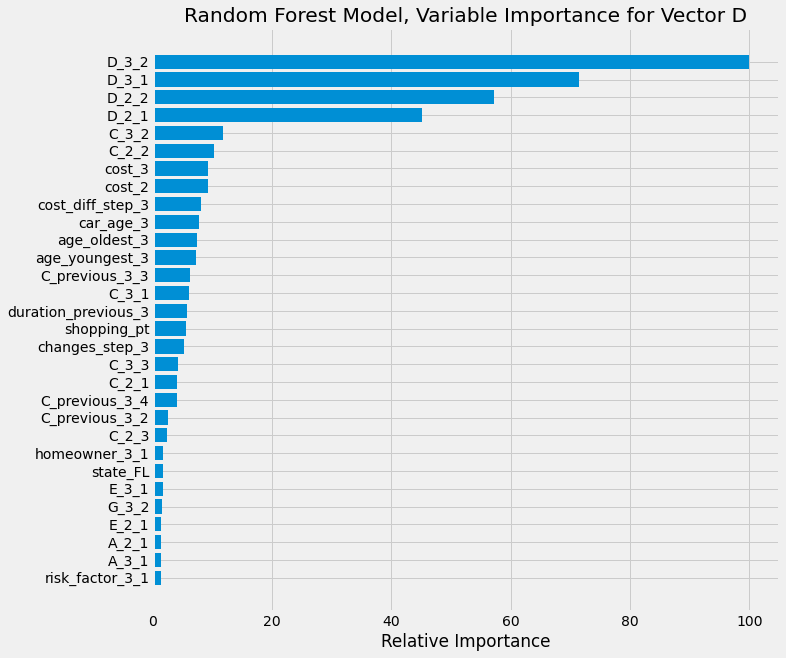

In [120]:
#Let's plot the best model for D using Random Forest Classifier (Iteration 32)

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=600, min_samples_leaf = 1, min_samples_split = 5, plot=True)

In [121]:
vector = 'D'
score_matrix = model_score_matrix(vector, 3, rf_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,1322,54,3.924419
cust_maintained_vector,18,13237,99.864202


XGBoost Classifier results for Vector D
Parameters: No. of Estimators = 200,  max_depth = 1,     learning_rate = 0.3, colsample_bytree = 1
Accuracy=0.9078, f1-score=0.9088
Confusion Matrix - normalized
 [[0.907  0.0478 0.0452]
 [0.0687 0.8495 0.0818]
 [0.0261 0.0448 0.9291]]
Confusion Matrix
 [[1745   92   87]
 [ 232 2867  276]
 [ 244  418 8670]]

Classification Report 
               precision    recall  f1-score   support

           0       0.79      0.91      0.84      1924
           1       0.85      0.85      0.85      3375
           2       0.96      0.93      0.94      9332

    accuracy                           0.91     14631
   macro avg       0.86      0.90      0.88     14631
weighted avg       0.91      0.91      0.91     14631

30


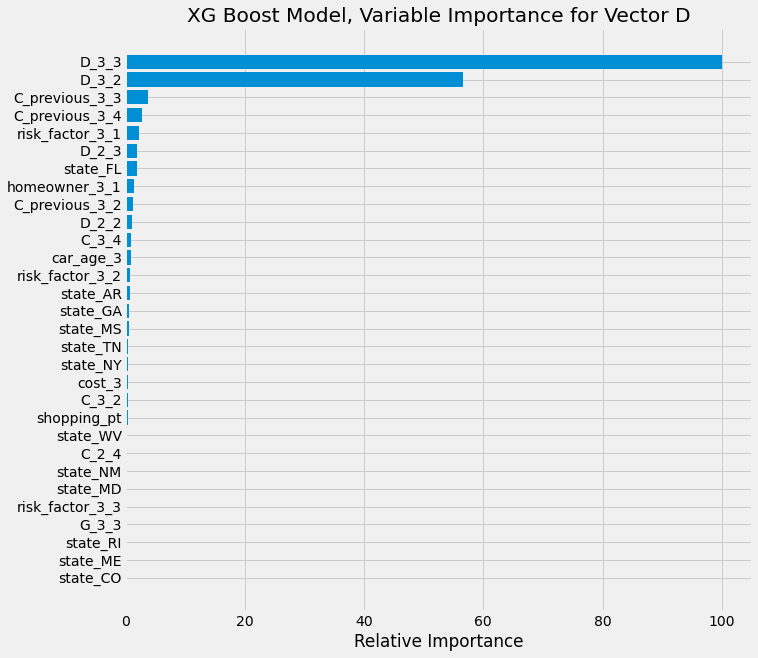

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=5, n_estimators=100;, score=0.905 total time=   5.7s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=5, n_estimators=100;, score=0.908 total time=   5.6s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=5, n_estimators=100;, score=0.905 total time=   5.5s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=5, n_estimators=100;, score=0.909 total time=   5.5s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=5, n_estimators=100;, score=0.904 total time=   3.6s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=5, n_estimators=100;, score=0.909 total time=   3.6s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=5, n_estimators=100;, score=0.907 total time=   3.6s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=5, n_estimators=100;, score=0.910 total time=  

[CV 2/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=5, n_estimators=200;, score=0.909 total time=  10.9s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=5, n_estimators=200;, score=0.905 total time=  11.1s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=5, n_estimators=200;, score=0.909 total time=  11.0s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=3, n_estimators=100;, score=0.907 total time=   3.5s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=3, n_estimators=100;, score=0.910 total time=   3.5s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=3, n_estimators=100;, score=0.908 total time=   3.5s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=3, n_estimators=100;, score=0.911 total time=   3.6s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.3, max_depth=5, n_estimators=400;, score=0.905 total time=  21.7s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.3

[CV 4/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=5, n_estimators=100;, score=0.910 total time=   4.6s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=3, n_estimators=400;, score=0.905 total time=   9.4s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=3, n_estimators=400;, score=0.909 total time=   9.3s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=3, n_estimators=400;, score=0.907 total time=   9.4s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=3, n_estimators=400;, score=0.910 total time=   9.3s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.3, max_depth=5, n_estimators=500;, score=0.904 total time=  27.6s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.3, max_depth=5, n_estimators=500;, score=0.908 total time=  27.8s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.3, max_depth=5, n_estimators=500;, score=0.903 total time=  27.1s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.3, 

[CV 2/4] END colsample_bytree=0.15, learning_rate=0.35, max_depth=5, n_estimators=200;, score=0.909 total time=   7.0s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.35, max_depth=5, n_estimators=200;, score=0.905 total time=   7.0s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.35, max_depth=5, n_estimators=200;, score=0.910 total time=   7.3s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=5, n_estimators=100;, score=0.904 total time=   3.6s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=5, n_estimators=100;, score=0.909 total time=   3.7s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=5, n_estimators=100;, score=0.905 total time=   3.6s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=5, n_estimators=100;, score=0.910 total time=   3.5s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=3, n_estimators=300;, score=0.906 total time=  10.4s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.

In [168]:
#Let's predict D using XG Boost Classifier and use RandomizedSearchCV to find the best XGB classifier Hyperparamters 

vector = 'D'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators=200, max_depth = 1, learning_rate = 0.3, colsample_bytree = 1, plot = True)

results = xgb_randomsearch(vector, 60)

datapath="Modelling_data/quotes_2_3"
filename3 = 'xgboost_results_q2_q3_vector'+vector+'.csv'
save_file(results, filename3, datapath)

In [169]:
# Find scores for the test set
vector = 'D'
for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    max_depth = row['max_depth']
    learning_rate = row['learning_rate']
    colsample_bytree = row['colsample_bytree']
    
    results.loc[i, 'test_score'], results.loc[i, 'f1_score'], xg_probs = xg_predict_plot(vector, n_estimators=int(n_estimators), \
                                                                max_depth = int(max_depth), learning_rate = learning_rate, \
                                                                colsample_bytree = colsample_bytree, plot=False)
    
results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
datapath="Modelling_data/quotes_2_3"
filename4 = 'xgboost_results_q2_q3_vector'+vector+'_final.csv'
save_file(results, filename4, datapath)

XGBoost Classifier results for Vector D
Parameters: No. of Estimators = 100,  max_depth = 5,     learning_rate = 0.5, colsample_bytree = 0.35
Accuracy=0.9076, f1-score=0.9082
XGBoost Classifier results for Vector D
Parameters: No. of Estimators = 100,  max_depth = 5,     learning_rate = 0.3, colsample_bytree = 0.15
Accuracy=0.9081, f1-score=0.9089
XGBoost Classifier results for Vector D
Parameters: No. of Estimators = 300,  max_depth = 5,     learning_rate = 0.3, colsample_bytree = 0.35
Accuracy=0.9067, f1-score=0.9073
XGBoost Classifier results for Vector D
Parameters: No. of Estimators = 200,  max_depth = 4,     learning_rate = 0.35, colsample_bytree = 0.25
Accuracy=0.9075, f1-score=0.9081
XGBoost Classifier results for Vector D
Parameters: No. of Estimators = 300,  max_depth = 5,     learning_rate = 0.5, colsample_bytree = 0.35
Accuracy=0.9041, f1-score=0.9046
XGBoost Classifier results for Vector D
Parameters: No. of Estimators = 300,  max_depth = 3,     learning_rate = 0.3, colsam

XGBoost Classifier results for Vector D
Parameters: No. of Estimators = 300,  max_depth = 4,     learning_rate = 0.5, colsample_bytree = 0.15
Accuracy=0.9053, f1-score=0.9059
XGBoost Classifier results for Vector D
Parameters: No. of Estimators = 300,  max_depth = 3,     learning_rate = 0.25, colsample_bytree = 0.5
Accuracy=0.9083, f1-score=0.909
XGBoost Classifier results for Vector D
Parameters: No. of Estimators = 500,  max_depth = 4,     learning_rate = 0.5, colsample_bytree = 0.15
Accuracy=0.9042, f1-score=0.9048
XGBoost Classifier results for Vector D
Parameters: No. of Estimators = 100,  max_depth = 5,     learning_rate = 0.35, colsample_bytree = 0.15
Accuracy=0.9083, f1-score=0.9091
XGBoost Classifier results for Vector D
Parameters: No. of Estimators = 400,  max_depth = 4,     learning_rate = 0.25, colsample_bytree = 0.35
Accuracy=0.907, f1-score=0.9076
XGBoost Classifier results for Vector D
Parameters: No. of Estimators = 200,  max_depth = 5,     learning_rate = 0.35, colsam

In [170]:
results

,n_estimators,max_depth,learning_rate,colsample_bytree,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,100,5,0.50,0.35,0.906854,36,0.907593,0.908203,12.0,0.907224,31.0
1,100,5,0.30,0.15,0.907435,28,0.908140,0.908888,7.0,0.907788,21.0
2,300,5,0.30,0.35,0.906598,40,0.906705,0.907274,21.0,0.906651,37.0
3,200,4,0.35,0.25,0.907640,25,0.907457,0.908115,13.0,0.907548,24.0
4,300,5,0.50,0.35,0.903317,57,0.904108,0.904597,36.0,0.903712,57.0
5,300,3,0.30,0.25,0.908221,10,0.908755,0.909452,2.0,0.908488,2.0
6,100,4,0.50,0.25,0.908016,15,0.908277,0.908988,5.0,0.908146,12.0
7,500,3,0.25,0.25,0.908016,14,0.907593,0.908252,12.0,0.907805,19.0
8,400,4,0.25,0.15,0.907828,21,0.906842,0.907487,19.0,0.907335,30.0
9,100,5,0.30,0.25,0.908477,6,0.908824,0.909543,1.0,0.908651,1.0


XGBoost Classifier results for Vector D
Parameters: No. of Estimators = 100,  max_depth = 5,     learning_rate = 0.3, colsample_bytree = 0.25
Accuracy=0.9088, f1-score=0.9095
Confusion Matrix - normalized
 [[0.895  0.0478 0.0572]
 [0.0655 0.8474 0.0871]
 [0.0219 0.0443 0.9339]]
Confusion Matrix
 [[1722   92  110]
 [ 221 2860  294]
 [ 204  413 8715]]

Classification Report 
               precision    recall  f1-score   support

           0       0.80      0.90      0.85      1924
           1       0.85      0.85      0.85      3375
           2       0.96      0.93      0.94      9332

    accuracy                           0.91     14631
   macro avg       0.87      0.89      0.88     14631
weighted avg       0.91      0.91      0.91     14631

30


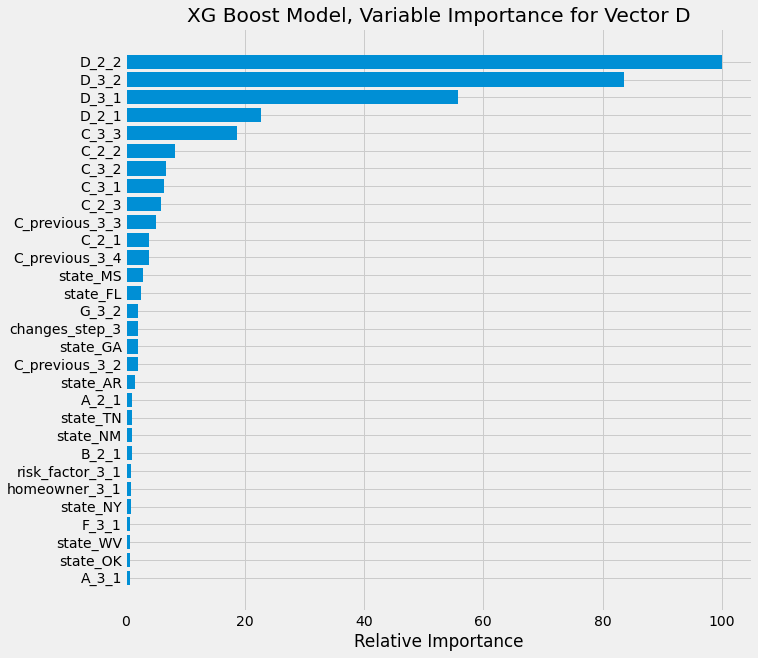

In [118]:
#Let's plot the best model for D using XG Boost Classifier (Iteration 9)
vector = 'D'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators=100, max_depth = 5, learning_rate = 0.3, colsample_bytree = 0.25, plot = True)

In [119]:
vector = 'D'
score_matrix = model_score_matrix(vector, 3, xg_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,1285,91,6.613372
cust_maintained_vector,49,13206,99.630328


# Quote 2 & 3: Predict E

In [172]:
vector = 'E'
last_quote = 3
test_set = df_hist_2_3.iloc[y_test.index,:]
x = pd.crosstab(test_set[vector], test_set[vector+'_'+str(last_quote)])
same_as_3 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 
print(f"Accuracy based on simply predicting vector {vector} = {vector}_{last_quote} : {(np.sum(same_as_3)/y_test.shape[0]): 4.4}")
print(f"Confusion_Matrix")
x['total'] = x.sum(axis=1)
x['E0_%'] = np.around(x[0]/ x['total'], 4)
x['E1_%'] = np.around(x[1]/ x['total'], 4)
x

Accuracy based on simply predicting vector E = E_3 :  0.8911
Confusion_Matrix


E_3,0,1,total,E0_%,E1_%
E,,,,,
0,7226,668,7894,0.9154,0.0846
1,925,5812,6737,0.1373,0.8627


In [178]:
vector = 'E'
last_quote = 3
test_set2 = df_hist_2_3.iloc[y_train.index,:]
x2 = pd.crosstab(test_set2[vector], test_set2[vector+'_'+str(last_quote)])
same_as_3 = [x2.iloc[idx,idx] for idx in range(x2.shape[0])] 
print(f"TRAINING Accuracy based on simply predicting vector {vector} = {vector}_{last_quote} : {(np.sum(same_as_3)/y_train.shape[0]): 4.4}")
print(f"Confusion_Matrix - TRAINING")
x2['total'] = x2.sum(axis=1)
x2['E0_%'] = np.around(x2[0]/ x2['total'], 4)
x2['E1_%'] = np.around(x2[1]/ x2['total'], 4)
x2

TRAINING Accuracy based on simply predicting vector E = E_3 :  0.8887
Confusion_Matrix - TRAINING


E_3,0,1,total,E0_%,E1_%
E,,,,,
0,28717,2715,31432,0.9136,0.0864
1,3799,23290,27089,0.1402,0.8598


Random Forest Classifier results for Vector E
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8912, f1-score=0.891
Confusion Matrix - normalized
 [[0.9151 0.0849]
 [0.1369 0.8631]]
Confusion Matrix
 [[7224  670]
 [ 922 5815]]

Classification Report 
               precision    recall  f1-score   support

           0       0.89      0.92      0.90      7894
           1       0.90      0.86      0.88      6737

    accuracy                           0.89     14631
   macro avg       0.89      0.89      0.89     14631
weighted avg       0.89      0.89      0.89     14631

30


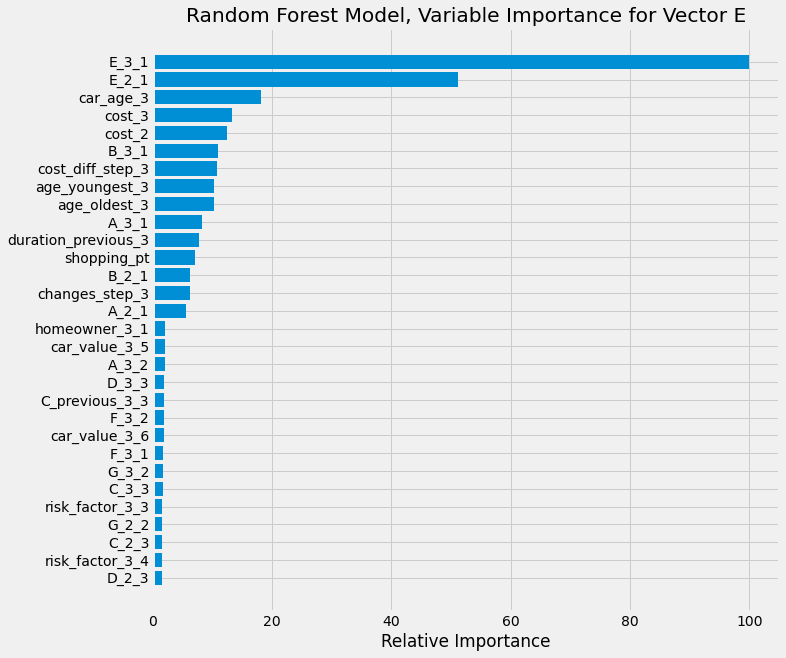

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END min_samples_leaf=2, min_samples_split=2, n_estimators=200;, score=0.887 total time=  18.2s
[CV 2/4] END min_samples_leaf=2, min_samples_split=2, n_estimators=200;, score=0.893 total time=   7.7s
[CV 3/4] END min_samples_leaf=2, min_samples_split=2, n_estimators=200;, score=0.886 total time=   8.0s
[CV 4/4] END min_samples_leaf=2, min_samples_split=2, n_estimators=200;, score=0.889 total time=   8.1s
[CV 1/4] END min_samples_leaf=1, min_samples_split=4, n_estimators=500;, score=0.887 total time=  19.1s
[CV 2/4] END min_samples_leaf=1, min_samples_split=4, n_estimators=500;, score=0.894 total time=  19.4s
[CV 3/4] END min_samples_leaf=1, min_samples_split=4, n_estimators=500;, score=0.886 total time=  18.2s
[CV 4/4] END min_samples_leaf=1, min_samples_split=4, n_estimators=500;, score=0.889 total time=  18.5s
[CV 1/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=600;, score=0.887 total time=  21.1s
[C

[CV 4/4] END min_samples_leaf=4, min_samples_split=4, n_estimators=200;, score=0.889 total time=   6.1s
[CV 1/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=600;, score=0.887 total time=  17.4s
[CV 2/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=600;, score=0.893 total time=  17.3s
[CV 3/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=600;, score=0.886 total time=  17.4s
[CV 4/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=600;, score=0.889 total time=  17.8s
[CV 1/4] END min_samples_leaf=1, min_samples_split=3, n_estimators=800;, score=0.887 total time=  25.2s
[CV 2/4] END min_samples_leaf=1, min_samples_split=3, n_estimators=800;, score=0.894 total time=  25.2s
[CV 3/4] END min_samples_leaf=1, min_samples_split=3, n_estimators=800;, score=0.886 total time=  25.2s
[CV 4/4] END min_samples_leaf=1, min_samples_split=3, n_estimators=800;, score=0.889 total time=  25.5s
[CV 1/4] END min_samples_leaf=1, min_samples_split=2, n_estimato

[CV 3/4] END min_samples_leaf=2, min_samples_split=4, n_estimators=200;, score=0.886 total time=   6.2s
[CV 4/4] END min_samples_leaf=2, min_samples_split=4, n_estimators=200;, score=0.889 total time=   6.2s
[CV 1/4] END min_samples_leaf=2, min_samples_split=5, n_estimators=800;, score=0.887 total time=  23.7s
[CV 2/4] END min_samples_leaf=2, min_samples_split=5, n_estimators=800;, score=0.893 total time=  24.4s
[CV 3/4] END min_samples_leaf=2, min_samples_split=5, n_estimators=800;, score=0.886 total time=  24.3s
[CV 4/4] END min_samples_leaf=2, min_samples_split=5, n_estimators=800;, score=0.889 total time=  24.4s
[CV 1/4] END min_samples_leaf=4, min_samples_split=4, n_estimators=300;, score=0.887 total time=   8.9s
[CV 2/4] END min_samples_leaf=4, min_samples_split=4, n_estimators=300;, score=0.894 total time=   8.9s
[CV 3/4] END min_samples_leaf=4, min_samples_split=4, n_estimators=300;, score=0.886 total time=   9.0s
[CV 4/4] END min_samples_leaf=4, min_samples_split=4, n_estimato

[CV 2/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.894 total time=   8.6s
[CV 3/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.886 total time=   9.1s
[CV 4/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=300;, score=0.889 total time=   8.8s
Vector E RandomizedSearchCV: Random Forest Model
Best Score:0.8890484046061244
Best Parameters: {'n_estimators': 300, 'min_samples_split': 3, 'min_samples_leaf': 1}
Writing file.  "Modelling_data/quotes_2_3\rf_results_q2_q3_vectorE.csv"


In [173]:
# RF Classifier: Predict E using quotes 2 and 3 and then RandomizedSearchCV to find best hyperparameters

vector = 'E'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=300, min_samples_leaf = 1, min_samples_split = 2, plot=True)

results = rf_randomsearch(vector, 60)

datapath="Modelling_data/quotes_2_3"
filename1 = 'rf_results_q2_q3_vector'+vector+'.csv'
save_file(results, filename1, datapath)

In [174]:
# Get scores for test set
vector = 'E'

for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    min_samples_leaf = row['min_samples_leaf']
    min_samples_split = row['min_samples_split']
    
    results.loc[i, 'test_score'], results.loc[i, 'f1_score'], rf_probs = rf_predict_plot(vector, n_estimators=int(n_estimators), \
                                                                min_samples_leaf = int(min_samples_leaf), \
                                                                min_samples_split = int(min_samples_split), plot=False)
    
results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
datapath="Modelling_data/quotes_2_3"
filename2 = 'rf_results_q2_q3_vector'+vector+'_final.csv'
save_file(results, filename2, datapath)

Random Forest Classifier results for Vector E
Parameters: No. of Estimators = 200,  min_samples_leaf = 2,     min_samples_split = 2
Accuracy=0.8913, f1-score=0.8911
Random Forest Classifier results for Vector E
Parameters: No. of Estimators = 500,  min_samples_leaf = 1,     min_samples_split = 4
Accuracy=0.8913, f1-score=0.8911
Random Forest Classifier results for Vector E
Parameters: No. of Estimators = 600,  min_samples_leaf = 4,     min_samples_split = 5
Accuracy=0.8913, f1-score=0.8911
Random Forest Classifier results for Vector E
Parameters: No. of Estimators = 600,  min_samples_leaf = 4,     min_samples_split = 4
Accuracy=0.8913, f1-score=0.8911
Random Forest Classifier results for Vector E
Parameters: No. of Estimators = 100,  min_samples_leaf = 3,     min_samples_split = 5
Accuracy=0.8914, f1-score=0.8912
Random Forest Classifier results for Vector E
Parameters: No. of Estimators = 700,  min_samples_leaf = 3,     min_samples_split = 4
Accuracy=0.8914, f1-score=0.8912
Random For

Random Forest Classifier results for Vector E
Parameters: No. of Estimators = 200,  min_samples_leaf = 4,     min_samples_split = 2
Accuracy=0.8912, f1-score=0.891
Random Forest Classifier results for Vector E
Parameters: No. of Estimators = 100,  min_samples_leaf = 3,     min_samples_split = 3
Accuracy=0.8914, f1-score=0.8912
Random Forest Classifier results for Vector E
Parameters: No. of Estimators = 100,  min_samples_leaf = 2,     min_samples_split = 5
Accuracy=0.8913, f1-score=0.8911
Random Forest Classifier results for Vector E
Parameters: No. of Estimators = 100,  min_samples_leaf = 2,     min_samples_split = 4
Accuracy=0.8911, f1-score=0.8909
Random Forest Classifier results for Vector E
Parameters: No. of Estimators = 500,  min_samples_leaf = 2,     min_samples_split = 4
Accuracy=0.8912, f1-score=0.891
Random Forest Classifier results for Vector E
Parameters: No. of Estimators = 500,  min_samples_leaf = 4,     min_samples_split = 4
Accuracy=0.8912, f1-score=0.891
Random Forest

In [196]:
results_E_rf = pd.read_csv("Modelling_data/quotes_2_3/rf_results_q2_q3_vectorE_final.csv")
results_E_rf

,n_estimators,min_samples_split,min_samples_leaf,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,200,2,2,0.888843,28,0.891258,0.891070,5.0,0.890051,27.0
1,500,4,1,0.888946,8,0.891327,0.891143,4.0,0.890136,11.0
2,600,5,4,0.888724,58,0.891258,0.891072,5.0,0.889991,38.0
3,600,4,4,0.888724,58,0.891258,0.891072,5.0,0.889991,38.0
4,100,5,3,0.888878,18,0.891395,0.891211,3.0,0.890136,12.0
5,700,4,3,0.888860,21,0.891395,0.891211,3.0,0.890128,13.0
6,600,5,1,0.888997,3,0.891395,0.891212,3.0,0.890196,2.0
7,300,4,1,0.888980,4,0.891395,0.891211,3.0,0.890188,5.0
8,700,4,2,0.888809,43,0.891327,0.891141,4.0,0.890068,24.0
9,500,3,3,0.888843,24,0.891395,0.891211,3.0,0.890119,14.0


Random Forest Classifier results for Vector E
Parameters: No. of Estimators = 600,  min_samples_leaf = 1,     min_samples_split = 5
Accuracy=0.8914, f1-score=0.8912
Confusion Matrix - normalized
 [[0.9154 0.0846]
 [0.1367 0.8633]]
Confusion Matrix
 [[7226  668]
 [ 921 5816]]

Classification Report 
               precision    recall  f1-score   support

           0       0.89      0.92      0.90      7894
           1       0.90      0.86      0.88      6737

    accuracy                           0.89     14631
   macro avg       0.89      0.89      0.89     14631
weighted avg       0.89      0.89      0.89     14631

30


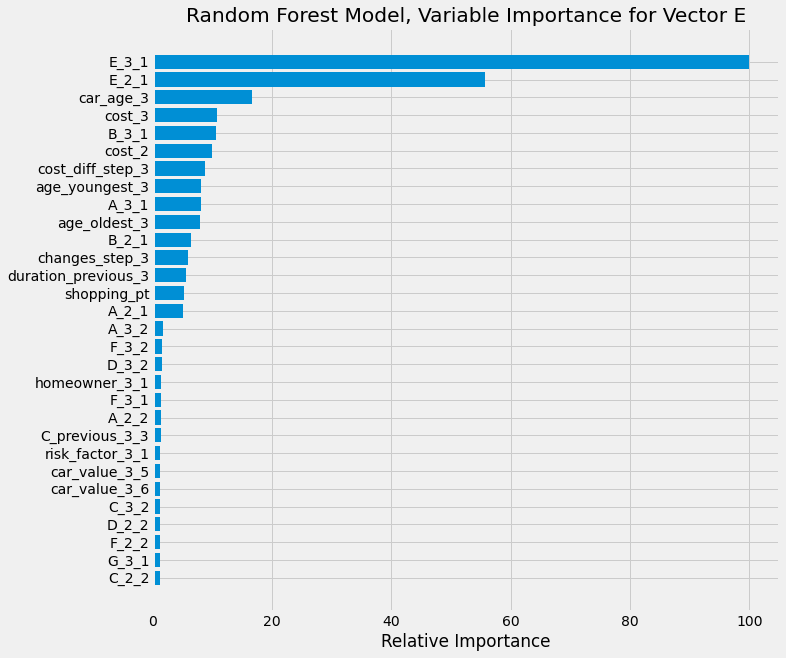

In [116]:
#Let's plot the best model for E using Random Forest Classifier (Iteration 6)
vector = 'E'
rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=600, min_samples_leaf = 1, min_samples_split = 5, plot=True)

In [117]:
vector = 'E'
score_matrix = model_score_matrix(vector, 3, rf_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,1585,8,0.502197
cust_maintained_vector,4,13034,99.969320


XGBoost Classifier results for Vector E
Parameters: No. of Estimators = 200,  max_depth = 1,     learning_rate = 0.3, colsample_bytree = 1
Accuracy=0.8915, f1-score=0.8913
Confusion Matrix - normalized
 [[0.9164 0.0836]
 [0.1377 0.8623]]
Confusion Matrix
 [[7234  660]
 [ 928 5809]]

Classification Report 
               precision    recall  f1-score   support

           0       0.89      0.92      0.90      7894
           1       0.90      0.86      0.88      6737

    accuracy                           0.89     14631
   macro avg       0.89      0.89      0.89     14631
weighted avg       0.89      0.89      0.89     14631

30


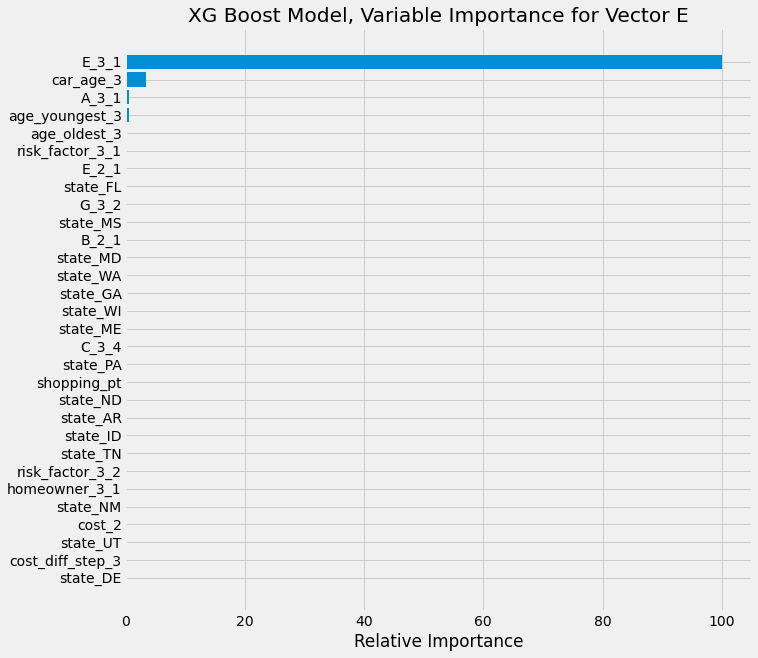

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=3, n_estimators=100;, score=0.887 total time=   1.4s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=3, n_estimators=100;, score=0.892 total time=   1.4s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=3, n_estimators=100;, score=0.886 total time=   1.4s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=3, n_estimators=100;, score=0.888 total time=   1.2s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=5, n_estimators=200;, score=0.884 total time=   3.7s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=5, n_estimators=200;, score=0.892 total time=   3.9s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=5, n_estimators=200;, score=0.886 total time=   3.7s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=5, n_estimators=200;, score=0.887 total tim

[CV 2/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=500;, score=0.890 total time=  11.1s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=500;, score=0.883 total time=  11.4s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=500;, score=0.885 total time=  11.0s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=400;, score=0.883 total time=   8.9s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=400;, score=0.890 total time=   8.9s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=400;, score=0.884 total time=   8.9s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.3, max_depth=4, n_estimators=400;, score=0.886 total time=   8.9s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.35, max_depth=4, n_estimators=500;, score=0.884 total time=   6.5s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.35, max_de

[CV 4/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=5, n_estimators=100;, score=0.886 total time=   2.9s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.35, max_depth=5, n_estimators=300;, score=0.883 total time=   4.5s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.35, max_depth=5, n_estimators=300;, score=0.889 total time=   4.4s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.35, max_depth=5, n_estimators=300;, score=0.882 total time=   4.5s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.35, max_depth=5, n_estimators=300;, score=0.884 total time=   4.5s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=5, n_estimators=100;, score=0.886 total time=   2.2s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=5, n_estimators=100;, score=0.893 total time=   2.2s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.25, max_depth=5, n_estimators=100;, score=0.886 total time=   2.2s
[CV 4/4] END colsample_bytree=0.35, learning_rate=

[CV 2/4] END colsample_bytree=0.25, learning_rate=0.5, max_depth=3, n_estimators=500;, score=0.890 total time=   6.4s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.5, max_depth=3, n_estimators=500;, score=0.882 total time=   6.4s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.5, max_depth=3, n_estimators=500;, score=0.885 total time=   6.5s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=3, n_estimators=300;, score=0.883 total time=   3.3s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=3, n_estimators=300;, score=0.892 total time=   3.3s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=3, n_estimators=300;, score=0.886 total time=   3.3s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.5, max_depth=3, n_estimators=300;, score=0.887 total time=   3.3s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.35, max_depth=3, n_estimators=200;, score=0.885 total time=   2.2s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.35,

In [175]:
#Let's predict E using XG Boost Classifier and use RandomizedSearchCV to find the best XGB classifier Hyperparamters 

vector = 'E'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators=200, max_depth = 1, learning_rate = 0.3, colsample_bytree = 1, plot = True)

results = xgb_randomsearch(vector, 60)

datapath="Modelling_data/quotes_2_3"
filename3 = 'xgboost_results_q2_q3_vector'+vector+'.csv'
save_file(results, filename3, datapath)

In [176]:
# Find scores for the test set
vector = 'E'
for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    max_depth = row['max_depth']
    learning_rate = row['learning_rate']
    colsample_bytree = row['colsample_bytree']
    
    results.loc[i, 'test_score'], results.loc[i, 'f1_score'], xg_probs = xg_predict_plot(vector, n_estimators=int(n_estimators), \
                                                                max_depth = int(max_depth), learning_rate = learning_rate, \
                                                                colsample_bytree = colsample_bytree, plot=False)
    
results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
datapath="Modelling_data/quotes_2_3"
filename4 = 'xgboost_results_q2_q3_vector'+vector+'_final.csv'
save_file(results, filename4, datapath)

XGBoost Classifier results for Vector E
Parameters: No. of Estimators = 100,  max_depth = 3,     learning_rate = 0.25, colsample_bytree = 0.25
Accuracy=0.8915, f1-score=0.8913
XGBoost Classifier results for Vector E
Parameters: No. of Estimators = 200,  max_depth = 5,     learning_rate = 0.3, colsample_bytree = 0.25
Accuracy=0.8906, f1-score=0.8905
XGBoost Classifier results for Vector E
Parameters: No. of Estimators = 500,  max_depth = 3,     learning_rate = 0.3, colsample_bytree = 0.25
Accuracy=0.8905, f1-score=0.8903
XGBoost Classifier results for Vector E
Parameters: No. of Estimators = 500,  max_depth = 3,     learning_rate = 0.3, colsample_bytree = 0.15
Accuracy=0.8911, f1-score=0.8909
XGBoost Classifier results for Vector E
Parameters: No. of Estimators = 500,  max_depth = 5,     learning_rate = 0.35, colsample_bytree = 0.15
Accuracy=0.8873, f1-score=0.8871
XGBoost Classifier results for Vector E
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.25, cols

XGBoost Classifier results for Vector E
Parameters: No. of Estimators = 200,  max_depth = 5,     learning_rate = 0.25, colsample_bytree = 0.5
Accuracy=0.8904, f1-score=0.8902
XGBoost Classifier results for Vector E
Parameters: No. of Estimators = 200,  max_depth = 5,     learning_rate = 0.3, colsample_bytree = 0.5
Accuracy=0.8903, f1-score=0.8901
XGBoost Classifier results for Vector E
Parameters: No. of Estimators = 100,  max_depth = 3,     learning_rate = 0.35, colsample_bytree = 0.25
Accuracy=0.8915, f1-score=0.8913
XGBoost Classifier results for Vector E
Parameters: No. of Estimators = 400,  max_depth = 5,     learning_rate = 0.25, colsample_bytree = 0.15
Accuracy=0.8896, f1-score=0.8894
XGBoost Classifier results for Vector E
Parameters: No. of Estimators = 500,  max_depth = 3,     learning_rate = 0.3, colsample_bytree = 0.5
Accuracy=0.8908, f1-score=0.8906
XGBoost Classifier results for Vector E
Parameters: No. of Estimators = 500,  max_depth = 3,     learning_rate = 0.5, colsamp

In [177]:
results

,n_estimators,max_depth,learning_rate,colsample_bytree,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,100,3,0.25,0.25,0.888502,6,0.891532,0.891323,3.0,0.890017,2.0
1,200,5,0.30,0.25,0.886998,33,0.890643,0.890457,14.0,0.888821,32.0
2,500,3,0.30,0.25,0.887733,23,0.890506,0.890320,16.0,0.889120,26.0
3,500,3,0.30,0.15,0.887904,20,0.891122,0.890933,8.0,0.889513,18.0
4,500,5,0.35,0.15,0.882384,57,0.887294,0.887132,32.0,0.884839,57.0
5,200,3,0.25,0.25,0.888707,3,0.891190,0.890982,7.0,0.889948,5.0
6,100,5,0.30,0.25,0.887938,16,0.890848,0.890644,11.0,0.889393,20.0
7,400,4,0.30,0.35,0.885870,43,0.888934,0.888755,25.0,0.887402,45.0
8,400,4,0.35,0.25,0.885716,44,0.888798,0.888631,27.0,0.887257,46.0
9,100,3,0.30,0.35,0.888707,2,0.890917,0.890713,10.0,0.889812,8.0


XGBoost Classifier results for Vector E
Parameters: No. of Estimators = 100,  max_depth = 3,     learning_rate = 0.25, colsample_bytree = 0.5
Accuracy=0.8914, f1-score=0.8912
Confusion Matrix - normalized
 [[0.9172 0.0828]
 [0.1388 0.8612]]
Confusion Matrix
 [[7240  654]
 [ 935 5802]]

Classification Report 
               precision    recall  f1-score   support

           0       0.89      0.92      0.90      7894
           1       0.90      0.86      0.88      6737

    accuracy                           0.89     14631
   macro avg       0.89      0.89      0.89     14631
weighted avg       0.89      0.89      0.89     14631

30


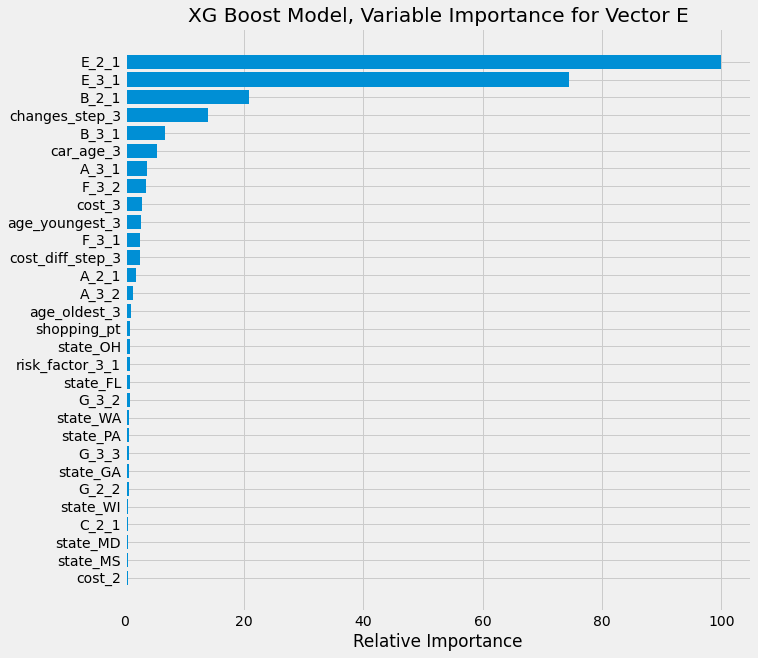

In [114]:
#Let's plot the best model for E using XG Boost Classifier (Iteration 40, overall rank 1)

xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators=100, max_depth = 3, learning_rate = 0.25, colsample_bytree = 0.5, plot = True)

In [115]:
vector = 'E'
score_matrix = model_score_matrix(vector, 3, xg_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,1570,23,1.443817
cust_maintained_vector,19,13019,99.854272


In [112]:
# Let's use Logistics Regression to predict vector E

vector = 'E'
lr_ac, lr_f1, lr_probs, lr_preds = lr_predict(vector)

Logistic Regression for vector E
Accuracy = 0.8911, f1-score = 0.8909

Confusion Matrix - normalized
 [[0.9154 0.0846]
 [0.1373 0.8627]]
Confusion Matrix
 [[7226  668]
 [ 925 5812]]

Classification Report 
               precision    recall  f1-score   support

           0       0.89      0.92      0.90      7894
           1       0.90      0.86      0.88      6737

    accuracy                           0.89     14631
   macro avg       0.89      0.89      0.89     14631
weighted avg       0.89      0.89      0.89     14631


Area under ROC: 
 0.9254818906545571


C:\Users\amite\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [113]:
vector = 'E'
score_matrix = model_score_matrix(vector, 3, lr_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,1590,3,0.188324
cust_maintained_vector,3,13035,99.976990


In [202]:
vector = 'E'

fpr_1, tpr_1, thresholds_1 = roc_curve(y_test[vector].astype('int'), rf_probs)
roc_auc1 = auc(fpr_1, tpr_1)

fpr_2, tpr_2, thresholds_2 = roc_curve(y_test[vector].astype('int'), xg_probs)
roc_auc2 = auc(fpr_2, tpr_2)

fpr_3, tpr_3, thresholds_3 = roc_curve(y_test[vector].astype('int'), lr_probs)
roc_auc3 = auc(fpr_3, tpr_3)

roc_auc1, roc_auc2, roc_auc3

(0.9283730728726803, 0.9299934838705771, 0.9254818906545571)

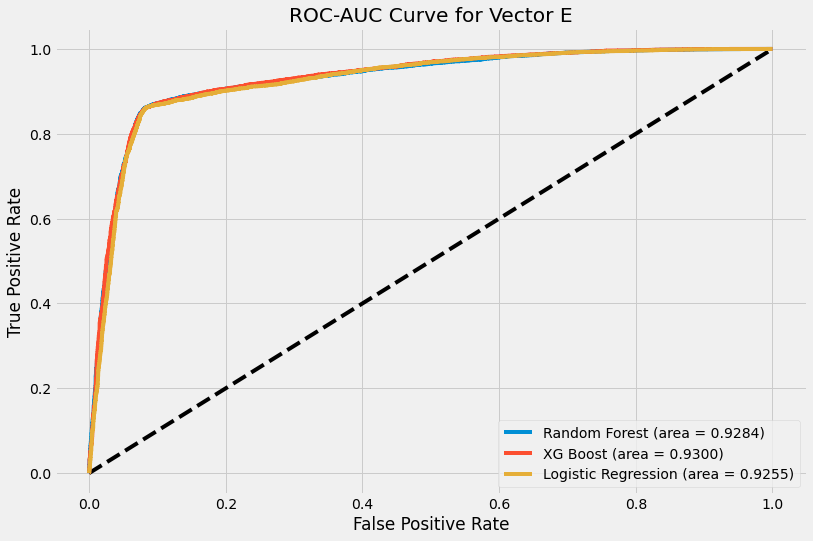

In [203]:
# Let's plot the ROC curve for all the models for vector E
vector = 'E'
plt.figure(figsize=(12,8))

plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_1, tpr_1, label='Random Forest (area = 0.9284)')
plt.plot(fpr_2, tpr_2, label='XG Boost (area = 0.9300)')
plt.plot(fpr_3, tpr_3, label='Logistic Regression (area = 0.9255)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-AUC Curve for Vector '+vector)
plt.legend()
plt.show()

Vector E Logistic Regression Model
Best Accuracy score of 0.8913 occurs for threshold = 0.53
Vector E Random Forest Model
Best Accuracy score of 0.8919 occurs for threshold = 0.557
Vector E XG Boost Model
Best Accuracy score of 0.8915 occurs for threshold = 0.529


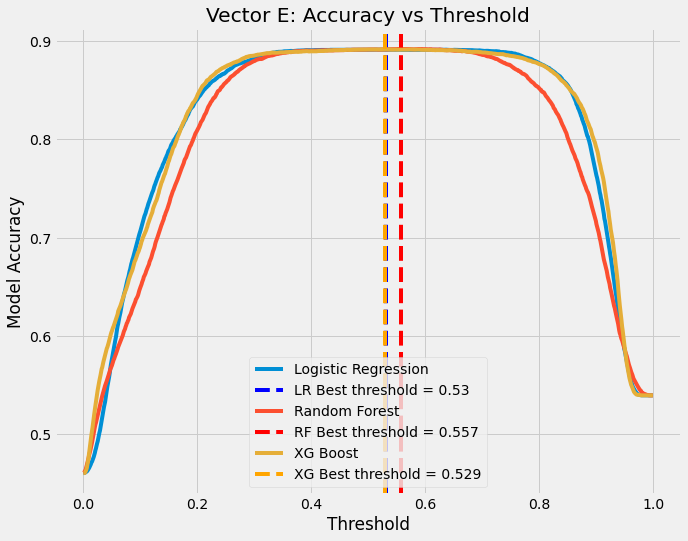

In [204]:
# We are concerned with accuracy of the model i.e. its ability to predict both the 0 and 1 labels correctly
# So we will calculate the accuracy score at different thresholds directly
vector = 'E'
plt.figure(figsize=(10,8))

def to_labels(pos_probs, threshold):
    return (pos_probs >= threshold).astype('int')

thresholds = np.arange(0, 1, 0.001)

# for LR model
ac_score_lr = [accuracy_score(y_test[vector].astype('int'), to_labels(lr_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_lr)
print(f"Vector {vector} Logistic Regression Model\nBest Accuracy score of {ac_score_lr[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_lr, label='Logistic Regression')
plt.axvline(thresholds[idx], color='blue', linestyle="--", label = "LR Best threshold = "+str(np.round(thresholds[idx],4)))

# for random forest
thresholds = np.arange(0, 1, 0.001)
ac_score_rf = [accuracy_score(y_test[vector].astype('int'), to_labels(rf_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_rf)
print(f"Vector {vector} Random Forest Model\nBest Accuracy score of {ac_score_rf[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_rf, label='Random Forest')
plt.axvline(thresholds[idx], color='red', linestyle="--", label = "RF Best threshold = "+str(np.round(thresholds[idx],4)))

# for XG Boost
thresholds = np.arange(0, 1, 0.001)
ac_score_xg = [accuracy_score(y_test[vector].astype('int'), to_labels(xg_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_xg)
print(f"Vector {vector} XG Boost Model\nBest Accuracy score of {ac_score_xg[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_xg, label='XG Boost')
plt.axvline(thresholds[idx], color='orange', linestyle="--", label = "XG Best threshold = "+str(np.round(thresholds[idx],4)))

plt.xlabel('Threshold')
plt.ylabel('Model Accuracy')
plt.title('Vector E: Accuracy vs Threshold')

plt.legend()
plt.show()

# Quote 2 & 3: Predict F

In [182]:
vector = 'F'
last_quote = 3

test_set = df_hist_2_3.iloc[y_test.index,:]

x = pd.crosstab(test_set[vector], test_set[vector+'_'+str(last_quote)])

same_as_3 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 

print(f"Accuracy based on simply predicting vector {vector} = {vector}_{last_quote} : {(np.sum(same_as_3)/y_test.shape[0]): 4.4}")
print(f"Confusion_Matrix")

x['total'] = x.sum(axis=1)
x['F0_%'] = np.around(x[0]/ x['total'], 4)
x['F1_%'] = np.around(x[1]/ x['total'], 4)
x['F2_%'] = np.around(x[2]/ x['total'], 4)
x['F3_%'] = np.around(x[3]/ x['total'], 4)
x

Accuracy based on simply predicting vector F = F_3 :  0.8738
Confusion_Matrix


F_3,0,1,2,3,total,F0_%,F1_%,F2_%,F3_%
F,,,,,,,,,
0,4388,88,239,22,4737,0.9263,0.0186,0.0505,0.0046
1,134,3018,412,40,3604,0.0372,0.8374,0.1143,0.0111
2,226,275,4810,118,5429,0.0416,0.0507,0.8860,0.0217
3,40,41,211,569,861,0.0465,0.0476,0.2451,0.6609


In [181]:
vector = 'F'
last_quote = 3
test_set2 = df_hist_2_3.iloc[y_train.index,:]
x2 = pd.crosstab(test_set2[vector], test_set2[vector+'_'+str(last_quote)])
same_as_3 = [x2.iloc[idx,idx] for idx in range(x2.shape[0])] 
print(f"TRAINING Accuracy based on simply predicting vector {vector} = {vector}_{last_quote} : {(np.sum(same_as_3)/y_train.shape[0]): 4.4}")
print(f"Confusion_Matrix - TRAINING")
x2['total'] = x2.sum(axis=1)
x2['F0_%'] = np.around(x2[0]/ x2['total'], 4)
x2['F1_%'] = np.around(x2[1]/ x2['total'], 4)
x2['F2_%'] = np.around(x2[2]/ x2['total'], 4)
x2['F3_%'] = np.around(x2[3]/ x2['total'], 4)
x2

TRAINING Accuracy based on simply predicting vector F = F_3 :  0.8776
Confusion_Matrix - TRAINING


F_3,0,1,2,3,total,F0_%,F1_%,F2_%,F3_%
F,,,,,,,,,
0,17405,391,855,126,18777,0.9269,0.0208,0.0455,0.0067
1,497,12335,1545,128,14505,0.0343,0.8504,0.1065,0.0088
2,945,1183,19298,419,21845,0.0433,0.0542,0.8834,0.0192
3,176,132,764,2322,3394,0.0519,0.0389,0.2251,0.6841


Random Forest Classifier results for Vector F
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8763, f1-score=0.8757
Confusion Matrix - normalized
 [[0.9255 0.019  0.0513 0.0042]
 [0.0305 0.838  0.1204 0.0111]
 [0.0337 0.0512 0.8932 0.0219]
 [0.0407 0.0476 0.252  0.6597]]
Confusion Matrix
 [[4384   90  243   20]
 [ 110 3020  434   40]
 [ 183  278 4849  119]
 [  35   41  217  568]]

Classification Report 
               precision    recall  f1-score   support

           0       0.93      0.93      0.93      4737
           1       0.88      0.84      0.86      3604
           2       0.84      0.89      0.87      5429
           3       0.76      0.66      0.71       861

    accuracy                           0.88     14631
   macro avg       0.85      0.83      0.84     14631
weighted avg       0.88      0.88      0.88     14631

30


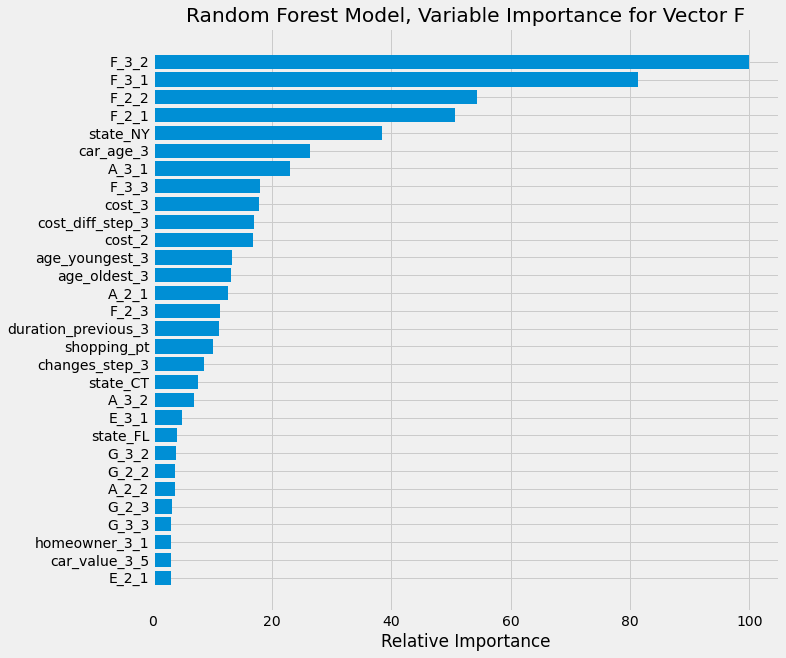

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=700;, score=0.879 total time=  36.3s
[CV 2/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=700;, score=0.878 total time=  25.6s
[CV 3/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=700;, score=0.879 total time=  26.6s
[CV 4/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=700;, score=0.882 total time=  25.1s
[CV 1/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=500;, score=0.878 total time=  16.7s
[CV 2/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=500;, score=0.878 total time=  16.6s
[CV 3/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=500;, score=0.879 total time=  16.8s
[CV 4/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=500;, score=0.881 total time=  16.0s
[CV 1/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=400;, score=0.879 total time=  14.7s
[C

[CV 4/4] END min_samples_leaf=1, min_samples_split=3, n_estimators=100;, score=0.882 total time=   4.0s
[CV 1/4] END min_samples_leaf=2, min_samples_split=5, n_estimators=500;, score=0.879 total time=  16.8s
[CV 2/4] END min_samples_leaf=2, min_samples_split=5, n_estimators=500;, score=0.878 total time=  16.7s
[CV 3/4] END min_samples_leaf=2, min_samples_split=5, n_estimators=500;, score=0.879 total time=  16.7s
[CV 4/4] END min_samples_leaf=2, min_samples_split=5, n_estimators=500;, score=0.881 total time=  16.5s
[CV 1/4] END min_samples_leaf=4, min_samples_split=4, n_estimators=400;, score=0.878 total time=  12.7s
[CV 2/4] END min_samples_leaf=4, min_samples_split=4, n_estimators=400;, score=0.878 total time=  12.7s
[CV 3/4] END min_samples_leaf=4, min_samples_split=4, n_estimators=400;, score=0.879 total time=  12.9s
[CV 4/4] END min_samples_leaf=4, min_samples_split=4, n_estimators=400;, score=0.880 total time=  12.8s
[CV 1/4] END min_samples_leaf=3, min_samples_split=4, n_estimato

[CV 3/4] END min_samples_leaf=2, min_samples_split=5, n_estimators=700;, score=0.879 total time=  24.3s
[CV 4/4] END min_samples_leaf=2, min_samples_split=5, n_estimators=700;, score=0.881 total time=  24.3s
[CV 1/4] END min_samples_leaf=3, min_samples_split=4, n_estimators=600;, score=0.878 total time=  20.4s
[CV 2/4] END min_samples_leaf=3, min_samples_split=4, n_estimators=600;, score=0.878 total time=  21.1s
[CV 3/4] END min_samples_leaf=3, min_samples_split=4, n_estimators=600;, score=0.879 total time=  20.1s
[CV 4/4] END min_samples_leaf=3, min_samples_split=4, n_estimators=600;, score=0.881 total time=  21.1s
[CV 1/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.879 total time=   7.4s
[CV 2/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.878 total time=   7.4s
[CV 3/4] END min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.880 total time=   7.5s
[CV 4/4] END min_samples_leaf=1, min_samples_split=2, n_estimato

[CV 2/4] END min_samples_leaf=4, min_samples_split=3, n_estimators=200;, score=0.878 total time=   7.3s
[CV 3/4] END min_samples_leaf=4, min_samples_split=3, n_estimators=200;, score=0.878 total time=   7.0s
[CV 4/4] END min_samples_leaf=4, min_samples_split=3, n_estimators=200;, score=0.880 total time=   7.1s
Vector F RandomizedSearchCV: Random Forest Model
Best Score:0.8796500438469186
Best Parameters: {'n_estimators': 200, 'min_samples_split': 4, 'min_samples_leaf': 1}
Writing file.  "Modelling_data/quotes_2_3\rf_results_q2_q3_vectorF.csv"


In [183]:
# RF Classifier: Predict F using quotes 2 and 3 and then RandomizedSearchCV to find best hyperparameters

vector = 'F'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=300, min_samples_leaf = 1, min_samples_split = 2, plot=True)

results = rf_randomsearch(vector, 60)

datapath="Modelling_data/quotes_2_3"
filename1 = 'rf_results_q2_q3_vector'+vector+'.csv'
save_file(results, filename1, datapath)

In [206]:
# Get scores for test set
vector = 'F'

for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    min_samples_leaf = row['min_samples_leaf']
    min_samples_split = row['min_samples_split']
    
    results.loc[i, 'test_score'], results.loc[i, 'f1_score'], rf_probs = rf_predict_plot(vector, n_estimators=int(n_estimators), \
                                                                min_samples_leaf = int(min_samples_leaf), \
                                                                min_samples_split = int(min_samples_split), plot=False)
    
results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
datapath="Modelling_data/quotes_2_3"
filename2 = 'rf_results_q2_q3_vector'+vector+'_final.csv'
save_file(results, filename2, datapath)

Random Forest Classifier results for Vector F
Parameters: No. of Estimators = 700,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8762, f1-score=0.8755
Random Forest Classifier results for Vector F
Parameters: No. of Estimators = 500,  min_samples_leaf = 4,     min_samples_split = 2
Accuracy=0.8756, f1-score=0.8749
Random Forest Classifier results for Vector F
Parameters: No. of Estimators = 400,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.876, f1-score=0.8754
Random Forest Classifier results for Vector F
Parameters: No. of Estimators = 200,  min_samples_leaf = 3,     min_samples_split = 4
Accuracy=0.8759, f1-score=0.8752
Random Forest Classifier results for Vector F
Parameters: No. of Estimators = 500,  min_samples_leaf = 1,     min_samples_split = 5
Accuracy=0.8763, f1-score=0.8757
Random Forest Classifier results for Vector F
Parameters: No. of Estimators = 800,  min_samples_leaf = 1,     min_samples_split = 3
Accuracy=0.8763, f1-score=0.8757
Random Fore

Random Forest Classifier results for Vector F
Parameters: No. of Estimators = 300,  min_samples_leaf = 3,     min_samples_split = 4
Accuracy=0.8757, f1-score=0.8751
Random Forest Classifier results for Vector F
Parameters: No. of Estimators = 700,  min_samples_leaf = 1,     min_samples_split = 5
Accuracy=0.8762, f1-score=0.8755
Random Forest Classifier results for Vector F
Parameters: No. of Estimators = 200,  min_samples_leaf = 1,     min_samples_split = 3
Accuracy=0.8763, f1-score=0.8756
Random Forest Classifier results for Vector F
Parameters: No. of Estimators = 200,  min_samples_leaf = 3,     min_samples_split = 2
Accuracy=0.8759, f1-score=0.8752
Random Forest Classifier results for Vector F
Parameters: No. of Estimators = 400,  min_samples_leaf = 2,     min_samples_split = 2
Accuracy=0.8758, f1-score=0.8752
Random Forest Classifier results for Vector F
Parameters: No. of Estimators = 600,  min_samples_leaf = 4,     min_samples_split = 5
Accuracy=0.8756, f1-score=0.8749
Random For

In [207]:
results

,n_estimators,min_samples_split,min_samples_leaf,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,700,2,1,0.879462,11,0.876153,0.875510,4.0,0.877808,11.0
1,500,2,4,0.878796,48,0.875607,0.874950,12.0,0.877201,35.0
2,400,2,1,0.879530,3,0.876017,0.875381,6.0,0.877774,13.0
3,200,4,3,0.878813,46,0.875880,0.875220,8.0,0.877346,28.0
4,500,5,1,0.879479,8,0.876290,0.875651,2.0,0.877885,2.0
5,800,3,1,0.879479,8,0.876290,0.875659,2.0,0.877885,2.0
6,300,3,1,0.879462,10,0.876222,0.875580,3.0,0.877842,8.0
7,200,4,4,0.878693,58,0.875470,0.874800,14.0,0.877082,40.0
8,100,5,4,0.878864,40,0.875538,0.874876,13.0,0.877201,36.0
9,700,4,4,0.878761,54,0.875743,0.875080,10.0,0.877252,33.0


Random Forest Classifier results for Vector F
Parameters: No. of Estimators = 800,  min_samples_leaf = 1,     min_samples_split = 5
Accuracy=0.8763, f1-score=0.8757
Confusion Matrix - normalized
 [[0.9255 0.0186 0.0515 0.0044]
 [0.0302 0.838  0.1207 0.0111]
 [0.0343 0.0507 0.8932 0.0219]
 [0.043  0.0476 0.2497 0.6597]]
Confusion Matrix
 [[4384   88  244   21]
 [ 109 3020  435   40]
 [ 186  275 4849  119]
 [  37   41  215  568]]

Classification Report 
               precision    recall  f1-score   support

           0       0.93      0.93      0.93      4737
           1       0.88      0.84      0.86      3604
           2       0.84      0.89      0.87      5429
           3       0.76      0.66      0.71       861

    accuracy                           0.88     14631
   macro avg       0.85      0.83      0.84     14631
weighted avg       0.88      0.88      0.88     14631

30


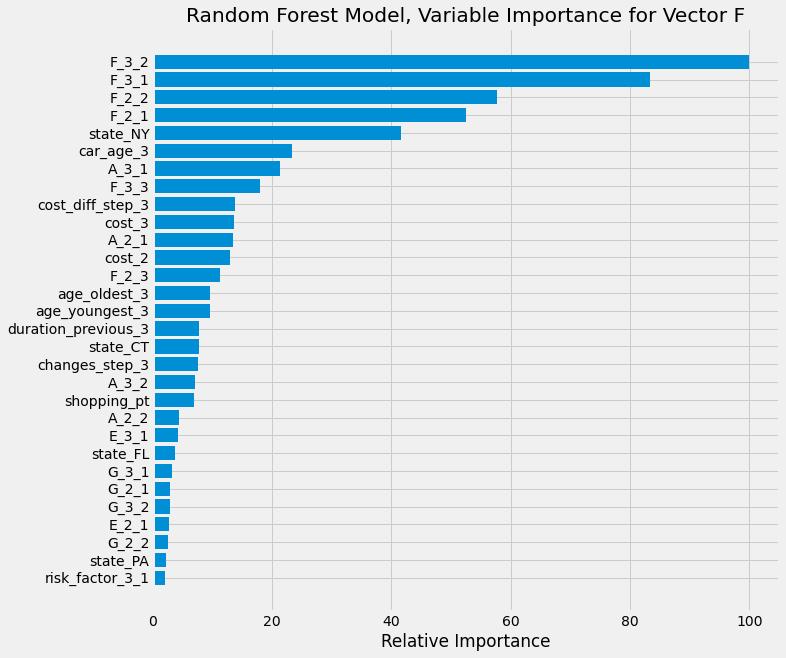

In [108]:
#Let's plot the best model for F using Random Forest Classifier (Iteration 35)

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=800, min_samples_leaf = 1, min_samples_split = 5, plot=True)

In [109]:
vector = 'F'
score_matrix = model_score_matrix(vector, 3, rf_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,1802,44,2.383532
cust_maintained_vector,8,12777,99.937427


XGBoost Classifier results for Vector F
Parameters: No. of Estimators = 200,  max_depth = 1,     learning_rate = 0.3, colsample_bytree = 1
Accuracy=0.8763, f1-score=0.8756
Confusion Matrix - normalized
 [[0.9251 0.0182 0.0526 0.0042]
 [0.0308 0.8382 0.1199 0.0111]
 [0.0335 0.0512 0.8935 0.0217]
 [0.0418 0.0476 0.252  0.6585]]
Confusion Matrix
 [[4382   86  249   20]
 [ 111 3021  432   40]
 [ 182  278 4851  118]
 [  36   41  217  567]]

Classification Report 
               precision    recall  f1-score   support

           0       0.93      0.93      0.93      4737
           1       0.88      0.84      0.86      3604
           2       0.84      0.89      0.87      5429
           3       0.76      0.66      0.71       861

    accuracy                           0.88     14631
   macro avg       0.85      0.83      0.84     14631
weighted avg       0.88      0.88      0.88     14631

30


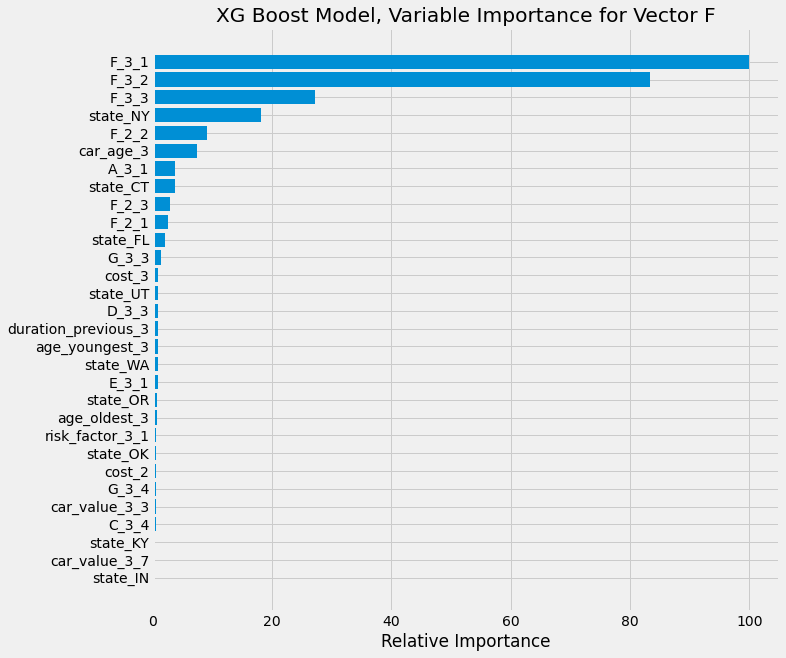

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=5, n_estimators=100;, score=0.880 total time=   7.1s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=5, n_estimators=100;, score=0.878 total time=   8.7s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=5, n_estimators=100;, score=0.878 total time=   9.5s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.25, max_depth=5, n_estimators=100;, score=0.881 total time=   9.3s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=3, n_estimators=400;, score=0.879 total time=  12.7s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=3, n_estimators=400;, score=0.878 total time=  11.8s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=3, n_estimators=400;, score=0.878 total time=  11.7s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=3, n_estimators=400;, score=0.880 total time=  

[CV 2/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=3, n_estimators=300;, score=0.878 total time=   9.8s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=3, n_estimators=300;, score=0.878 total time=   9.4s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=3, n_estimators=300;, score=0.880 total time=   9.0s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=3, n_estimators=500;, score=0.879 total time=  14.7s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=3, n_estimators=500;, score=0.878 total time=  14.4s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=3, n_estimators=500;, score=0.878 total time=  15.5s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=3, n_estimators=500;, score=0.880 total time=  14.6s
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=4, n_estimators=200;, score=0.879 total time=   7.3s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0

[CV 4/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=3, n_estimators=400;, score=0.880 total time=  17.5s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=4, n_estimators=400;, score=0.876 total time=  22.4s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=4, n_estimators=400;, score=0.875 total time=  22.6s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=4, n_estimators=400;, score=0.874 total time=  26.4s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=4, n_estimators=400;, score=0.878 total time=  28.6s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=3, n_estimators=100;, score=0.879 total time=   5.8s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=3, n_estimators=100;, score=0.878 total time=   6.1s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=3, n_estimators=100;, score=0.878 total time=   5.9s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0

[CV 2/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=3, n_estimators=200;, score=0.878 total time=   9.0s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=3, n_estimators=200;, score=0.879 total time=   5.1s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.25, max_depth=3, n_estimators=200;, score=0.880 total time=   8.9s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=5, n_estimators=100;, score=0.879 total time=   7.5s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=5, n_estimators=100;, score=0.878 total time=   9.0s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=5, n_estimators=100;, score=0.878 total time=   5.2s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.25, max_depth=5, n_estimators=100;, score=0.881 total time=   9.0s
[CV 1/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=4, n_estimators=500;, score=0.872 total time=  44.0s
[CV 2/4] END colsample_bytree=0.5, learning_rate=0

In [213]:
#Let's predict F using XG Boost Classifier and use RandomizedSearchCV to find the best XGB classifier Hyperparamters 

vector = 'F'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators=200, max_depth = 1, learning_rate = 0.3, colsample_bytree = 1, plot = True)

results = xgb_randomsearch(vector, 60)

datapath="Modelling_data/quotes_2_3"
filename3 = 'xgboost_results_q2_q3_vector'+vector+'.csv'
save_file(results, filename3, datapath)

In [214]:
# Find scores for the test set
vector = 'F'
for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    max_depth = row['max_depth']
    learning_rate = row['learning_rate']
    colsample_bytree = row['colsample_bytree']
    
    results.loc[i, 'test_score'], results.loc[i, 'f1_score'], xg_probs = xg_predict_plot(vector, n_estimators=int(n_estimators), \
                                                                max_depth = int(max_depth), learning_rate = learning_rate, \
                                                                colsample_bytree = colsample_bytree, plot=False)
    
results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
datapath="Modelling_data/quotes_2_3"
filename4 = 'xgboost_results_q2_q3_vector'+vector+'_final.csv'
save_file(results, filename4, datapath)

XGBoost Classifier results for Vector F
Parameters: No. of Estimators = 100,  max_depth = 5,     learning_rate = 0.25, colsample_bytree = 0.5
Accuracy=0.876, f1-score=0.8754
XGBoost Classifier results for Vector F
Parameters: No. of Estimators = 400,  max_depth = 3,     learning_rate = 0.3, colsample_bytree = 0.15
Accuracy=0.8756, f1-score=0.8749
XGBoost Classifier results for Vector F
Parameters: No. of Estimators = 100,  max_depth = 3,     learning_rate = 0.35, colsample_bytree = 0.35
Accuracy=0.876, f1-score=0.8753
XGBoost Classifier results for Vector F
Parameters: No. of Estimators = 300,  max_depth = 4,     learning_rate = 0.3, colsample_bytree = 0.15
Accuracy=0.8762, f1-score=0.8755
XGBoost Classifier results for Vector F
Parameters: No. of Estimators = 300,  max_depth = 4,     learning_rate = 0.25, colsample_bytree = 0.25
Accuracy=0.8746, f1-score=0.874
XGBoost Classifier results for Vector F
Parameters: No. of Estimators = 500,  max_depth = 4,     learning_rate = 0.25, colsamp

XGBoost Classifier results for Vector F
Parameters: No. of Estimators = 100,  max_depth = 5,     learning_rate = 0.25, colsample_bytree = 0.35
Accuracy=0.8755, f1-score=0.8748
XGBoost Classifier results for Vector F
Parameters: No. of Estimators = 300,  max_depth = 5,     learning_rate = 0.3, colsample_bytree = 0.5
Accuracy=0.874, f1-score=0.8731
XGBoost Classifier results for Vector F
Parameters: No. of Estimators = 400,  max_depth = 5,     learning_rate = 0.35, colsample_bytree = 0.25
Accuracy=0.8727, f1-score=0.872
XGBoost Classifier results for Vector F
Parameters: No. of Estimators = 100,  max_depth = 4,     learning_rate = 0.25, colsample_bytree = 0.35
Accuracy=0.8761, f1-score=0.8754
XGBoost Classifier results for Vector F
Parameters: No. of Estimators = 300,  max_depth = 3,     learning_rate = 0.3, colsample_bytree = 0.5
Accuracy=0.8753, f1-score=0.8746
XGBoost Classifier results for Vector F
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.25, colsamp

In [215]:
results

,n_estimators,max_depth,learning_rate,colsample_bytree,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,100,5,0.25,0.50,0.879086,9,0.876017,0.875352,8.0,0.877551,9.0
1,400,3,0.30,0.15,0.878659,22,0.875607,0.874937,13.0,0.877133,25.0
2,100,3,0.35,0.35,0.879223,5,0.876017,0.875349,8.0,0.877620,7.0
3,300,4,0.30,0.15,0.877907,33,0.876222,0.875503,5.0,0.877064,26.0
4,300,4,0.25,0.25,0.878881,17,0.874650,0.873967,21.0,0.876765,30.0
5,500,4,0.25,0.15,0.878215,30,0.875265,0.874567,17.0,0.876740,31.0
6,200,3,0.35,0.25,0.879189,6,0.876153,0.875497,6.0,0.877671,5.0
7,400,3,0.35,0.25,0.877719,35,0.875060,0.874326,18.0,0.876389,35.0
8,100,5,0.35,0.35,0.878266,29,0.876017,0.875279,8.0,0.877141,24.0
9,100,4,0.30,0.35,0.879154,7,0.875743,0.875093,11.0,0.877449,12.0


XGBoost Classifier results for Vector F
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.25, colsample_bytree = 0.15
Accuracy=0.8766, f1-score=0.8759
Confusion Matrix - normalized
 [[0.9265 0.0182 0.0515 0.0038]
 [0.0297 0.8382 0.121  0.0111]
 [0.0332 0.0514 0.8939 0.0216]
 [0.0418 0.0476 0.2578 0.6527]]
Confusion Matrix
 [[4389   86  244   18]
 [ 107 3021  436   40]
 [ 180  279 4853  117]
 [  36   41  222  562]]

Classification Report 
               precision    recall  f1-score   support

           0       0.93      0.93      0.93      4737
           1       0.88      0.84      0.86      3604
           2       0.84      0.89      0.87      5429
           3       0.76      0.65      0.70       861

    accuracy                           0.88     14631
   macro avg       0.85      0.83      0.84     14631
weighted avg       0.88      0.88      0.88     14631

30


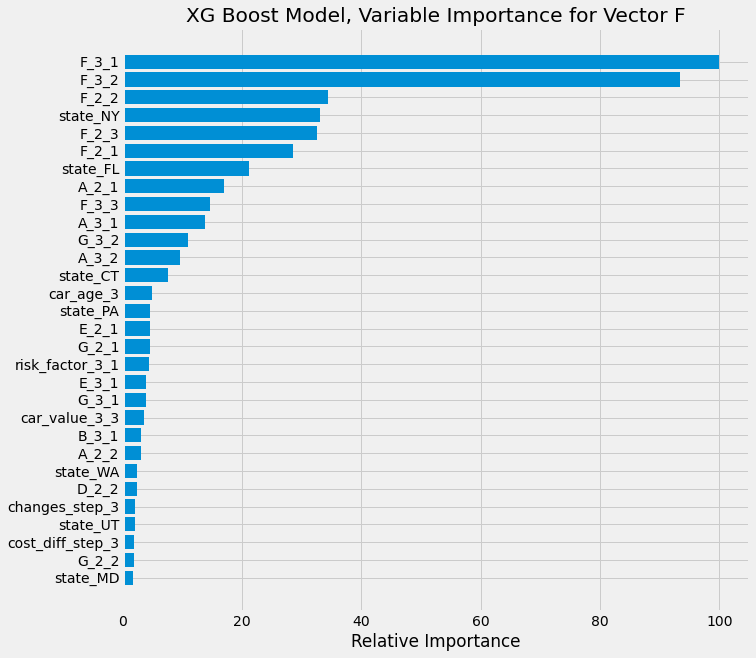

In [106]:
#Let's plot the best model for F using XG Boost Classifier (Iteration 52)
vector = 'F'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators=200, max_depth = 3, learning_rate = 0.25, colsample_bytree = 0.15, plot = True)

In [107]:
vector = 'F'
score_matrix = model_score_matrix(vector, 3, xg_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,1761,85,4.604550
cust_maintained_vector,45,12740,99.648025


# Quotes 2 & 3: Predict G

In [77]:
vector = 'G'
last_quote = 3
test_set = df_hist_2_3.iloc[y_test.index,:]
x = pd.crosstab(test_set[vector], test_set[vector+'_'+str(last_quote)])
same_as_3 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 
print(f"Accuracy based on simply predicting vector {vector} = {vector}_{last_quote} : {(np.sum(same_as_3)/y_test.shape[0]): 4.4}")
print(f"Confusion_Matrix")
x['total'] = x.sum(axis=1)
x['G0_%'] = np.around(x[0]/ x['total'], 4)
x['G1_%'] = np.around(x[1]/ x['total'], 4)
x['G2_%'] = np.around(x[2]/ x['total'], 4)
x['G3_%'] = np.around(x[3]/ x['total'], 4)
x

Accuracy based on simply predicting vector G = G_3 :  0.797
Confusion_Matrix


G_3,0,1,2,3,total,G0_%,G1_%,G2_%,G3_%
G,,,,,,,,,
0,2295,540,83,67,2985,0.7688,0.1809,0.0278,0.0224
1,535,4844,184,119,5682,0.0942,0.8525,0.0324,0.0209
2,211,570,3720,198,4699,0.0449,0.1213,0.7917,0.0421
3,71,162,230,802,1265,0.0561,0.1281,0.1818,0.6340


In [78]:
vector = 'G'
last_quote = 3
test_set2 = df_hist_2_3.iloc[y_train.index,:]
x2 = pd.crosstab(test_set2[vector], test_set2[vector+'_'+str(last_quote)])
same_as_3 = [x2.iloc[idx,idx] for idx in range(x2.shape[0])] 
print(f"TRAINING Accuracy based on simply predicting vector {vector} = {vector}_{last_quote} : {(np.sum(same_as_3)/y_train.shape[0]): 4.4}")
print(f"Confusion_Matrix - TRAINING")
x2['total'] = x2.sum(axis=1)
x2['G0_%'] = np.around(x2[0]/ x2['total'], 4)
x2['G1_%'] = np.around(x2[1]/ x2['total'], 4)
x2['G2_%'] = np.around(x2[2]/ x2['total'], 4)
x2['G3_%'] = np.around(x2[3]/ x2['total'], 4)
x2

TRAINING Accuracy based on simply predicting vector G = G_3 :  0.7972
Confusion_Matrix - TRAINING


G_3,0,1,2,3,total,G0_%,G1_%,G2_%,G3_%
G,,,,,,,,,
0,9352,2280,317,230,12179,0.7679,0.1872,0.0260,0.0189
1,2176,19397,732,562,22867,0.0952,0.8483,0.0320,0.0246
2,832,2181,14681,831,18525,0.0449,0.1177,0.7925,0.0449
3,207,606,912,3225,4950,0.0418,0.1224,0.1842,0.6515


Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8032, f1-score=0.8026
Confusion Matrix - normalized
 [[0.7668 0.1883 0.0295 0.0154]
 [0.092  0.8576 0.0354 0.015 ]
 [0.0445 0.1051 0.8125 0.0379]
 [0.0601 0.1304 0.1992 0.6103]]
Confusion Matrix
 [[2289  562   88   46]
 [ 523 4873  201   85]
 [ 209  494 3818  178]
 [  76  165  252  772]]

Classification Report 
               precision    recall  f1-score   support

           0       0.74      0.77      0.75      2985
           1       0.80      0.86      0.83      5682
           2       0.88      0.81      0.84      4699
           3       0.71      0.61      0.66      1265

    accuracy                           0.80     14631
   macro avg       0.78      0.76      0.77     14631
weighted avg       0.80      0.80      0.80     14631

30


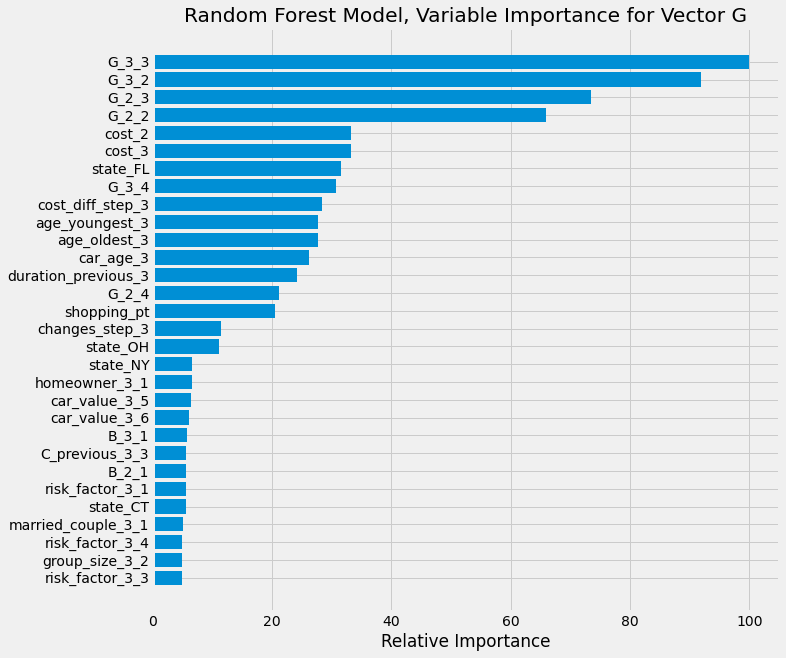

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=500;, score=0.800 total time=  25.1s
[CV 2/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=500;, score=0.806 total time=  19.5s
[CV 3/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=500;, score=0.806 total time=  19.9s
[CV 4/4] END min_samples_leaf=4, min_samples_split=2, n_estimators=500;, score=0.802 total time=  19.6s
[CV 1/4] END min_samples_leaf=2, min_samples_split=4, n_estimators=800;, score=0.800 total time=  32.5s
[CV 2/4] END min_samples_leaf=2, min_samples_split=4, n_estimators=800;, score=0.807 total time=  32.1s
[CV 3/4] END min_samples_leaf=2, min_samples_split=4, n_estimators=800;, score=0.806 total time=  32.5s
[CV 4/4] END min_samples_leaf=2, min_samples_split=4, n_estimators=800;, score=0.802 total time=  32.2s
[CV 1/4] END min_samples_leaf=4, min_samples_split=4, n_estimators=800;, score=0.799 total time=  33.7s
[C

[CV 4/4] END min_samples_leaf=2, min_samples_split=2, n_estimators=700;, score=0.802 total time=  28.1s
[CV 1/4] END min_samples_leaf=3, min_samples_split=5, n_estimators=100;, score=0.799 total time=   3.6s
[CV 2/4] END min_samples_leaf=3, min_samples_split=5, n_estimators=100;, score=0.806 total time=   3.5s
[CV 3/4] END min_samples_leaf=3, min_samples_split=5, n_estimators=100;, score=0.806 total time=   3.8s
[CV 4/4] END min_samples_leaf=3, min_samples_split=5, n_estimators=100;, score=0.802 total time=   3.5s
[CV 1/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=500;, score=0.800 total time=  16.4s
[CV 2/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=500;, score=0.806 total time=  16.9s
[CV 3/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=500;, score=0.806 total time=  18.1s
[CV 4/4] END min_samples_leaf=4, min_samples_split=5, n_estimators=500;, score=0.802 total time=  16.3s
[CV 1/4] END min_samples_leaf=3, min_samples_split=4, n_estimato

[CV 3/4] END min_samples_leaf=3, min_samples_split=4, n_estimators=600;, score=0.806 total time=  21.0s
[CV 4/4] END min_samples_leaf=3, min_samples_split=4, n_estimators=600;, score=0.802 total time=  21.5s
[CV 1/4] END min_samples_leaf=3, min_samples_split=4, n_estimators=500;, score=0.799 total time=  18.0s
[CV 2/4] END min_samples_leaf=3, min_samples_split=4, n_estimators=500;, score=0.807 total time=  17.8s
[CV 3/4] END min_samples_leaf=3, min_samples_split=4, n_estimators=500;, score=0.806 total time=  18.2s
[CV 4/4] END min_samples_leaf=3, min_samples_split=4, n_estimators=500;, score=0.802 total time=  18.3s
[CV 1/4] END min_samples_leaf=4, min_samples_split=4, n_estimators=600;, score=0.799 total time=  20.8s
[CV 2/4] END min_samples_leaf=4, min_samples_split=4, n_estimators=600;, score=0.806 total time=  21.7s
[CV 3/4] END min_samples_leaf=4, min_samples_split=4, n_estimators=600;, score=0.806 total time=  21.3s
[CV 4/4] END min_samples_leaf=4, min_samples_split=4, n_estimato

[CV 2/4] END min_samples_leaf=2, min_samples_split=3, n_estimators=100;, score=0.806 total time=   3.9s
[CV 3/4] END min_samples_leaf=2, min_samples_split=3, n_estimators=100;, score=0.807 total time=   4.2s
[CV 4/4] END min_samples_leaf=2, min_samples_split=3, n_estimators=100;, score=0.802 total time=   4.1s
Vector G RandomizedSearchCV: Random Forest Model
Best Score:0.8039678763333296
Best Parameters: {'n_estimators': 500, 'min_samples_split': 5, 'min_samples_leaf': 1}
Writing file.  "Modelling_data/quotes_2_3\rf_results_q2_q3_vectorG.csv"


In [217]:
# RF Classifier: Predict G using quotes 2 and 3 and then RandomizedSearchCV to find best hyperparameters

vector = 'G'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=300, min_samples_leaf = 1, min_samples_split = 2, plot=True)

results = rf_randomsearch(vector, 60)

datapath="Modelling_data/quotes_2_3"
filename1 = 'rf_results_q2_q3_vector'+vector+'.csv'
save_file(results, filename1, datapath)

In [222]:
# Get scores for test set
vector = 'G'

for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    min_samples_leaf = row['min_samples_leaf']
    min_samples_split = row['min_samples_split']
    
    results.loc[i, 'test_score'], results.loc[i, 'f1_score'], rf_probs = rf_predict_plot(vector, n_estimators=int(n_estimators), \
                                                                min_samples_leaf = int(min_samples_leaf), \
                                                                min_samples_split = int(min_samples_split), plot=False)
    
results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
datapath="Modelling_data/quotes_2_3"
filename2 = 'rf_results_q2_q3_vector'+vector+'_final.csv'
save_file(results, filename2, datapath)

Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 500,  min_samples_leaf = 4,     min_samples_split = 2
Accuracy=0.8033, f1-score=0.8027
Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 800,  min_samples_leaf = 2,     min_samples_split = 4
Accuracy=0.8037, f1-score=0.8031
Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 800,  min_samples_leaf = 4,     min_samples_split = 4
Accuracy=0.8034, f1-score=0.8029
Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 800,  min_samples_leaf = 4,     min_samples_split = 5
Accuracy=0.8034, f1-score=0.8029
Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 500,  min_samples_leaf = 4,     min_samples_split = 3
Accuracy=0.8033, f1-score=0.8027
Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 400,  min_samples_leaf = 2,     min_samples_split = 3
Accuracy=0.8039, f1-score=0.8033
Random For

Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 400,  min_samples_leaf = 2,     min_samples_split = 2
Accuracy=0.8039, f1-score=0.8033
Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 800,  min_samples_leaf = 2,     min_samples_split = 5
Accuracy=0.8034, f1-score=0.8028
Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 600,  min_samples_leaf = 1,     min_samples_split = 5
Accuracy=0.8036, f1-score=0.803
Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 300,  min_samples_leaf = 2,     min_samples_split = 5
Accuracy=0.8029, f1-score=0.8023
Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 800,  min_samples_leaf = 3,     min_samples_split = 2
Accuracy=0.8035, f1-score=0.8029
Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 400,  min_samples_leaf = 1,     min_samples_split = 5
Accuracy=0.8028, f1-score=0.8022
Random Fore

In [12]:
results = pd.read_csv("Modelling_data/quotes_2_3/rf_results_q2_q3_vectorG_final.csv")
results

,n_estimators,min_samples_split,min_samples_leaf,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,500,2,4,0.803216,56,0.803294,0.802746,8.0,0.803255,31.0
1,800,4,2,0.803677,12,0.803704,0.803103,2.0,0.803691,3.0
2,800,4,4,0.803507,25,0.803363,0.802856,7.0,0.803435,16.0
3,800,5,4,0.803507,25,0.803363,0.802856,7.0,0.803435,16.0
4,500,3,4,0.803216,56,0.803294,0.802746,8.0,0.803255,31.0
5,400,3,2,0.803421,36,0.803910,0.803337,1.0,0.803665,7.0
6,200,2,4,0.803267,45,0.802953,0.802397,13.0,0.803110,35.0
7,800,3,1,0.803472,31,0.803363,0.802780,7.0,0.803418,18.0
8,300,2,1,0.803882,3,0.803226,0.802626,9.0,0.803554,11.0
9,200,4,1,0.803848,5,0.803499,0.802899,5.0,0.803674,5.0


Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 600,  min_samples_leaf = 1,     min_samples_split = 5
Accuracy=0.8036, f1-score=0.803
Confusion Matrix - normalized
 [[0.7658 0.1896 0.0291 0.0154]
 [0.0924 0.8581 0.0347 0.0148]
 [0.0447 0.1056 0.8132 0.0366]
 [0.0569 0.1336 0.1976 0.6119]]
Confusion Matrix
 [[2286  566   87   46]
 [ 525 4876  197   84]
 [ 210  496 3821  172]
 [  72  169  250  774]]

Classification Report 
               precision    recall  f1-score   support

           0       0.74      0.77      0.75      2985
           1       0.80      0.86      0.83      5682
           2       0.88      0.81      0.84      4699
           3       0.72      0.61      0.66      1265

    accuracy                           0.80     14631
   macro avg       0.78      0.76      0.77     14631
weighted avg       0.80      0.80      0.80     14631

30


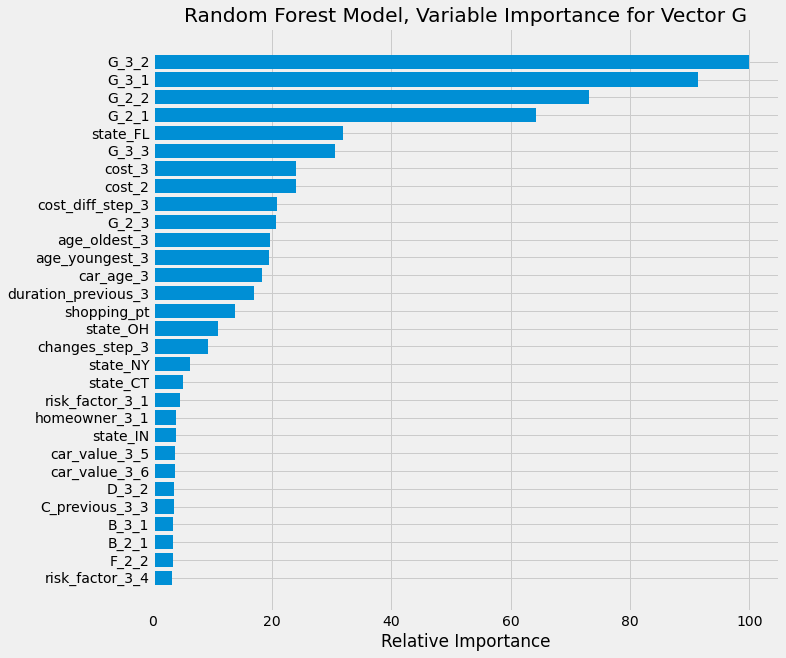

In [84]:
#Let's plot the best model for G using Random Forest Classifier (Iteration 52)

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=600, min_samples_leaf = 1, min_samples_split = 5, plot=True)

In [90]:
vector = 'G'
score_matrix = model_score_matrix(vector, 3, rf_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2790,180,6.060606
cust_maintained_vector,84,11577,99.279650


XGBoost Classifier results for Vector G
Parameters: No. of Estimators = 200,  max_depth = 1,     learning_rate = 0.3, colsample_bytree = 1
Accuracy=0.8025, f1-score=0.802
Confusion Matrix - normalized
 [[0.7665 0.1876 0.0278 0.0181]
 [0.0926 0.8574 0.034  0.016 ]
 [0.0451 0.1068 0.8097 0.0383]
 [0.0577 0.132  0.1968 0.6134]]
Confusion Matrix
 [[2288  560   83   54]
 [ 526 4872  193   91]
 [ 212  502 3805  180]
 [  73  167  249  776]]

Classification Report 
               precision    recall  f1-score   support

           0       0.74      0.77      0.75      2985
           1       0.80      0.86      0.83      5682
           2       0.88      0.81      0.84      4699
           3       0.70      0.61      0.66      1265

    accuracy                           0.80     14631
   macro avg       0.78      0.76      0.77     14631
weighted avg       0.80      0.80      0.80     14631

30


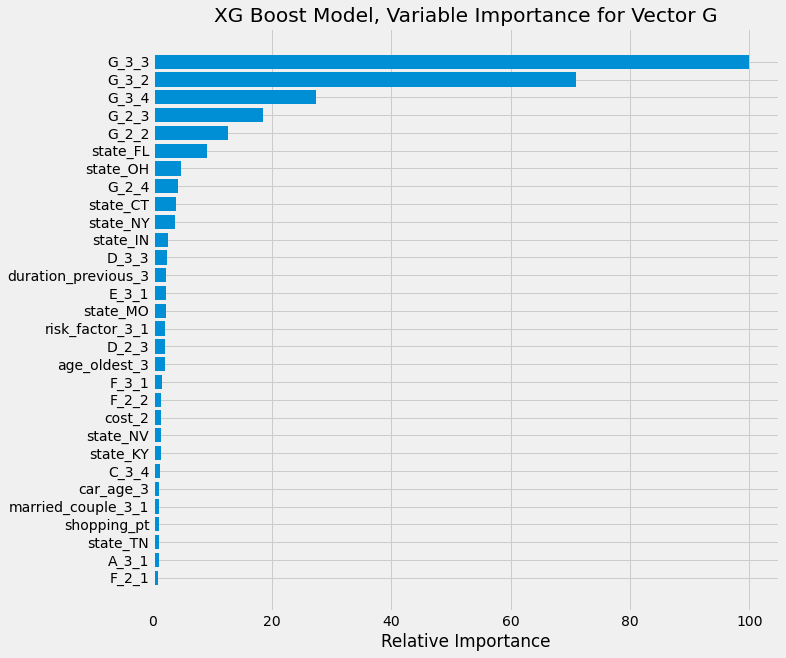

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV 1/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=4, n_estimators=200;, score=0.798 total time=   7.9s
[CV 2/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=4, n_estimators=200;, score=0.806 total time=  11.1s
[CV 3/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=4, n_estimators=200;, score=0.804 total time=   6.8s
[CV 4/4] END colsample_bytree=0.15, learning_rate=0.3, max_depth=4, n_estimators=200;, score=0.801 total time=  10.2s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=3, n_estimators=500;, score=0.794 total time=  27.8s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=3, n_estimators=500;, score=0.804 total time=  25.3s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=3, n_estimators=500;, score=0.800 total time=  25.7s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.5, max_depth=3, n_estimators=500;, score=0.798 total time=  

[CV 2/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=4, n_estimators=100;, score=0.808 total time=   8.8s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=4, n_estimators=100;, score=0.804 total time=  10.9s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.5, max_depth=4, n_estimators=100;, score=0.801 total time=   9.7s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.3, max_depth=4, n_estimators=300;, score=0.797 total time=  18.1s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.3, max_depth=4, n_estimators=300;, score=0.807 total time=  20.9s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.3, max_depth=4, n_estimators=300;, score=0.803 total time=  20.8s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.3, max_depth=4, n_estimators=300;, score=0.801 total time=  20.8s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=4, n_estimators=300;, score=0.797 total time=  17.7s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.35, ma

[CV 4/4] END colsample_bytree=0.15, learning_rate=0.35, max_depth=5, n_estimators=200;, score=0.800 total time=   9.4s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=5, n_estimators=300;, score=0.794 total time=  21.2s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=5, n_estimators=300;, score=0.806 total time=  19.9s
[CV 3/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=5, n_estimators=300;, score=0.802 total time=  21.1s
[CV 4/4] END colsample_bytree=0.25, learning_rate=0.35, max_depth=5, n_estimators=300;, score=0.798 total time=  18.3s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=5, n_estimators=100;, score=0.799 total time=  10.8s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=5, n_estimators=100;, score=0.808 total time=   7.6s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.35, max_depth=5, n_estimators=100;, score=0.804 total time=   7.6s
[CV 4/4] END colsample_bytree=0.35, learning_rat

[CV 2/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=4, n_estimators=400;, score=0.804 total time=  31.7s
[CV 3/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=4, n_estimators=400;, score=0.798 total time=  32.8s
[CV 4/4] END colsample_bytree=0.5, learning_rate=0.35, max_depth=4, n_estimators=400;, score=0.797 total time=  31.7s
[CV 1/4] END colsample_bytree=0.35, learning_rate=0.3, max_depth=3, n_estimators=100;, score=0.800 total time=   4.5s
[CV 2/4] END colsample_bytree=0.35, learning_rate=0.3, max_depth=3, n_estimators=100;, score=0.808 total time=   5.8s
[CV 3/4] END colsample_bytree=0.35, learning_rate=0.3, max_depth=3, n_estimators=100;, score=0.805 total time=   7.5s
[CV 4/4] END colsample_bytree=0.35, learning_rate=0.3, max_depth=3, n_estimators=100;, score=0.801 total time=   6.4s
[CV 1/4] END colsample_bytree=0.25, learning_rate=0.3, max_depth=5, n_estimators=500;, score=0.792 total time=  38.6s
[CV 2/4] END colsample_bytree=0.25, learning_rate=0.3, m

In [13]:
#Let's predict G using XG Boost Classifier and use RandomizedSearchCV to find the best XGB classifier Hyperparamters 

vector = 'G'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators=200, max_depth = 1, learning_rate = 0.3, colsample_bytree = 1, plot = True)

results = xgb_randomsearch(vector, 60)

datapath="Modelling_data/quotes_2_3"
filename3 = 'xgboost_results_q2_q3_vector'+vector+'.csv'
save_file(results, filename3, datapath)

In [15]:
# Find scores for the test set
vector = 'G'
for i, row in results.iterrows():
    n_estimators = row['n_estimators']
    max_depth = row['max_depth']
    learning_rate = row['learning_rate']
    colsample_bytree = row['colsample_bytree']
    
    results.loc[i, 'test_score'], results.loc[i, 'f1_score'], xg_probs = xg_predict_plot(vector, n_estimators=int(n_estimators), \
                                                                max_depth = int(max_depth), learning_rate = learning_rate, \
                                                                colsample_bytree = colsample_bytree, plot=False)
    
results['test_rank']= results['test_score'].rank(method='dense', ascending=False)
results['tr_te_avg_score'] = (results['test_score']+results['train_score'])/2
results['overall_rank']= results['tr_te_avg_score'].rank(method='dense', ascending=False)
datapath="Modelling_data/quotes_2_3"
filename4 = 'xgboost_results_q2_q3_vector'+vector+'_final.csv'
save_file(results, filename4, datapath)

XGBoost Classifier results for Vector G
Parameters: No. of Estimators = 200,  max_depth = 4,     learning_rate = 0.3, colsample_bytree = 0.15
Accuracy=0.8025, f1-score=0.8015
XGBoost Classifier results for Vector G
Parameters: No. of Estimators = 500,  max_depth = 3,     learning_rate = 0.5, colsample_bytree = 0.35
Accuracy=0.8004, f1-score=0.7991
XGBoost Classifier results for Vector G
Parameters: No. of Estimators = 100,  max_depth = 3,     learning_rate = 0.35, colsample_bytree = 0.15
Accuracy=0.8037, f1-score=0.8031
XGBoost Classifier results for Vector G
Parameters: No. of Estimators = 300,  max_depth = 3,     learning_rate = 0.3, colsample_bytree = 0.35
Accuracy=0.8036, f1-score=0.8026
XGBoost Classifier results for Vector G
Parameters: No. of Estimators = 400,  max_depth = 5,     learning_rate = 0.25, colsample_bytree = 0.35
Accuracy=0.801, f1-score=0.7995
XGBoost Classifier results for Vector G
Parameters: No. of Estimators = 400,  max_depth = 3,     learning_rate = 0.3, colsam

XGBoost Classifier results for Vector G
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.5, colsample_bytree = 0.5
Accuracy=0.8027, f1-score=0.8018
XGBoost Classifier results for Vector G
Parameters: No. of Estimators = 300,  max_depth = 3,     learning_rate = 0.5, colsample_bytree = 0.5
Accuracy=0.8018, f1-score=0.8007
XGBoost Classifier results for Vector G
Parameters: No. of Estimators = 500,  max_depth = 5,     learning_rate = 0.5, colsample_bytree = 0.35
Accuracy=0.7881, f1-score=0.7864
XGBoost Classifier results for Vector G
Parameters: No. of Estimators = 300,  max_depth = 3,     learning_rate = 0.5, colsample_bytree = 0.15
Accuracy=0.8012, f1-score=0.8001
XGBoost Classifier results for Vector G
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.35, colsample_bytree = 0.35
Accuracy=0.805, f1-score=0.8041
XGBoost Classifier results for Vector G
Parameters: No. of Estimators = 400,  max_depth = 4,     learning_rate = 0.35, colsampl

In [16]:
results

,n_estimators,max_depth,learning_rate,colsample_bytree,train_score,train_rank,test_score,f1_score,test_rank,tr_te_avg_score,overall_rank
0,200,4,0.30,0.15,0.802447,22,0.802474,0.801498,18.0,0.802461,23.0
1,500,3,0.50,0.35,0.798842,46,0.800355,0.799099,32.0,0.799598,46.0
2,100,3,0.35,0.15,0.803011,13,0.803704,0.803053,8.0,0.803358,9.0
3,300,3,0.30,0.35,0.803438,6,0.803568,0.802633,9.0,0.803503,7.0
4,400,5,0.25,0.35,0.800294,39,0.800971,0.799535,29.0,0.800632,39.0
5,400,3,0.30,0.35,0.802994,14,0.803294,0.802330,11.0,0.803144,11.0
6,100,4,0.25,0.15,0.802806,18,0.802748,0.801918,15.0,0.802777,18.0
7,100,5,0.25,0.25,0.803677,4,0.804046,0.803131,4.0,0.803862,4.0
8,100,5,0.25,0.15,0.802857,17,0.803158,0.802301,12.0,0.803007,16.0
9,500,5,0.50,0.15,0.790879,59,0.790445,0.788641,47.0,0.790662,59.0


XGBoost Classifier results for Vector G
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.35, colsample_bytree = 0.35
Accuracy=0.805, f1-score=0.8041
Confusion Matrix - normalized
 [[0.7745 0.1806 0.0288 0.0161]
 [0.0919 0.8599 0.035  0.0132]
 [0.0449 0.106  0.8146 0.0345]
 [0.0585 0.1431 0.204  0.5945]]
Confusion Matrix
 [[2312  539   86   48]
 [ 522 4886  199   75]
 [ 211  498 3828  162]
 [  74  181  258  752]]

Classification Report 
               precision    recall  f1-score   support

           0       0.74      0.77      0.76      2985
           1       0.80      0.86      0.83      5682
           2       0.88      0.81      0.84      4699
           3       0.73      0.59      0.65      1265

    accuracy                           0.81     14631
   macro avg       0.79      0.76      0.77     14631
weighted avg       0.81      0.81      0.80     14631

30


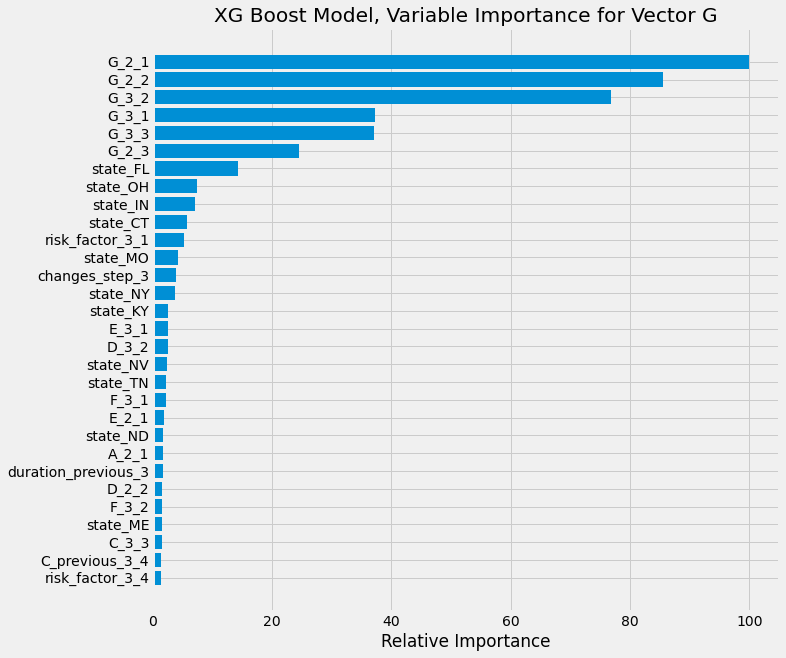

In [101]:
#Let's plot the best model for G using XG Boost Classifier (two very close models - Iteration: 51, 24)

# Iteration 51
vector = 'G'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators=200, max_depth = 3, learning_rate = 0.35, colsample_bytree = 0.35, plot = True)

In [102]:
vector = 'G'
score_matrix = model_score_matrix(vector, 3, xg_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2727,243,8.181818
cust_maintained_vector,126,11535,98.919475


XGBoost Classifier results for Vector G
Parameters: No. of Estimators = 100,  max_depth = 4,     learning_rate = 0.25, colsample_bytree = 0.35
Accuracy=0.8043, f1-score=0.8035
Confusion Matrix - normalized
 [[0.7709 0.1843 0.0291 0.0157]
 [0.0935 0.858  0.0348 0.0137]
 [0.0451 0.1045 0.8161 0.0343]
 [0.0609 0.1352 0.2055 0.5984]]
Confusion Matrix
 [[2301  550   87   47]
 [ 531 4875  198   78]
 [ 212  491 3835  161]
 [  77  171  260  757]]

Classification Report 
               precision    recall  f1-score   support

           0       0.74      0.77      0.75      2985
           1       0.80      0.86      0.83      5682
           2       0.88      0.82      0.84      4699
           3       0.73      0.60      0.66      1265

    accuracy                           0.80     14631
   macro avg       0.78      0.76      0.77     14631
weighted avg       0.81      0.80      0.80     14631

30


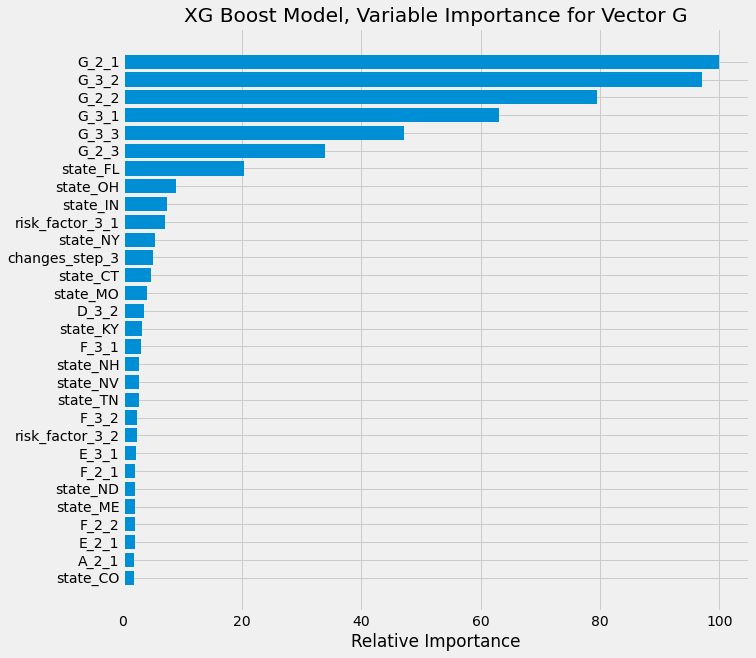

In [103]:
# Iteration 24
vector = 'G'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators=100, max_depth = 4, learning_rate = 0.25, colsample_bytree = 0.35, plot = True)



In [105]:
vector = 'G'
score_matrix = model_score_matrix(vector, 3, xg_preds)
score_matrix

C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_29460/2159327062.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)


,Pred_incorrect,Pred_correct,Pred_accuracy_%
cust_changed_vector,2754,216,7.272727
cust_maintained_vector,109,11552,99.065260


In [66]:
modelling_summary_2_3 = pd.DataFrame({'vector' : ['A', 'B', 'C', 'D', 'E', 'F', 'G'], \
                                 'vector_options': [3,2,4,3,2,4,4], \
                                 'accuracy_if_vector=quote3' : [0.8788,0.8842,0.8749,0.906,0.8911,0.8738,0.797],\
                                 'best_model_score': [0.8831,0.8844,0.8771,0.9088,0.8919,0.8766,0.8043], \
                                 'improvement_%': [0.43,0.02,0.22,0.28,0.08,0.28, 0.73], \
                                 'best_model' : ['xg', 'rf', 'rf', 'xg', 'rf', 'xg', 'xg'], \
                                 'score_XG Boost' : [0.8831,0.8843,0.8759,0.9088,0.8915,0.8766,0.8043], \
                                 'score_random_forest' : [0.8826,0.8844,0.8771,0.9084,0.8919,0.8763,0.8036], \
                                 'score_Logistic_Regression' : [0,0.8843,0,0,0.8913,0,0] \
                                })

# Summary: Predicting with Quotes 2 and 3

Models were developed for each of the 7 vectors based on Quotes 2 and 3. The classifier used for modelling were:

1) Random Forest

2) XG Boost

3) Logistic Regression for binary vectors (B and E)

After creating a base set of models, hyperparameters tuning was done with 60 iterations of RandomizedSearchCV. This creates a 95% chance that the accuracy score achieved is within 5% of the best score. The best model was chosen as the most consistent performer across the training and test sets, mostly that one that has the best score average across training and test sets.

The model performance metrics used was primarily **micro_accuracy_score** as our objective was to predict the correct vector selections across all possible vector classes. In addition for binary vectors, the **ROC_AUC** metrics was studied and thresholding was done to find the best threshold that improved model metrics.

The below table summarizes the model performances across all the vectors:

In [67]:
modelling_summary_2_3.set_index('vector', inplace=True)
modelling_summary_2_3

,vector_options,accuracy_if_vector=quote3,best_model_score,improvement_%,best_model,score_XG Boost,score_random_forest,score_Logistic_Regression
vector,,,,,,,,
A,3,0.8788,0.8831,0.43,xg,0.8831,0.8826,0.0000
B,2,0.8842,0.8844,0.02,rf,0.8843,0.8844,0.8843
C,4,0.8749,0.8771,0.22,rf,0.8759,0.8771,0.0000
D,3,0.9060,0.9088,0.28,xg,0.9088,0.9084,0.0000
E,2,0.8911,0.8919,0.08,rf,0.8915,0.8919,0.8913
F,4,0.8738,0.8766,0.28,xg,0.8766,0.8763,0.0000
G,4,0.7970,0.8043,0.73,xg,0.8043,0.8036,0.0000


In [68]:
modelling_summary_2_3['improvement_%'].mean()

0.2914285714285714

**Key Observations**
1) The task of 'improving' prediction over vector information available at quote 3 is harder. This is since 88-90% of the customers have already made up their mind and therefore the base of customers about whom prediction has to work gets narrower.

2) The mean improvement over the NO MODEL (final vector = quote 3) is **0.29%** only. For vector B, a binary vector, there was practically no gain in prediction over B_3 (vector B choice at quote 3). Comparatively, the mean improvement at quote_2 was **1.77%**.



# Predictions on the Test Set

Having built and tested the models on the validation set, we now take the best models for each vector and use them to predict the customer's choices in the Test set.

Recall that the test set was split from the training data provided by All state right in the beginning. The test data has been pre-processed the same way as the training set. The pre-process scaler from the training data set was used to scale the numeric features of the test dataset.


In [178]:
# Load the feature and target columns of test data in X_test and y_test

X_test = pd.read_csv('Test_data/pre_processed_test_data_with_quotes_1_2.csv') 
y_test = pd.read_csv('Test_data/test_data_target_columns.csv')

X_test.shape, y_test.shape

((19402, 94), (19402, 7))

In [13]:
# Create a Dataframe that captures the Quote 2 vectors for the test set and shopping point of respective customers
# This would be used to score the model performance for customer who change vectors and customers who don't change vectors
# Shopping point info would be used to find how well the model does for closer and further off shopping points 

df_test_first2 = pd.read_csv('Test_data/test_data_first2_quotes_CDG_remapped.csv')
df_test_first2.head()

,customer_ID,shopping_pt,state,A,B,C,D,E,F,G,...,D_1,D_2,E_1,E_2,F_1,F_2,G_1,G_2,cost_1,cost_2
0,10129104,5,FL,1,1,2,2,0,1,2,...,2,2,0,0,1,1,2,2,606,606
1,10095371,7,WV,2,0,0,0,0,2,0,...,0,1,0,0,0,2,3,0,596,675
2,10032679,8,MO,2,1,2,2,1,2,2,...,2,2,1,1,1,2,2,2,614,617
3,10025603,5,NY,0,1,3,2,1,0,1,...,2,2,1,1,0,0,1,1,599,590
4,10122799,8,NY,2,1,2,2,1,0,1,...,2,2,1,1,0,0,3,1,724,717


In [179]:

y_test_compare = y_test.merge(df_test_first2[['shopping_pt','A_2','B_2','C_2','D_2','E_2','F_2','G_2']], left_index=True, right_index=True)

product_vectors = ['A', 'B','C','D','E','F','G']
for vect in product_vectors:
    y_test_compare[vect+'=2'] = np.where(y_test_compare[vect] == y_test_compare[vect+'_2'], 1,0)


y_test_compare.head()

,A,B,C,D,E,F,G,shopping_pt,A_2,B_2,...,E_2,F_2,G_2,A=2,B=2,C=2,D=2,E=2,F=2,G=2
0,1,1,2,2,0,1,2,5,1,1,...,0,1,2,1,1,1,1,1,1,1
1,2,0,0,0,0,2,0,7,2,0,...,0,2,0,1,1,0,0,1,1,1
2,2,1,2,2,1,2,2,8,2,1,...,1,2,2,1,1,1,1,1,1,1
3,0,1,3,2,1,0,1,5,0,1,...,1,0,1,1,1,1,1,1,1,1
4,2,1,2,2,1,0,1,8,2,1,...,1,0,1,1,1,1,1,1,1,1


In [34]:
#Instantiate the object to store performance record for test dataset

perf_record_testdata = ModelPerformanceRecord()
perf_record_testdata.initialize(product_vectors,2)


## Test Set: Predict Vector A

Gradient Boosting Classifier results for Vector A
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.4, max_features = 10
Accuracy=0.8409, f1-score=0.8355
Confusion Matrix - normalized
 [[0.794  0.1785 0.0274]
 [0.0402 0.9286 0.0312]
 [0.0511 0.3715 0.5774]]
Confusion Matrix
 [[ 3389   762   117]
 [  479 11072   372]
 [  164  1193  1854]]

Classification Report 
               precision    recall  f1-score   support

           0       0.84      0.79      0.82      4268
           1       0.85      0.93      0.89     11923
           2       0.79      0.58      0.67      3211

    accuracy                           0.84     19402
   macro avg       0.83      0.77      0.79     19402
weighted avg       0.84      0.84      0.84     19402

20


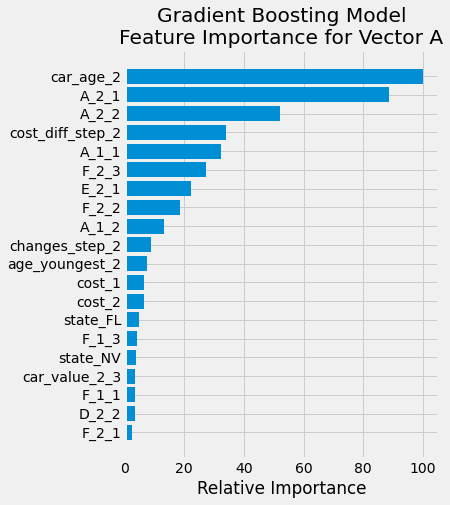

In [33]:
# BEST MODEL for A was with Gradient Boost Classifier

vector = 'A'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, learning_rate = 0.4, max_depth = 3, \
                                         max_features = 10, plot=True)


In [23]:
vector = 'A'

x = pd.crosstab(y_test_compare[vector], y_test_compare[vector+"_2"], )
same_as_2 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 
acc = np.around(np.sum(same_as_2)/y_test_compare.shape[0], 4)
print(f"Accuracy based on simply predicting vector {vector} = {vector}_2 : {(np.sum(same_as_2)/y_test_compare.shape[0]): 4.4}")
x['total'] = x.sum(axis=1)
x['A0_%'] = np.around(x[0]*100 / x['total'], 2)
x['A1_%'] = np.around(x[1]*100 / x['total'], 2)
x['A2_%'] = np.around(x[2]*100 / x['total'], 2)
x

Accuracy based on simply predicting vector A = A_2 :  0.8191


A_2,0,1,2,total,A0_%,A1_%,A2_%
A,,,,,,,
0,3264,856,148,4268,76.48,20.06,3.47
1,769,10785,369,11923,6.45,90.46,3.09
2,258,1110,1843,3211,8.03,34.57,57.40


In [46]:
vector = 'A'

model = 'gb'

score_cust_type = model_score_matrix(vector, 2, gb_preds)
score_shp_pt = model_score_by_shopping_pt(vector, 2, gb_preds)

perf_record_testdata.update(vector, 'no_model', 'overall', acc*100)
perf_record_testdata.update(vector, model, 'overall', round(gb_ac*100,2))
perf_record_testdata.update(vector, model, 'customer_type', score_cust_type)
perf_record_testdata.update(vector, model, 'shopping_pt', score_shp_pt)
perf_record_testdata.compare(vector, model)



C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from

XGBoost Classifier results for Vector A
Parameters: No. of Estimators = 300,  max_depth = 3,     learning_rate = 0.3, colsample_bytree = 0.5
Accuracy=0.8423, f1-score=0.837
Confusion Matrix - normalized
 [[0.799  0.1717 0.0293]
 [0.0396 0.9288 0.0316]
 [0.0492 0.3722 0.5786]]
Confusion Matrix
 [[ 3410   733   125]
 [  472 11074   377]
 [  158  1195  1858]]

Classification Report 
               precision    recall  f1-score   support

           0       0.84      0.80      0.82      4268
           1       0.85      0.93      0.89     11923
           2       0.79      0.58      0.67      3211

    accuracy                           0.84     19402
   macro avg       0.83      0.77      0.79     19402
weighted avg       0.84      0.84      0.84     19402

20


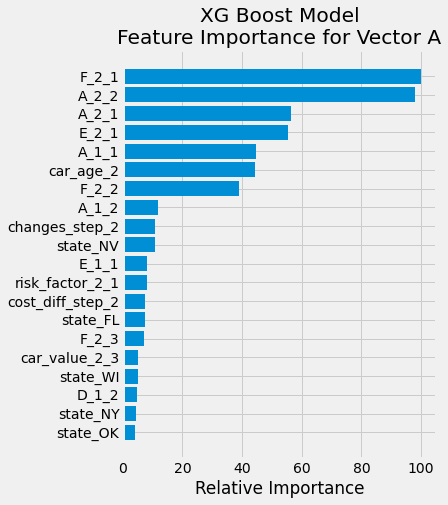

In [38]:
# model A with BEST XGBoost classifier
# Parameters: No. of Estimators = 300,  max_depth = 3, learning_rate = 0.3, colsample_bytree = 0.5 (0.848, .8434)

vector = 'A'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators = 300, max_depth = 3, \
                                         learning_rate = 0.3, colsample_bytree = 0.5, plot=True)

In [47]:
vector = 'A'
model = 'xg'

score_cust_type = model_score_matrix(vector, 2, xg_preds)
score_shp_pt = model_score_by_shopping_pt(vector, 2, xg_preds)

perf_record_testdata.update(vector, 'no_model', 'overall', acc*100)
perf_record_testdata.update(vector, model, 'overall', round(xg_ac*100,2))
perf_record_testdata.update(vector, model, 'customer_type', score_cust_type)
perf_record_testdata.update(vector, model, 'shopping_pt', score_shp_pt)
perf_record_testdata.compare(vector, model)


C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from

Random Forest Classifier results for Vector A
Parameters: No. of Estimators = 800,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8417, f1-score=0.836
Confusion Matrix - normalized
 [[0.7828 0.187  0.0302]
 [0.035  0.935  0.03  ]
 [0.0445 0.3818 0.5737]]
Confusion Matrix
 [[ 3341   798   129]
 [  417 11148   358]
 [  143  1226  1842]]

Classification Report 
               precision    recall  f1-score   support

           0       0.86      0.78      0.82      4268
           1       0.85      0.93      0.89     11923
           2       0.79      0.57      0.66      3211

    accuracy                           0.84     19402
   macro avg       0.83      0.76      0.79     19402
weighted avg       0.84      0.84      0.84     19402

20


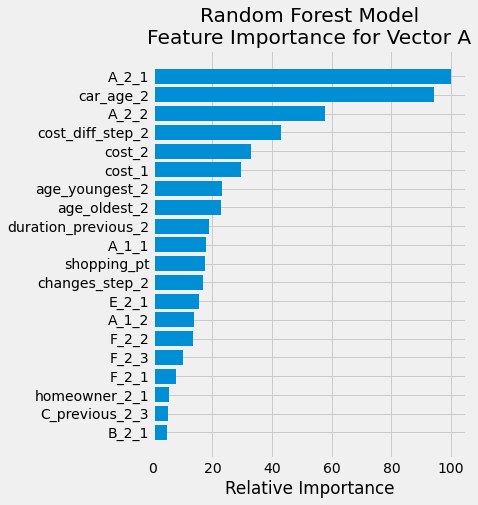

In [40]:
# Run the Random Forest model with Best Parameters: {'n_estimators': 800}


vector = 'A'
rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators= 800, plot=True)


In [48]:
vector = 'A'
model = 'rf'

score_cust_type = model_score_matrix(vector, 2, rf_preds)
score_shp_pt = model_score_by_shopping_pt(vector, 2, rf_preds)

perf_record_testdata.update(vector, 'no_model', 'overall', acc*100)
perf_record_testdata.update(vector, model, 'overall', round(rf_ac*100,2))
perf_record_testdata.update(vector, model, 'customer_type', score_cust_type)
perf_record_testdata.update(vector, model, 'shopping_pt', score_shp_pt)
perf_record_testdata.compare(vector, model)

perf_record_testdata.record[vector]

C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from

,no_model,gb,gb_vs_no_model,xg,xg_vs_no_model,rf,rf_vs_no_model
accuracy_overall,81.91,84.09,2.18,84.23,2.32,84.17,2.26
accuracy_cust_changed_vector,0,21.48,21.48,21.11,21.11,17.01,17.01
accuracy_cust_maintained_vector,100,97.92,-2.08,98.17,-1.83,99.01,-0.99
accuracy_shopping_pt_3,87.33,87.60,0.27,88.14,0.81,87.96,0.63
accuracy_shopping_pt_4,86.0,87.00,1.0,87.31,1.31,87.38,1.38
accuracy_shopping_pt_5,84.92,86.25,1.33,85.89,0.97,86.20,1.28
accuracy_shopping_pt_6,83.14,84.80,1.66,85.02,1.88,84.93,1.79
accuracy_shopping_pt_7,81.39,83.35,1.96,83.62,2.23,83.51,2.12
accuracy_shopping_pt_8,80.78,83.80,3.02,83.80,3.02,83.54,2.76
accuracy_shopping_pt_9,78.39,81.94,3.55,82.10,3.71,82.31,3.92


C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(labels)
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(labels)


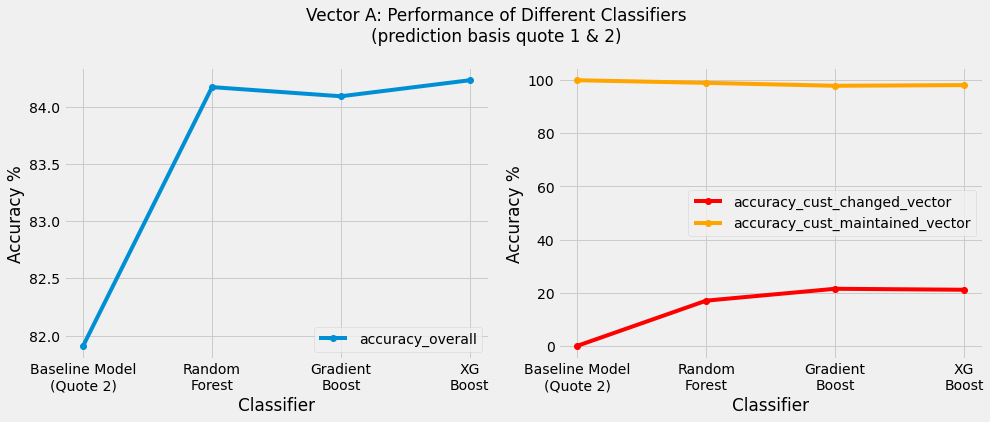

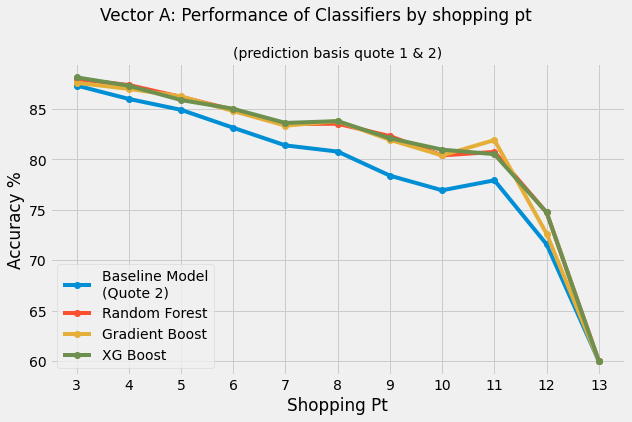

In [44]:
vector = 'A'
#models = ['no_model', 'rf', 'gb', 'xg', 'lr']
models = ['no_model', 'rf', 'gb', 'xg']
quotes = [1,2]
model_performance_plot(vector, models, quotes, perf_record_testdata.record, "overall")
model_performance_plot(vector, models, quotes, perf_record_testdata.record, "shopping_pt")


## Test Set: Predict Vector B

Random Forest Classifier results for Vector B
Parameters: No. of Estimators = 200,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8407, f1-score=0.8403
Confusion Matrix - normalized
 [[0.8777 0.1223]
 [0.2005 0.7995]]
Confusion Matrix
 [[8975 1251]
 [1840 7336]]

Classification Report 
               precision    recall  f1-score   support

           0       0.83      0.88      0.85     10226
           1       0.85      0.80      0.83      9176

    accuracy                           0.84     19402
   macro avg       0.84      0.84      0.84     19402
weighted avg       0.84      0.84      0.84     19402

20


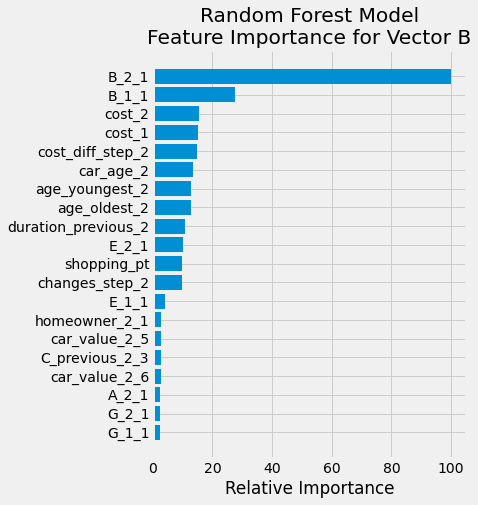

In [194]:
vector = 'B'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=200, min_samples_leaf = 1, min_samples_split = 2, plot = True)


In [155]:
vector = 'B'

x = pd.crosstab(y_test_compare[vector], y_test_compare[vector+"_2"], )
same_as_2 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 
acc = np.around(np.sum(same_as_2)/y_test_compare.shape[0], 4)
print(f"Accuracy based on simply predicting vector {vector} = {vector}_2 : {(np.sum(same_as_2)/y_test_compare.shape[0]): 4.4}")
x['total'] = x.sum(axis=1)
x['B0_%'] = np.around(x[0]*100 / x['total'], 2)
x['B1_%'] = np.around(x[1]*100 / x['total'], 2)
x

Accuracy based on simply predicting vector B = B_2 :  0.8396


B_2,0,1,total,B0_%,B1_%
B,,,,,
0,9018,1208,10226,88.19,11.81
1,1904,7272,9176,20.75,79.25


In [195]:
# As B is a binary vector, let's predict it with a Logistic Regression model

vector = 'B'

lr_ac, lr_f1, lr_probs, lr_preds = lr_predict(vector)


Logistic Regression for vector B
Accuracy = 0.84, f1-score = 0.8395

Confusion Matrix - normalized
 [[0.8814 0.1186]
 [0.2061 0.7939]]
Confusion Matrix
 [[9013 1213]
 [1891 7285]]

Classification Report 
               precision    recall  f1-score   support

           0       0.83      0.88      0.85     10226
           1       0.86      0.79      0.82      9176

    accuracy                           0.84     19402
   macro avg       0.84      0.84      0.84     19402
weighted avg       0.84      0.84      0.84     19402


Area under ROC: 
 0.8757089877742957


C:\Users\amite\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Gradient Boosting Classifier results for Vector B
Parameters: No. of Estimators = 150,  max_depth = 3,     learning_rate = 0.25, max_features = 6
Accuracy=0.8403, f1-score=0.8398
Confusion Matrix - normalized
 [[0.8792 0.1208]
 [0.2031 0.7969]]
Confusion Matrix
 [[8991 1235]
 [1864 7312]]

Classification Report 
               precision    recall  f1-score   support

           0       0.83      0.88      0.85     10226
           1       0.86      0.80      0.83      9176

    accuracy                           0.84     19402
   macro avg       0.84      0.84      0.84     19402
weighted avg       0.84      0.84      0.84     19402

20


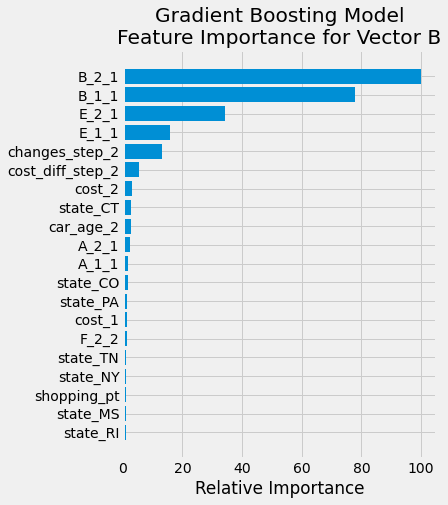

In [196]:
# Now let's predict B with the best GB model 

vector = 'B'
gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 150, learning_rate = 0.25, max_depth = 3, max_features = 6, plot=True)

fpr_3, tpr_3, thresholds_3 = roc_curve(y_test[vector].astype('int'), gb_probs)

XGBoost Classifier results for Vector B
Parameters: No. of Estimators = 100,  max_depth = 4,     learning_rate = 0.3, colsample_bytree = 0.35
Accuracy=0.8403, f1-score=0.8399
Confusion Matrix - normalized
 [[0.8768 0.1232]
 [0.2003 0.7997]]
Confusion Matrix
 [[8966 1260]
 [1838 7338]]

Classification Report 
               precision    recall  f1-score   support

           0       0.83      0.88      0.85     10226
           1       0.85      0.80      0.83      9176

    accuracy                           0.84     19402
   macro avg       0.84      0.84      0.84     19402
weighted avg       0.84      0.84      0.84     19402

20


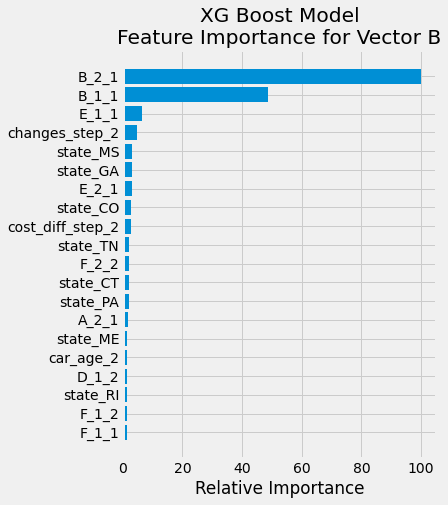

In [197]:
# model B with XGBoost classifier BEST Hyperparameters (Iteration 44)

vector = 'B'

xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, max_depth=4, n_estimators=100, \
                       learning_rate = 0.3, colsample_bytree = 0.35, plot = True)

In [157]:
vector = 'B'
models = ['rf', 'gb', 'xg', 'lr']
model_preds = {'rf' : rf_preds, 'xg' : xg_preds, 'gb' : gb_preds, 'lr' : lr_preds}
model_acc = {'rf' : rf_ac, 'xg' : xg_ac, 'gb' : gb_ac, 'lr' : lr_ac}

for model in models:
    score_cust_type = model_score_matrix(vector, 2, model_preds[model])
    score_shp_pt = model_score_by_shopping_pt(vector, 2, model_preds[model])

    perf_record_testdata.update(vector, 'no_model', 'overall', acc*100)
    perf_record_testdata.update(vector, model, 'overall', round(model_acc[model]*100,2))
    perf_record_testdata.update(vector, model, 'customer_type', score_cust_type)
    perf_record_testdata.update(vector, model, 'shopping_pt', score_shp_pt)
    perf_record_testdata.compare(vector, model)
perf_record_testdata.record[vector]


,no_model,rf,rf_vs_no_model,gb,gb_vs_no_model,xg,xg_vs_no_model,lr,lr_vs_no_model
accuracy_overall,83.96,84.07,0.11,84.03,0.07,84.03,0.07,84.00,0.04
accuracy_cust_changed_vector,0,2.73,2.73,1.57,1.57,3.08,3.08,0.48,0.48
accuracy_cust_maintained_vector,100,99.61,-0.39,99.78,-0.22,99.50,-0.5,99.96,-0.04
accuracy_shopping_pt_3,85.89,85.89,0.0,85.89,0.0,85.89,0.0,85.89,0.0
accuracy_shopping_pt_4,87.62,87.81,0.19,87.75,0.13,87.62,0.0,87.62,0.0
accuracy_shopping_pt_5,86.73,86.51,-0.22,86.65,-0.08,86.73,0.0,86.69,-0.04
accuracy_shopping_pt_6,84.74,84.77,0.03,84.70,-0.04,84.64,-0.1,84.83,0.09
accuracy_shopping_pt_7,83.92,83.94,0.02,83.92,0.0,83.94,0.02,83.97,0.05
accuracy_shopping_pt_8,83.42,83.42,0.0,83.45,0.03,83.30,-0.12,83.36,-0.06
accuracy_shopping_pt_9,81.06,81.44,0.38,81.31,0.25,81.48,0.42,81.10,0.04


C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(labels)
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(labels)


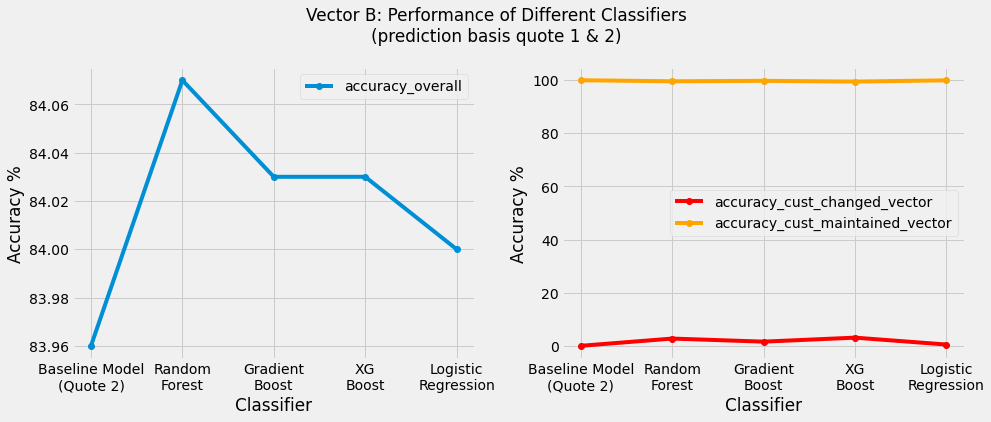

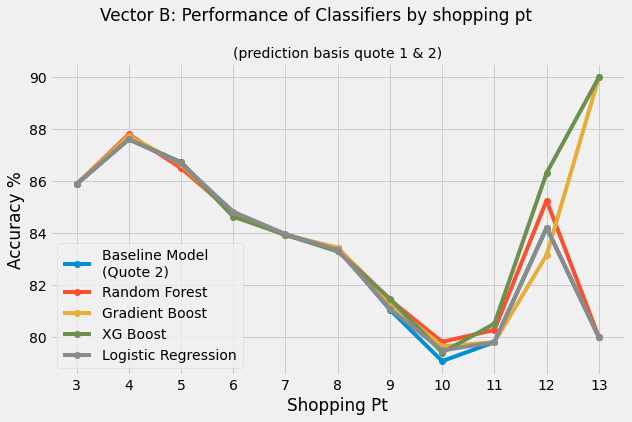

In [158]:
vector = 'B'
models = ['no_model', 'rf', 'gb', 'xg', 'lr']
#models = ['no_model', 'rf', 'gb', 'xg']
quotes = [1,2]
model_performance_plot(vector, models, quotes, perf_record_testdata.record, "overall")
model_performance_plot(vector, models, quotes, perf_record_testdata.record, "shopping_pt")

In [165]:
vector = 'B'

fpr_1, tpr_1, thresholds_1 = roc_curve(y_test[vector].astype('int'), rf_probs)
roc_auc1 = auc(fpr_1, tpr_1)

fpr_2, tpr_2, thresholds_2 = roc_curve(y_test[vector].astype('int'), xg_probs)
roc_auc2 = auc(fpr_2, tpr_2)

fpr_3, tpr_3, thresholds_3 = roc_curve(y_test[vector].astype('int'), lr_probs)
roc_auc3 = auc(fpr_3, tpr_3)

fpr_4, tpr_4, thresholds_4 = roc_curve(y_test[vector].astype('int'), gb_probs)
roc_auc4 = auc(fpr_4, tpr_4)

roc_auc1, roc_auc2, roc_auc3, roc_auc4



(0.8795954401323465,
 0.8853479209874279,
 0.8757089877742957,
 0.8803046463780801)

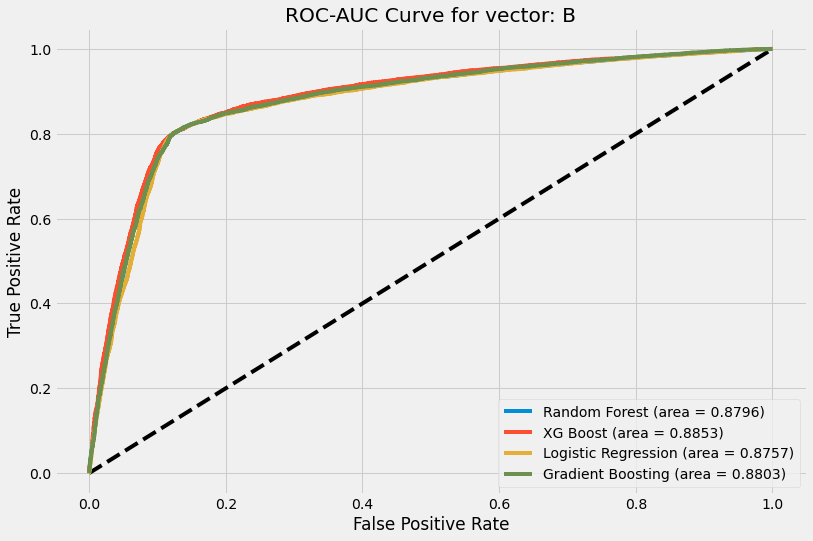

In [166]:
plt.figure(figsize=(12,8))

plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_1, tpr_1, label='Random Forest (area = 0.8796)')
plt.plot(fpr_2, tpr_2, label='XG Boost (area = 0.8853)')
plt.plot(fpr_3, tpr_3, label='Logistic Regression (area = 0.8757)')
plt.plot(fpr_4, tpr_4, label='Gradient Boosting (area = 0.8803)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-AUC Curve for vector: '+vector)
plt.legend()
plt.show()

Vector B Logistic Regression Model
Best Accuracy score of 0.8414 occurs for threshold = 0.412
Vector B Random Forest Model
Best Accuracy score of 0.8407 occurs for threshold = 0.475
Vector B XG Boost Model
Best Accuracy score of 0.8408 occurs for threshold = 0.541
Vector B Gradient Boost Model
Best Accuracy score of 0.8409 occurs for threshold = 0.468


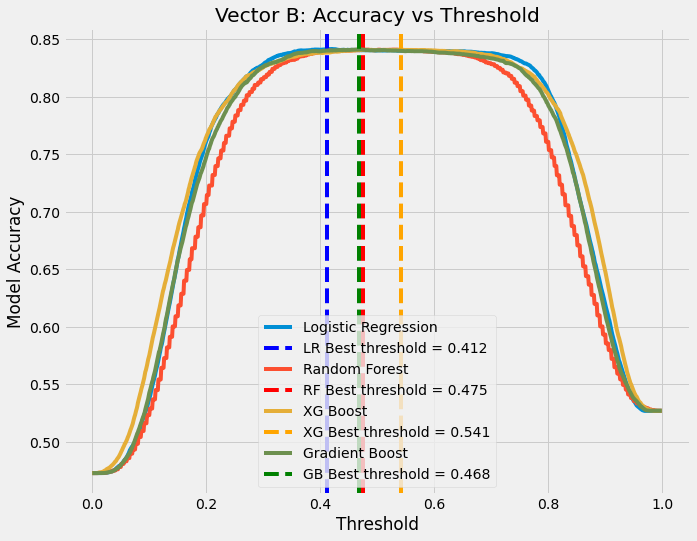

In [198]:
# We are concerned with accuracy of the model i.e. its ability to predict both the 0 and 1 labels correctly
# So we will calculate the accuracy score at different thresholds directly

vector = 'B'
plt.figure(figsize=(10,8))

def to_labels(pos_probs, threshold):
    return (pos_probs >= threshold).astype('int')

thresholds = np.arange(0, 1, 0.001)

# for LR model
ac_score_lr = [accuracy_score(y_test[vector].astype('int'), to_labels(lr_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_lr)
print(f"Vector {vector} Logistic Regression Model\nBest Accuracy score of {ac_score_lr[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_lr, label='Logistic Regression')
plt.axvline(thresholds[idx], color='blue', linestyle="--", label = "LR Best threshold = "+str(np.round(thresholds[idx],4)))

# for random forest
thresholds = np.arange(0, 1, 0.001)
ac_score_rf = [accuracy_score(y_test[vector].astype('int'), to_labels(rf_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_rf)
print(f"Vector {vector} Random Forest Model\nBest Accuracy score of {ac_score_rf[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_rf, label='Random Forest')
plt.axvline(thresholds[idx], color='red', linestyle="--", label = "RF Best threshold = "+str(np.round(thresholds[idx],4)))

# for XG Boost
thresholds = np.arange(0, 1, 0.001)
ac_score_xg = [accuracy_score(y_test[vector].astype('int'), to_labels(xg_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_xg)
print(f"Vector {vector} XG Boost Model\nBest Accuracy score of {ac_score_xg[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_xg, label='XG Boost')
plt.axvline(thresholds[idx], color='orange', linestyle="--", label = "XG Best threshold = "+str(np.round(thresholds[idx],4)))

# for Gradient Boost
thresholds = np.arange(0, 1, 0.001)
ac_score_gb = [accuracy_score(y_test[vector].astype('int'), to_labels(gb_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_gb)
print(f"Vector {vector} Gradient Boost Model\nBest Accuracy score of {ac_score_gb[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_gb, label='Gradient Boost')
plt.axvline(thresholds[idx], color='green', linestyle="--", label = "GB Best threshold = "+str(np.round(thresholds[idx],4)))

plt.legend()
plt.xlabel('Threshold')
plt.ylabel('Model Accuracy')
plt.title('Vector B: Accuracy vs Threshold')

plt.show()

## Test Set: Predict Vector C

Random Forest Classifier results for Vector C
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 5
Accuracy=0.8276, f1-score=0.8268
Confusion Matrix - normalized
 [[0.8448 0.0769 0.0731 0.0051]
 [0.116  0.7339 0.1392 0.0109]
 [0.047  0.0489 0.8788 0.0253]
 [0.0325 0.0203 0.1723 0.7749]]
Confusion Matrix
 [[4933  449  427   30]
 [ 480 3037  576   45]
 [ 355  369 6635  191]
 [  61   38  323 1453]]

Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.84      0.85      5839
           1       0.78      0.73      0.76      4138
           2       0.83      0.88      0.86      7550
           3       0.85      0.77      0.81      1875

    accuracy                           0.83     19402
   macro avg       0.83      0.81      0.82     19402
weighted avg       0.83      0.83      0.83     19402

20


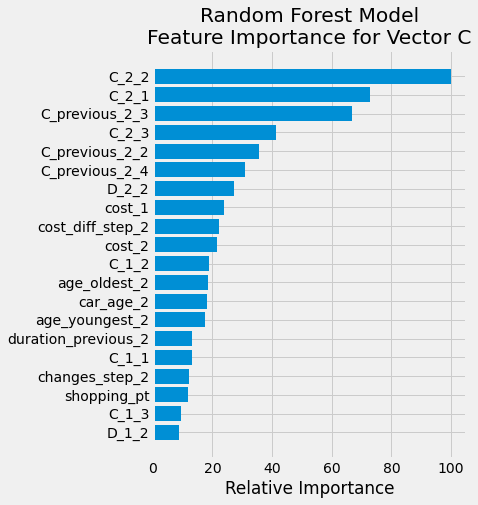

In [58]:
# Best RF model for C
vector = 'C'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=300, min_samples_leaf = 1, \
                                                   min_samples_split = 5, plot = True)

In [71]:
vector = 'C'

x = pd.crosstab(y_test_compare[vector], y_test_compare[vector+"_2"], )
same_as_2 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 
acc = np.around(np.sum(same_as_2)/y_test_compare.shape[0], 4)
print(f"Accuracy based on simply predicting vector {vector} = {vector}_2 : {(np.sum(same_as_2)/y_test_compare.shape[0]): 4.4}")
x['total'] = x.sum(axis=1)
x['C0_%'] = np.around(x[0]*100 / x['total'], 2)
x['C1_%'] = np.around(x[1]*100 / x['total'], 2)
x['C2_%'] = np.around(x[2]*100 / x['total'], 2)
x['C3_%'] = np.around(x[3]*100 / x['total'], 2)
x

Accuracy based on simply predicting vector C = C_2 :  0.8018


C_2,0,1,2,3,total,C0_%,C1_%,C2_%,C3_%
C,,,,,,,,,
0,4747,464,603,25,5839,81.30,7.95,10.33,0.43
1,504,2917,678,39,4138,12.18,70.49,16.38,0.94
2,488,378,6538,146,7550,6.46,5.01,86.60,1.93
3,102,53,366,1354,1875,5.44,2.83,19.52,72.21


Gradient Boosting Classifier results for Vector C
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.25, max_features = 8
Accuracy=0.8282, f1-score=0.8274
Confusion Matrix - normalized
 [[0.8447 0.0757 0.0733 0.0063]
 [0.1165 0.7337 0.1348 0.015 ]
 [0.0478 0.047  0.876  0.0291]
 [0.0251 0.016  0.1664 0.7925]]
Confusion Matrix
 [[4932  442  428   37]
 [ 482 3036  558   62]
 [ 361  355 6614  220]
 [  47   30  312 1486]]

Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.84      0.85      5839
           1       0.79      0.73      0.76      4138
           2       0.84      0.88      0.86      7550
           3       0.82      0.79      0.81      1875

    accuracy                           0.83     19402
   macro avg       0.82      0.81      0.82     19402
weighted avg       0.83      0.83      0.83     19402

20


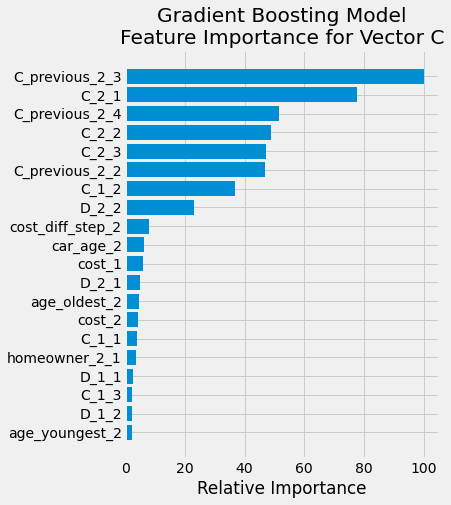

In [60]:
# model C with GradientBoosting classifier
# Best Parameters: {'n_estimators': 200, 'max_features': 8, 'max_depth': 3, 'learning_rate': 0.25}

vector = 'C'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, max_features = 8, \
                                                   max_depth = 3, learning_rate = 0.25, plot = True)

XGBoost Classifier results for Vector C
Parameters: No. of Estimators = 200,  max_depth = 5,     learning_rate = 0.25, colsample_bytree = 0.35
Accuracy=0.8298, f1-score=0.829
Confusion Matrix - normalized
 [[0.8486 0.0747 0.0709 0.0058]
 [0.1179 0.7344 0.1348 0.0128]
 [0.0475 0.0458 0.877  0.0297]
 [0.0267 0.0155 0.1664 0.7915]]
Confusion Matrix
 [[4955  436  414   34]
 [ 488 3039  558   53]
 [ 359  346 6621  224]
 [  50   29  312 1484]]

Classification Report 
               precision    recall  f1-score   support

           0       0.85      0.85      0.85      5839
           1       0.79      0.73      0.76      4138
           2       0.84      0.88      0.86      7550
           3       0.83      0.79      0.81      1875

    accuracy                           0.83     19402
   macro avg       0.83      0.81      0.82     19402
weighted avg       0.83      0.83      0.83     19402

20


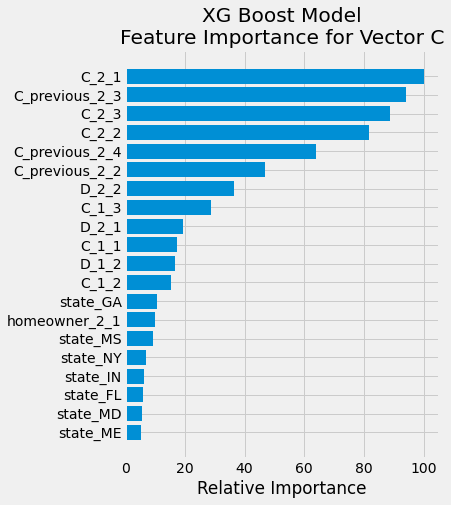

In [64]:
# model C with XGBoost classifier Best Parameters: (Overall 2nd rank model, Iteration 52)

vector = 'C'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators = 200, max_depth = 5, \
                                         learning_rate = 0.25, colsample_bytree = 0.35, plot=True)


In [65]:
vector = 'C'
models = ['rf', 'gb', 'xg']
model_preds = {'rf' : rf_preds, 'xg' : xg_preds, 'gb' : gb_preds}
model_acc = {'rf' : rf_ac, 'xg' : xg_ac, 'gb' : gb_ac}

for model in models:
    score_cust_type = model_score_matrix(vector, 2, model_preds[model])
    score_shp_pt = model_score_by_shopping_pt(vector, 2, model_preds[model])

    perf_record_testdata.update(vector, 'no_model', 'overall', acc*100)
    perf_record_testdata.update(vector, model, 'overall', round(model_acc[model]*100,2))
    perf_record_testdata.update(vector, model, 'customer_type', score_cust_type)
    perf_record_testdata.update(vector, model, 'shopping_pt', score_shp_pt)
    perf_record_testdata.compare(vector, model)

perf_record_testdata.record[vector]

C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from

,no_model,rf,rf_vs_no_model,gb,gb_vs_no_model,xg,xg_vs_no_model
accuracy_overall,80.18,82.76,2.58,82.82,2.64,82.98,2.8
accuracy_cust_changed_vector,0,20.02,20.02,25.64,25.64,27.02,27.02
accuracy_cust_maintained_vector,100,98.28,-1.72,96.95,-3.05,96.81,-3.19
accuracy_shopping_pt_3,85.89,86.97,1.08,85.98,0.09,86.34,0.45
accuracy_shopping_pt_4,84.75,86.25,1.5,86.38,1.63,86.62,1.87
accuracy_shopping_pt_5,83.67,85.49,1.82,85.05,1.38,85.27,1.6
accuracy_shopping_pt_6,81.25,83.46,2.21,84.16,2.91,84.00,2.75
accuracy_shopping_pt_7,79.26,82.11,2.85,82.01,2.75,82.41,3.15
accuracy_shopping_pt_8,78.9,81.83,2.93,82.09,3.19,82.23,3.33
accuracy_shopping_pt_9,76.93,80.31,3.38,80.23,3.3,80.31,3.38


C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(labels)
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(labels)


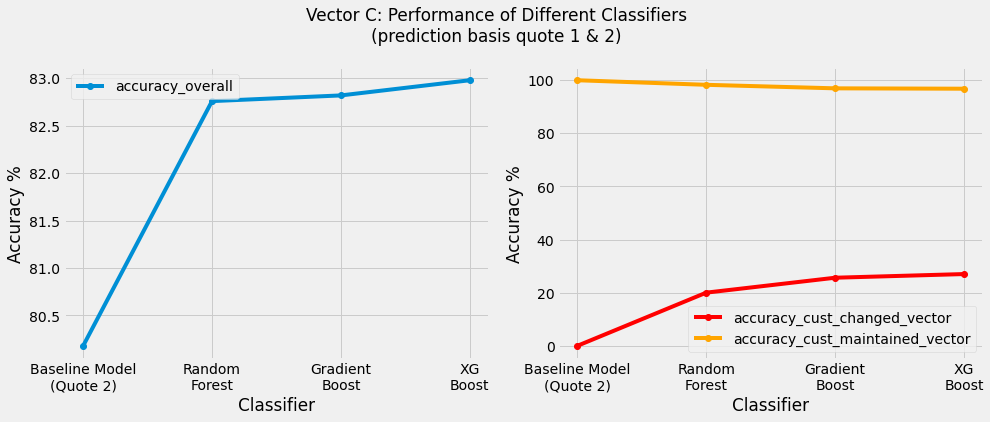

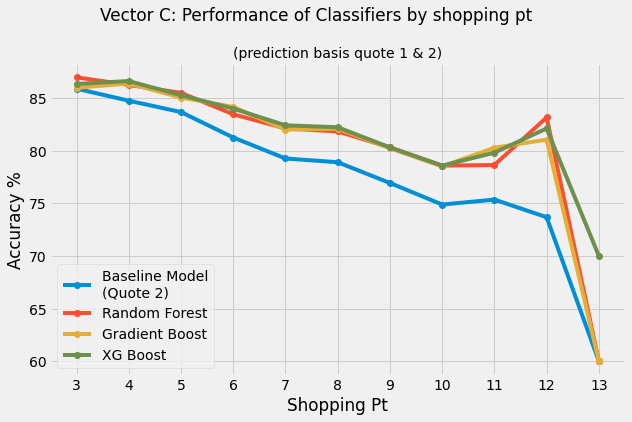

In [66]:
vector = 'C'
#models = ['no_model', 'rf', 'gb', 'xg', 'lr']
models = ['no_model', 'rf', 'gb', 'xg']
quotes = [1,2]
model_performance_plot(vector, models, quotes, perf_record_testdata.record, "overall")
model_performance_plot(vector, models, quotes, perf_record_testdata.record, "shopping_pt")

## Test Set: Predict D

Random Forest Classifier results for Vector D
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8671, f1-score=0.8679
Confusion Matrix - normalized
 [[0.7968 0.079  0.1242]
 [0.0892 0.7769 0.1339]
 [0.0303 0.0569 0.9128]]
Confusion Matrix
 [[ 2047   203   319]
 [  387  3370   581]
 [  378   711 11406]]

Classification Report 
               precision    recall  f1-score   support

           0       0.73      0.80      0.76      2569
           1       0.79      0.78      0.78      4338
           2       0.93      0.91      0.92     12495

    accuracy                           0.87     19402
   macro avg       0.81      0.83      0.82     19402
weighted avg       0.87      0.87      0.87     19402

20


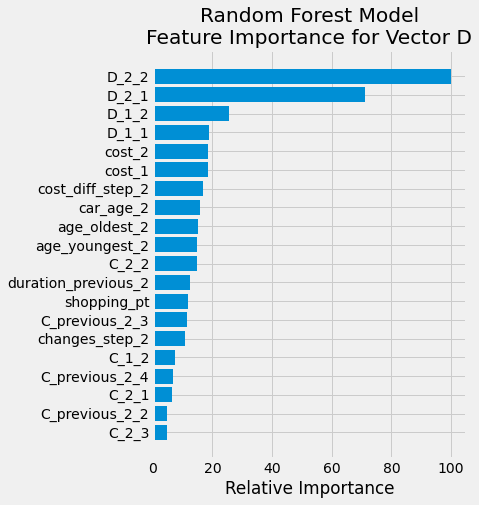

In [72]:
# Let's run the best RF model for vector D

vector = 'D'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, plot = True)

In [75]:
vector = 'D'

x = pd.crosstab(y_test_compare[vector], y_test_compare[vector+"_2"], )
same_as_2 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 
acc = np.around(np.sum(same_as_2)/y_test_compare.shape[0], 4)
print(f"Accuracy based on simply predicting vector {vector} = {vector}_2 : {(np.sum(same_as_2)/y_test_compare.shape[0]): 4.4}")
x['total'] = x.sum(axis=1)
x['D0_%'] = np.around(x[0]*100 / x['total'], 2)
x['D1_%'] = np.around(x[1]*100 / x['total'], 2)
x['D2_%'] = np.around(x[2]*100 / x['total'], 2)
x

Accuracy based on simply predicting vector D = D_2 :  0.8509


D_2,0,1,2,total,D0_%,D1_%,D2_%
D,,,,,,,
0,2165,188,216,2569,84.27,7.32,8.41
1,521,3377,440,4338,12.01,77.85,10.14
2,745,782,10968,12495,5.96,6.26,87.78


Gradient Boosting Classifier results for Vector D
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.3, max_features = 10
Accuracy=0.8662, f1-score=0.8667
Confusion Matrix - normalized
 [[0.7917 0.0786 0.1296]
 [0.0897 0.7679 0.1425]
 [0.0295 0.0549 0.9156]]
Confusion Matrix
 [[ 2034   202   333]
 [  389  3331   618]
 [  368   686 11441]]

Classification Report 
               precision    recall  f1-score   support

           0       0.73      0.79      0.76      2569
           1       0.79      0.77      0.78      4338
           2       0.92      0.92      0.92     12495

    accuracy                           0.87     19402
   macro avg       0.81      0.83      0.82     19402
weighted avg       0.87      0.87      0.87     19402

20


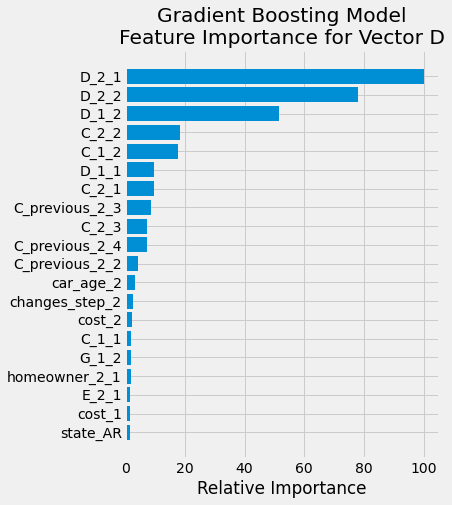

In [68]:
# model D with GradientBoosting classifier
from sklearn.ensemble import GradientBoostingClassifier

vector = 'D'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, max_features = 10, max_depth = 3, \
                                                   learning_rate = 0.3, plot = True)

XGBoost Classifier results for Vector D
Parameters: No. of Estimators = 500,  max_depth = 3,     learning_rate = 0.25, colsample_bytree = 0.25
Accuracy=0.8664, f1-score=0.8667
Confusion Matrix - normalized
 [[0.7875 0.0806 0.132 ]
 [0.0869 0.7672 0.1459]
 [0.029  0.054  0.917 ]]
Confusion Matrix
 [[ 2023   207   339]
 [  377  3328   633]
 [  362   675 11458]]

Classification Report 
               precision    recall  f1-score   support

           0       0.73      0.79      0.76      2569
           1       0.79      0.77      0.78      4338
           2       0.92      0.92      0.92     12495

    accuracy                           0.87     19402
   macro avg       0.81      0.82      0.82     19402
weighted avg       0.87      0.87      0.87     19402

20


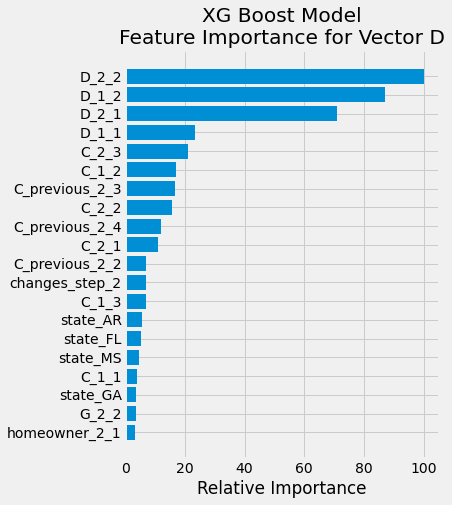

In [73]:
# model D with XGBoost classifier Best Parameters: (Overall 1st rank model)
#  No. of Estimators = 500,  max_depth = 3, learning_rate = 0.25, colsample_bytree = 0.25 : 

vector = 'D'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators = 500, max_depth = 3, \
                                         learning_rate = 0.25, colsample_bytree = 0.25, plot=True)


In [76]:
vector = 'D'
models = ['rf', 'gb', 'xg']
model_preds = {'rf' : rf_preds, 'xg' : xg_preds, 'gb' : gb_preds}
model_acc = {'rf' : rf_ac, 'xg' : xg_ac, 'gb' : gb_ac}

for model in models:
    score_cust_type = model_score_matrix(vector, 2, model_preds[model])
    score_shp_pt = model_score_by_shopping_pt(vector, 2, model_preds[model])

    perf_record_testdata.update(vector, 'no_model', 'overall', acc*100)
    perf_record_testdata.update(vector, model, 'overall', round(model_acc[model]*100,2))
    perf_record_testdata.update(vector, model, 'customer_type', score_cust_type)
    perf_record_testdata.update(vector, model, 'shopping_pt', score_shp_pt)
    perf_record_testdata.compare(vector, model)

perf_record_testdata.record[vector]

C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from

,no_model,rf,rf_vs_no_model,gb,gb_vs_no_model,xg,xg_vs_no_model
accuracy_overall,85.09,86.71,1.62,86.62,1.53,86.64,1.55
accuracy_cust_changed_vector,0,16.29,16.29,18.36,18.36,19.19,19.19
accuracy_cust_maintained_vector,100,99.04,-0.96,98.58,-1.42,98.45,-1.55
accuracy_shopping_pt_3,89.94,91.02,1.08,90.84,0.9,91.11,1.17
accuracy_shopping_pt_4,90.0,91.00,1.0,90.94,0.94,90.75,0.75
accuracy_shopping_pt_5,86.82,87.98,1.16,87.80,0.98,88.24,1.42
accuracy_shopping_pt_6,86.14,87.46,1.32,87.10,0.96,87.30,1.16
accuracy_shopping_pt_7,84.13,86.01,1.88,85.80,1.67,85.93,1.8
accuracy_shopping_pt_8,83.86,85.68,1.82,85.51,1.65,85.30,1.44
accuracy_shopping_pt_9,82.94,85.11,2.17,85.31,2.37,85.15,2.21


C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(labels)
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(labels)


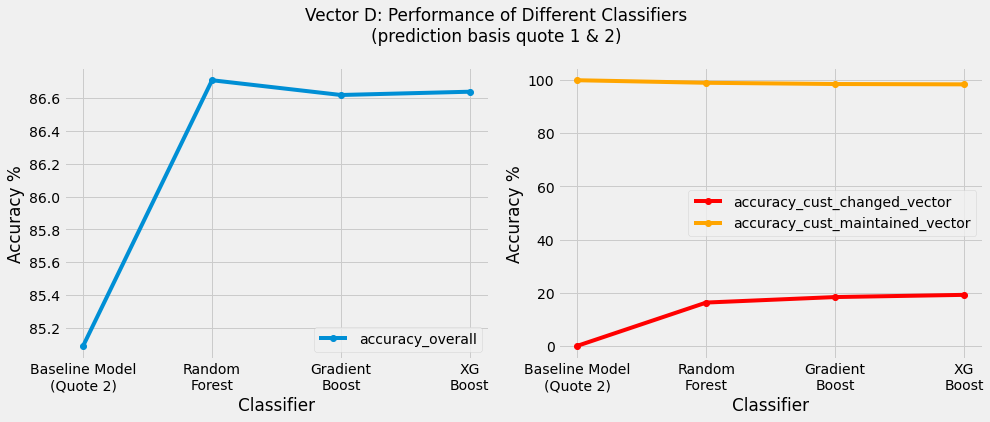

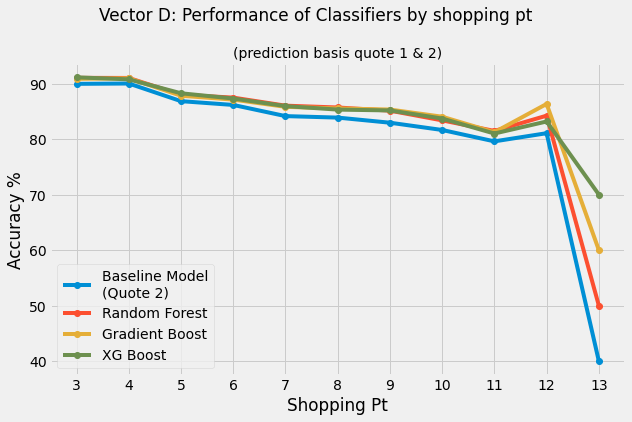

In [77]:
vector = 'D'
#models = ['no_model', 'rf', 'gb', 'xg', 'lr']
models = ['no_model', 'rf', 'gb', 'xg']
quotes = [1,2]
model_performance_plot(vector, models, quotes, perf_record_testdata.record, "overall")
model_performance_plot(vector, models, quotes, perf_record_testdata.record, "shopping_pt")

## Test Set: Predict E

Random Forest Classifier results for Vector E
Parameters: No. of Estimators = 100,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8463, f1-score=0.8458
Confusion Matrix - normalized
 [[0.8866 0.1134]
 [0.2002 0.7998]]
Confusion Matrix
 [[9211 1178]
 [1804 7209]]

Classification Report 
               precision    recall  f1-score   support

           0       0.84      0.89      0.86     10389
           1       0.86      0.80      0.83      9013

    accuracy                           0.85     19402
   macro avg       0.85      0.84      0.84     19402
weighted avg       0.85      0.85      0.85     19402

20


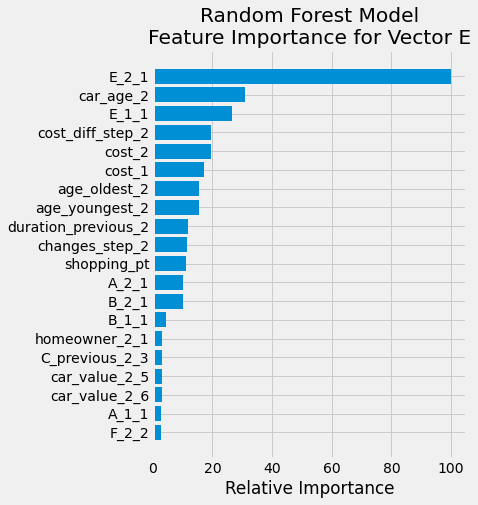

In [180]:
#Let's run the model with Best Parameters: {'n_estimators': 100}

vector = 'E'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators = 100, plot = True)

In [184]:
vector = 'E'

x = pd.crosstab(y_test_compare[vector], y_test_compare[vector+"_2"], )
same_as_2 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 
acc = np.around(np.sum(same_as_2)/y_test_compare.shape[0], 4)
print(f"Accuracy based on simply predicting vector {vector} = {vector}_2 : {(np.sum(same_as_2)/y_test_compare.shape[0]): 4.4}")
x['total'] = x.sum(axis=1)
x['E0_%'] = np.around(x[0]*100 / x['total'], 2)
x['E1_%'] = np.around(x[1]*100 / x['total'], 2)
x

Accuracy based on simply predicting vector E = E_2 :  0.838


E_2,0,1,total,E0_%,E1_%
E,,,,,
0,9111,1278,10389,87.7,12.3
1,1866,7147,9013,20.7,79.3


In [181]:
# As E is a binary vector, let's predict it with a Logistic Regression model

vector = 'E'

lr_ac, lr_f1, lr_probs, lr_preds = lr_predict(vector)

Logistic Regression for vector E
Accuracy = 0.8408, f1-score = 0.8403

Confusion Matrix - normalized
 [[0.8785 0.1215]
 [0.2027 0.7973]]
Confusion Matrix
 [[9127 1262]
 [1827 7186]]

Classification Report 
               precision    recall  f1-score   support

           0       0.83      0.88      0.86     10389
           1       0.85      0.80      0.82      9013

    accuracy                           0.84     19402
   macro avg       0.84      0.84      0.84     19402
weighted avg       0.84      0.84      0.84     19402


Area under ROC: 
 0.8952642142972767


C:\Users\amite\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Gradient Boosting Classifier results for Vector E
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.5, max_features = 6
Accuracy=0.8463, f1-score=0.8458
Confusion Matrix - normalized
 [[0.8858 0.1142]
 [0.1994 0.8006]]
Confusion Matrix
 [[9203 1186]
 [1797 7216]]

Classification Report 
               precision    recall  f1-score   support

           0       0.84      0.89      0.86     10389
           1       0.86      0.80      0.83      9013

    accuracy                           0.85     19402
   macro avg       0.85      0.84      0.84     19402
weighted avg       0.85      0.85      0.85     19402

20


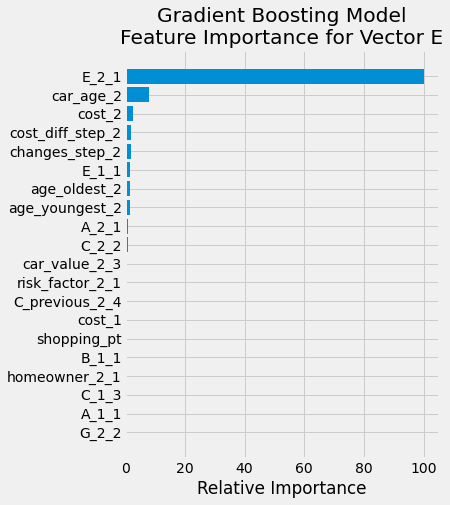

In [182]:
#BEST GB MODEL for E

vector = 'E'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, learning_rate = 0.5, max_depth = 3, \
                                         max_features = 6, plot=True)

XGBoost Classifier results for Vector E
Parameters: No. of Estimators = 400,  max_depth = 3,     learning_rate = 0.25, colsample_bytree = 0.5
Accuracy=0.8472, f1-score=0.8468
Confusion Matrix - normalized
 [[0.8858 0.1142]
 [0.1973 0.8027]]
Confusion Matrix
 [[9203 1186]
 [1778 7235]]

Classification Report 
               precision    recall  f1-score   support

           0       0.84      0.89      0.86     10389
           1       0.86      0.80      0.83      9013

    accuracy                           0.85     19402
   macro avg       0.85      0.84      0.85     19402
weighted avg       0.85      0.85      0.85     19402

20


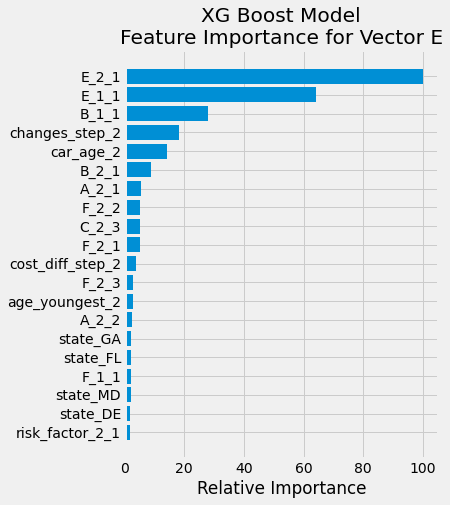

In [183]:
vector = 'E'
xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators = 400, max_depth = 3, \
                                         learning_rate = 0.25, colsample_bytree = 0.5, plot=True)

In [186]:
vector = 'E'
models = ['rf', 'gb', 'xg', 'lr']
model_preds = {'rf' : rf_preds, 'xg' : xg_preds, 'gb' : gb_preds, 'lr' : lr_preds}
model_acc = {'rf' : rf_ac, 'xg' : xg_ac, 'gb' : gb_ac, 'lr' : lr_ac}

for model in models:
    score_cust_type = model_score_matrix(vector, 2, model_preds[model])
    score_shp_pt = model_score_by_shopping_pt(vector, 2, model_preds[model])

    perf_record_testdata.update(vector, 'no_model', 'overall', acc*100)
    perf_record_testdata.update(vector, model, 'overall', round(model_acc[model]*100,2))
    perf_record_testdata.update(vector, model, 'customer_type', score_cust_type)
    perf_record_testdata.update(vector, model, 'shopping_pt', score_shp_pt)
    perf_record_testdata.compare(vector, model)

perf_record_testdata.record[vector]

C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from

,no_model,rf,rf_vs_no_model,gb,gb_vs_no_model,xg,xg_vs_no_model,lr,lr_vs_no_model
accuracy_overall,83.8,84.63,0.83,84.63,0.83,84.72,0.92,84.08,0.28
accuracy_cust_changed_vector,0,8.97,8.97,12.53,12.53,13.07,13.07,4.39,4.39
accuracy_cust_maintained_vector,100,99.26,-0.74,98.57,-1.43,98.58,-1.42,99.49,-0.51
accuracy_shopping_pt_3,88.05,88.05,0.0,87.96,-0.09,88.32,0.27,87.78,-0.27
accuracy_shopping_pt_4,85.5,85.81,0.31,86.25,0.75,86.38,0.88,85.94,0.44
accuracy_shopping_pt_5,87.36,87.58,0.22,87.36,0.0,87.58,0.22,87.27,-0.09
accuracy_shopping_pt_6,85.06,85.86,0.8,86.02,0.96,86.11,1.05,85.34,0.28
accuracy_shopping_pt_7,84.05,84.80,0.75,84.64,0.59,84.91,0.86,84.13,0.08
accuracy_shopping_pt_8,82.55,83.91,1.36,83.65,1.1,83.54,0.99,82.96,0.41
accuracy_shopping_pt_9,80.31,81.85,1.54,82.02,1.71,81.98,1.67,80.77,0.46


C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(labels)
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(labels)


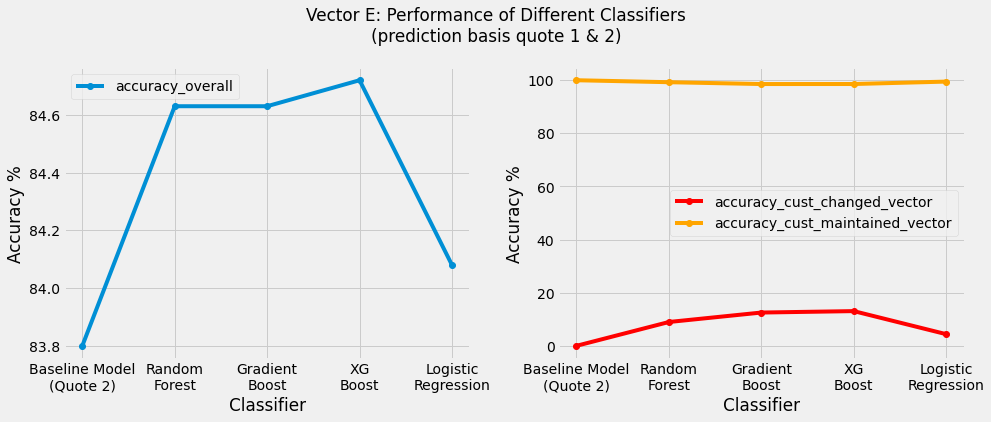

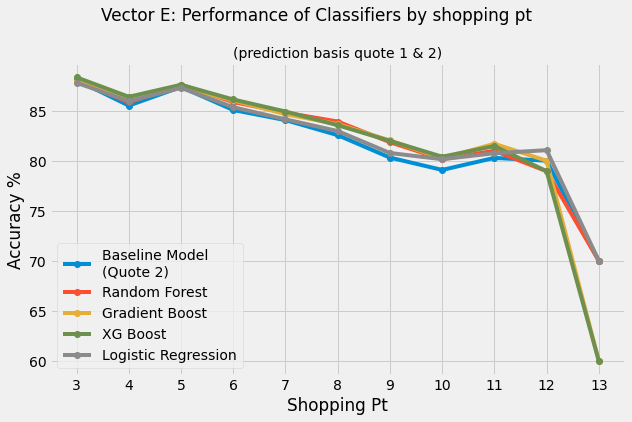

In [187]:
vector = 'E'
models = ['no_model', 'rf', 'gb', 'xg', 'lr']
#models = ['no_model', 'rf', 'gb', 'xg']
quotes = [1,2]
model_performance_plot(vector, models, quotes, perf_record_testdata.record, "overall")
model_performance_plot(vector, models, quotes, perf_record_testdata.record, "shopping_pt")

In [188]:
vector = 'E'

fpr_1, tpr_1, thresholds_1 = roc_curve(y_test[vector].astype('int'), rf_probs)
roc_auc1 = auc(fpr_1, tpr_1)

fpr_2, tpr_2, thresholds_2 = roc_curve(y_test[vector].astype('int'), xg_probs)
roc_auc2 = auc(fpr_2, tpr_2)

fpr_3, tpr_3, thresholds_3 = roc_curve(y_test[vector].astype('int'), lr_probs)
roc_auc3 = auc(fpr_3, tpr_3)

fpr_4, tpr_4, thresholds_4 = roc_curve(y_test[vector].astype('int'), gb_probs)
roc_auc4 = auc(fpr_4, tpr_4)

roc_auc1, roc_auc2, roc_auc3, roc_auc4

(0.8976398803294332,
 0.9048194596660558,
 0.8952642142972767,
 0.9026895056035946)

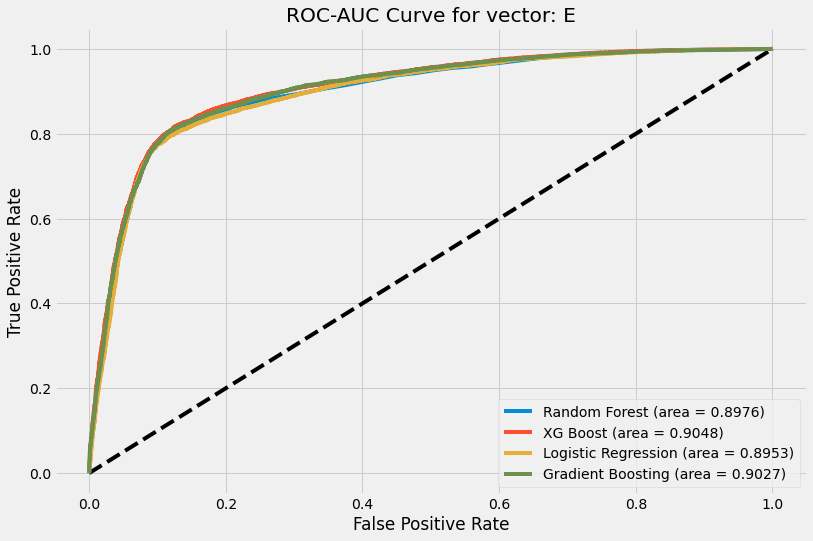

In [189]:
plt.figure(figsize=(12,8))

plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_1, tpr_1, label='Random Forest (area = 0.8976)')
plt.plot(fpr_2, tpr_2, label='XG Boost (area = 0.9048)')
plt.plot(fpr_3, tpr_3, label='Logistic Regression (area = 0.8953)')
plt.plot(fpr_4, tpr_4, label='Gradient Boosting (area = 0.9027)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-AUC Curve for vector: '+vector)
plt.legend()
plt.show()

Vector E Logistic Regression Model
Best Accuracy score of 0.8417 occurs for threshold = 0.648
Vector E Random Forest Model
Best Accuracy score of 0.8463 occurs for threshold = 0.491
Vector E XG Boost Model
Best Accuracy score of 0.8477 occurs for threshold = 0.442
Vector E Gradient Boost Model
Best Accuracy score of 0.8469 occurs for threshold = 0.483


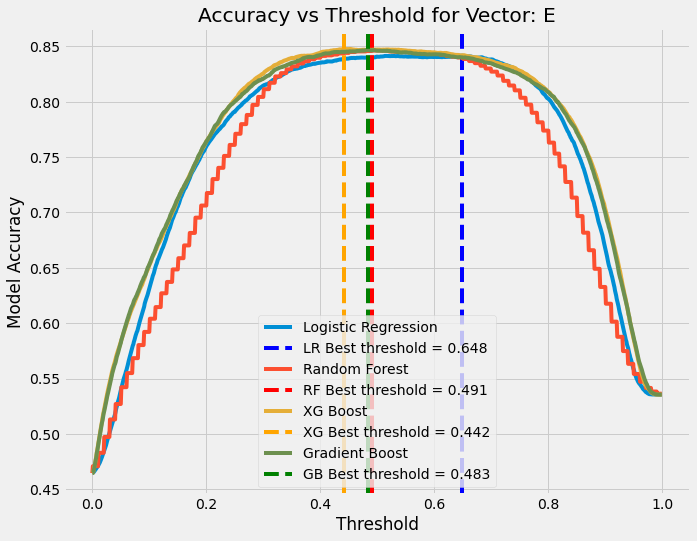

In [193]:
# We are concerned with accuracy of the model i.e. its ability to predict both the 0 and 1 labels correctly
# So we will calculate the accuracy score at different thresholds directly

vector = 'E'
plt.figure(figsize=(10,8))

def to_labels(pos_probs, threshold):
    return (pos_probs >= threshold).astype('int')

thresholds = np.arange(0, 1, 0.001)

# for LR model
ac_score_lr = [accuracy_score(y_test[vector].astype('int'), to_labels(lr_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_lr)
print(f"Vector {vector} Logistic Regression Model\nBest Accuracy score of {ac_score_lr[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_lr, label='Logistic Regression')
plt.axvline(thresholds[idx], color='blue', linestyle="--", label = "LR Best threshold = "+str(np.round(thresholds[idx],4)))

# for random forest
thresholds = np.arange(0, 1, 0.001)
ac_score_rf = [accuracy_score(y_test[vector].astype('int'), to_labels(rf_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_rf)
print(f"Vector {vector} Random Forest Model\nBest Accuracy score of {ac_score_rf[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_rf, label='Random Forest')
plt.axvline(thresholds[idx], color='red', linestyle="--", label = "RF Best threshold = "+str(np.round(thresholds[idx],4)))

# for XG Boost
thresholds = np.arange(0, 1, 0.001)
ac_score_xg = [accuracy_score(y_test[vector].astype('int'), to_labels(xg_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_xg)
print(f"Vector {vector} XG Boost Model\nBest Accuracy score of {ac_score_xg[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_xg, label='XG Boost')
plt.axvline(thresholds[idx], color='orange', linestyle="--", label = "XG Best threshold = "+str(np.round(thresholds[idx],4)))

# for Gradient Boost
thresholds = np.arange(0, 1, 0.001)
ac_score_gb = [accuracy_score(y_test[vector].astype('int'), to_labels(gb_probs, t)) for t in thresholds]
idx = np.argmax(ac_score_gb)
print(f"Vector {vector} Gradient Boost Model\nBest Accuracy score of {ac_score_gb[idx]:4.4} occurs for threshold = {thresholds[idx]:4.4}")
plt.plot(thresholds, ac_score_gb, label='Gradient Boost')
plt.axvline(thresholds[idx], color='green', linestyle="--", label = "GB Best threshold = "+str(np.round(thresholds[idx],4)))

plt.legend()
plt.xlabel('Threshold')
plt.ylabel('Model Accuracy')
plt.title('Accuracy vs Threshold for Vector: '+vector)

plt.show()

## Test Set: Predict F

Random Forest Classifier results for Vector F
Parameters: No. of Estimators = 300,  min_samples_leaf = 1,     min_samples_split = 2
Accuracy=0.8263, f1-score=0.8248
Confusion Matrix - normalized
 [[0.8848 0.031  0.0775 0.0067]
 [0.0371 0.7697 0.1831 0.0101]
 [0.0466 0.076  0.8588 0.0187]
 [0.0624 0.0624 0.3412 0.5339]]
Confusion Matrix
 [[5540  194  485   42]
 [ 177 3670  873   48]
 [ 337  550 6214  135]
 [  71   71  388  607]]

Classification Report 
               precision    recall  f1-score   support

           0       0.90      0.88      0.89      6261
           1       0.82      0.77      0.79      4768
           2       0.78      0.86      0.82      7236
           3       0.73      0.53      0.62      1137

    accuracy                           0.83     19402
   macro avg       0.81      0.76      0.78     19402
weighted avg       0.83      0.83      0.82     19402

20


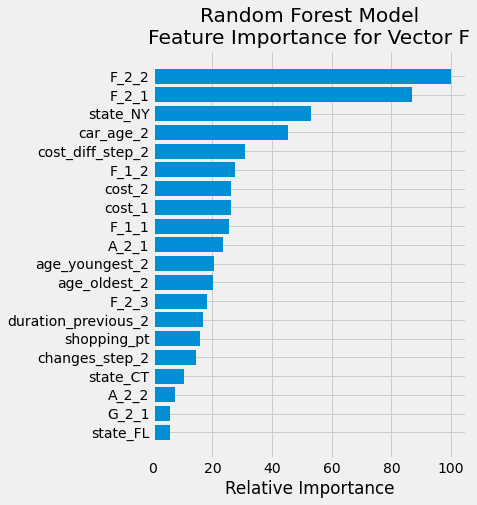

In [106]:
vector = 'F'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, plot=True)

In [122]:
vector = 'F'

x = pd.crosstab(y_test_compare[vector], y_test_compare[vector+"_2"], )
same_as_2 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 
acc = np.around(np.sum(same_as_2)/y_test_compare.shape[0], 4)
print(f"Accuracy based on simply predicting vector {vector} = {vector}_2 : {(np.sum(same_as_2)/y_test_compare.shape[0]): 4.4}")
x['total'] = x.sum(axis=1)
x['F0_%'] = np.around(x[0]*100 / x['total'], 2)
x['F1_%'] = np.around(x[1]*100 / x['total'], 2)
x['F2_%'] = np.around(x[2]*100 / x['total'], 2)
x['F3_%'] = np.around(x[3]*100 / x['total'], 2)
x


Accuracy based on simply predicting vector F = F_2 :  0.8104


F_2,0,1,2,3,total,F0_%,F1_%,F2_%,F3_%
F,,,,,,,,,
0,5521,217,471,52,6261,88.18,3.47,7.52,0.83
1,330,3637,743,58,4768,6.92,76.28,15.58,1.22
2,625,525,5946,140,7236,8.64,7.26,82.17,1.93
3,111,70,337,619,1137,9.76,6.16,29.64,54.44


Gradient Boosting Classifier results for Vector F
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.3, max_features = 10
Accuracy=0.8258, f1-score=0.8243
Confusion Matrix - normalized
 [[0.8892 0.0295 0.0749 0.0064]
 [0.0384 0.768  0.1837 0.0099]
 [0.0481 0.0768 0.8553 0.0198]
 [0.058  0.0651 0.3448 0.5321]]
Confusion Matrix
 [[5567  185  469   40]
 [ 183 3662  876   47]
 [ 348  556 6189  143]
 [  66   74  392  605]]

Classification Report 
               precision    recall  f1-score   support

           0       0.90      0.89      0.90      6261
           1       0.82      0.77      0.79      4768
           2       0.78      0.86      0.82      7236
           3       0.72      0.53      0.61      1137

    accuracy                           0.83     19402
   macro avg       0.81      0.76      0.78     19402
weighted avg       0.83      0.83      0.82     19402

20


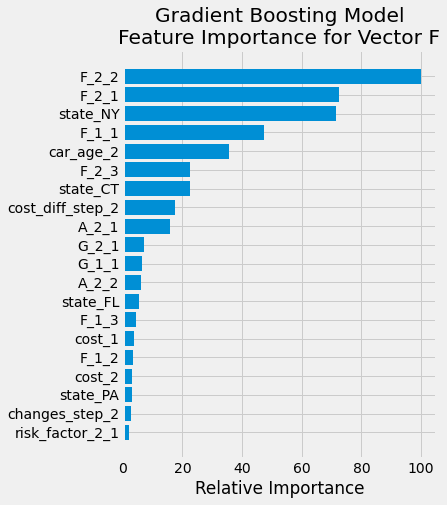

In [120]:
# Model F with best GB classifier

vector = 'F'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, max_features = 10, max_depth = 3, \
                                                   learning_rate = 0.3, plot = True)

XGBoost Classifier results for Vector F
Parameters: No. of Estimators = 200,  max_depth = 4,     learning_rate = 0.25, colsample_bytree = 0.25
Accuracy=0.8262, f1-score=0.8246
Confusion Matrix - normalized
 [[0.8908 0.0281 0.0749 0.0062]
 [0.0373 0.7678 0.1852 0.0096]
 [0.0486 0.0771 0.8552 0.0191]
 [0.0536 0.0633 0.3527 0.5303]]
Confusion Matrix
 [[5577  176  469   39]
 [ 178 3661  883   46]
 [ 352  558 6188  138]
 [  61   72  401  603]]

Classification Report 
               precision    recall  f1-score   support

           0       0.90      0.89      0.90      6261
           1       0.82      0.77      0.79      4768
           2       0.78      0.86      0.82      7236
           3       0.73      0.53      0.61      1137

    accuracy                           0.83     19402
   macro avg       0.81      0.76      0.78     19402
weighted avg       0.83      0.83      0.82     19402

20


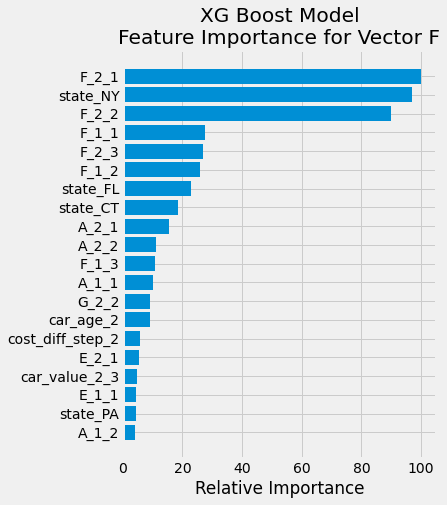

In [91]:
# Final slection is iteration 60: n_estimators = 200, max_depth = 4, learning_rate = 0.25, colsample_bytree = 0.25

vector = 'F'

xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector,n_estimators = 200, max_depth = 4, learning_rate = 0.25, \
                                         colsample_bytree = 0.25, plot=True) 

In [123]:
vector = 'F'
models = ['no_model', 'rf', 'xg', 'gb']

model_preds = {'rf' : rf_preds, 'xg' : xg_preds, 'gb' : gb_preds}
model_acc = {'rf' : rf_ac, 'xg' : xg_ac, 'gb' : gb_ac}

for model in models:
    score_cust_type = model_score_matrix(vector, 2, model_preds[model])
    score_shp_pt = model_score_by_shopping_pt(vector, 2, model_preds[model])

    perf_record_testdata.update(vector, 'no_model', 'overall', acc*100)
    perf_record_testdata.update(vector, model, 'overall', round(model_acc[model]*100,2))
    perf_record_testdata.update(vector, model, 'customer_type', score_cust_type)
    perf_record_testdata.update(vector, model, 'shopping_pt', score_shp_pt)
    perf_record_testdata.compare(vector, model)

perf_record_testdata.record[vector]

C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from

,no_model,rf,rf_vs_no_model,xg,xg_vs_no_model,gb,gb_vs_no_model
accuracy_overall,81.04,82.63,1.59,82.62,1.58,82.58,1.54
accuracy_cust_changed_vector,0,11.36,11.36,13.62,13.62,13.78,13.78
accuracy_cust_maintained_vector,100,99.30,-0.7,98.76,-1.24,98.68,-1.32
accuracy_shopping_pt_3,86.43,86.43,0.0,86.16,-0.27,86.52,0.09
accuracy_shopping_pt_4,85.44,86.12,0.68,86.38,0.94,86.06,0.62
accuracy_shopping_pt_5,83.54,84.43,0.89,84.47,0.93,84.34,0.8
accuracy_shopping_pt_6,81.98,83.17,1.19,83.20,1.22,83.36,1.38
accuracy_shopping_pt_7,80.61,82.30,1.69,82.03,1.42,81.98,1.37
accuracy_shopping_pt_8,80.75,82.55,1.8,82.46,1.71,82.70,1.95
accuracy_shopping_pt_9,77.3,80.14,2.84,80.35,3.05,80.02,2.72


C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(labels)
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(labels)


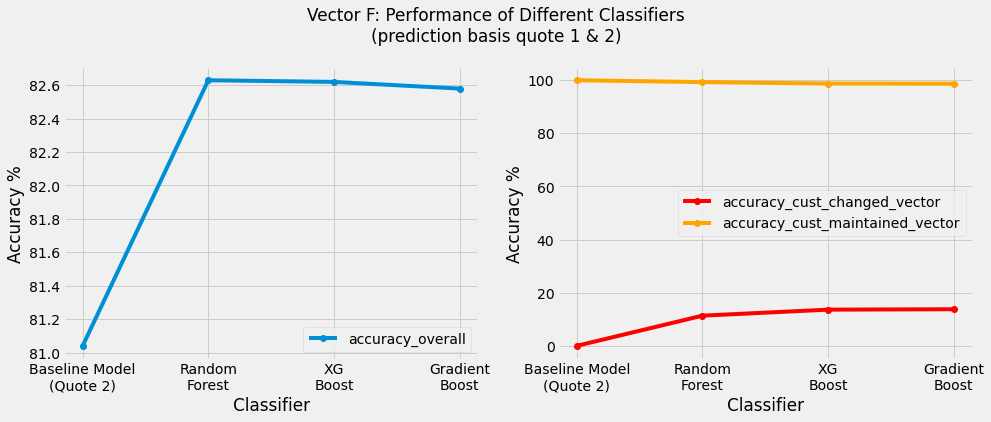

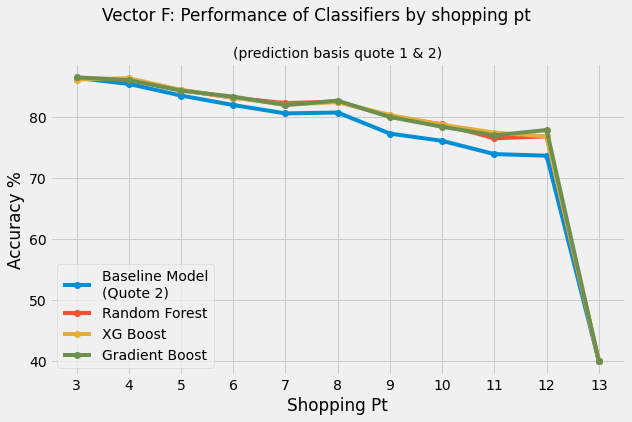

In [124]:
vector = 'F'
#models = ['no_model', 'rf', 'gb', 'xg', 'lr']
models = ['no_model', 'rf', 'xg', 'gb']
quotes = [1,2]
model_performance_plot(vector, models, quotes, perf_record_testdata.record, "overall")
model_performance_plot(vector, models, quotes, perf_record_testdata.record, "shopping_pt")


## Test Set: Predict G

Random Forest Classifier results for Vector G
Parameters: No. of Estimators = 550,  min_samples_leaf = 1,     min_samples_split = 5
Accuracy=0.7598, f1-score=0.7581
Confusion Matrix - normalized
 [[0.7198 0.238  0.0304 0.0118]
 [0.1076 0.8281 0.0422 0.0222]
 [0.0515 0.1316 0.7734 0.0435]
 [0.0544 0.1911 0.2491 0.5053]]
Confusion Matrix
 [[2988  988  126   49]
 [ 809 6227  317  167]
 [ 311  795 4672  263]
 [  92  323  421  854]]

Classification Report 
               precision    recall  f1-score   support

           0       0.71      0.72      0.72      4151
           1       0.75      0.83      0.79      7520
           2       0.84      0.77      0.81      6041
           3       0.64      0.51      0.57      1690

    accuracy                           0.76     19402
   macro avg       0.74      0.71      0.72     19402
weighted avg       0.76      0.76      0.76     19402

20


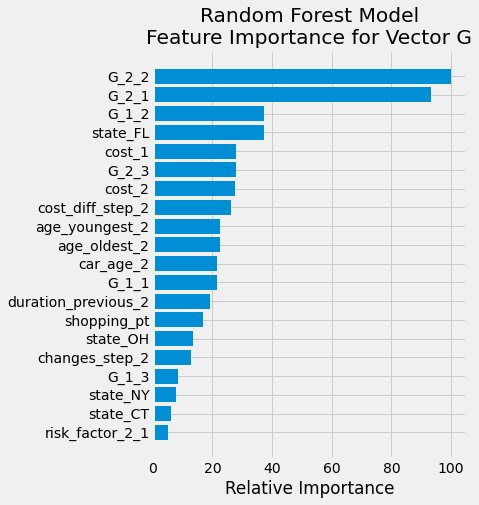

In [99]:
# Run the model with 3rd Best Parameters (iteration 8): n_estimators=550, min_samples_leaf = 1, min_samples_split = 5

vector = 'G'

rf_ac, rf_f1, rf_probs, rf_preds = rf_predict_plot(vector, n_estimators=550, min_samples_leaf = 1, min_samples_split = 5, plot=True)

In [96]:
vector = 'G'

x = pd.crosstab(y_test_compare[vector], y_test_compare[vector+"_2"], )
same_as_2 = [x.iloc[idx,idx] for idx in range(x.shape[0])] 
acc = np.around(np.sum(same_as_2)/y_test_compare.shape[0], 4)
print(f"Accuracy based on simply predicting vector {vector} = {vector}_2 : {(np.sum(same_as_2)/y_test_compare.shape[0]): 4.4}")
x['total'] = x.sum(axis=1)
x['G0_%'] = np.around(x[0]*100 / x['total'], 2)
x['G1_%'] = np.around(x[1]*100 / x['total'], 2)
x['G2_%'] = np.around(x[2]*100 / x['total'], 2)
x['G3_%'] = np.around(x[3]*100 / x['total'], 2)
x

Accuracy based on simply predicting vector G = G_2 :  0.7431


G_2,0,1,2,3,total,G0_%,G1_%,G2_%,G3_%
G,,,,,,,,,
0,2928,979,119,125,4151,70.54,23.58,2.87,3.01
1,814,6080,281,345,7520,10.82,80.85,3.74,4.59
2,305,935,4417,384,6041,5.05,15.48,73.12,6.36
3,86,278,333,993,1690,5.09,16.45,19.70,58.76


Gradient Boosting Classifier results for Vector G
Parameters: No. of Estimators = 200,  max_depth = 3,     learning_rate = 0.25, max_features = 8
Accuracy=0.7576, f1-score=0.7555
Confusion Matrix - normalized
 [[0.7174 0.239  0.0318 0.0118]
 [0.1092 0.8255 0.0455 0.0198]
 [0.0515 0.1299 0.7755 0.043 ]
 [0.0562 0.1929 0.2615 0.4893]]
Confusion Matrix
 [[2978  992  132   49]
 [ 821 6208  342  149]
 [ 311  785 4685  260]
 [  95  326  442  827]]

Classification Report 
               precision    recall  f1-score   support

           0       0.71      0.72      0.71      4151
           1       0.75      0.83      0.78      7520
           2       0.84      0.78      0.80      6041
           3       0.64      0.49      0.56      1690

    accuracy                           0.76     19402
   macro avg       0.73      0.70      0.71     19402
weighted avg       0.76      0.76      0.76     19402

20


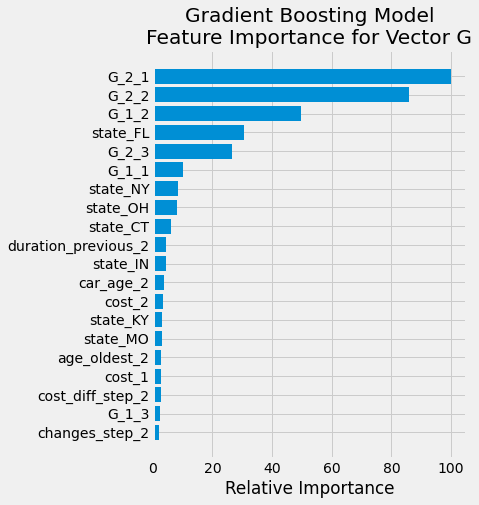

In [98]:
# model G with GradientBoosting classifier and best hyperparameters


vector = 'G'

gb_ac, gb_f1, gb_probs, gb_preds = gb_predict_plot(vector, n_estimators = 200, learning_rate = 0.25, max_depth = 3, \
                                                   max_features = 8, plot=True)

XGBoost Classifier results for Vector G
Parameters: No. of Estimators = 200,  max_depth = 5,     learning_rate = 0.25, colsample_bytree = 0.25
Accuracy=0.7581, f1-score=0.7559
Confusion Matrix - normalized
 [[0.7208 0.2349 0.0342 0.0101]
 [0.1114 0.8243 0.0459 0.0184]
 [0.0503 0.1316 0.7782 0.0399]
 [0.0586 0.1994 0.2586 0.4834]]
Confusion Matrix
 [[2992  975  142   42]
 [ 838 6199  345  138]
 [ 304  795 4701  241]
 [  99  337  437  817]]

Classification Report 
               precision    recall  f1-score   support

           0       0.71      0.72      0.71      4151
           1       0.75      0.82      0.78      7520
           2       0.84      0.78      0.81      6041
           3       0.66      0.48      0.56      1690

    accuracy                           0.76     19402
   macro avg       0.74      0.70      0.72     19402
weighted avg       0.76      0.76      0.76     19402

20


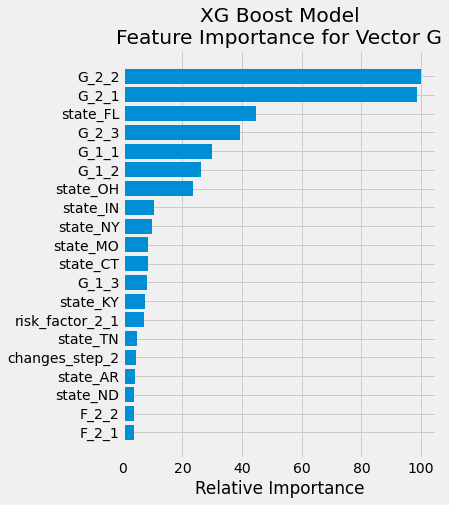

In [97]:
# model G with XGBoost classifier Best Parameters: (Overall 1st rank model)
#  No. of Estimators = 200,  max_depth = 5, learning_rate = 0.25, colsample_bytree = 0.25 : 0.7601, 0.7592

vector = 'G'

xg_ac, xg_f1, xg_probs, xg_preds = xg_predict_plot(vector, n_estimators = 200, learning_rate = 0.25, max_depth = 5, colsample_bytree = 0.25, plot=True)


In [100]:
vector = 'G'
models = ['rf', 'gb','xg']
model_preds = {'rf' : rf_preds, 'xg' : xg_preds, 'gb' : gb_preds}
model_acc = {'rf' : rf_ac, 'xg' : xg_ac, 'gb' : gb_ac}

for model in models:
    score_cust_type = model_score_matrix(vector, 2, model_preds[model])
    score_shp_pt = model_score_by_shopping_pt(vector, 2, model_preds[model])

    perf_record_testdata.update(vector, 'no_model', 'overall', acc*100)
    perf_record_testdata.update(vector, model, 'overall', round(model_acc[model]*100,2))
    perf_record_testdata.update(vector, model, 'customer_type', score_cust_type)
    perf_record_testdata.update(vector, model, 'shopping_pt', score_shp_pt)
    perf_record_testdata.compare(vector, model)

perf_record_testdata.record[vector]

C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare[vector+'_Pred'] = predictions
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vect_compare['Pred_Correct'] = np.where(vect_compare[vector+'_Pred'] == vect_compare[vector],1,0)
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from

,no_model,rf,rf_vs_no_model,gb,gb_vs_no_model,xg,xg_vs_no_model
accuracy_overall,74.31,75.98,1.67,75.76,1.45,75.81,1.5
accuracy_cust_changed_vector,0,11.46,11.46,12.26,12.26,13.74,13.74
accuracy_cust_maintained_vector,100,98.28,-1.72,97.70,-2.3,97.27,-2.73
accuracy_shopping_pt_3,77.72,78.71,0.99,78.17,0.45,78.71,0.99
accuracy_shopping_pt_4,79.25,80.62,1.37,80.31,1.06,80.25,1.0
accuracy_shopping_pt_5,76.97,78.08,1.11,77.77,0.8,78.08,1.11
accuracy_shopping_pt_6,74.75,76.29,1.54,76.22,1.47,76.00,1.25
accuracy_shopping_pt_7,72.78,74.48,1.7,74.15,1.37,74.56,1.78
accuracy_shopping_pt_8,73.1,74.96,1.86,75.01,1.91,75.36,2.26
accuracy_shopping_pt_9,72.38,74.43,2.05,74.59,2.21,74.09,1.71


C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(labels)
C:\Users\amite\AppData\Local\Temp/ipykernel_13712/441207066.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(labels)


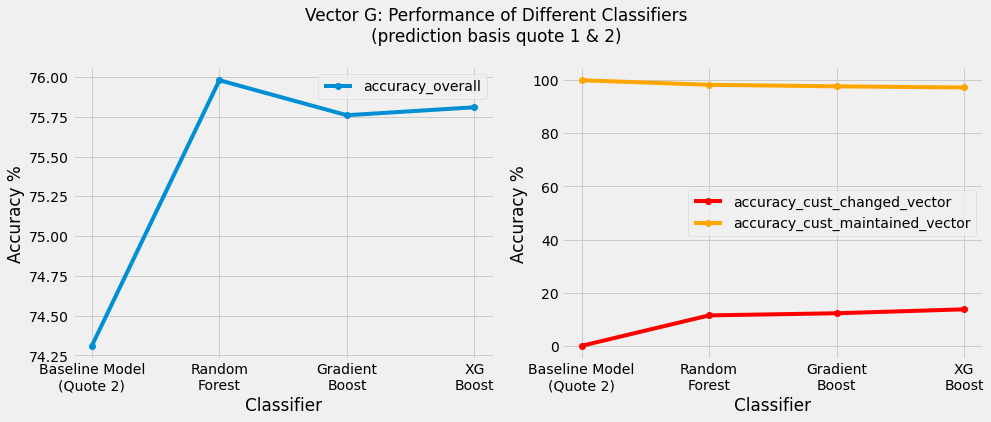

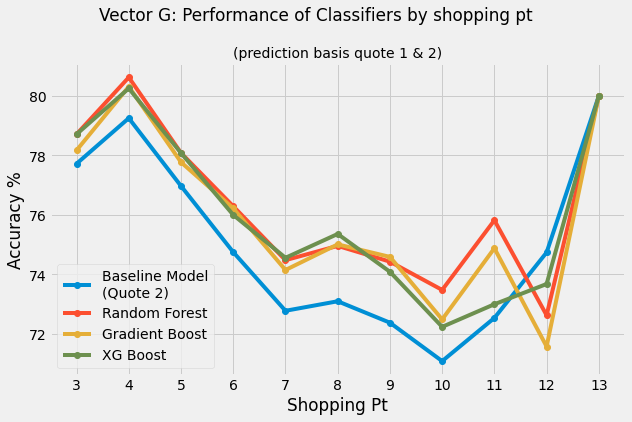

In [101]:
vector = 'G'
#models = ['no_model', 'rf', 'gb', 'xg', 'lr']
models = ['no_model', 'rf', 'gb','xg']
quotes = [1,2]
model_performance_plot(vector, models, quotes, perf_record_testdata.record, "overall")
model_performance_plot(vector, models, quotes, perf_record_testdata.record, "shopping_pt")


In [127]:
import pickle

with open('Modelling_data/perf_record_test_set.pkl', 'wb') as f:
    pickle.dump(perf_record_testdata.record, f)


In [147]:
vector_best_model_map = {'A': 'xg', 'B': 'rf', 'C': 'xg', 'D': 'rf', 'E': 'xg', 'F': 'rf', 'G': 'rf'}

modeling_summary = pd.DataFrame(columns = ['vector', 'recall_baseline_model', 'best_model', 'recall_best_model', \
                            'improvement_over_baseline', 'recall_cust_changed_vector', 'recall_cust_maintained_vector'])

modeling_summary['vector'] = product_vectors
modeling_summary = modeling_summary.set_index('vector')

for vector in vector_best_model_map.keys():
    modeling_summary.loc[vector, 'recall_baseline_model'] = perf_record_testdata.record[vector].loc['accuracy_overall', 'no_model']
    modeling_summary.loc[vector, 'best_model'] = vector_best_model_map[vector]
    modeling_summary.loc[vector, 'recall_best_model'] = perf_record_testdata.record[vector].loc['accuracy_overall', vector_best_model_map[vector]]
    modeling_summary.loc[vector, 'recall_cust_changed_vector'] = perf_record_testdata.record[vector].loc['accuracy_cust_changed_vector', vector_best_model_map[vector]]
    modeling_summary.loc[vector, 'recall_cust_maintained_vector'] = perf_record_testdata.record[vector].loc['accuracy_cust_maintained_vector', vector_best_model_map[vector]]

modeling_summary['improvement_over_baseline'] = modeling_summary['recall_best_model'] - modeling_summary['recall_baseline_model'] 
for column in modeling_summary.columns:
    if column != 'best_model':
        modeling_summary[column] = modeling_summary[column].astype('float')



,recall_baseline_model,best_model,recall_best_model,improvement_over_baseline,recall_cust_changed_vector,recall_cust_maintained_vector
vector,,,,,,
A,81.91,xg,84.23,2.32,21.11,98.17
B,83.96,rf,84.07,0.11,2.73,99.61
C,80.18,xg,82.98,2.80,27.02,96.81
D,85.09,rf,86.71,1.62,16.29,99.04
E,83.80,xg,84.72,0.92,13.07,98.58
F,81.04,rf,82.63,1.59,11.36,99.30
G,74.31,rf,75.98,1.67,11.46,98.28


# Conclusion

## Model building approach
The key steps followed to build a model for each vector were:
* Training a basic model based on 3 different classifiers - Random Forest, Gradient Boost and XG Boost. For binary vectors (B and E), a Logistic Regression classifier was also evaluated.

* Applying 60 iterations of Randomized Search CV to determine performance of different hyperparameter combinations on the training dataset

* Applying each of the 60 sets of hyperparameters on the validation set and measuring micro accuracy/recall

* Choose the best set of hyperparameters as the one that performs most consistently across the training and validation set 

* Compare the performance of different classifiers on the test set to then choose the best classifier.




## Results

The results of the modeling for each vector are summarised in the tables below:

In [150]:
modeling_summary

,recall_baseline_model,best_model,recall_best_model,improvement_over_baseline,recall_cust_changed_vector,recall_cust_maintained_vector
vector,,,,,,
A,81.91,xg,84.23,2.32,21.11,98.17
B,83.96,rf,84.07,0.11,2.73,99.61
C,80.18,xg,82.98,2.80,27.02,96.81
D,85.09,rf,86.71,1.62,16.29,99.04
E,83.80,xg,84.72,0.92,13.07,98.58
F,81.04,rf,82.63,1.59,11.36,99.30
G,74.31,rf,75.98,1.67,11.46,98.28


In [152]:
modeling_summary.describe()

,recall_baseline_model,recall_best_model,improvement_over_baseline,recall_cust_changed_vector,recall_cust_maintained_vector
count,7.000000,7.000000,7.000000,7.000000,7.000000
mean,81.470000,83.045714,1.575714,14.720000,98.541429
std,3.606513,3.385837,0.879599,7.778033,0.928393
min,74.310000,75.980000,0.110000,2.730000,96.810000
25%,80.610000,82.805000,1.255000,11.410000,98.225000
50%,81.910000,84.070000,1.620000,13.070000,98.580000
75%,83.880000,84.475000,1.995000,18.700000,99.170000
max,85.090000,86.710000,2.800000,27.020000,99.610000


### Key Highlights

1) Random Forest and XG Boost came up as the best classifers. Random Forest gave the best performance for 4 of the 7 vectors, with XG Boost being the best for the other 3. 

2) The models gave a performance improvement ranging from **0.11% to 2.8%** over the baseline model (final vector = quote2).

   * The average improvement was **1.58%**.
   * The best performance was for vector C at **2.8%**.
   * **Vector B** was the hardest to predict with only 0.11% improvement. 
       
3) Another way to analyze the model performance is by looking at predictive prowess of various models for customers who changed their vectors (from quote 2 to the final purchase) and those who maintained their vector choices (classes).

   * All models did a very good job in predicting customers who didn't change their vector choice. The recall of the models ranged from **96.81%** for vector C to **99.61%** for vector B. On average, the models predicted **98.54%** of such customers correctly.
        
   * For customers that changed vector choice, the task of prediction was harder. The models had to predict which customers would change vector choice and what the new choice would be. Here the model performance ranged from 2.73% improvement for vector B over baseline model to 27.02% for vector C. On average, the models predicted **14.72%%** of such customers correctly.
        
        
        